In [28]:
import os
import torch
import torchvision
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from PIL import Image
import json
from torchvision.transforms import transforms
import random
import cv2
import shutil
from sklearn.model_selection import train_test_split
from itertools import combinations
from sklearn.cluster import KMeans
from math import sin, cos, atan
import torch.nn.init as init
from torchvision.datasets import ImageFolder
from torchvision.models import vgg19_bn
import torch.nn as nn
import torch.nn.functional as F
import zipfile
from tqdm.notebook import tqdm, tqdm_notebook
!pip install pytorch-metric-learning
from pytorch_metric_learning.losses import SupConLoss
from pytorch_metric_learning.samplers import MPerClassSampler
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import logging
from sklearn.utils.class_weight import compute_class_weight
import json

In [29]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [30]:
class SimpleDysgraphiaDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        """
        Simplified dataset class that returns images and their labels directly

        Args:
            root_dir (str): Path to dataset directory with class folders
            transform (callable, optional): Optional transform to be applied
        """
        self.root_dir = root_dir
        self.transform = transform

        # Get all class names from directory structure
        self.classes = sorted([d.name for d in os.scandir(root_dir) if d.is_dir()])
        self.class_to_idx = {cls_name: i for i, cls_name in enumerate(self.classes)}
        self.idx_to_class = {i: cls_name for i, cls_name in enumerate(self.classes)}

        # Store all image paths and corresponding labels
        self.image_paths = []
        self.labels = []

        for cls_name in self.classes:
            cls_path = os.path.join(root_dir, cls_name)
            for img_name in os.listdir(cls_path):
                if img_name.lower().endswith('.jpg'):
                    img_path = os.path.join(cls_path, img_name)
                    if os.path.isfile(img_path):
                        self.image_paths.append(img_path)
                        self.labels.append(self.class_to_idx[cls_name])

        if not self.image_paths:
            raise ValueError(f"No JPG images found in {root_dir}")

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        label = self.labels[idx]

        # Load image (convert to grayscale)
        img = Image.open(img_path).convert('L')

        if self.transform:
            img = self.transform(img)

        return img, label

    def get_class_distribution(self):
        """Returns a dictionary with counts per class"""
        from collections import Counter
        return Counter(self.labels)

In [31]:
train_transforms = transforms.Compose([
    transforms.RandomResizedCrop(640, scale=(0.71, 1.0)),

    transforms.RandomHorizontalFlip(p=0.1),
    transforms.RandomVerticalFlip(p=0.1),


    transforms.RandomApply([
        transforms.RandomChoice([
            transforms.RandomRotation((90, 90)),
            transforms.RandomRotation((180, 180)),
            transforms.RandomRotation((270, 270))
        ])
    ], p=0.1),

    transforms.RandomRotation(degrees=(-15, 15)),






    transforms.ToTensor(),

    transforms.Normalize(mean=[0.5], std=[0.5]),
])

val_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5], std=[0.5]),
])

In [32]:

train_data_root = "/content/drive/MyDrive/teknofest/Teknofest_v2/processed_data/train/"
val_data_root = "/content/drive/MyDrive/teknofest/Teknofest_v2/processed_data/val/"


train_dataset = SimpleDysgraphiaDataset(root_dir=train_data_root, transform=train_transforms)
val_dataset = SimpleDysgraphiaDataset(root_dir=val_data_root, transform=val_transforms)
train_labels = [label for _, label in train_dataset]
val_labels = [label for _, label in val_dataset]

train_sampler = MPerClassSampler(train_labels, m=8, length_before_new_iter=12 * 24)
val_sampler = MPerClassSampler(val_labels, m=8, length_before_new_iter=2 * 24)

train_loader = DataLoader(train_dataset, batch_size=24, sampler = train_sampler, num_workers=0)
val_loader = DataLoader(val_dataset, batch_size=24, sampler = val_sampler, num_workers=0)


--- Rastgele 5 Triplet Görselleştiriliyor ---
Batch 1/12
<built-in method item of Tensor object at 0x7d49d621ce30>


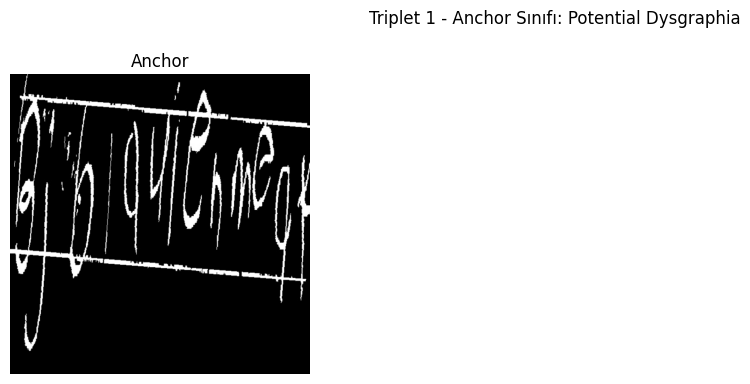

Batch 2/12
<built-in method item of Tensor object at 0x7d49d53d2030>


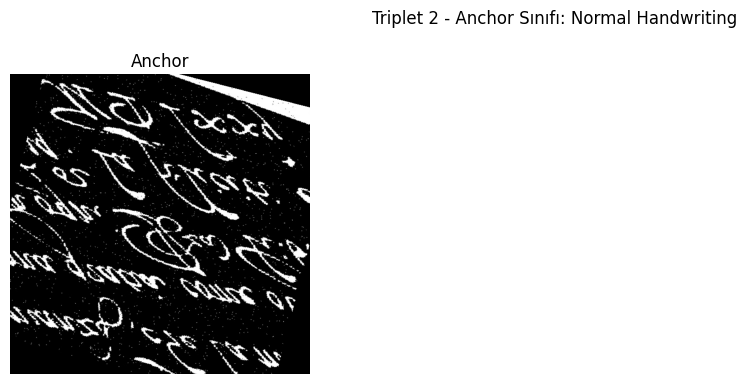

Batch 3/12
<built-in method item of Tensor object at 0x7d489c46fb90>


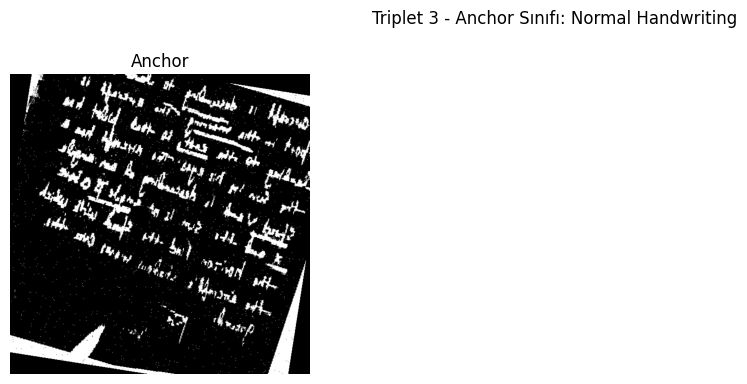

Batch 4/12
<built-in method item of Tensor object at 0x7d489c3f79b0>


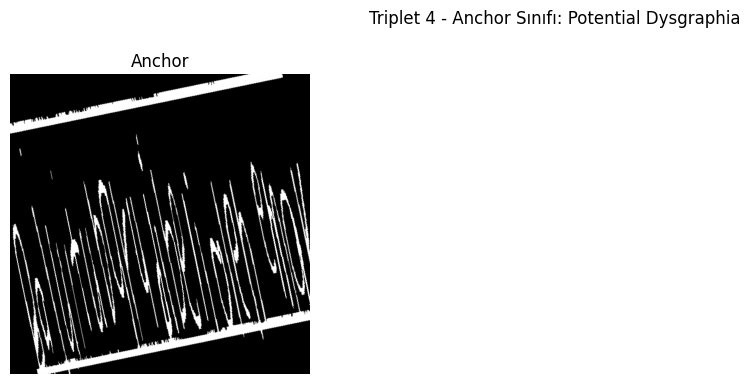

Batch 5/12
<built-in method item of Tensor object at 0x7d489c4e1010>


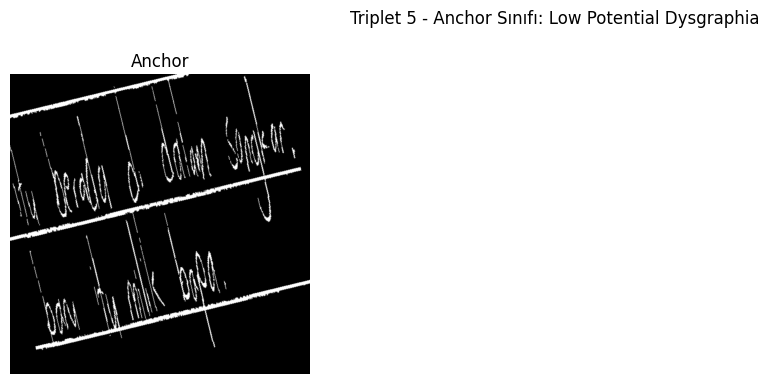


Görselleştirme tamamlandı.


In [33]:
print("\n--- Rastgele 5 Triplet Görselleştiriliyor ---")

num_triplets_to_display = 5
displayed_count = 0

# train_loader'dan batch'ler al
# shuffle=True olduğu için her seferinde farklı bir triplet gelme olasılığı yüksek
for i, (anchor,label) in enumerate(train_loader):
    if displayed_count >= num_triplets_to_display:
        break
    print(f"Batch {i + 1}/{len(train_loader)}")
    # Tensor'ları CPU'ya taşı ve NumPy dizilerine dönüştür
    # Eğer Image.open().convert("L") kullanıyorsanız, görseller tek kanallı (gri tonlamalı) olacaktır.
    # Matplotlib için (H, W) veya (H, W, 1) formatı uygundur.
    anchor_img = anchor[0].squeeze().cpu().numpy()
    label = label[0]
    cmap_param = 'gray'
    print(label.item)
    # Etiketi (sınıf indeksini) gerçek sınıf adına çevir
    anchor_class_name = train_dataset.idx_to_class[label.item()]

    # Görselleştirme için bir figür ve 3 alt grafik oluştur
    plt.figure(figsize=(12, 4)) # Genişlik: 12, Yükseklik: 4
    plt.suptitle(f"Triplet {displayed_count + 1} - Anchor Sınıfı: {anchor_class_name}", fontsize=12)

    # Anchor Görseli
    plt.subplot(1, 3, 1) # 1 satır, 3 sütun, 1. grafik
    plt.imshow(anchor_img, cmap='gray') # Gri tonlama için cmap='gray'
    plt.title("Anchor")
    plt.axis('off') # Eksenleri gizle



    plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Süper başlık için boşluk bırak
    plt.show()

    displayed_count += 1

print("\nGörselleştirme tamamlandı.")


--- Rastgele 5 Triplet Görselleştiriliyor ---
Batch 1/2
<built-in method item of Tensor object at 0x7d489c5b3950>


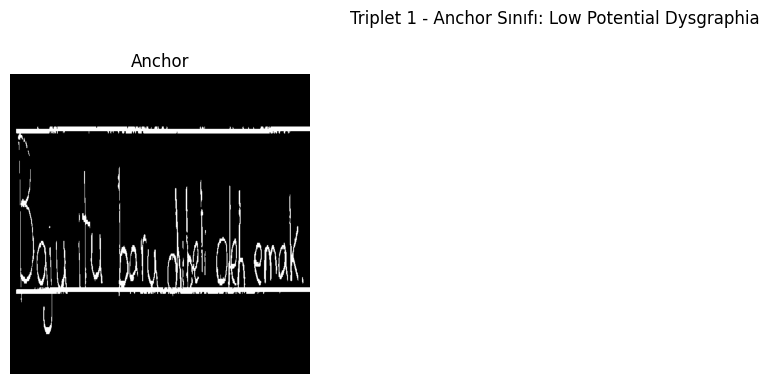

Batch 2/2
<built-in method item of Tensor object at 0x7d49d4551a30>


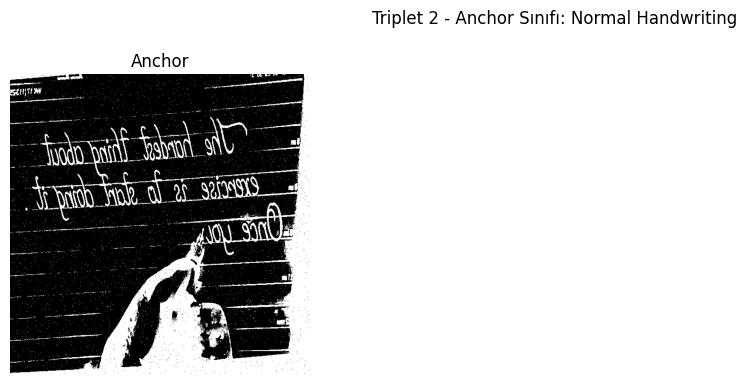


Görselleştirme tamamlandı.


In [34]:
print("\n--- Rastgele 5 Triplet Görselleştiriliyor ---")

num_triplets_to_display = 5
displayed_count = 0

# train_loader'dan batch'ler al
# shuffle=True olduğu için her seferinde farklı bir triplet gelme olasılığı yüksek
for i, (anchor,label) in enumerate(val_loader):
    if displayed_count >= num_triplets_to_display:
        break
    print(f"Batch {i + 1}/{len(val_loader)}")
    # Tensor'ları CPU'ya taşı ve NumPy dizilerine dönüştür
    # Eğer Image.open().convert("L") kullanıyorsanız, görseller tek kanallı (gri tonlamalı) olacaktır.
    # Matplotlib için (H, W) veya (H, W, 1) formatı uygundur.
    anchor_img = anchor[0].squeeze().cpu().numpy()
    label = label[0]
    cmap_param = 'gray'
    print(label.item)
    # Etiketi (sınıf indeksini) gerçek sınıf adına çevir
    anchor_class_name = train_dataset.idx_to_class[label.item()]

    # Görselleştirme için bir figür ve 3 alt grafik oluştur
    plt.figure(figsize=(12, 4)) # Genişlik: 12, Yükseklik: 4
    plt.suptitle(f"Triplet {displayed_count + 1} - Anchor Sınıfı: {anchor_class_name}", fontsize=12)

    # Anchor Görseli
    plt.subplot(1, 3, 1) # 1 satır, 3 sütun, 1. grafik
    plt.imshow(anchor_img, cmap='gray') # Gri tonlama için cmap='gray'
    plt.title("Anchor")
    plt.axis('off') # Eksenleri gizle



    plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Süper başlık için boşluk bırak
    plt.show()

    displayed_count += 1

print("\nGörselleştirme tamamlandı.")

In [35]:

train_labels = [label for _, label in train_dataset]

classes = np.unique(train_labels)
weights = compute_class_weight('balanced', classes=classes, y=train_labels)

class_weights = {0: weights[0], 1: weights[1], 2: weights[2]}
class_weights

{0: np.float64(1.018939393939394),
 1: np.float64(0.9340277777777778),
 2: np.float64(1.0549019607843138)}

In [36]:


def save_checkpoint(model, optimizer,scheduler, epoch, loss, checkpoint_dir,logger,accuracy=None, filename='checkpoint_loss_range.pth'):
    checkpoint_path = os.path.join(checkpoint_dir, filename)
    torch.save({
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'scheduler_state_dict': scheduler.state_dict(),
        'loss': loss,
        'accuracy':accuracy
    }, checkpoint_path)
    logger.info(f'Checkpoint saved at epoch {epoch} to {checkpoint_path}')



In [37]:
checkpoint_dir = "/content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints"
os.makedirs(checkpoint_dir, exist_ok=True)

In [38]:
def get_default_device():
#””Pick GPU if available, else CPU”””
    if torch.cuda.is_available():
        return torch.device("cuda")
    else:
        return torch.device("cpu")

DEVICE = get_default_device()

In [39]:
model = vgg19_bn(pretrained=False)
model

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (7): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): ReLU(inplace=True)
    (10): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (12): ReLU(inplace=True)
    (13): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (14): Conv2d(128, 256

In [40]:
model.features[0] = nn.Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
model.avgpool = nn.AdaptiveAvgPool2d(1)


In [41]:
model

VGG(
  (features): Sequential(
    (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (7): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): ReLU(inplace=True)
    (10): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (12): ReLU(inplace=True)
    (13): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (14): Con

In [42]:

embedding_dimension = 128 # The desired output dimension for your embeddings
feature_dim = int(model.classifier[0].in_features/49)
projection_head = nn.Sequential(
    nn.Linear(feature_dim, feature_dim),
    nn.BatchNorm1d(feature_dim),
    nn.ReLU(),
    nn.Dropout(0.3),
    nn.Linear(feature_dim, embedding_dimension),
)


model.projection_head = projection_head
model.classifier[0] = nn.Linear(in_features=feature_dim, out_features=4096, bias = True)
model.classifier[6] = nn.Linear(in_features=4096, out_features=3, bias = True)

In [43]:
model

VGG(
  (features): Sequential(
    (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (7): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): ReLU(inplace=True)
    (10): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (12): ReLU(inplace=True)
    (13): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (14): Con

In [44]:
def init_weights_normal(m):
    """
    Initializes weights of Conv2d and Linear layers with a normal distribution.
    Biases are set to zero.
    """
    if isinstance(m, nn.Conv2d):
        init.normal_(m.weight, mean=0.0, std=0.01) # Example: mean 0, std 0.01
        if m.bias is not None:
            init.constant_(m.bias, 0)
    elif isinstance(m, nn.Linear):
        init.normal_(m.weight, mean=0.0, std=0.01) # Example: mean 0, std 0.01
        if m.bias is not None:
            init.constant_(m.bias, 0)

In [45]:
# Combine them into a single model if needed, or use them separately
class vgg19_bn_supcon(nn.Module):
    def __init__(self, model):
        super(vgg19_bn_supcon, self).__init__()
        self.feature_extractor = model.features
        self.projection_head = model.projection_head
        self.classifier = model.classifier
        self.gap = model.avgpool


    def forward(self, x):
        x = self.feature_extractor(x)
        x_gap = self.gap(x)
        x_feature = torch.flatten(x_gap,1)
        x_embedding = self.projection_head(x_feature)
        x_embedding = F.normalize(x_embedding, dim=1)
        y = self.classifier(x_feature)
        return x_embedding,y


In [68]:
# Apply the initialization function to all modules in the model
feature_extractor = vgg19_bn_supcon(model)
feature_extractor.apply(init_weights_normal)
feature_extractor = feature_extractor.to(device=DEVICE)
print("Weights initialized with normal distribution.")

Weights initialized with normal distribution.


In [47]:
"""# Classifier katmanını dondur
for param in feature_extractor.classifier.parameters():
    param.requires_grad = False  # Gradients hesaplanmasın (frozen)"""

'# Classifier katmanını dondur\nfor param in feature_extractor.classifier.parameters():\n    param.requires_grad = False  # Gradients hesaplanmasın (frozen)'

In [69]:
LEARNING_RATE = 1e-5
EPOCHS = 450

In [70]:
optimizer = torch.optim.Adam(feature_extractor.parameters(),lr = LEARNING_RATE)
criterion = SupConLoss(temperature=0.07)
cls_criterion = nn.CrossEntropyLoss()
#scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max = 10, eta_min = 1e-6)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=10, factor=0.1,min_lr=1e-7)

In [71]:

# Create and configure logger
output_log_path = "/content/drive/MyDrive/teknofest/Teknofest_v2/logs"

os.makedirs(os.path.dirname(output_log_path), exist_ok=True)


logger = logging.getLogger()
logger.setLevel(logging.DEBUG)
fh = logging.FileHandler(f"{output_log_path}/supcon_vgg.log")
fh.setLevel(logging.DEBUG)
formatter = logging.Formatter('%(asctime)s - %(name)s - %(levelname)s - %(message)s')
fh.setFormatter(formatter)
logger.addHandler(fh)

In [72]:
def train_loop( loader,
                model,
                optimizer,
                scheduler,
                criterion,
                cls_criterion,
                device,
                logger,
                epoch,
                checkpoint_dir,
                n_epoch = 400,
                _lambda = 0.5,
                filename='feature_extraction_train_checkpoint.pth',
                best_train_loss = float('inf'),
                best_accuracy = 0
):
    model.train()
    epoch_loss = 0
    batch_losses = []
    all_preds = []
    all_labels = []
    for step, (img,label) in enumerate(tqdm_notebook(loader, desc="Training", leave=False),1):
        img = img.to(device)
        label = label.to(device)

        optimizer.zero_grad()
        emb , output = model(img)

        loss_cl = criterion(emb, label)
        loss_ce = cls_criterion(output, label)
        loss = (1-_lambda)*loss_ce + _lambda*loss_cl
        loss.backward()
        optimizer.step()
        batch_losses.append(loss.item())
        preds = torch.argmax(output.detach(),dim=1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(label.cpu().numpy())
        logger.info("\tBatch: {}/{} — Loss: {:.4f}".format(step, len(loader), loss.item()))

    epoch_loss = sum(batch_losses)/step
    accuracy = accuracy_score(all_labels, all_preds)
    precision = precision_score(all_labels, all_preds, zero_division=0, average='weighted')
    recall = recall_score(all_labels, all_preds, zero_division=0, average='weighted')
    f1 = f1_score(all_labels, all_preds, zero_division=0, average='weighted')



    logger.info("Epoch: {}/{} — Loss: {:.4f}".format(epoch, n_epoch, epoch_loss))
    logger.info(f"Metrics — Accuracy: {accuracy:.4f}, Precision: {precision:.4f}, Recall: {recall:.4f}, F1: {f1:.4f}")

    if epoch_loss < best_train_loss  :
        best_train_loss = epoch_loss
        save_checkpoint(model=model,
                        optimizer= optimizer,
                        scheduler= scheduler,
                        epoch= epoch,
                        logger= logger,
                        loss= epoch_loss,
                        checkpoint_dir= checkpoint_dir,
                        filename=f"best_loss_{filename}",
                        accuracy=accuracy
        )
    if accuracy > best_accuracy:
        best_accuracy = accuracy
        save_checkpoint(model=model,
                        optimizer= optimizer,
                        scheduler= scheduler,
                        epoch= epoch,
                        logger= logger,
                        loss= epoch_loss,
                        checkpoint_dir= checkpoint_dir,
                        filename=f"best_accuracy_{filename}",
                        accuracy=accuracy)
    return epoch_loss, best_train_loss, accuracy, best_accuracy, precision, recall, f1



In [73]:
def val_loop(loader,
             model,
             criterion,
             cls_criterion,
             optimizer,
             scheduler,
             device,
             logger,
             epoch,
             checkpoint_dir,
             n_epoch = 400,
             _lambda = 0.5,
             filename='feature_extraction_validation_checkpoint.pth',
             best_val_loss = float('inf'),
             best_accuracy = 0
):
    model.eval()
    epoch_loss = 0
    batch_losses = []
    all_preds = []
    all_labels = []
    with torch.no_grad():
        for step, (img,label) in enumerate(tqdm_notebook(loader, desc="Validation", leave=False),1):
            img = img.to(device)
            label = label.to(device)

            emb , output = model(img)


            loss_cl = criterion(emb, label)
            loss_ce = cls_criterion(output, label)
            loss = (1-_lambda)*loss_ce + _lambda*loss_cl

            batch_losses.append(loss.item())
            preds = torch.argmax(output.detach(),dim=1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(label.cpu().numpy())
            logger.info("\tBatch: {}/{} — Validation Loss: {:.4f}".format(step, len(loader), loss.item()))

    epoch_loss = sum(batch_losses)/step
    accuracy = accuracy_score(all_labels, all_preds)
    precision = precision_score(all_labels, all_preds, zero_division=0, average='weighted')
    recall = recall_score(all_labels, all_preds, zero_division=0, average='weighted')
    f1 = f1_score(all_labels, all_preds, zero_division=0, average='weighted')


    logger.info("Epoch: {}/{} — Validation Loss: {:.4f}".format(epoch, n_epoch, epoch_loss))
    logger.info(f"Metrics — Accuracy: {accuracy:.4f}, Precision: {precision:.4f}, Recall: {recall:.4f}, F1: {f1:.4f}")
    if epoch_loss < best_val_loss  :
        best_val_loss = epoch_loss
        save_checkpoint(model=model,
                        optimizer= optimizer,
                        scheduler= scheduler,
                        epoch= epoch,
                        loss= epoch_loss,
                        checkpoint_dir= checkpoint_dir,
                        filename=f"best_loss_{filename}",
                        logger= logger
        )
    if accuracy > best_accuracy:
        best_accuracy = accuracy
        save_checkpoint(model=model,
                        optimizer= optimizer,
                        scheduler= scheduler,
                        epoch= epoch,
                        loss= epoch_loss,
                        checkpoint_dir= checkpoint_dir,
                        filename=f"best_accuracy_{filename}",
                        logger= logger,
                        accuracy=accuracy)

    return epoch_loss, best_val_loss, accuracy, best_accuracy, precision, recall, f1






In [77]:
def save_metrics_to_json(
    train_losses,
    train_accuracy,
    train_precision,
    train_recall,
    train_f1,
    val_losses,
    val_accuracy,
    val_precision,
    val_recall,
    val_f1,
    file_path,
    logger
):
    metrics_data = {
        "train_losses": train_losses,
        "val_losses": val_losses,
        "train_accuracy": train_accuracy,
        "train_precision": train_precision,
        "train_recall": train_recall,
        "train_f1": train_f1,
        "val_accuracy": val_accuracy,
        "val_precision": val_precision,
        "val_recall": val_recall,
        "val_f1": val_f1,
    }

    try:
        with open(file_path, 'w') as f:
            json.dump(metrics_data, f, indent=4)
        logger.info(f"Metrics successfully saved to: {file_path}")
    except IOError as e:
        logger.info(f"Error saving metrics to {file_path}: {e}")

output_path = "/content/drive/MyDrive/teknofest/Teknofest_v2/outputs"

os.makedirs(output_path, exist_ok=True)

In [75]:
best_train_loss = float('inf')
best_val_loss = float('inf')
train_losses = []
val_losses = []
train_accuracies = []
train_precisions = []
train_recalls = []
train_f1s = []
val_accuracies = []
val_precisions = []
val_recalls = []
val_f1s = []
best_train_accuracy = 0
best_val_accuracy = 0
logger.info("Starting Training")
for epoch in tqdm_notebook(range(EPOCHS), desc="Epochs"):
    train_loss, best_train_loss, accuracy,best_train_accuracy,precision, recall, f1 = train_loop(loader= train_loader,
                                                                              model= feature_extractor,
                                                                              optimizer= optimizer,
                                                                              scheduler= scheduler,
                                                                              criterion= criterion,
                                                                              cls_criterion= cls_criterion,
                                                                              device= DEVICE,
                                                                              logger= logger,
                                                                              epoch= epoch,
                                                                              n_epoch= EPOCHS,
                                                                              checkpoint_dir= checkpoint_dir,
                                                                              best_train_loss= best_train_loss,
                                                                              best_accuracy= best_train_accuracy,
                                                                              filename='feature_extraction_train_checkpoint_vgg.pth')
    val_loss, best_val_loss,val_accuracy,best_val_accuracy,val_precision, val_recall, val_f1 = val_loop(loader=val_loader,
                                                                                      model= feature_extractor,
                                                                                      criterion= criterion,
                                                                                      optimizer= optimizer,
                                                                                      scheduler= scheduler,
                                                                                      cls_criterion= cls_criterion,
                                                                                      device= DEVICE,
                                                                                      logger= logger,
                                                                                      epoch= epoch,
                                                                                      n_epoch= EPOCHS,
                                                                                      checkpoint_dir= checkpoint_dir,
                                                                                      best_val_loss= best_val_loss,
                                                                                      best_accuracy= best_val_accuracy,
                                                                                      filename='feature_extraction_validation_checkpoint_vgg.pth')
    logger.info(f"The current learning rate: {optimizer.param_groups[0]['lr']}")
    if (best_train_accuracy == accuracy) & (best_val_accuracy == val_accuracy):
        save_checkpoint(model=feature_extractor,
                        optimizer= optimizer,
                        scheduler= scheduler,
                        epoch= epoch,
                        loss= train_loss,
                        accuracy= accuracy,
                        checkpoint_dir= checkpoint_dir,
                        logger= logger,
                        filename='accuracy_feature_extraction_optimum_checkpoint_vgg.pth')

    if (best_train_loss == train_loss) & (best_val_loss == val_loss):
        save_checkpoint(model=feature_extractor,
                          optimizer= optimizer,
                          scheduler= scheduler,
                          epoch= epoch,
                          loss= train_loss,
                          accuracy= accuracy,
                          checkpoint_dir= checkpoint_dir,
                          logger= logger,
                          filename='loss_feature_extraction_optimum_checkpoint_vgg.pth')
    train_losses.append(train_loss)
    train_accuracies.append(accuracy)
    train_precisions.append(precision)
    train_recalls.append(recall)
    train_f1s.append(f1)


    val_losses.append(val_loss)
    val_accuracies.append(val_accuracy)
    val_precisions.append(val_precision)
    val_recalls.append(val_recall)
    val_f1s.append(val_f1)
    scheduler.step(val_loss)
    #scheduler.step()
save_checkpoint(model=model,
                optimizer= optimizer,
                scheduler= scheduler,
                epoch= epoch,
                loss= train_loss,
                checkpoint_dir= checkpoint_dir,
                logger= logger,
                filename='feature_extraction_last_checkpoint_vgg.pth'
)



INFO:root:Starting Training


Epochs:   0%|          | 0/450 [00:00<?, ?it/s]

Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 2.7793
INFO:root:	Batch: 2/12 — Loss: 3.4187
INFO:root:	Batch: 3/12 — Loss: 2.9839
INFO:root:	Batch: 4/12 — Loss: 2.7375
INFO:root:	Batch: 5/12 — Loss: 2.7963
INFO:root:	Batch: 6/12 — Loss: 2.6740
INFO:root:	Batch: 7/12 — Loss: 2.5796
INFO:root:	Batch: 8/12 — Loss: 2.2431
INFO:root:	Batch: 9/12 — Loss: 2.4565
INFO:root:	Batch: 10/12 — Loss: 2.6473
INFO:root:	Batch: 11/12 — Loss: 2.7382
INFO:root:	Batch: 12/12 — Loss: 2.6562
INFO:root:Epoch: 0/450 — Loss: 2.7259
INFO:root:Metrics — Accuracy: 0.3333, Precision: 0.3391, Recall: 0.3333, F1: 0.2930
INFO:root:Checkpoint saved at epoch 0 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_loss_feature_extraction_train_checkpoint_vgg.pth
INFO:root:Checkpoint saved at epoch 0 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_accuracy_feature_extraction_train_checkpoint_vgg.pth


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 2.0658
INFO:root:	Batch: 2/2 — Validation Loss: 2.0584
INFO:root:Epoch: 0/450 — Validation Loss: 2.0621
INFO:root:Metrics — Accuracy: 0.3333, Precision: 0.1111, Recall: 0.3333, F1: 0.1667
INFO:root:Checkpoint saved at epoch 0 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_loss_feature_extraction_validation_checkpoint_vgg.pth
INFO:root:Checkpoint saved at epoch 0 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_accuracy_feature_extraction_validation_checkpoint_vgg.pth
INFO:root:The current learning rate: 1e-05
INFO:root:Checkpoint saved at epoch 0 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/accuracy_feature_extraction_optimum_checkpoint_vgg.pth
INFO:root:Checkpoint saved at epoch 0 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/loss_feature_extraction_optimum_checkpoint_vgg.pth


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 2.3160
INFO:root:	Batch: 2/12 — Loss: 2.3925
INFO:root:	Batch: 3/12 — Loss: 2.0970
INFO:root:	Batch: 4/12 — Loss: 2.3661
INFO:root:	Batch: 5/12 — Loss: 2.4899
INFO:root:	Batch: 6/12 — Loss: 2.3495
INFO:root:	Batch: 7/12 — Loss: 2.1577
INFO:root:	Batch: 8/12 — Loss: 2.2511
INFO:root:	Batch: 9/12 — Loss: 2.2655
INFO:root:	Batch: 10/12 — Loss: 2.2650
INFO:root:	Batch: 11/12 — Loss: 2.4112
INFO:root:	Batch: 12/12 — Loss: 2.2355
INFO:root:Epoch: 1/450 — Loss: 2.2997
INFO:root:Metrics — Accuracy: 0.4514, Precision: 0.5247, Recall: 0.4514, F1: 0.4145
INFO:root:Checkpoint saved at epoch 1 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_loss_feature_extraction_train_checkpoint_vgg.pth
INFO:root:Checkpoint saved at epoch 1 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_accuracy_feature_extraction_train_checkpoint_vgg.pth


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 2.1757
INFO:root:	Batch: 2/2 — Validation Loss: 2.1800
INFO:root:Epoch: 1/450 — Validation Loss: 2.1778
INFO:root:Metrics — Accuracy: 0.3333, Precision: 0.1111, Recall: 0.3333, F1: 0.1667
INFO:root:The current learning rate: 1e-05
INFO:root:Checkpoint saved at epoch 1 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/accuracy_feature_extraction_optimum_checkpoint_vgg.pth


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 2.1583
INFO:root:	Batch: 2/12 — Loss: 2.2443
INFO:root:	Batch: 3/12 — Loss: 2.3215
INFO:root:	Batch: 4/12 — Loss: 2.2925
INFO:root:	Batch: 5/12 — Loss: 2.3081
INFO:root:	Batch: 6/12 — Loss: 2.3196
INFO:root:	Batch: 7/12 — Loss: 2.2986
INFO:root:	Batch: 8/12 — Loss: 2.2680
INFO:root:	Batch: 9/12 — Loss: 2.1874
INFO:root:	Batch: 10/12 — Loss: 2.0502
INFO:root:	Batch: 11/12 — Loss: 2.2292
INFO:root:	Batch: 12/12 — Loss: 2.2292
INFO:root:Epoch: 2/450 — Loss: 2.2423
INFO:root:Metrics — Accuracy: 0.4410, Precision: 0.4490, Recall: 0.4410, F1: 0.4014
INFO:root:Checkpoint saved at epoch 2 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_loss_feature_extraction_train_checkpoint_vgg.pth


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 2.0935
INFO:root:	Batch: 2/2 — Validation Loss: 2.0821
INFO:root:Epoch: 2/450 — Validation Loss: 2.0878
INFO:root:Metrics — Accuracy: 0.4792, Precision: 0.4667, Recall: 0.4792, F1: 0.3934
INFO:root:Checkpoint saved at epoch 2 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_accuracy_feature_extraction_validation_checkpoint_vgg.pth
INFO:root:The current learning rate: 1e-05


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 2.0894
INFO:root:	Batch: 2/12 — Loss: 2.2578
INFO:root:	Batch: 3/12 — Loss: 2.1124
INFO:root:	Batch: 4/12 — Loss: 2.1122
INFO:root:	Batch: 5/12 — Loss: 2.0690
INFO:root:	Batch: 6/12 — Loss: 2.1779
INFO:root:	Batch: 7/12 — Loss: 2.2159
INFO:root:	Batch: 8/12 — Loss: 2.2058
INFO:root:	Batch: 9/12 — Loss: 2.1290
INFO:root:	Batch: 10/12 — Loss: 2.2500
INFO:root:	Batch: 11/12 — Loss: 2.0815
INFO:root:	Batch: 12/12 — Loss: 2.0523
INFO:root:Epoch: 3/450 — Loss: 2.1461
INFO:root:Metrics — Accuracy: 0.5590, Precision: 0.5488, Recall: 0.5590, F1: 0.5317
INFO:root:Checkpoint saved at epoch 3 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_loss_feature_extraction_train_checkpoint_vgg.pth
INFO:root:Checkpoint saved at epoch 3 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_accuracy_feature_extraction_train_checkpoint_vgg.pth


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 2.2813
INFO:root:	Batch: 2/2 — Validation Loss: 2.0293
INFO:root:Epoch: 3/450 — Validation Loss: 2.1553
INFO:root:Metrics — Accuracy: 0.4792, Precision: 0.4250, Recall: 0.4792, F1: 0.3849
INFO:root:The current learning rate: 1e-05
INFO:root:Checkpoint saved at epoch 3 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/accuracy_feature_extraction_optimum_checkpoint_vgg.pth


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 2.1751
INFO:root:	Batch: 2/12 — Loss: 2.2323
INFO:root:	Batch: 3/12 — Loss: 2.1527
INFO:root:	Batch: 4/12 — Loss: 2.0813
INFO:root:	Batch: 5/12 — Loss: 2.1918
INFO:root:	Batch: 6/12 — Loss: 2.1749
INFO:root:	Batch: 7/12 — Loss: 2.0564
INFO:root:	Batch: 8/12 — Loss: 2.2501
INFO:root:	Batch: 9/12 — Loss: 2.1338
INFO:root:	Batch: 10/12 — Loss: 1.9851
INFO:root:	Batch: 11/12 — Loss: 2.1039
INFO:root:	Batch: 12/12 — Loss: 2.1909
INFO:root:Epoch: 4/450 — Loss: 2.1440
INFO:root:Metrics — Accuracy: 0.5903, Precision: 0.6004, Recall: 0.5903, F1: 0.5544
INFO:root:Checkpoint saved at epoch 4 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_loss_feature_extraction_train_checkpoint_vgg.pth
INFO:root:Checkpoint saved at epoch 4 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_accuracy_feature_extraction_train_checkpoint_vgg.pth


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.9674
INFO:root:	Batch: 2/2 — Validation Loss: 2.0234
INFO:root:Epoch: 4/450 — Validation Loss: 1.9954
INFO:root:Metrics — Accuracy: 0.5833, Precision: 0.4815, Recall: 0.5833, F1: 0.4908
INFO:root:Checkpoint saved at epoch 4 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_loss_feature_extraction_validation_checkpoint_vgg.pth
INFO:root:Checkpoint saved at epoch 4 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_accuracy_feature_extraction_validation_checkpoint_vgg.pth
INFO:root:The current learning rate: 1e-05
INFO:root:Checkpoint saved at epoch 4 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/accuracy_feature_extraction_optimum_checkpoint_vgg.pth
INFO:root:Checkpoint saved at epoch 4 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/loss_feature_extraction_optimum_checkpoint_vgg.pth


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 2.0491
INFO:root:	Batch: 2/12 — Loss: 2.0626
INFO:root:	Batch: 3/12 — Loss: 2.0583
INFO:root:	Batch: 4/12 — Loss: 2.1946
INFO:root:	Batch: 5/12 — Loss: 2.2433
INFO:root:	Batch: 6/12 — Loss: 2.0013
INFO:root:	Batch: 7/12 — Loss: 2.1860
INFO:root:	Batch: 8/12 — Loss: 1.9643
INFO:root:	Batch: 9/12 — Loss: 2.0737
INFO:root:	Batch: 10/12 — Loss: 1.9940
INFO:root:	Batch: 11/12 — Loss: 1.8432
INFO:root:	Batch: 12/12 — Loss: 2.1956
INFO:root:Epoch: 5/450 — Loss: 2.0722
INFO:root:Metrics — Accuracy: 0.5903, Precision: 0.5664, Recall: 0.5903, F1: 0.5394
INFO:root:Checkpoint saved at epoch 5 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_loss_feature_extraction_train_checkpoint_vgg.pth


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 2.0499
INFO:root:	Batch: 2/2 — Validation Loss: 2.0023
INFO:root:Epoch: 5/450 — Validation Loss: 2.0261
INFO:root:Metrics — Accuracy: 0.5625, Precision: 0.4235, Recall: 0.5625, F1: 0.4621
INFO:root:The current learning rate: 1e-05


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 2.2294
INFO:root:	Batch: 2/12 — Loss: 2.1567
INFO:root:	Batch: 3/12 — Loss: 2.1508
INFO:root:	Batch: 4/12 — Loss: 2.2121
INFO:root:	Batch: 5/12 — Loss: 1.9927
INFO:root:	Batch: 6/12 — Loss: 2.1687
INFO:root:	Batch: 7/12 — Loss: 2.1330
INFO:root:	Batch: 8/12 — Loss: 1.9599
INFO:root:	Batch: 9/12 — Loss: 1.8835
INFO:root:	Batch: 10/12 — Loss: 2.0864
INFO:root:	Batch: 11/12 — Loss: 2.1325
INFO:root:	Batch: 12/12 — Loss: 2.1322
INFO:root:Epoch: 6/450 — Loss: 2.1032
INFO:root:Metrics — Accuracy: 0.5799, Precision: 0.5681, Recall: 0.5799, F1: 0.5174


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8765
INFO:root:	Batch: 2/2 — Validation Loss: 2.0317
INFO:root:Epoch: 6/450 — Validation Loss: 1.9541
INFO:root:Metrics — Accuracy: 0.6250, Precision: 0.7951, Recall: 0.6250, F1: 0.6036
INFO:root:Checkpoint saved at epoch 6 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_loss_feature_extraction_validation_checkpoint_vgg.pth
INFO:root:Checkpoint saved at epoch 6 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_accuracy_feature_extraction_validation_checkpoint_vgg.pth
INFO:root:The current learning rate: 1e-05


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.9040
INFO:root:	Batch: 2/12 — Loss: 1.9723
INFO:root:	Batch: 3/12 — Loss: 2.0854
INFO:root:	Batch: 4/12 — Loss: 2.0331
INFO:root:	Batch: 5/12 — Loss: 1.9999
INFO:root:	Batch: 6/12 — Loss: 2.1023
INFO:root:	Batch: 7/12 — Loss: 2.0879
INFO:root:	Batch: 8/12 — Loss: 2.0177
INFO:root:	Batch: 9/12 — Loss: 1.9902
INFO:root:	Batch: 10/12 — Loss: 2.0479
INFO:root:	Batch: 11/12 — Loss: 2.0205
INFO:root:	Batch: 12/12 — Loss: 2.0253
INFO:root:Epoch: 7/450 — Loss: 2.0239
INFO:root:Metrics — Accuracy: 0.6215, Precision: 0.6113, Recall: 0.6215, F1: 0.5754
INFO:root:Checkpoint saved at epoch 7 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_loss_feature_extraction_train_checkpoint_vgg.pth
INFO:root:Checkpoint saved at epoch 7 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_accuracy_feature_extraction_train_checkpoint_vgg.pth


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 2.1103
INFO:root:	Batch: 2/2 — Validation Loss: 1.8891
INFO:root:Epoch: 7/450 — Validation Loss: 1.9997
INFO:root:Metrics — Accuracy: 0.5625, Precision: 0.3935, Recall: 0.5625, F1: 0.4541
INFO:root:The current learning rate: 1e-05


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.8490
INFO:root:	Batch: 2/12 — Loss: 2.0087
INFO:root:	Batch: 3/12 — Loss: 1.9526
INFO:root:	Batch: 4/12 — Loss: 2.0336
INFO:root:	Batch: 5/12 — Loss: 2.0941
INFO:root:	Batch: 6/12 — Loss: 1.9085
INFO:root:	Batch: 7/12 — Loss: 2.0568
INFO:root:	Batch: 8/12 — Loss: 1.9868
INFO:root:	Batch: 9/12 — Loss: 1.7927
INFO:root:	Batch: 10/12 — Loss: 1.9073
INFO:root:	Batch: 11/12 — Loss: 1.9217
INFO:root:	Batch: 12/12 — Loss: 1.7267
INFO:root:Epoch: 8/450 — Loss: 1.9365
INFO:root:Metrics — Accuracy: 0.6597, Precision: 0.6536, Recall: 0.6597, F1: 0.6203
INFO:root:Checkpoint saved at epoch 8 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_loss_feature_extraction_train_checkpoint_vgg.pth
INFO:root:Checkpoint saved at epoch 8 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_accuracy_feature_extraction_train_checkpoint_vgg.pth


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 2.0408
INFO:root:	Batch: 2/2 — Validation Loss: 1.8758
INFO:root:Epoch: 8/450 — Validation Loss: 1.9583
INFO:root:Metrics — Accuracy: 0.6250, Precision: 0.5738, Recall: 0.6250, F1: 0.5599
INFO:root:The current learning rate: 1e-05
INFO:root:Checkpoint saved at epoch 8 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/accuracy_feature_extraction_optimum_checkpoint_vgg.pth


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.8428
INFO:root:	Batch: 2/12 — Loss: 1.8858
INFO:root:	Batch: 3/12 — Loss: 1.8899
INFO:root:	Batch: 4/12 — Loss: 1.8655
INFO:root:	Batch: 5/12 — Loss: 1.8837
INFO:root:	Batch: 6/12 — Loss: 2.2670
INFO:root:	Batch: 7/12 — Loss: 2.0727
INFO:root:	Batch: 8/12 — Loss: 2.0841
INFO:root:	Batch: 9/12 — Loss: 2.0442
INFO:root:	Batch: 10/12 — Loss: 2.0053
INFO:root:	Batch: 11/12 — Loss: 1.8256
INFO:root:	Batch: 12/12 — Loss: 1.8582
INFO:root:Epoch: 9/450 — Loss: 1.9604
INFO:root:Metrics — Accuracy: 0.6076, Precision: 0.5946, Recall: 0.6076, F1: 0.5587


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7862
INFO:root:	Batch: 2/2 — Validation Loss: 1.8297
INFO:root:Epoch: 9/450 — Validation Loss: 1.8080
INFO:root:Metrics — Accuracy: 0.7292, Precision: 0.7699, Recall: 0.7292, F1: 0.7049
INFO:root:Checkpoint saved at epoch 9 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_loss_feature_extraction_validation_checkpoint_vgg.pth
INFO:root:Checkpoint saved at epoch 9 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_accuracy_feature_extraction_validation_checkpoint_vgg.pth
INFO:root:The current learning rate: 1e-05


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 2.0130
INFO:root:	Batch: 2/12 — Loss: 1.9020
INFO:root:	Batch: 3/12 — Loss: 1.7721
INFO:root:	Batch: 4/12 — Loss: 1.8587
INFO:root:	Batch: 5/12 — Loss: 1.7750
INFO:root:	Batch: 6/12 — Loss: 2.0134
INFO:root:	Batch: 7/12 — Loss: 1.9751
INFO:root:	Batch: 8/12 — Loss: 1.7511
INFO:root:	Batch: 9/12 — Loss: 1.8300
INFO:root:	Batch: 10/12 — Loss: 2.1430
INFO:root:	Batch: 11/12 — Loss: 1.9393
INFO:root:	Batch: 12/12 — Loss: 1.7092
INFO:root:Epoch: 10/450 — Loss: 1.8902
INFO:root:Metrics — Accuracy: 0.6389, Precision: 0.6435, Recall: 0.6389, F1: 0.5995
INFO:root:Checkpoint saved at epoch 10 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_loss_feature_extraction_train_checkpoint_vgg.pth


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7642
INFO:root:	Batch: 2/2 — Validation Loss: 2.0079
INFO:root:Epoch: 10/450 — Validation Loss: 1.8861
INFO:root:Metrics — Accuracy: 0.5833, Precision: 0.5816, Recall: 0.5833, F1: 0.5426
INFO:root:The current learning rate: 1e-05


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.7827
INFO:root:	Batch: 2/12 — Loss: 2.0453
INFO:root:	Batch: 3/12 — Loss: 1.8298
INFO:root:	Batch: 4/12 — Loss: 1.9154
INFO:root:	Batch: 5/12 — Loss: 2.0143
INFO:root:	Batch: 6/12 — Loss: 1.9076
INFO:root:	Batch: 7/12 — Loss: 1.8262
INFO:root:	Batch: 8/12 — Loss: 1.8623
INFO:root:	Batch: 9/12 — Loss: 1.6518
INFO:root:	Batch: 10/12 — Loss: 1.9732
INFO:root:	Batch: 11/12 — Loss: 1.9293
INFO:root:	Batch: 12/12 — Loss: 2.0631
INFO:root:Epoch: 11/450 — Loss: 1.9001
INFO:root:Metrics — Accuracy: 0.6667, Precision: 0.6786, Recall: 0.6667, F1: 0.6400
INFO:root:Checkpoint saved at epoch 11 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_accuracy_feature_extraction_train_checkpoint_vgg.pth


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.9199
INFO:root:	Batch: 2/2 — Validation Loss: 1.8371
INFO:root:Epoch: 11/450 — Validation Loss: 1.8785
INFO:root:Metrics — Accuracy: 0.6875, Precision: 0.6889, Recall: 0.6875, F1: 0.6632
INFO:root:The current learning rate: 1e-05


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.8858
INFO:root:	Batch: 2/12 — Loss: 1.8177
INFO:root:	Batch: 3/12 — Loss: 1.7538
INFO:root:	Batch: 4/12 — Loss: 1.9502
INFO:root:	Batch: 5/12 — Loss: 1.7623
INFO:root:	Batch: 6/12 — Loss: 2.0379
INFO:root:	Batch: 7/12 — Loss: 2.0385
INFO:root:	Batch: 8/12 — Loss: 1.7919
INFO:root:	Batch: 9/12 — Loss: 2.0045
INFO:root:	Batch: 10/12 — Loss: 1.8561
INFO:root:	Batch: 11/12 — Loss: 1.6955
INFO:root:	Batch: 12/12 — Loss: 1.8731
INFO:root:Epoch: 12/450 — Loss: 1.8723
INFO:root:Metrics — Accuracy: 0.6562, Precision: 0.6536, Recall: 0.6562, F1: 0.6332
INFO:root:Checkpoint saved at epoch 12 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_loss_feature_extraction_train_checkpoint_vgg.pth


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7234
INFO:root:	Batch: 2/2 — Validation Loss: 2.0076
INFO:root:Epoch: 12/450 — Validation Loss: 1.8655
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7986, Recall: 0.7708, F1: 0.7623
INFO:root:Checkpoint saved at epoch 12 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_accuracy_feature_extraction_validation_checkpoint_vgg.pth
INFO:root:The current learning rate: 1e-05


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.9026
INFO:root:	Batch: 2/12 — Loss: 1.7998
INFO:root:	Batch: 3/12 — Loss: 1.7906
INFO:root:	Batch: 4/12 — Loss: 1.9611
INFO:root:	Batch: 5/12 — Loss: 1.6838
INFO:root:	Batch: 6/12 — Loss: 2.0182
INFO:root:	Batch: 7/12 — Loss: 1.7907
INFO:root:	Batch: 8/12 — Loss: 1.8235
INFO:root:	Batch: 9/12 — Loss: 1.5902
INFO:root:	Batch: 10/12 — Loss: 1.8020
INFO:root:	Batch: 11/12 — Loss: 1.9384
INFO:root:	Batch: 12/12 — Loss: 1.8145
INFO:root:Epoch: 13/450 — Loss: 1.8263
INFO:root:Metrics — Accuracy: 0.7118, Precision: 0.7131, Recall: 0.7118, F1: 0.6915
INFO:root:Checkpoint saved at epoch 13 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_loss_feature_extraction_train_checkpoint_vgg.pth
INFO:root:Checkpoint saved at epoch 13 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_accuracy_feature_extraction_train_checkpoint_vgg.pth


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7570
INFO:root:	Batch: 2/2 — Validation Loss: 1.6890
INFO:root:Epoch: 13/450 — Validation Loss: 1.7230
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.7963, Recall: 0.7917, F1: 0.7871
INFO:root:Checkpoint saved at epoch 13 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_loss_feature_extraction_validation_checkpoint_vgg.pth
INFO:root:Checkpoint saved at epoch 13 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_accuracy_feature_extraction_validation_checkpoint_vgg.pth
INFO:root:The current learning rate: 1e-05
INFO:root:Checkpoint saved at epoch 13 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/accuracy_feature_extraction_optimum_checkpoint_vgg.pth
INFO:root:Checkpoint saved at epoch 13 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/loss_feature_extraction_optimum_checkpoint_vgg.pth


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 2.0247
INFO:root:	Batch: 2/12 — Loss: 1.7837
INFO:root:	Batch: 3/12 — Loss: 1.8464
INFO:root:	Batch: 4/12 — Loss: 1.9903
INFO:root:	Batch: 5/12 — Loss: 1.9982
INFO:root:	Batch: 6/12 — Loss: 1.7690
INFO:root:	Batch: 7/12 — Loss: 1.7930
INFO:root:	Batch: 8/12 — Loss: 1.8633
INFO:root:	Batch: 9/12 — Loss: 1.9409
INFO:root:	Batch: 10/12 — Loss: 1.8974
INFO:root:	Batch: 11/12 — Loss: 1.8191
INFO:root:	Batch: 12/12 — Loss: 1.9717
INFO:root:Epoch: 14/450 — Loss: 1.8915
INFO:root:Metrics — Accuracy: 0.6667, Precision: 0.6567, Recall: 0.6667, F1: 0.6431


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.9299
INFO:root:	Batch: 2/2 — Validation Loss: 1.8039
INFO:root:Epoch: 14/450 — Validation Loss: 1.8669
INFO:root:Metrics — Accuracy: 0.6250, Precision: 0.6324, Recall: 0.6250, F1: 0.6081
INFO:root:The current learning rate: 1e-05


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.8097
INFO:root:	Batch: 2/12 — Loss: 1.8312
INFO:root:	Batch: 3/12 — Loss: 1.6578
INFO:root:	Batch: 4/12 — Loss: 1.7677
INFO:root:	Batch: 5/12 — Loss: 1.8033
INFO:root:	Batch: 6/12 — Loss: 1.6914
INFO:root:	Batch: 7/12 — Loss: 1.5479
INFO:root:	Batch: 8/12 — Loss: 1.7470
INFO:root:	Batch: 9/12 — Loss: 1.6098
INFO:root:	Batch: 10/12 — Loss: 1.9636
INFO:root:	Batch: 11/12 — Loss: 1.9757
INFO:root:	Batch: 12/12 — Loss: 1.8701
INFO:root:Epoch: 15/450 — Loss: 1.7729
INFO:root:Metrics — Accuracy: 0.7118, Precision: 0.7095, Recall: 0.7118, F1: 0.6869
INFO:root:Checkpoint saved at epoch 15 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_loss_feature_extraction_train_checkpoint_vgg.pth


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.9590
INFO:root:	Batch: 2/2 — Validation Loss: 1.8492
INFO:root:Epoch: 15/450 — Validation Loss: 1.9041
INFO:root:Metrics — Accuracy: 0.6875, Precision: 0.6955, Recall: 0.6875, F1: 0.6751
INFO:root:The current learning rate: 1e-05


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6526
INFO:root:	Batch: 2/12 — Loss: 1.8220
INFO:root:	Batch: 3/12 — Loss: 1.8955
INFO:root:	Batch: 4/12 — Loss: 1.5818
INFO:root:	Batch: 5/12 — Loss: 1.9850
INFO:root:	Batch: 6/12 — Loss: 1.8359
INFO:root:	Batch: 7/12 — Loss: 1.7501
INFO:root:	Batch: 8/12 — Loss: 1.7064
INFO:root:	Batch: 9/12 — Loss: 1.5309
INFO:root:	Batch: 10/12 — Loss: 1.8237
INFO:root:	Batch: 11/12 — Loss: 1.7678
INFO:root:	Batch: 12/12 — Loss: 1.8070
INFO:root:Epoch: 16/450 — Loss: 1.7632
INFO:root:Metrics — Accuracy: 0.7431, Precision: 0.7519, Recall: 0.7431, F1: 0.7311
INFO:root:Checkpoint saved at epoch 16 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_loss_feature_extraction_train_checkpoint_vgg.pth
INFO:root:Checkpoint saved at epoch 16 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_accuracy_feature_extraction_train_checkpoint_vgg.pth


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8614
INFO:root:	Batch: 2/2 — Validation Loss: 1.7344
INFO:root:Epoch: 16/450 — Validation Loss: 1.7979
INFO:root:Metrics — Accuracy: 0.6875, Precision: 0.7487, Recall: 0.6875, F1: 0.6931
INFO:root:The current learning rate: 1e-05


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 2.0831
INFO:root:	Batch: 2/12 — Loss: 1.8431
INFO:root:	Batch: 3/12 — Loss: 2.1201
INFO:root:	Batch: 4/12 — Loss: 1.6925
INFO:root:	Batch: 5/12 — Loss: 1.7343
INFO:root:	Batch: 6/12 — Loss: 1.8330
INFO:root:	Batch: 7/12 — Loss: 1.6187
INFO:root:	Batch: 8/12 — Loss: 1.7720
INFO:root:	Batch: 9/12 — Loss: 1.6965
INFO:root:	Batch: 10/12 — Loss: 1.8296
INFO:root:	Batch: 11/12 — Loss: 1.6825
INFO:root:	Batch: 12/12 — Loss: 1.7517
INFO:root:Epoch: 17/450 — Loss: 1.8048
INFO:root:Metrics — Accuracy: 0.7118, Precision: 0.7123, Recall: 0.7118, F1: 0.7031


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7139
INFO:root:	Batch: 2/2 — Validation Loss: 2.1590
INFO:root:Epoch: 17/450 — Validation Loss: 1.9364
INFO:root:Metrics — Accuracy: 0.7292, Precision: 0.7596, Recall: 0.7292, F1: 0.7291
INFO:root:The current learning rate: 1e-05


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5517
INFO:root:	Batch: 2/12 — Loss: 1.6834
INFO:root:	Batch: 3/12 — Loss: 1.8927
INFO:root:	Batch: 4/12 — Loss: 1.7916
INFO:root:	Batch: 5/12 — Loss: 1.5409
INFO:root:	Batch: 6/12 — Loss: 1.7443
INFO:root:	Batch: 7/12 — Loss: 1.9048
INFO:root:	Batch: 8/12 — Loss: 1.7318
INFO:root:	Batch: 9/12 — Loss: 1.7280
INFO:root:	Batch: 10/12 — Loss: 1.6340
INFO:root:	Batch: 11/12 — Loss: 1.8580
INFO:root:	Batch: 12/12 — Loss: 1.7063
INFO:root:Epoch: 18/450 — Loss: 1.7306
INFO:root:Metrics — Accuracy: 0.7812, Precision: 0.7793, Recall: 0.7812, F1: 0.7754
INFO:root:Checkpoint saved at epoch 18 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_loss_feature_extraction_train_checkpoint_vgg.pth
INFO:root:Checkpoint saved at epoch 18 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_accuracy_feature_extraction_train_checkpoint_vgg.pth


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7029
INFO:root:	Batch: 2/2 — Validation Loss: 1.9662
INFO:root:Epoch: 18/450 — Validation Loss: 1.8345
INFO:root:Metrics — Accuracy: 0.6458, Precision: 0.7667, Recall: 0.6458, F1: 0.6289
INFO:root:The current learning rate: 1e-05


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6444
INFO:root:	Batch: 2/12 — Loss: 1.8854
INFO:root:	Batch: 3/12 — Loss: 1.5445
INFO:root:	Batch: 4/12 — Loss: 1.7546
INFO:root:	Batch: 5/12 — Loss: 1.7850
INFO:root:	Batch: 6/12 — Loss: 1.7252
INFO:root:	Batch: 7/12 — Loss: 1.6963
INFO:root:	Batch: 8/12 — Loss: 1.5436
INFO:root:	Batch: 9/12 — Loss: 1.7597
INFO:root:	Batch: 10/12 — Loss: 1.6366
INFO:root:	Batch: 11/12 — Loss: 1.6848
INFO:root:	Batch: 12/12 — Loss: 1.6801
INFO:root:Epoch: 19/450 — Loss: 1.6950
INFO:root:Metrics — Accuracy: 0.7639, Precision: 0.7612, Recall: 0.7639, F1: 0.7591
INFO:root:Checkpoint saved at epoch 19 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_loss_feature_extraction_train_checkpoint_vgg.pth


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7845
INFO:root:	Batch: 2/2 — Validation Loss: 2.4564
INFO:root:Epoch: 19/450 — Validation Loss: 2.1204
INFO:root:Metrics — Accuracy: 0.7083, Precision: 0.7432, Recall: 0.7083, F1: 0.6830
INFO:root:The current learning rate: 1e-05


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.9089
INFO:root:	Batch: 2/12 — Loss: 1.7989
INFO:root:	Batch: 3/12 — Loss: 1.9537
INFO:root:	Batch: 4/12 — Loss: 1.5511
INFO:root:	Batch: 5/12 — Loss: 1.7061
INFO:root:	Batch: 6/12 — Loss: 1.6801
INFO:root:	Batch: 7/12 — Loss: 1.7303
INFO:root:	Batch: 8/12 — Loss: 1.9853
INFO:root:	Batch: 9/12 — Loss: 1.6391
INFO:root:	Batch: 10/12 — Loss: 1.7739
INFO:root:	Batch: 11/12 — Loss: 1.6665
INFO:root:	Batch: 12/12 — Loss: 1.9806
INFO:root:Epoch: 20/450 — Loss: 1.7812
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7512, Recall: 0.7500, F1: 0.7447


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8231
INFO:root:	Batch: 2/2 — Validation Loss: 1.7995
INFO:root:Epoch: 20/450 — Validation Loss: 1.8113
INFO:root:Metrics — Accuracy: 0.6458, Precision: 0.7482, Recall: 0.6458, F1: 0.6396
INFO:root:The current learning rate: 1e-05


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5871
INFO:root:	Batch: 2/12 — Loss: 1.7735
INFO:root:	Batch: 3/12 — Loss: 1.5669
INFO:root:	Batch: 4/12 — Loss: 1.9371
INFO:root:	Batch: 5/12 — Loss: 1.7015
INFO:root:	Batch: 6/12 — Loss: 1.6057
INFO:root:	Batch: 7/12 — Loss: 1.6421
INFO:root:	Batch: 8/12 — Loss: 1.7521
INFO:root:	Batch: 9/12 — Loss: 1.8292
INFO:root:	Batch: 10/12 — Loss: 1.6581
INFO:root:	Batch: 11/12 — Loss: 1.8936
INFO:root:	Batch: 12/12 — Loss: 1.7498
INFO:root:Epoch: 21/450 — Loss: 1.7247
INFO:root:Metrics — Accuracy: 0.7674, Precision: 0.7659, Recall: 0.7674, F1: 0.7648


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8900
INFO:root:	Batch: 2/2 — Validation Loss: 1.7524
INFO:root:Epoch: 21/450 — Validation Loss: 1.8212
INFO:root:Metrics — Accuracy: 0.7292, Precision: 0.7282, Recall: 0.7292, F1: 0.7270
INFO:root:The current learning rate: 1e-05


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6498
INFO:root:	Batch: 2/12 — Loss: 1.5617
INFO:root:	Batch: 3/12 — Loss: 1.8241
INFO:root:	Batch: 4/12 — Loss: 1.6788
INFO:root:	Batch: 5/12 — Loss: 1.6033
INFO:root:	Batch: 6/12 — Loss: 1.7552
INFO:root:	Batch: 7/12 — Loss: 1.7980
INFO:root:	Batch: 8/12 — Loss: 1.5660
INFO:root:	Batch: 9/12 — Loss: 1.6006
INFO:root:	Batch: 10/12 — Loss: 1.6067
INFO:root:	Batch: 11/12 — Loss: 1.9882
INFO:root:	Batch: 12/12 — Loss: 1.7306
INFO:root:Epoch: 22/450 — Loss: 1.6969
INFO:root:Metrics — Accuracy: 0.7674, Precision: 0.7667, Recall: 0.7674, F1: 0.7642


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 2.0324
INFO:root:	Batch: 2/2 — Validation Loss: 1.8872
INFO:root:Epoch: 22/450 — Validation Loss: 1.9598
INFO:root:Metrics — Accuracy: 0.5833, Precision: 0.7706, Recall: 0.5833, F1: 0.5100
INFO:root:The current learning rate: 1e-05


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5407
INFO:root:	Batch: 2/12 — Loss: 1.7797
INFO:root:	Batch: 3/12 — Loss: 1.6325
INFO:root:	Batch: 4/12 — Loss: 1.6434
INFO:root:	Batch: 5/12 — Loss: 1.6302
INFO:root:	Batch: 6/12 — Loss: 2.0052
INFO:root:	Batch: 7/12 — Loss: 1.5548
INFO:root:	Batch: 8/12 — Loss: 1.6425
INFO:root:	Batch: 9/12 — Loss: 1.7222
INFO:root:	Batch: 10/12 — Loss: 1.6221
INFO:root:	Batch: 11/12 — Loss: 1.7172
INFO:root:	Batch: 12/12 — Loss: 1.6650
INFO:root:Epoch: 23/450 — Loss: 1.6796
INFO:root:Metrics — Accuracy: 0.7674, Precision: 0.7663, Recall: 0.7674, F1: 0.7663
INFO:root:Checkpoint saved at epoch 23 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_loss_feature_extraction_train_checkpoint_vgg.pth


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 2.0287
INFO:root:	Batch: 2/2 — Validation Loss: 2.0737
INFO:root:Epoch: 23/450 — Validation Loss: 2.0512
INFO:root:Metrics — Accuracy: 0.7083, Precision: 0.7504, Recall: 0.7083, F1: 0.7140
INFO:root:The current learning rate: 1e-05


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.7027
INFO:root:	Batch: 2/12 — Loss: 1.5414
INFO:root:	Batch: 3/12 — Loss: 1.9664
INFO:root:	Batch: 4/12 — Loss: 1.6018
INFO:root:	Batch: 5/12 — Loss: 1.6712
INFO:root:	Batch: 6/12 — Loss: 1.7141
INFO:root:	Batch: 7/12 — Loss: 1.4530
INFO:root:	Batch: 8/12 — Loss: 1.5962
INFO:root:	Batch: 9/12 — Loss: 1.4392
INFO:root:	Batch: 10/12 — Loss: 1.7185
INFO:root:	Batch: 11/12 — Loss: 1.9723
INFO:root:	Batch: 12/12 — Loss: 1.6665
INFO:root:Epoch: 24/450 — Loss: 1.6703
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8114, Recall: 0.8125, F1: 0.8116
INFO:root:Checkpoint saved at epoch 24 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_loss_feature_extraction_train_checkpoint_vgg.pth
INFO:root:Checkpoint saved at epoch 24 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_accuracy_feature_extraction_train_checkpoint_vgg.pth


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8944
INFO:root:	Batch: 2/2 — Validation Loss: 1.7888
INFO:root:Epoch: 24/450 — Validation Loss: 1.8416
INFO:root:Metrics — Accuracy: 0.6875, Precision: 0.7075, Recall: 0.6875, F1: 0.6936
INFO:root:The current learning rate: 1e-05


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6830
INFO:root:	Batch: 2/12 — Loss: 1.8087
INFO:root:	Batch: 3/12 — Loss: 1.6302
INFO:root:	Batch: 4/12 — Loss: 1.4249
INFO:root:	Batch: 5/12 — Loss: 1.5833
INFO:root:	Batch: 6/12 — Loss: 1.5070
INFO:root:	Batch: 7/12 — Loss: 1.5398
INFO:root:	Batch: 8/12 — Loss: 1.7146
INFO:root:	Batch: 9/12 — Loss: 1.7317
INFO:root:	Batch: 10/12 — Loss: 1.6049
INFO:root:	Batch: 11/12 — Loss: 1.6260
INFO:root:	Batch: 12/12 — Loss: 1.7077
INFO:root:Epoch: 25/450 — Loss: 1.6301
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8115, Recall: 0.8125, F1: 0.8116
INFO:root:Checkpoint saved at epoch 25 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_loss_feature_extraction_train_checkpoint_vgg.pth


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7165
INFO:root:	Batch: 2/2 — Validation Loss: 2.0212
INFO:root:Epoch: 25/450 — Validation Loss: 1.8688
INFO:root:Metrics — Accuracy: 0.6875, Precision: 0.7040, Recall: 0.6875, F1: 0.6750
INFO:root:The current learning rate: 1.0000000000000002e-06


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.7258
INFO:root:	Batch: 2/12 — Loss: 1.6054
INFO:root:	Batch: 3/12 — Loss: 1.7893
INFO:root:	Batch: 4/12 — Loss: 1.5873
INFO:root:	Batch: 5/12 — Loss: 1.6544
INFO:root:	Batch: 6/12 — Loss: 1.4326
INFO:root:	Batch: 7/12 — Loss: 1.5768
INFO:root:	Batch: 8/12 — Loss: 1.4796
INFO:root:	Batch: 9/12 — Loss: 1.7992
INFO:root:	Batch: 10/12 — Loss: 1.5722
INFO:root:	Batch: 11/12 — Loss: 1.6482
INFO:root:	Batch: 12/12 — Loss: 1.6058
INFO:root:Epoch: 26/450 — Loss: 1.6230
INFO:root:Metrics — Accuracy: 0.8160, Precision: 0.8145, Recall: 0.8160, F1: 0.8150
INFO:root:Checkpoint saved at epoch 26 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_loss_feature_extraction_train_checkpoint_vgg.pth
INFO:root:Checkpoint saved at epoch 26 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_accuracy_feature_extraction_train_checkpoint_vgg.pth


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5288
INFO:root:	Batch: 2/2 — Validation Loss: 1.6769
INFO:root:Epoch: 26/450 — Validation Loss: 1.6028
INFO:root:Metrics — Accuracy: 0.7292, Precision: 0.7246, Recall: 0.7292, F1: 0.7128
INFO:root:Checkpoint saved at epoch 26 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_loss_feature_extraction_validation_checkpoint_vgg.pth
INFO:root:The current learning rate: 1.0000000000000002e-06
INFO:root:Checkpoint saved at epoch 26 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/loss_feature_extraction_optimum_checkpoint_vgg.pth


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3238
INFO:root:	Batch: 2/12 — Loss: 1.5419
INFO:root:	Batch: 3/12 — Loss: 1.4761
INFO:root:	Batch: 4/12 — Loss: 1.4702
INFO:root:	Batch: 5/12 — Loss: 1.6741
INFO:root:	Batch: 6/12 — Loss: 1.4097
INFO:root:	Batch: 7/12 — Loss: 1.7370
INFO:root:	Batch: 8/12 — Loss: 1.5064
INFO:root:	Batch: 9/12 — Loss: 1.5519
INFO:root:	Batch: 10/12 — Loss: 1.4976
INFO:root:	Batch: 11/12 — Loss: 1.5615
INFO:root:	Batch: 12/12 — Loss: 1.8012
INFO:root:Epoch: 27/450 — Loss: 1.5459
INFO:root:Metrics — Accuracy: 0.8438, Precision: 0.8426, Recall: 0.8438, F1: 0.8417
INFO:root:Checkpoint saved at epoch 27 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_loss_feature_extraction_train_checkpoint_vgg.pth
INFO:root:Checkpoint saved at epoch 27 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_accuracy_feature_extraction_train_checkpoint_vgg.pth


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8833
INFO:root:	Batch: 2/2 — Validation Loss: 1.6436
INFO:root:Epoch: 27/450 — Validation Loss: 1.7634
INFO:root:Metrics — Accuracy: 0.7292, Precision: 0.7579, Recall: 0.7292, F1: 0.7318
INFO:root:The current learning rate: 1.0000000000000002e-06


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.7270
INFO:root:	Batch: 2/12 — Loss: 1.4273
INFO:root:	Batch: 3/12 — Loss: 1.4598
INFO:root:	Batch: 4/12 — Loss: 1.9453
INFO:root:	Batch: 5/12 — Loss: 1.5876
INFO:root:	Batch: 6/12 — Loss: 1.4958
INFO:root:	Batch: 7/12 — Loss: 1.5829
INFO:root:	Batch: 8/12 — Loss: 1.6223
INFO:root:	Batch: 9/12 — Loss: 1.5518
INFO:root:	Batch: 10/12 — Loss: 1.6852
INFO:root:	Batch: 11/12 — Loss: 1.8072
INFO:root:	Batch: 12/12 — Loss: 1.5424
INFO:root:Epoch: 28/450 — Loss: 1.6195
INFO:root:Metrics — Accuracy: 0.8056, Precision: 0.8036, Recall: 0.8056, F1: 0.8038


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7241
INFO:root:	Batch: 2/2 — Validation Loss: 1.7983
INFO:root:Epoch: 28/450 — Validation Loss: 1.7612
INFO:root:Metrics — Accuracy: 0.7292, Precision: 0.7459, Recall: 0.7292, F1: 0.7332
INFO:root:The current learning rate: 1.0000000000000002e-06


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5816
INFO:root:	Batch: 2/12 — Loss: 1.5536
INFO:root:	Batch: 3/12 — Loss: 1.5177
INFO:root:	Batch: 4/12 — Loss: 1.6273
INFO:root:	Batch: 5/12 — Loss: 1.6046
INFO:root:	Batch: 6/12 — Loss: 1.3410
INFO:root:	Batch: 7/12 — Loss: 1.9100
INFO:root:	Batch: 8/12 — Loss: 1.6545
INFO:root:	Batch: 9/12 — Loss: 1.5729
INFO:root:	Batch: 10/12 — Loss: 1.6694
INFO:root:	Batch: 11/12 — Loss: 1.4334
INFO:root:	Batch: 12/12 — Loss: 1.7385
INFO:root:Epoch: 29/450 — Loss: 1.6004
INFO:root:Metrics — Accuracy: 0.8160, Precision: 0.8152, Recall: 0.8160, F1: 0.8152


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8764
INFO:root:	Batch: 2/2 — Validation Loss: 1.6328
INFO:root:Epoch: 29/450 — Validation Loss: 1.7546
INFO:root:Metrics — Accuracy: 0.7292, Precision: 0.7364, Recall: 0.7292, F1: 0.7310
INFO:root:The current learning rate: 1.0000000000000002e-06


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.7147
INFO:root:	Batch: 2/12 — Loss: 1.5594
INFO:root:	Batch: 3/12 — Loss: 1.7875
INFO:root:	Batch: 4/12 — Loss: 1.6580
INFO:root:	Batch: 5/12 — Loss: 1.5710
INFO:root:	Batch: 6/12 — Loss: 1.5075
INFO:root:	Batch: 7/12 — Loss: 1.6454
INFO:root:	Batch: 8/12 — Loss: 1.3474
INFO:root:	Batch: 9/12 — Loss: 1.5758
INFO:root:	Batch: 10/12 — Loss: 1.6226
INFO:root:	Batch: 11/12 — Loss: 1.6591
INFO:root:	Batch: 12/12 — Loss: 1.5367
INFO:root:Epoch: 30/450 — Loss: 1.5988
INFO:root:Metrics — Accuracy: 0.8090, Precision: 0.8091, Recall: 0.8090, F1: 0.8074


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6799
INFO:root:	Batch: 2/2 — Validation Loss: 1.7066
INFO:root:Epoch: 30/450 — Validation Loss: 1.6932
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8440, Recall: 0.8333, F1: 0.8351
INFO:root:Checkpoint saved at epoch 30 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_accuracy_feature_extraction_validation_checkpoint_vgg.pth
INFO:root:The current learning rate: 1.0000000000000002e-06


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4268
INFO:root:	Batch: 2/12 — Loss: 1.5453
INFO:root:	Batch: 3/12 — Loss: 1.5510
INFO:root:	Batch: 4/12 — Loss: 1.6558
INFO:root:	Batch: 5/12 — Loss: 1.4102
INFO:root:	Batch: 6/12 — Loss: 1.5774
INFO:root:	Batch: 7/12 — Loss: 1.5831
INFO:root:	Batch: 8/12 — Loss: 1.6755
INFO:root:	Batch: 9/12 — Loss: 1.6591
INFO:root:	Batch: 10/12 — Loss: 1.5239
INFO:root:	Batch: 11/12 — Loss: 1.6014
INFO:root:	Batch: 12/12 — Loss: 1.6827
INFO:root:Epoch: 31/450 — Loss: 1.5744
INFO:root:Metrics — Accuracy: 0.8021, Precision: 0.8024, Recall: 0.8021, F1: 0.7981


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5692
INFO:root:	Batch: 2/2 — Validation Loss: 1.5977
INFO:root:Epoch: 31/450 — Validation Loss: 1.5835
INFO:root:Metrics — Accuracy: 0.8750, Precision: 0.8773, Recall: 0.8750, F1: 0.8756
INFO:root:Checkpoint saved at epoch 31 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_loss_feature_extraction_validation_checkpoint_vgg.pth
INFO:root:Checkpoint saved at epoch 31 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_accuracy_feature_extraction_validation_checkpoint_vgg.pth
INFO:root:The current learning rate: 1.0000000000000002e-06


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6030
INFO:root:	Batch: 2/12 — Loss: 1.5617
INFO:root:	Batch: 3/12 — Loss: 1.5070
INFO:root:	Batch: 4/12 — Loss: 1.7697
INFO:root:	Batch: 5/12 — Loss: 1.7132
INFO:root:	Batch: 6/12 — Loss: 1.3210
INFO:root:	Batch: 7/12 — Loss: 1.4350
INFO:root:	Batch: 8/12 — Loss: 1.7203
INFO:root:	Batch: 9/12 — Loss: 1.4724
INFO:root:	Batch: 10/12 — Loss: 1.5043
INFO:root:	Batch: 11/12 — Loss: 1.5174
INFO:root:	Batch: 12/12 — Loss: 1.4632
INFO:root:Epoch: 32/450 — Loss: 1.5490
INFO:root:Metrics — Accuracy: 0.8472, Precision: 0.8484, Recall: 0.8472, F1: 0.8474
INFO:root:Checkpoint saved at epoch 32 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_accuracy_feature_extraction_train_checkpoint_vgg.pth


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.4176
INFO:root:	Batch: 2/2 — Validation Loss: 1.6556
INFO:root:Epoch: 32/450 — Validation Loss: 1.5366
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8632, Recall: 0.8333, F1: 0.8220
INFO:root:Checkpoint saved at epoch 32 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_loss_feature_extraction_validation_checkpoint_vgg.pth
INFO:root:The current learning rate: 1.0000000000000002e-06


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5440
INFO:root:	Batch: 2/12 — Loss: 1.5196
INFO:root:	Batch: 3/12 — Loss: 1.6626
INFO:root:	Batch: 4/12 — Loss: 1.4994
INFO:root:	Batch: 5/12 — Loss: 1.8150
INFO:root:	Batch: 6/12 — Loss: 1.6237
INFO:root:	Batch: 7/12 — Loss: 1.7170
INFO:root:	Batch: 8/12 — Loss: 1.5591
INFO:root:	Batch: 9/12 — Loss: 1.5527
INFO:root:	Batch: 10/12 — Loss: 1.5761
INFO:root:	Batch: 11/12 — Loss: 1.4799
INFO:root:	Batch: 12/12 — Loss: 1.3336
INFO:root:Epoch: 33/450 — Loss: 1.5736
INFO:root:Metrics — Accuracy: 0.8090, Precision: 0.8080, Recall: 0.8090, F1: 0.8072


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8720
INFO:root:	Batch: 2/2 — Validation Loss: 1.6548
INFO:root:Epoch: 33/450 — Validation Loss: 1.7634
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.7962, Recall: 0.7917, F1: 0.7900
INFO:root:The current learning rate: 1.0000000000000002e-06


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6106
INFO:root:	Batch: 2/12 — Loss: 1.4503
INFO:root:	Batch: 3/12 — Loss: 1.4163
INFO:root:	Batch: 4/12 — Loss: 1.4522
INFO:root:	Batch: 5/12 — Loss: 1.8400
INFO:root:	Batch: 6/12 — Loss: 1.6504
INFO:root:	Batch: 7/12 — Loss: 1.6331
INFO:root:	Batch: 8/12 — Loss: 1.5850
INFO:root:	Batch: 9/12 — Loss: 1.7767
INFO:root:	Batch: 10/12 — Loss: 1.4107
INFO:root:	Batch: 11/12 — Loss: 1.5682
INFO:root:	Batch: 12/12 — Loss: 1.6682
INFO:root:Epoch: 34/450 — Loss: 1.5885
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8115, Recall: 0.8125, F1: 0.8104


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7427
INFO:root:	Batch: 2/2 — Validation Loss: 1.6003
INFO:root:Epoch: 34/450 — Validation Loss: 1.6715
INFO:root:Metrics — Accuracy: 0.7083, Precision: 0.7052, Recall: 0.7083, F1: 0.7007
INFO:root:The current learning rate: 1.0000000000000002e-06


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4338
INFO:root:	Batch: 2/12 — Loss: 1.5600
INFO:root:	Batch: 3/12 — Loss: 1.5654
INFO:root:	Batch: 4/12 — Loss: 1.5343
INFO:root:	Batch: 5/12 — Loss: 1.6574
INFO:root:	Batch: 6/12 — Loss: 1.4351
INFO:root:	Batch: 7/12 — Loss: 1.6995
INFO:root:	Batch: 8/12 — Loss: 1.2746
INFO:root:	Batch: 9/12 — Loss: 1.7389
INFO:root:	Batch: 10/12 — Loss: 1.5982
INFO:root:	Batch: 11/12 — Loss: 1.5912
INFO:root:	Batch: 12/12 — Loss: 1.7333
INFO:root:Epoch: 35/450 — Loss: 1.5685
INFO:root:Metrics — Accuracy: 0.7986, Precision: 0.7994, Recall: 0.7986, F1: 0.7989


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6145
INFO:root:	Batch: 2/2 — Validation Loss: 1.6153
INFO:root:Epoch: 35/450 — Validation Loss: 1.6149
INFO:root:Metrics — Accuracy: 0.8542, Precision: 0.8585, Recall: 0.8542, F1: 0.8545
INFO:root:The current learning rate: 1.0000000000000002e-06


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5857
INFO:root:	Batch: 2/12 — Loss: 1.6144
INFO:root:	Batch: 3/12 — Loss: 1.8401
INFO:root:	Batch: 4/12 — Loss: 1.5762
INFO:root:	Batch: 5/12 — Loss: 1.4545
INFO:root:	Batch: 6/12 — Loss: 1.4433
INFO:root:	Batch: 7/12 — Loss: 1.6800
INFO:root:	Batch: 8/12 — Loss: 1.5224
INFO:root:	Batch: 9/12 — Loss: 1.7162
INFO:root:	Batch: 10/12 — Loss: 1.6272
INFO:root:	Batch: 11/12 — Loss: 1.6867
INFO:root:	Batch: 12/12 — Loss: 1.5151
INFO:root:Epoch: 36/450 — Loss: 1.6052
INFO:root:Metrics — Accuracy: 0.8021, Precision: 0.8056, Recall: 0.8021, F1: 0.8029


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8118
INFO:root:	Batch: 2/2 — Validation Loss: 1.8965
INFO:root:Epoch: 36/450 — Validation Loss: 1.8542
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.8086, Recall: 0.7500, F1: 0.7446
INFO:root:The current learning rate: 1.0000000000000002e-06


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3347
INFO:root:	Batch: 2/12 — Loss: 1.5004
INFO:root:	Batch: 3/12 — Loss: 1.7718
INFO:root:	Batch: 4/12 — Loss: 1.6355
INFO:root:	Batch: 5/12 — Loss: 1.6424
INFO:root:	Batch: 6/12 — Loss: 1.6402
INFO:root:	Batch: 7/12 — Loss: 1.5726
INFO:root:	Batch: 8/12 — Loss: 1.6003
INFO:root:	Batch: 9/12 — Loss: 1.4788
INFO:root:	Batch: 10/12 — Loss: 1.7068
INFO:root:	Batch: 11/12 — Loss: 1.7419
INFO:root:	Batch: 12/12 — Loss: 1.5100
INFO:root:Epoch: 37/450 — Loss: 1.5946
INFO:root:Metrics — Accuracy: 0.7882, Precision: 0.7863, Recall: 0.7882, F1: 0.7865


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5734
INFO:root:	Batch: 2/2 — Validation Loss: 1.6455
INFO:root:Epoch: 37/450 — Validation Loss: 1.6094
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7581, Recall: 0.7500, F1: 0.7432
INFO:root:The current learning rate: 1.0000000000000002e-06


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5740
INFO:root:	Batch: 2/12 — Loss: 1.5056
INFO:root:	Batch: 3/12 — Loss: 1.4741
INFO:root:	Batch: 4/12 — Loss: 1.7235
INFO:root:	Batch: 5/12 — Loss: 1.6533
INFO:root:	Batch: 6/12 — Loss: 1.4124
INFO:root:	Batch: 7/12 — Loss: 1.6533
INFO:root:	Batch: 8/12 — Loss: 1.4975
INFO:root:	Batch: 9/12 — Loss: 1.5389
INFO:root:	Batch: 10/12 — Loss: 1.6242
INFO:root:	Batch: 11/12 — Loss: 1.6531
INFO:root:	Batch: 12/12 — Loss: 1.7647
INFO:root:Epoch: 38/450 — Loss: 1.5896
INFO:root:Metrics — Accuracy: 0.8090, Precision: 0.8076, Recall: 0.8090, F1: 0.8064


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7085
INFO:root:	Batch: 2/2 — Validation Loss: 1.6951
INFO:root:Epoch: 38/450 — Validation Loss: 1.7018
INFO:root:Metrics — Accuracy: 0.6667, Precision: 0.6877, Recall: 0.6667, F1: 0.6623
INFO:root:The current learning rate: 1.0000000000000002e-06


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5783
INFO:root:	Batch: 2/12 — Loss: 1.5785
INFO:root:	Batch: 3/12 — Loss: 1.5628
INFO:root:	Batch: 4/12 — Loss: 1.7587
INFO:root:	Batch: 5/12 — Loss: 1.7604
INFO:root:	Batch: 6/12 — Loss: 1.6266
INFO:root:	Batch: 7/12 — Loss: 1.3636
INFO:root:	Batch: 8/12 — Loss: 1.6989
INFO:root:	Batch: 9/12 — Loss: 1.7644
INFO:root:	Batch: 10/12 — Loss: 1.4867
INFO:root:	Batch: 11/12 — Loss: 1.6992
INFO:root:	Batch: 12/12 — Loss: 1.6084
INFO:root:Epoch: 39/450 — Loss: 1.6239
INFO:root:Metrics — Accuracy: 0.7847, Precision: 0.7831, Recall: 0.7847, F1: 0.7835


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7006
INFO:root:	Batch: 2/2 — Validation Loss: 1.5545
INFO:root:Epoch: 39/450 — Validation Loss: 1.6275
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.8186, Recall: 0.7917, F1: 0.7918
INFO:root:The current learning rate: 1.0000000000000002e-06


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5226
INFO:root:	Batch: 2/12 — Loss: 1.4962
INFO:root:	Batch: 3/12 — Loss: 1.6308
INFO:root:	Batch: 4/12 — Loss: 1.4299
INFO:root:	Batch: 5/12 — Loss: 1.5498
INFO:root:	Batch: 6/12 — Loss: 1.5853
INFO:root:	Batch: 7/12 — Loss: 1.5785
INFO:root:	Batch: 8/12 — Loss: 1.7777
INFO:root:	Batch: 9/12 — Loss: 1.7142
INFO:root:	Batch: 10/12 — Loss: 1.6174
INFO:root:	Batch: 11/12 — Loss: 1.4140
INFO:root:	Batch: 12/12 — Loss: 1.6656
INFO:root:Epoch: 40/450 — Loss: 1.5818
INFO:root:Metrics — Accuracy: 0.8194, Precision: 0.8175, Recall: 0.8194, F1: 0.8168


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6971
INFO:root:	Batch: 2/2 — Validation Loss: 1.5560
INFO:root:Epoch: 40/450 — Validation Loss: 1.6265
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8299, Recall: 0.8125, F1: 0.8147
INFO:root:The current learning rate: 1.0000000000000002e-06


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4761
INFO:root:	Batch: 2/12 — Loss: 1.5447
INFO:root:	Batch: 3/12 — Loss: 1.5693
INFO:root:	Batch: 4/12 — Loss: 1.6475
INFO:root:	Batch: 5/12 — Loss: 1.6196
INFO:root:	Batch: 6/12 — Loss: 1.7416
INFO:root:	Batch: 7/12 — Loss: 1.8245
INFO:root:	Batch: 8/12 — Loss: 1.5327
INFO:root:	Batch: 9/12 — Loss: 1.7418
INFO:root:	Batch: 10/12 — Loss: 1.5798
INFO:root:	Batch: 11/12 — Loss: 1.7686
INFO:root:	Batch: 12/12 — Loss: 1.6643
INFO:root:Epoch: 41/450 — Loss: 1.6425
INFO:root:Metrics — Accuracy: 0.7882, Precision: 0.7899, Recall: 0.7882, F1: 0.7888


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7807
INFO:root:	Batch: 2/2 — Validation Loss: 1.8555
INFO:root:Epoch: 41/450 — Validation Loss: 1.8181
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.8050, Recall: 0.7708, F1: 0.7712
INFO:root:The current learning rate: 1.0000000000000002e-06


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4141
INFO:root:	Batch: 2/12 — Loss: 1.7214
INFO:root:	Batch: 3/12 — Loss: 1.6128
INFO:root:	Batch: 4/12 — Loss: 1.5654
INFO:root:	Batch: 5/12 — Loss: 1.6685
INFO:root:	Batch: 6/12 — Loss: 1.6916
INFO:root:	Batch: 7/12 — Loss: 1.5756
INFO:root:	Batch: 8/12 — Loss: 1.5319
INFO:root:	Batch: 9/12 — Loss: 1.6076
INFO:root:	Batch: 10/12 — Loss: 1.7538
INFO:root:	Batch: 11/12 — Loss: 1.3699
INFO:root:	Batch: 12/12 — Loss: 1.5169
INFO:root:Epoch: 42/450 — Loss: 1.5858
INFO:root:Metrics — Accuracy: 0.8160, Precision: 0.8132, Recall: 0.8160, F1: 0.8140


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8015
INFO:root:	Batch: 2/2 — Validation Loss: 1.8263
INFO:root:Epoch: 42/450 — Validation Loss: 1.8139
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7611, Recall: 0.7500, F1: 0.7474
INFO:root:The current learning rate: 1.0000000000000002e-06


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5870
INFO:root:	Batch: 2/12 — Loss: 1.6022
INFO:root:	Batch: 3/12 — Loss: 1.4500
INFO:root:	Batch: 4/12 — Loss: 1.4344
INFO:root:	Batch: 5/12 — Loss: 1.4735
INFO:root:	Batch: 6/12 — Loss: 1.6819
INFO:root:	Batch: 7/12 — Loss: 1.4637
INFO:root:	Batch: 8/12 — Loss: 1.4269
INFO:root:	Batch: 9/12 — Loss: 1.6157
INFO:root:	Batch: 10/12 — Loss: 1.7521
INFO:root:	Batch: 11/12 — Loss: 1.4739
INFO:root:	Batch: 12/12 — Loss: 1.5506
INFO:root:Epoch: 43/450 — Loss: 1.5427
INFO:root:Metrics — Accuracy: 0.8160, Precision: 0.8162, Recall: 0.8160, F1: 0.8161
INFO:root:Checkpoint saved at epoch 43 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_loss_feature_extraction_train_checkpoint_vgg.pth


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8409
INFO:root:	Batch: 2/2 — Validation Loss: 1.6862
INFO:root:Epoch: 43/450 — Validation Loss: 1.7636
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7610, Recall: 0.7500, F1: 0.7441
INFO:root:The current learning rate: 1.0000000000000002e-06


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4543
INFO:root:	Batch: 2/12 — Loss: 1.5389
INFO:root:	Batch: 3/12 — Loss: 1.5021
INFO:root:	Batch: 4/12 — Loss: 1.3977
INFO:root:	Batch: 5/12 — Loss: 1.4521
INFO:root:	Batch: 6/12 — Loss: 1.5695
INFO:root:	Batch: 7/12 — Loss: 1.4949
INFO:root:	Batch: 8/12 — Loss: 1.5345
INFO:root:	Batch: 9/12 — Loss: 1.5811
INFO:root:	Batch: 10/12 — Loss: 1.7366
INFO:root:	Batch: 11/12 — Loss: 1.3736
INFO:root:	Batch: 12/12 — Loss: 1.5959
INFO:root:Epoch: 44/450 — Loss: 1.5193
INFO:root:Metrics — Accuracy: 0.8299, Precision: 0.8295, Recall: 0.8299, F1: 0.8296
INFO:root:Checkpoint saved at epoch 44 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_loss_feature_extraction_train_checkpoint_vgg.pth


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8006
INFO:root:	Batch: 2/2 — Validation Loss: 1.8665
INFO:root:Epoch: 44/450 — Validation Loss: 1.8336
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7777, Recall: 0.7708, F1: 0.7704
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5847
INFO:root:	Batch: 2/12 — Loss: 1.4623
INFO:root:	Batch: 3/12 — Loss: 1.3970
INFO:root:	Batch: 4/12 — Loss: 1.4652
INFO:root:	Batch: 5/12 — Loss: 1.7893
INFO:root:	Batch: 6/12 — Loss: 1.6310
INFO:root:	Batch: 7/12 — Loss: 1.5188
INFO:root:	Batch: 8/12 — Loss: 1.4898
INFO:root:	Batch: 9/12 — Loss: 1.3864
INFO:root:	Batch: 10/12 — Loss: 1.7811
INFO:root:	Batch: 11/12 — Loss: 1.5469
INFO:root:	Batch: 12/12 — Loss: 1.6129
INFO:root:Epoch: 45/450 — Loss: 1.5554
INFO:root:Metrics — Accuracy: 0.8542, Precision: 0.8530, Recall: 0.8542, F1: 0.8533
INFO:root:Checkpoint saved at epoch 45 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_accuracy_feature_extraction_train_checkpoint_vgg.pth


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7155
INFO:root:	Batch: 2/2 — Validation Loss: 1.9278
INFO:root:Epoch: 45/450 — Validation Loss: 1.8216
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7759, Recall: 0.7708, F1: 0.7717
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6637
INFO:root:	Batch: 2/12 — Loss: 1.5289
INFO:root:	Batch: 3/12 — Loss: 1.5363
INFO:root:	Batch: 4/12 — Loss: 1.4834
INFO:root:	Batch: 5/12 — Loss: 1.5774
INFO:root:	Batch: 6/12 — Loss: 1.5347
INFO:root:	Batch: 7/12 — Loss: 1.5819
INFO:root:	Batch: 8/12 — Loss: 1.4247
INFO:root:	Batch: 9/12 — Loss: 1.6363
INFO:root:	Batch: 10/12 — Loss: 1.6122
INFO:root:	Batch: 11/12 — Loss: 1.6528
INFO:root:	Batch: 12/12 — Loss: 1.5358
INFO:root:Epoch: 46/450 — Loss: 1.5640
INFO:root:Metrics — Accuracy: 0.8194, Precision: 0.8183, Recall: 0.8194, F1: 0.8187


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7836
INFO:root:	Batch: 2/2 — Validation Loss: 1.8618
INFO:root:Epoch: 46/450 — Validation Loss: 1.8227
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7519, Recall: 0.7500, F1: 0.7495
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5012
INFO:root:	Batch: 2/12 — Loss: 1.7411
INFO:root:	Batch: 3/12 — Loss: 1.7399
INFO:root:	Batch: 4/12 — Loss: 1.5198
INFO:root:	Batch: 5/12 — Loss: 1.7840
INFO:root:	Batch: 6/12 — Loss: 1.5604
INFO:root:	Batch: 7/12 — Loss: 1.4427
INFO:root:	Batch: 8/12 — Loss: 1.4775
INFO:root:	Batch: 9/12 — Loss: 1.6769
INFO:root:	Batch: 10/12 — Loss: 1.5718
INFO:root:	Batch: 11/12 — Loss: 1.6771
INFO:root:	Batch: 12/12 — Loss: 1.6383
INFO:root:Epoch: 47/450 — Loss: 1.6109
INFO:root:Metrics — Accuracy: 0.8194, Precision: 0.8185, Recall: 0.8194, F1: 0.8186


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5378
INFO:root:	Batch: 2/2 — Validation Loss: 1.6593
INFO:root:Epoch: 47/450 — Validation Loss: 1.5985
INFO:root:Metrics — Accuracy: 0.8750, Precision: 0.8782, Recall: 0.8750, F1: 0.8747
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.9658
INFO:root:	Batch: 2/12 — Loss: 1.6859
INFO:root:	Batch: 3/12 — Loss: 1.6059
INFO:root:	Batch: 4/12 — Loss: 1.6426
INFO:root:	Batch: 5/12 — Loss: 1.5422
INFO:root:	Batch: 6/12 — Loss: 1.6767
INFO:root:	Batch: 7/12 — Loss: 1.4805
INFO:root:	Batch: 8/12 — Loss: 1.7301
INFO:root:	Batch: 9/12 — Loss: 1.5553
INFO:root:	Batch: 10/12 — Loss: 1.4800
INFO:root:	Batch: 11/12 — Loss: 1.6173
INFO:root:	Batch: 12/12 — Loss: 1.7551
INFO:root:Epoch: 48/450 — Loss: 1.6448
INFO:root:Metrics — Accuracy: 0.7847, Precision: 0.7844, Recall: 0.7847, F1: 0.7841


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6906
INFO:root:	Batch: 2/2 — Validation Loss: 1.8468
INFO:root:Epoch: 48/450 — Validation Loss: 1.7687
INFO:root:Metrics — Accuracy: 0.6875, Precision: 0.7055, Recall: 0.6875, F1: 0.6861
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5215
INFO:root:	Batch: 2/12 — Loss: 1.5937
INFO:root:	Batch: 3/12 — Loss: 1.4915
INFO:root:	Batch: 4/12 — Loss: 1.6500
INFO:root:	Batch: 5/12 — Loss: 1.7333
INFO:root:	Batch: 6/12 — Loss: 1.5502
INFO:root:	Batch: 7/12 — Loss: 1.3823
INFO:root:	Batch: 8/12 — Loss: 1.4273
INFO:root:	Batch: 9/12 — Loss: 1.5001
INFO:root:	Batch: 10/12 — Loss: 1.6120
INFO:root:	Batch: 11/12 — Loss: 1.6330
INFO:root:	Batch: 12/12 — Loss: 1.5887
INFO:root:Epoch: 49/450 — Loss: 1.5570
INFO:root:Metrics — Accuracy: 0.8194, Precision: 0.8194, Recall: 0.8194, F1: 0.8181


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.4736
INFO:root:	Batch: 2/2 — Validation Loss: 1.7225
INFO:root:Epoch: 49/450 — Validation Loss: 1.5980
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8333, Recall: 0.8333, F1: 0.8318
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6560
INFO:root:	Batch: 2/12 — Loss: 1.4760
INFO:root:	Batch: 3/12 — Loss: 1.4954
INFO:root:	Batch: 4/12 — Loss: 1.4576
INFO:root:	Batch: 5/12 — Loss: 1.5628
INFO:root:	Batch: 6/12 — Loss: 1.5201
INFO:root:	Batch: 7/12 — Loss: 1.4169
INFO:root:	Batch: 8/12 — Loss: 1.5127
INFO:root:	Batch: 9/12 — Loss: 1.5272
INFO:root:	Batch: 10/12 — Loss: 1.5317
INFO:root:	Batch: 11/12 — Loss: 1.5595
INFO:root:	Batch: 12/12 — Loss: 1.6694
INFO:root:Epoch: 50/450 — Loss: 1.5321
INFO:root:Metrics — Accuracy: 0.8160, Precision: 0.8169, Recall: 0.8160, F1: 0.8135


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.3824
INFO:root:	Batch: 2/2 — Validation Loss: 1.7160
INFO:root:Epoch: 50/450 — Validation Loss: 1.5492
INFO:root:Metrics — Accuracy: 0.8542, Precision: 0.8537, Recall: 0.8542, F1: 0.8534
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6511
INFO:root:	Batch: 2/12 — Loss: 1.5928
INFO:root:	Batch: 3/12 — Loss: 1.5432
INFO:root:	Batch: 4/12 — Loss: 1.5420
INFO:root:	Batch: 5/12 — Loss: 1.5059
INFO:root:	Batch: 6/12 — Loss: 1.3859
INFO:root:	Batch: 7/12 — Loss: 1.5130
INFO:root:	Batch: 8/12 — Loss: 1.4965
INFO:root:	Batch: 9/12 — Loss: 1.6095
INFO:root:	Batch: 10/12 — Loss: 1.5313
INFO:root:	Batch: 11/12 — Loss: 1.6047
INFO:root:	Batch: 12/12 — Loss: 1.6932
INFO:root:Epoch: 51/450 — Loss: 1.5558
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8339, Recall: 0.8333, F1: 0.8335


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7404
INFO:root:	Batch: 2/2 — Validation Loss: 1.7014
INFO:root:Epoch: 51/450 — Validation Loss: 1.7209
INFO:root:Metrics — Accuracy: 0.8542, Precision: 0.8551, Recall: 0.8542, F1: 0.8541
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4011
INFO:root:	Batch: 2/12 — Loss: 1.4910
INFO:root:	Batch: 3/12 — Loss: 1.5275
INFO:root:	Batch: 4/12 — Loss: 1.5693
INFO:root:	Batch: 5/12 — Loss: 1.6236
INFO:root:	Batch: 6/12 — Loss: 1.6916
INFO:root:	Batch: 7/12 — Loss: 1.6106
INFO:root:	Batch: 8/12 — Loss: 1.7200
INFO:root:	Batch: 9/12 — Loss: 1.4828
INFO:root:	Batch: 10/12 — Loss: 1.6038
INFO:root:	Batch: 11/12 — Loss: 1.4043
INFO:root:	Batch: 12/12 — Loss: 1.5445
INFO:root:Epoch: 52/450 — Loss: 1.5558
INFO:root:Metrics — Accuracy: 0.8229, Precision: 0.8216, Recall: 0.8229, F1: 0.8219


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5837
INFO:root:	Batch: 2/2 — Validation Loss: 1.5123
INFO:root:Epoch: 52/450 — Validation Loss: 1.5480
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8354, Recall: 0.8333, F1: 0.8304
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3886
INFO:root:	Batch: 2/12 — Loss: 1.3972
INFO:root:	Batch: 3/12 — Loss: 1.5226
INFO:root:	Batch: 4/12 — Loss: 1.4261
INFO:root:	Batch: 5/12 — Loss: 1.6027
INFO:root:	Batch: 6/12 — Loss: 1.5320
INFO:root:	Batch: 7/12 — Loss: 1.7603
INFO:root:	Batch: 8/12 — Loss: 1.6286
INFO:root:	Batch: 9/12 — Loss: 1.5294
INFO:root:	Batch: 10/12 — Loss: 1.2868
INFO:root:	Batch: 11/12 — Loss: 1.6533
INFO:root:	Batch: 12/12 — Loss: 1.9038
INFO:root:Epoch: 53/450 — Loss: 1.5526
INFO:root:Metrics — Accuracy: 0.8264, Precision: 0.8249, Recall: 0.8264, F1: 0.8253


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.9208
INFO:root:	Batch: 2/2 — Validation Loss: 1.5248
INFO:root:Epoch: 53/450 — Validation Loss: 1.7228
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7766, Recall: 0.7708, F1: 0.7698
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5844
INFO:root:	Batch: 2/12 — Loss: 1.5211
INFO:root:	Batch: 3/12 — Loss: 1.5710
INFO:root:	Batch: 4/12 — Loss: 1.4108
INFO:root:	Batch: 5/12 — Loss: 1.4732
INFO:root:	Batch: 6/12 — Loss: 1.4781
INFO:root:	Batch: 7/12 — Loss: 1.5613
INFO:root:	Batch: 8/12 — Loss: 1.6809
INFO:root:	Batch: 9/12 — Loss: 1.3867
INFO:root:	Batch: 10/12 — Loss: 1.8349
INFO:root:	Batch: 11/12 — Loss: 1.5464
INFO:root:	Batch: 12/12 — Loss: 1.5126
INFO:root:Epoch: 54/450 — Loss: 1.5468
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8110, Recall: 0.8125, F1: 0.8113


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.9610
INFO:root:	Batch: 2/2 — Validation Loss: 1.5477
INFO:root:Epoch: 54/450 — Validation Loss: 1.7543
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8128, Recall: 0.8125, F1: 0.8106
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5201
INFO:root:	Batch: 2/12 — Loss: 1.7496
INFO:root:	Batch: 3/12 — Loss: 1.5465
INFO:root:	Batch: 4/12 — Loss: 1.6812
INFO:root:	Batch: 5/12 — Loss: 1.5835
INFO:root:	Batch: 6/12 — Loss: 1.5158
INFO:root:	Batch: 7/12 — Loss: 1.6274
INFO:root:	Batch: 8/12 — Loss: 1.5198
INFO:root:	Batch: 9/12 — Loss: 1.5581
INFO:root:	Batch: 10/12 — Loss: 1.4130
INFO:root:	Batch: 11/12 — Loss: 1.5202
INFO:root:	Batch: 12/12 — Loss: 1.5493
INFO:root:Epoch: 55/450 — Loss: 1.5654
INFO:root:Metrics — Accuracy: 0.8090, Precision: 0.8066, Recall: 0.8090, F1: 0.8053


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8241
INFO:root:	Batch: 2/2 — Validation Loss: 1.5466
INFO:root:Epoch: 55/450 — Validation Loss: 1.6854
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.8043, Recall: 0.7917, F1: 0.7917
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5140
INFO:root:	Batch: 2/12 — Loss: 1.6137
INFO:root:	Batch: 3/12 — Loss: 1.5356
INFO:root:	Batch: 4/12 — Loss: 1.8249
INFO:root:	Batch: 5/12 — Loss: 1.4570
INFO:root:	Batch: 6/12 — Loss: 1.3191
INFO:root:	Batch: 7/12 — Loss: 1.6103
INFO:root:	Batch: 8/12 — Loss: 1.3910
INFO:root:	Batch: 9/12 — Loss: 1.7951
INFO:root:	Batch: 10/12 — Loss: 1.7432
INFO:root:	Batch: 11/12 — Loss: 1.3426
INFO:root:	Batch: 12/12 — Loss: 1.4721
INFO:root:Epoch: 56/450 — Loss: 1.5516
INFO:root:Metrics — Accuracy: 0.8160, Precision: 0.8165, Recall: 0.8160, F1: 0.8161


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6332
INFO:root:	Batch: 2/2 — Validation Loss: 1.6517
INFO:root:Epoch: 56/450 — Validation Loss: 1.6424
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8148, Recall: 0.8125, F1: 0.8121
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6291
INFO:root:	Batch: 2/12 — Loss: 1.4314
INFO:root:	Batch: 3/12 — Loss: 1.7271
INFO:root:	Batch: 4/12 — Loss: 1.6379
INFO:root:	Batch: 5/12 — Loss: 1.4921
INFO:root:	Batch: 6/12 — Loss: 1.5996
INFO:root:	Batch: 7/12 — Loss: 1.6287
INFO:root:	Batch: 8/12 — Loss: 1.6371
INFO:root:	Batch: 9/12 — Loss: 1.6717
INFO:root:	Batch: 10/12 — Loss: 1.4785
INFO:root:	Batch: 11/12 — Loss: 1.4193
INFO:root:	Batch: 12/12 — Loss: 1.6819
INFO:root:Epoch: 57/450 — Loss: 1.5862
INFO:root:Metrics — Accuracy: 0.7986, Precision: 0.7969, Recall: 0.7986, F1: 0.7973


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6256
INFO:root:	Batch: 2/2 — Validation Loss: 1.8441
INFO:root:Epoch: 57/450 — Validation Loss: 1.7349
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7708, Recall: 0.7708, F1: 0.7708
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4346
INFO:root:	Batch: 2/12 — Loss: 1.6597
INFO:root:	Batch: 3/12 — Loss: 1.5541
INFO:root:	Batch: 4/12 — Loss: 1.5574
INFO:root:	Batch: 5/12 — Loss: 1.5269
INFO:root:	Batch: 6/12 — Loss: 1.4676
INFO:root:	Batch: 7/12 — Loss: 1.7251
INFO:root:	Batch: 8/12 — Loss: 1.5908
INFO:root:	Batch: 9/12 — Loss: 1.6519
INFO:root:	Batch: 10/12 — Loss: 1.3557
INFO:root:	Batch: 11/12 — Loss: 1.6387
INFO:root:	Batch: 12/12 — Loss: 1.5405
INFO:root:Epoch: 58/450 — Loss: 1.5586
INFO:root:Metrics — Accuracy: 0.8229, Precision: 0.8219, Recall: 0.8229, F1: 0.8220


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7482
INFO:root:	Batch: 2/2 — Validation Loss: 1.6267
INFO:root:Epoch: 58/450 — Validation Loss: 1.6875
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.8079, Recall: 0.7917, F1: 0.7881
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.7796
INFO:root:	Batch: 2/12 — Loss: 1.7502
INFO:root:	Batch: 3/12 — Loss: 1.5456
INFO:root:	Batch: 4/12 — Loss: 1.5444
INFO:root:	Batch: 5/12 — Loss: 1.5222
INFO:root:	Batch: 6/12 — Loss: 1.7682
INFO:root:	Batch: 7/12 — Loss: 1.7572
INFO:root:	Batch: 8/12 — Loss: 1.4455
INFO:root:	Batch: 9/12 — Loss: 1.5148
INFO:root:	Batch: 10/12 — Loss: 1.6308
INFO:root:	Batch: 11/12 — Loss: 1.5693
INFO:root:	Batch: 12/12 — Loss: 1.7363
INFO:root:Epoch: 59/450 — Loss: 1.6303
INFO:root:Metrics — Accuracy: 0.7812, Precision: 0.7794, Recall: 0.7812, F1: 0.7801


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5862
INFO:root:	Batch: 2/2 — Validation Loss: 1.6908
INFO:root:Epoch: 59/450 — Validation Loss: 1.6385
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.8070, Recall: 0.7917, F1: 0.7852
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6241
INFO:root:	Batch: 2/12 — Loss: 1.3429
INFO:root:	Batch: 3/12 — Loss: 1.5741
INFO:root:	Batch: 4/12 — Loss: 1.4562
INFO:root:	Batch: 5/12 — Loss: 1.6185
INFO:root:	Batch: 6/12 — Loss: 1.7527
INFO:root:	Batch: 7/12 — Loss: 1.4098
INFO:root:	Batch: 8/12 — Loss: 1.6246
INFO:root:	Batch: 9/12 — Loss: 1.4626
INFO:root:	Batch: 10/12 — Loss: 1.3534
INFO:root:	Batch: 11/12 — Loss: 1.4470
INFO:root:	Batch: 12/12 — Loss: 1.6894
INFO:root:Epoch: 60/450 — Loss: 1.5296
INFO:root:Metrics — Accuracy: 0.8403, Precision: 0.8411, Recall: 0.8403, F1: 0.8406


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.4741
INFO:root:	Batch: 2/2 — Validation Loss: 1.6616
INFO:root:Epoch: 60/450 — Validation Loss: 1.5678
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8305, Recall: 0.8333, F1: 0.8303
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.7743
INFO:root:	Batch: 2/12 — Loss: 1.8636
INFO:root:	Batch: 3/12 — Loss: 1.5932
INFO:root:	Batch: 4/12 — Loss: 1.7134
INFO:root:	Batch: 5/12 — Loss: 1.5468
INFO:root:	Batch: 6/12 — Loss: 1.5220
INFO:root:	Batch: 7/12 — Loss: 1.4599
INFO:root:	Batch: 8/12 — Loss: 1.5710
INFO:root:	Batch: 9/12 — Loss: 1.4875
INFO:root:	Batch: 10/12 — Loss: 1.5105
INFO:root:	Batch: 11/12 — Loss: 1.5049
INFO:root:	Batch: 12/12 — Loss: 1.7330
INFO:root:Epoch: 61/450 — Loss: 1.6067
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.7881, Recall: 0.7917, F1: 0.7887


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7751
INFO:root:	Batch: 2/2 — Validation Loss: 1.7804
INFO:root:Epoch: 61/450 — Validation Loss: 1.7778
INFO:root:Metrics — Accuracy: 0.7083, Precision: 0.7111, Recall: 0.7083, F1: 0.6992
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5294
INFO:root:	Batch: 2/12 — Loss: 1.7102
INFO:root:	Batch: 3/12 — Loss: 1.4531
INFO:root:	Batch: 4/12 — Loss: 1.5891
INFO:root:	Batch: 5/12 — Loss: 1.3246
INFO:root:	Batch: 6/12 — Loss: 1.5649
INFO:root:	Batch: 7/12 — Loss: 1.7287
INFO:root:	Batch: 8/12 — Loss: 1.3958
INFO:root:	Batch: 9/12 — Loss: 1.6967
INFO:root:	Batch: 10/12 — Loss: 1.4633
INFO:root:	Batch: 11/12 — Loss: 1.6943
INFO:root:	Batch: 12/12 — Loss: 1.7123
INFO:root:Epoch: 62/450 — Loss: 1.5719
INFO:root:Metrics — Accuracy: 0.8056, Precision: 0.8031, Recall: 0.8056, F1: 0.8032


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6867
INFO:root:	Batch: 2/2 — Validation Loss: 1.6842
INFO:root:Epoch: 62/450 — Validation Loss: 1.6855
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.8033, Recall: 0.7917, F1: 0.7925
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3964
INFO:root:	Batch: 2/12 — Loss: 1.7070
INFO:root:	Batch: 3/12 — Loss: 1.5480
INFO:root:	Batch: 4/12 — Loss: 1.6238
INFO:root:	Batch: 5/12 — Loss: 1.5797
INFO:root:	Batch: 6/12 — Loss: 1.5692
INFO:root:	Batch: 7/12 — Loss: 1.6459
INFO:root:	Batch: 8/12 — Loss: 1.5735
INFO:root:	Batch: 9/12 — Loss: 1.7029
INFO:root:	Batch: 10/12 — Loss: 1.5566
INFO:root:	Batch: 11/12 — Loss: 1.3686
INFO:root:	Batch: 12/12 — Loss: 1.6376
INFO:root:Epoch: 63/450 — Loss: 1.5758
INFO:root:Metrics — Accuracy: 0.8368, Precision: 0.8394, Recall: 0.8368, F1: 0.8375


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6154
INFO:root:	Batch: 2/2 — Validation Loss: 1.5500
INFO:root:Epoch: 63/450 — Validation Loss: 1.5827
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8370, Recall: 0.8333, F1: 0.8336
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5280
INFO:root:	Batch: 2/12 — Loss: 1.5487
INFO:root:	Batch: 3/12 — Loss: 1.6253
INFO:root:	Batch: 4/12 — Loss: 1.5495
INFO:root:	Batch: 5/12 — Loss: 1.7643
INFO:root:	Batch: 6/12 — Loss: 1.5711
INFO:root:	Batch: 7/12 — Loss: 1.3944
INFO:root:	Batch: 8/12 — Loss: 1.7272
INFO:root:	Batch: 9/12 — Loss: 1.5852
INFO:root:	Batch: 10/12 — Loss: 1.6059
INFO:root:	Batch: 11/12 — Loss: 1.7069
INFO:root:	Batch: 12/12 — Loss: 1.6342
INFO:root:Epoch: 64/450 — Loss: 1.6034
INFO:root:Metrics — Accuracy: 0.7986, Precision: 0.7994, Recall: 0.7986, F1: 0.7989


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5973
INFO:root:	Batch: 2/2 — Validation Loss: 1.4571
INFO:root:Epoch: 64/450 — Validation Loss: 1.5272
INFO:root:Metrics — Accuracy: 0.8542, Precision: 0.8542, Recall: 0.8542, F1: 0.8542
INFO:root:Checkpoint saved at epoch 64 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_loss_feature_extraction_validation_checkpoint_vgg.pth
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4430
INFO:root:	Batch: 2/12 — Loss: 1.5098
INFO:root:	Batch: 3/12 — Loss: 1.5764
INFO:root:	Batch: 4/12 — Loss: 1.5666
INFO:root:	Batch: 5/12 — Loss: 1.5402
INFO:root:	Batch: 6/12 — Loss: 1.6615
INFO:root:	Batch: 7/12 — Loss: 1.5221
INFO:root:	Batch: 8/12 — Loss: 1.5575
INFO:root:	Batch: 9/12 — Loss: 1.4647
INFO:root:	Batch: 10/12 — Loss: 1.7071
INFO:root:	Batch: 11/12 — Loss: 1.5821
INFO:root:	Batch: 12/12 — Loss: 1.6707
INFO:root:Epoch: 65/450 — Loss: 1.5668
INFO:root:Metrics — Accuracy: 0.8194, Precision: 0.8179, Recall: 0.8194, F1: 0.8183


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.9470
INFO:root:	Batch: 2/2 — Validation Loss: 2.1182
INFO:root:Epoch: 65/450 — Validation Loss: 2.0326
INFO:root:Metrics — Accuracy: 0.6250, Precision: 0.6222, Recall: 0.6250, F1: 0.6224
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6731
INFO:root:	Batch: 2/12 — Loss: 1.5138
INFO:root:	Batch: 3/12 — Loss: 1.6381
INFO:root:	Batch: 4/12 — Loss: 1.5930
INFO:root:	Batch: 5/12 — Loss: 1.6653
INFO:root:	Batch: 6/12 — Loss: 1.5998
INFO:root:	Batch: 7/12 — Loss: 1.3887
INFO:root:	Batch: 8/12 — Loss: 1.4203
INFO:root:	Batch: 9/12 — Loss: 1.4382
INFO:root:	Batch: 10/12 — Loss: 1.5093
INFO:root:	Batch: 11/12 — Loss: 1.4740
INFO:root:	Batch: 12/12 — Loss: 1.6805
INFO:root:Epoch: 66/450 — Loss: 1.5495
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8124, Recall: 0.8125, F1: 0.8113


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.9374
INFO:root:	Batch: 2/2 — Validation Loss: 1.7774
INFO:root:Epoch: 66/450 — Validation Loss: 1.8574
INFO:root:Metrics — Accuracy: 0.7292, Precision: 0.7325, Recall: 0.7292, F1: 0.7293
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5943
INFO:root:	Batch: 2/12 — Loss: 1.5381
INFO:root:	Batch: 3/12 — Loss: 1.9193
INFO:root:	Batch: 4/12 — Loss: 1.5418
INFO:root:	Batch: 5/12 — Loss: 1.7942
INFO:root:	Batch: 6/12 — Loss: 1.4792
INFO:root:	Batch: 7/12 — Loss: 1.7332
INFO:root:	Batch: 8/12 — Loss: 1.5930
INFO:root:	Batch: 9/12 — Loss: 1.3332
INFO:root:	Batch: 10/12 — Loss: 1.4783
INFO:root:	Batch: 11/12 — Loss: 1.5589
INFO:root:	Batch: 12/12 — Loss: 1.5423
INFO:root:Epoch: 67/450 — Loss: 1.5921
INFO:root:Metrics — Accuracy: 0.8403, Precision: 0.8402, Recall: 0.8403, F1: 0.8392


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5416
INFO:root:	Batch: 2/2 — Validation Loss: 1.7650
INFO:root:Epoch: 67/450 — Validation Loss: 1.6533
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8109, Recall: 0.8125, F1: 0.8101
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4144
INFO:root:	Batch: 2/12 — Loss: 1.4435
INFO:root:	Batch: 3/12 — Loss: 1.6215
INFO:root:	Batch: 4/12 — Loss: 1.5860
INFO:root:	Batch: 5/12 — Loss: 1.6199
INFO:root:	Batch: 6/12 — Loss: 1.6137
INFO:root:	Batch: 7/12 — Loss: 1.6672
INFO:root:	Batch: 8/12 — Loss: 1.5202
INFO:root:	Batch: 9/12 — Loss: 1.4571
INFO:root:	Batch: 10/12 — Loss: 1.5218
INFO:root:	Batch: 11/12 — Loss: 1.5651
INFO:root:	Batch: 12/12 — Loss: 1.4870
INFO:root:Epoch: 68/450 — Loss: 1.5431
INFO:root:Metrics — Accuracy: 0.8194, Precision: 0.8201, Recall: 0.8194, F1: 0.8197


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6114
INFO:root:	Batch: 2/2 — Validation Loss: 1.9251
INFO:root:Epoch: 68/450 — Validation Loss: 1.7682
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.7980, Recall: 0.7917, F1: 0.7914
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4379
INFO:root:	Batch: 2/12 — Loss: 1.4730
INFO:root:	Batch: 3/12 — Loss: 1.5105
INFO:root:	Batch: 4/12 — Loss: 1.5317
INFO:root:	Batch: 5/12 — Loss: 1.4959
INFO:root:	Batch: 6/12 — Loss: 1.4885
INFO:root:	Batch: 7/12 — Loss: 1.6222
INFO:root:	Batch: 8/12 — Loss: 1.6508
INFO:root:	Batch: 9/12 — Loss: 1.5759
INFO:root:	Batch: 10/12 — Loss: 1.4879
INFO:root:	Batch: 11/12 — Loss: 1.7270
INFO:root:	Batch: 12/12 — Loss: 1.4948
INFO:root:Epoch: 69/450 — Loss: 1.5413
INFO:root:Metrics — Accuracy: 0.8438, Precision: 0.8454, Recall: 0.8438, F1: 0.8444


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7015
INFO:root:	Batch: 2/2 — Validation Loss: 1.6154
INFO:root:Epoch: 69/450 — Validation Loss: 1.6585
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7788, Recall: 0.7708, F1: 0.7710
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4168
INFO:root:	Batch: 2/12 — Loss: 1.3661
INFO:root:	Batch: 3/12 — Loss: 1.2997
INFO:root:	Batch: 4/12 — Loss: 1.5233
INFO:root:	Batch: 5/12 — Loss: 1.5739
INFO:root:	Batch: 6/12 — Loss: 1.6850
INFO:root:	Batch: 7/12 — Loss: 1.5853
INFO:root:	Batch: 8/12 — Loss: 1.5315
INFO:root:	Batch: 9/12 — Loss: 1.7145
INFO:root:	Batch: 10/12 — Loss: 1.6180
INFO:root:	Batch: 11/12 — Loss: 1.3008
INFO:root:	Batch: 12/12 — Loss: 1.2918
INFO:root:Epoch: 70/450 — Loss: 1.4922
INFO:root:Metrics — Accuracy: 0.8646, Precision: 0.8641, Recall: 0.8646, F1: 0.8636
INFO:root:Checkpoint saved at epoch 70 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_loss_feature_extraction_train_checkpoint_vgg.pth
INFO:root:Checkpoint saved at epoch 70 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_accuracy_feature_extraction_train_checkpoint_vgg.pth


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.4851
INFO:root:	Batch: 2/2 — Validation Loss: 1.7547
INFO:root:Epoch: 70/450 — Validation Loss: 1.6199
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8181, Recall: 0.8125, F1: 0.8132
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5628
INFO:root:	Batch: 2/12 — Loss: 1.5582
INFO:root:	Batch: 3/12 — Loss: 1.5719
INFO:root:	Batch: 4/12 — Loss: 1.5666
INFO:root:	Batch: 5/12 — Loss: 1.3813
INFO:root:	Batch: 6/12 — Loss: 1.6771
INFO:root:	Batch: 7/12 — Loss: 1.6769
INFO:root:	Batch: 8/12 — Loss: 1.8607
INFO:root:	Batch: 9/12 — Loss: 1.3914
INFO:root:	Batch: 10/12 — Loss: 1.6278
INFO:root:	Batch: 11/12 — Loss: 1.6737
INFO:root:	Batch: 12/12 — Loss: 1.6147
INFO:root:Epoch: 71/450 — Loss: 1.5969
INFO:root:Metrics — Accuracy: 0.7882, Precision: 0.7860, Recall: 0.7882, F1: 0.7862


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8566
INFO:root:	Batch: 2/2 — Validation Loss: 1.7184
INFO:root:Epoch: 71/450 — Validation Loss: 1.7875
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7817, Recall: 0.7708, F1: 0.7633
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5228
INFO:root:	Batch: 2/12 — Loss: 1.6954
INFO:root:	Batch: 3/12 — Loss: 1.6338
INFO:root:	Batch: 4/12 — Loss: 1.5875
INFO:root:	Batch: 5/12 — Loss: 1.6610
INFO:root:	Batch: 6/12 — Loss: 1.5515
INFO:root:	Batch: 7/12 — Loss: 1.6905
INFO:root:	Batch: 8/12 — Loss: 1.6591
INFO:root:	Batch: 9/12 — Loss: 1.7940
INFO:root:	Batch: 10/12 — Loss: 1.4772
INFO:root:	Batch: 11/12 — Loss: 1.4244
INFO:root:	Batch: 12/12 — Loss: 1.4532
INFO:root:Epoch: 72/450 — Loss: 1.5959
INFO:root:Metrics — Accuracy: 0.7882, Precision: 0.7863, Recall: 0.7882, F1: 0.7854


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6572
INFO:root:	Batch: 2/2 — Validation Loss: 1.7118
INFO:root:Epoch: 72/450 — Validation Loss: 1.6845
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7714, Recall: 0.7708, F1: 0.7707
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6344
INFO:root:	Batch: 2/12 — Loss: 1.5480
INFO:root:	Batch: 3/12 — Loss: 1.5798
INFO:root:	Batch: 4/12 — Loss: 1.3517
INFO:root:	Batch: 5/12 — Loss: 1.5199
INFO:root:	Batch: 6/12 — Loss: 1.4812
INFO:root:	Batch: 7/12 — Loss: 1.6073
INFO:root:	Batch: 8/12 — Loss: 1.5905
INFO:root:	Batch: 9/12 — Loss: 1.5853
INFO:root:	Batch: 10/12 — Loss: 1.6848
INFO:root:	Batch: 11/12 — Loss: 1.6098
INFO:root:	Batch: 12/12 — Loss: 1.4878
INFO:root:Epoch: 73/450 — Loss: 1.5567
INFO:root:Metrics — Accuracy: 0.8368, Precision: 0.8361, Recall: 0.8368, F1: 0.8348


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8160
INFO:root:	Batch: 2/2 — Validation Loss: 1.7883
INFO:root:Epoch: 73/450 — Validation Loss: 1.8022
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8521, Recall: 0.8333, F1: 0.8362
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5209
INFO:root:	Batch: 2/12 — Loss: 1.7350
INFO:root:	Batch: 3/12 — Loss: 1.7706
INFO:root:	Batch: 4/12 — Loss: 1.2784
INFO:root:	Batch: 5/12 — Loss: 1.6760
INFO:root:	Batch: 6/12 — Loss: 1.6901
INFO:root:	Batch: 7/12 — Loss: 1.5529
INFO:root:	Batch: 8/12 — Loss: 1.5022
INFO:root:	Batch: 9/12 — Loss: 1.5142
INFO:root:	Batch: 10/12 — Loss: 1.5964
INFO:root:	Batch: 11/12 — Loss: 1.6432
INFO:root:	Batch: 12/12 — Loss: 1.6580
INFO:root:Epoch: 74/450 — Loss: 1.5948
INFO:root:Metrics — Accuracy: 0.8229, Precision: 0.8222, Recall: 0.8229, F1: 0.8223


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5994
INFO:root:	Batch: 2/2 — Validation Loss: 1.6291
INFO:root:Epoch: 74/450 — Validation Loss: 1.6142
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8218, Recall: 0.8125, F1: 0.8136
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5555
INFO:root:	Batch: 2/12 — Loss: 1.5086
INFO:root:	Batch: 3/12 — Loss: 1.6261
INFO:root:	Batch: 4/12 — Loss: 1.7774
INFO:root:	Batch: 5/12 — Loss: 1.6657
INFO:root:	Batch: 6/12 — Loss: 1.3704
INFO:root:	Batch: 7/12 — Loss: 1.5686
INFO:root:	Batch: 8/12 — Loss: 1.4599
INFO:root:	Batch: 9/12 — Loss: 1.6567
INFO:root:	Batch: 10/12 — Loss: 1.4279
INFO:root:	Batch: 11/12 — Loss: 1.3933
INFO:root:	Batch: 12/12 — Loss: 1.5123
INFO:root:Epoch: 75/450 — Loss: 1.5435
INFO:root:Metrics — Accuracy: 0.8194, Precision: 0.8186, Recall: 0.8194, F1: 0.8177


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8230
INFO:root:	Batch: 2/2 — Validation Loss: 1.7015
INFO:root:Epoch: 75/450 — Validation Loss: 1.7623
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7716, Recall: 0.7708, F1: 0.7707
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5276
INFO:root:	Batch: 2/12 — Loss: 1.4466
INFO:root:	Batch: 3/12 — Loss: 1.6416
INFO:root:	Batch: 4/12 — Loss: 1.5209
INFO:root:	Batch: 5/12 — Loss: 1.6411
INFO:root:	Batch: 6/12 — Loss: 1.6516
INFO:root:	Batch: 7/12 — Loss: 1.6045
INFO:root:	Batch: 8/12 — Loss: 1.3846
INFO:root:	Batch: 9/12 — Loss: 1.3998
INFO:root:	Batch: 10/12 — Loss: 1.3924
INFO:root:	Batch: 11/12 — Loss: 1.6206
INFO:root:	Batch: 12/12 — Loss: 1.5288
INFO:root:Epoch: 76/450 — Loss: 1.5300
INFO:root:Metrics — Accuracy: 0.8264, Precision: 0.8266, Recall: 0.8264, F1: 0.8264


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5691
INFO:root:	Batch: 2/2 — Validation Loss: 1.6499
INFO:root:Epoch: 76/450 — Validation Loss: 1.6095
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.7922, Recall: 0.7917, F1: 0.7915
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5481
INFO:root:	Batch: 2/12 — Loss: 1.6058
INFO:root:	Batch: 3/12 — Loss: 1.4982
INFO:root:	Batch: 4/12 — Loss: 1.3810
INFO:root:	Batch: 5/12 — Loss: 1.5154
INFO:root:	Batch: 6/12 — Loss: 1.4470
INFO:root:	Batch: 7/12 — Loss: 1.6124
INFO:root:	Batch: 8/12 — Loss: 1.5928
INFO:root:	Batch: 9/12 — Loss: 1.5331
INFO:root:	Batch: 10/12 — Loss: 1.6684
INFO:root:	Batch: 11/12 — Loss: 1.5289
INFO:root:	Batch: 12/12 — Loss: 1.5357
INFO:root:Epoch: 77/450 — Loss: 1.5389
INFO:root:Metrics — Accuracy: 0.8264, Precision: 0.8253, Recall: 0.8264, F1: 0.8257


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8386
INFO:root:	Batch: 2/2 — Validation Loss: 1.6566
INFO:root:Epoch: 77/450 — Validation Loss: 1.7476
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.7891, Recall: 0.7917, F1: 0.7866
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6640
INFO:root:	Batch: 2/12 — Loss: 1.5130
INFO:root:	Batch: 3/12 — Loss: 1.5125
INFO:root:	Batch: 4/12 — Loss: 1.7307
INFO:root:	Batch: 5/12 — Loss: 1.5900
INFO:root:	Batch: 6/12 — Loss: 1.5201
INFO:root:	Batch: 7/12 — Loss: 1.5140
INFO:root:	Batch: 8/12 — Loss: 1.6549
INFO:root:	Batch: 9/12 — Loss: 1.7478
INFO:root:	Batch: 10/12 — Loss: 1.6352
INFO:root:	Batch: 11/12 — Loss: 1.4717
INFO:root:	Batch: 12/12 — Loss: 1.5402
INFO:root:Epoch: 78/450 — Loss: 1.5912
INFO:root:Metrics — Accuracy: 0.7986, Precision: 0.7985, Recall: 0.7986, F1: 0.7963


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6983
INFO:root:	Batch: 2/2 — Validation Loss: 1.8065
INFO:root:Epoch: 78/450 — Validation Loss: 1.7524
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.7979, Recall: 0.7917, F1: 0.7876
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5710
INFO:root:	Batch: 2/12 — Loss: 1.6217
INFO:root:	Batch: 3/12 — Loss: 1.6133
INFO:root:	Batch: 4/12 — Loss: 1.4331
INFO:root:	Batch: 5/12 — Loss: 1.5774
INFO:root:	Batch: 6/12 — Loss: 1.4740
INFO:root:	Batch: 7/12 — Loss: 1.4213
INFO:root:	Batch: 8/12 — Loss: 1.5220
INFO:root:	Batch: 9/12 — Loss: 1.7485
INFO:root:	Batch: 10/12 — Loss: 1.7297
INFO:root:	Batch: 11/12 — Loss: 1.6362
INFO:root:	Batch: 12/12 — Loss: 1.5622
INFO:root:Epoch: 79/450 — Loss: 1.5759
INFO:root:Metrics — Accuracy: 0.8264, Precision: 0.8264, Recall: 0.8264, F1: 0.8220


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.4882
INFO:root:	Batch: 2/2 — Validation Loss: 1.8229
INFO:root:Epoch: 79/450 — Validation Loss: 1.6555
INFO:root:Metrics — Accuracy: 0.8542, Precision: 0.8608, Recall: 0.8542, F1: 0.8495
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5962
INFO:root:	Batch: 2/12 — Loss: 1.6081
INFO:root:	Batch: 3/12 — Loss: 1.5558
INFO:root:	Batch: 4/12 — Loss: 1.5570
INFO:root:	Batch: 5/12 — Loss: 1.6402
INFO:root:	Batch: 6/12 — Loss: 1.4854
INFO:root:	Batch: 7/12 — Loss: 1.8537
INFO:root:	Batch: 8/12 — Loss: 1.4969
INFO:root:	Batch: 9/12 — Loss: 1.5449
INFO:root:	Batch: 10/12 — Loss: 1.7743
INFO:root:	Batch: 11/12 — Loss: 1.6958
INFO:root:	Batch: 12/12 — Loss: 1.4484
INFO:root:Epoch: 80/450 — Loss: 1.6047
INFO:root:Metrics — Accuracy: 0.8090, Precision: 0.8087, Recall: 0.8090, F1: 0.8071


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6739
INFO:root:	Batch: 2/2 — Validation Loss: 1.9010
INFO:root:Epoch: 80/450 — Validation Loss: 1.7875
INFO:root:Metrics — Accuracy: 0.7292, Precision: 0.7241, Recall: 0.7292, F1: 0.7122
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5644
INFO:root:	Batch: 2/12 — Loss: 1.6028
INFO:root:	Batch: 3/12 — Loss: 1.4656
INFO:root:	Batch: 4/12 — Loss: 1.3828
INFO:root:	Batch: 5/12 — Loss: 1.3583
INFO:root:	Batch: 6/12 — Loss: 1.5577
INFO:root:	Batch: 7/12 — Loss: 1.5912
INFO:root:	Batch: 8/12 — Loss: 1.7650
INFO:root:	Batch: 9/12 — Loss: 1.5760
INFO:root:	Batch: 10/12 — Loss: 1.6463
INFO:root:	Batch: 11/12 — Loss: 1.6885
INFO:root:	Batch: 12/12 — Loss: 1.7431
INFO:root:Epoch: 81/450 — Loss: 1.5785
INFO:root:Metrics — Accuracy: 0.8021, Precision: 0.8003, Recall: 0.8021, F1: 0.8003


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8957
INFO:root:	Batch: 2/2 — Validation Loss: 1.8933
INFO:root:Epoch: 81/450 — Validation Loss: 1.8945
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7728, Recall: 0.7500, F1: 0.7500
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5383
INFO:root:	Batch: 2/12 — Loss: 1.5862
INFO:root:	Batch: 3/12 — Loss: 1.6225
INFO:root:	Batch: 4/12 — Loss: 1.5634
INFO:root:	Batch: 5/12 — Loss: 1.6295
INFO:root:	Batch: 6/12 — Loss: 1.5356
INFO:root:	Batch: 7/12 — Loss: 1.5692
INFO:root:	Batch: 8/12 — Loss: 1.6086
INFO:root:	Batch: 9/12 — Loss: 1.6426
INFO:root:	Batch: 10/12 — Loss: 1.5287
INFO:root:	Batch: 11/12 — Loss: 1.5922
INFO:root:	Batch: 12/12 — Loss: 1.4855
INFO:root:Epoch: 82/450 — Loss: 1.5752
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.7924, Recall: 0.7917, F1: 0.7919


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.4477
INFO:root:	Batch: 2/2 — Validation Loss: 1.6835
INFO:root:Epoch: 82/450 — Validation Loss: 1.5656
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.7962, Recall: 0.7917, F1: 0.7900
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6130
INFO:root:	Batch: 2/12 — Loss: 1.6004
INFO:root:	Batch: 3/12 — Loss: 1.4899
INFO:root:	Batch: 4/12 — Loss: 1.7154
INFO:root:	Batch: 5/12 — Loss: 1.4548
INFO:root:	Batch: 6/12 — Loss: 1.6548
INFO:root:	Batch: 7/12 — Loss: 1.4225
INFO:root:	Batch: 8/12 — Loss: 1.4871
INFO:root:	Batch: 9/12 — Loss: 1.4650
INFO:root:	Batch: 10/12 — Loss: 1.6020
INFO:root:	Batch: 11/12 — Loss: 1.4610
INFO:root:	Batch: 12/12 — Loss: 1.4585
INFO:root:Epoch: 83/450 — Loss: 1.5354
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8343, Recall: 0.8333, F1: 0.8313


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5884
INFO:root:	Batch: 2/2 — Validation Loss: 1.5938
INFO:root:Epoch: 83/450 — Validation Loss: 1.5911
INFO:root:Metrics — Accuracy: 0.9167, Precision: 0.9251, Recall: 0.9167, F1: 0.9169
INFO:root:Checkpoint saved at epoch 83 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_accuracy_feature_extraction_validation_checkpoint_vgg.pth
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5751
INFO:root:	Batch: 2/12 — Loss: 1.5296
INFO:root:	Batch: 3/12 — Loss: 1.3958
INFO:root:	Batch: 4/12 — Loss: 1.4597
INFO:root:	Batch: 5/12 — Loss: 1.5557
INFO:root:	Batch: 6/12 — Loss: 1.4667
INFO:root:	Batch: 7/12 — Loss: 1.7388
INFO:root:	Batch: 8/12 — Loss: 1.5277
INFO:root:	Batch: 9/12 — Loss: 1.4407
INFO:root:	Batch: 10/12 — Loss: 1.9010
INFO:root:	Batch: 11/12 — Loss: 1.6158
INFO:root:	Batch: 12/12 — Loss: 1.5690
INFO:root:Epoch: 84/450 — Loss: 1.5646
INFO:root:Metrics — Accuracy: 0.8403, Precision: 0.8399, Recall: 0.8403, F1: 0.8387


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7611
INFO:root:	Batch: 2/2 — Validation Loss: 1.9020
INFO:root:Epoch: 84/450 — Validation Loss: 1.8316
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7521, Recall: 0.7500, F1: 0.7474
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4124
INFO:root:	Batch: 2/12 — Loss: 1.4962
INFO:root:	Batch: 3/12 — Loss: 1.6047
INFO:root:	Batch: 4/12 — Loss: 1.6029
INFO:root:	Batch: 5/12 — Loss: 1.7230
INFO:root:	Batch: 6/12 — Loss: 1.6332
INFO:root:	Batch: 7/12 — Loss: 1.6596
INFO:root:	Batch: 8/12 — Loss: 1.4798
INFO:root:	Batch: 9/12 — Loss: 1.5895
INFO:root:	Batch: 10/12 — Loss: 1.3248
INFO:root:	Batch: 11/12 — Loss: 1.2995
INFO:root:	Batch: 12/12 — Loss: 1.6069
INFO:root:Epoch: 85/450 — Loss: 1.5361
INFO:root:Metrics — Accuracy: 0.8472, Precision: 0.8466, Recall: 0.8472, F1: 0.8468


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5476
INFO:root:	Batch: 2/2 — Validation Loss: 1.4651
INFO:root:Epoch: 85/450 — Validation Loss: 1.5063
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8341, Recall: 0.8333, F1: 0.8332
INFO:root:Checkpoint saved at epoch 85 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_loss_feature_extraction_validation_checkpoint_vgg.pth
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6070
INFO:root:	Batch: 2/12 — Loss: 1.5203
INFO:root:	Batch: 3/12 — Loss: 1.5153
INFO:root:	Batch: 4/12 — Loss: 1.6030
INFO:root:	Batch: 5/12 — Loss: 1.5456
INFO:root:	Batch: 6/12 — Loss: 1.6820
INFO:root:	Batch: 7/12 — Loss: 1.5649
INFO:root:	Batch: 8/12 — Loss: 1.4388
INFO:root:	Batch: 9/12 — Loss: 1.8111
INFO:root:	Batch: 10/12 — Loss: 1.4627
INFO:root:	Batch: 11/12 — Loss: 1.5701
INFO:root:	Batch: 12/12 — Loss: 1.5872
INFO:root:Epoch: 86/450 — Loss: 1.5757
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8117, Recall: 0.8125, F1: 0.8119


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8133
INFO:root:	Batch: 2/2 — Validation Loss: 1.6893
INFO:root:Epoch: 86/450 — Validation Loss: 1.7513
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7641, Recall: 0.7500, F1: 0.7530
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3750
INFO:root:	Batch: 2/12 — Loss: 1.5296
INFO:root:	Batch: 3/12 — Loss: 1.5769
INFO:root:	Batch: 4/12 — Loss: 1.4312
INFO:root:	Batch: 5/12 — Loss: 1.5187
INFO:root:	Batch: 6/12 — Loss: 1.5822
INFO:root:	Batch: 7/12 — Loss: 1.6815
INFO:root:	Batch: 8/12 — Loss: 1.5727
INFO:root:	Batch: 9/12 — Loss: 1.6427
INFO:root:	Batch: 10/12 — Loss: 1.7468
INFO:root:	Batch: 11/12 — Loss: 1.4925
INFO:root:	Batch: 12/12 — Loss: 1.7367
INFO:root:Epoch: 87/450 — Loss: 1.5739
INFO:root:Metrics — Accuracy: 0.8160, Precision: 0.8158, Recall: 0.8160, F1: 0.8157


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6199
INFO:root:	Batch: 2/2 — Validation Loss: 1.8520
INFO:root:Epoch: 87/450 — Validation Loss: 1.7360
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7705, Recall: 0.7708, F1: 0.7688
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5125
INFO:root:	Batch: 2/12 — Loss: 1.4982
INFO:root:	Batch: 3/12 — Loss: 1.7674
INFO:root:	Batch: 4/12 — Loss: 1.5999
INFO:root:	Batch: 5/12 — Loss: 1.3859
INFO:root:	Batch: 6/12 — Loss: 1.5374
INFO:root:	Batch: 7/12 — Loss: 1.5063
INFO:root:	Batch: 8/12 — Loss: 1.4958
INFO:root:	Batch: 9/12 — Loss: 1.8725
INFO:root:	Batch: 10/12 — Loss: 1.5220
INFO:root:	Batch: 11/12 — Loss: 1.6022
INFO:root:	Batch: 12/12 — Loss: 1.6142
INFO:root:Epoch: 88/450 — Loss: 1.5762
INFO:root:Metrics — Accuracy: 0.8090, Precision: 0.8084, Recall: 0.8090, F1: 0.8087


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8791
INFO:root:	Batch: 2/2 — Validation Loss: 1.8207
INFO:root:Epoch: 88/450 — Validation Loss: 1.8499
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7777, Recall: 0.7708, F1: 0.7695
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5529
INFO:root:	Batch: 2/12 — Loss: 1.3277
INFO:root:	Batch: 3/12 — Loss: 1.6391
INFO:root:	Batch: 4/12 — Loss: 1.5169
INFO:root:	Batch: 5/12 — Loss: 1.5680
INFO:root:	Batch: 6/12 — Loss: 1.7107
INFO:root:	Batch: 7/12 — Loss: 1.3237
INFO:root:	Batch: 8/12 — Loss: 1.3520
INFO:root:	Batch: 9/12 — Loss: 1.7467
INFO:root:	Batch: 10/12 — Loss: 1.5319
INFO:root:	Batch: 11/12 — Loss: 1.5282
INFO:root:	Batch: 12/12 — Loss: 1.7663
INFO:root:Epoch: 89/450 — Loss: 1.5470
INFO:root:Metrics — Accuracy: 0.8264, Precision: 0.8263, Recall: 0.8264, F1: 0.8264


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5356
INFO:root:	Batch: 2/2 — Validation Loss: 1.5846
INFO:root:Epoch: 89/450 — Validation Loss: 1.5601
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8378, Recall: 0.8333, F1: 0.8320
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5897
INFO:root:	Batch: 2/12 — Loss: 1.5074
INFO:root:	Batch: 3/12 — Loss: 1.3041
INFO:root:	Batch: 4/12 — Loss: 1.5969
INFO:root:	Batch: 5/12 — Loss: 1.4558
INFO:root:	Batch: 6/12 — Loss: 1.4838
INFO:root:	Batch: 7/12 — Loss: 1.6143
INFO:root:	Batch: 8/12 — Loss: 1.4818
INFO:root:	Batch: 9/12 — Loss: 1.4539
INFO:root:	Batch: 10/12 — Loss: 1.5954
INFO:root:	Batch: 11/12 — Loss: 1.4527
INFO:root:	Batch: 12/12 — Loss: 1.5515
INFO:root:Epoch: 90/450 — Loss: 1.5073
INFO:root:Metrics — Accuracy: 0.8403, Precision: 0.8434, Recall: 0.8403, F1: 0.8398


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.4985
INFO:root:	Batch: 2/2 — Validation Loss: 1.6241
INFO:root:Epoch: 90/450 — Validation Loss: 1.5613
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.7953, Recall: 0.7917, F1: 0.7872
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6325
INFO:root:	Batch: 2/12 — Loss: 1.6717
INFO:root:	Batch: 3/12 — Loss: 1.5320
INFO:root:	Batch: 4/12 — Loss: 1.4148
INFO:root:	Batch: 5/12 — Loss: 1.6417
INFO:root:	Batch: 6/12 — Loss: 1.7580
INFO:root:	Batch: 7/12 — Loss: 1.6241
INFO:root:	Batch: 8/12 — Loss: 1.4980
INFO:root:	Batch: 9/12 — Loss: 1.4850
INFO:root:	Batch: 10/12 — Loss: 1.5742
INFO:root:	Batch: 11/12 — Loss: 1.6654
INFO:root:	Batch: 12/12 — Loss: 1.5572
INFO:root:Epoch: 91/450 — Loss: 1.5879
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8110, Recall: 0.8125, F1: 0.8112


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.4188
INFO:root:	Batch: 2/2 — Validation Loss: 1.5330
INFO:root:Epoch: 91/450 — Validation Loss: 1.4759
INFO:root:Metrics — Accuracy: 0.8750, Precision: 0.8889, Recall: 0.8750, F1: 0.8747
INFO:root:Checkpoint saved at epoch 91 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_loss_feature_extraction_validation_checkpoint_vgg.pth
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.7096
INFO:root:	Batch: 2/12 — Loss: 1.6911
INFO:root:	Batch: 3/12 — Loss: 1.7114
INFO:root:	Batch: 4/12 — Loss: 1.6396
INFO:root:	Batch: 5/12 — Loss: 1.7368
INFO:root:	Batch: 6/12 — Loss: 1.4946
INFO:root:	Batch: 7/12 — Loss: 1.4620
INFO:root:	Batch: 8/12 — Loss: 1.6468
INFO:root:	Batch: 9/12 — Loss: 1.5622
INFO:root:	Batch: 10/12 — Loss: 1.6863
INFO:root:	Batch: 11/12 — Loss: 1.5553
INFO:root:	Batch: 12/12 — Loss: 1.5080
INFO:root:Epoch: 92/450 — Loss: 1.6170
INFO:root:Metrics — Accuracy: 0.7812, Precision: 0.7811, Recall: 0.7812, F1: 0.7812


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7415
INFO:root:	Batch: 2/2 — Validation Loss: 1.8933
INFO:root:Epoch: 92/450 — Validation Loss: 1.8174
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7728, Recall: 0.7708, F1: 0.7713
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6426
INFO:root:	Batch: 2/12 — Loss: 1.4515
INFO:root:	Batch: 3/12 — Loss: 1.3855
INFO:root:	Batch: 4/12 — Loss: 1.6198
INFO:root:	Batch: 5/12 — Loss: 1.3752
INFO:root:	Batch: 6/12 — Loss: 1.6221
INFO:root:	Batch: 7/12 — Loss: 1.7317
INFO:root:	Batch: 8/12 — Loss: 1.8349
INFO:root:	Batch: 9/12 — Loss: 1.4369
INFO:root:	Batch: 10/12 — Loss: 1.5201
INFO:root:	Batch: 11/12 — Loss: 1.6115
INFO:root:	Batch: 12/12 — Loss: 1.6288
INFO:root:Epoch: 93/450 — Loss: 1.5717
INFO:root:Metrics — Accuracy: 0.8194, Precision: 0.8195, Recall: 0.8194, F1: 0.8191


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5154
INFO:root:	Batch: 2/2 — Validation Loss: 1.9341
INFO:root:Epoch: 93/450 — Validation Loss: 1.7247
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7907, Recall: 0.7708, F1: 0.7634
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6342
INFO:root:	Batch: 2/12 — Loss: 1.5373
INFO:root:	Batch: 3/12 — Loss: 1.4674
INFO:root:	Batch: 4/12 — Loss: 1.4619
INFO:root:	Batch: 5/12 — Loss: 1.3946
INFO:root:	Batch: 6/12 — Loss: 1.7393
INFO:root:	Batch: 7/12 — Loss: 1.6133
INFO:root:	Batch: 8/12 — Loss: 1.5544
INFO:root:	Batch: 9/12 — Loss: 1.2400
INFO:root:	Batch: 10/12 — Loss: 1.6176
INFO:root:	Batch: 11/12 — Loss: 1.7902
INFO:root:	Batch: 12/12 — Loss: 1.7836
INFO:root:Epoch: 94/450 — Loss: 1.5695
INFO:root:Metrics — Accuracy: 0.7951, Precision: 0.7937, Recall: 0.7951, F1: 0.7942


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.9073
INFO:root:	Batch: 2/2 — Validation Loss: 1.6704
INFO:root:Epoch: 94/450 — Validation Loss: 1.7889
INFO:root:Metrics — Accuracy: 0.7292, Precision: 0.7345, Recall: 0.7292, F1: 0.7275
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.7353
INFO:root:	Batch: 2/12 — Loss: 1.5451
INFO:root:	Batch: 3/12 — Loss: 1.7226
INFO:root:	Batch: 4/12 — Loss: 1.5502
INFO:root:	Batch: 5/12 — Loss: 1.4376
INFO:root:	Batch: 6/12 — Loss: 1.6317
INFO:root:	Batch: 7/12 — Loss: 1.6066
INFO:root:	Batch: 8/12 — Loss: 1.4340
INFO:root:	Batch: 9/12 — Loss: 1.4090
INFO:root:	Batch: 10/12 — Loss: 1.6952
INFO:root:	Batch: 11/12 — Loss: 1.4460
INFO:root:	Batch: 12/12 — Loss: 1.3891
INFO:root:Epoch: 95/450 — Loss: 1.5502
INFO:root:Metrics — Accuracy: 0.8194, Precision: 0.8193, Recall: 0.8194, F1: 0.8193


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5255
INFO:root:	Batch: 2/2 — Validation Loss: 1.7875
INFO:root:Epoch: 95/450 — Validation Loss: 1.6565
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8333, Recall: 0.8333, F1: 0.8333
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4869
INFO:root:	Batch: 2/12 — Loss: 1.5237
INFO:root:	Batch: 3/12 — Loss: 1.4720
INFO:root:	Batch: 4/12 — Loss: 1.3754
INFO:root:	Batch: 5/12 — Loss: 1.6866
INFO:root:	Batch: 6/12 — Loss: 1.4734
INFO:root:	Batch: 7/12 — Loss: 1.6366
INFO:root:	Batch: 8/12 — Loss: 1.6252
INFO:root:	Batch: 9/12 — Loss: 1.5633
INFO:root:	Batch: 10/12 — Loss: 1.4721
INFO:root:	Batch: 11/12 — Loss: 1.6682
INFO:root:	Batch: 12/12 — Loss: 1.5279
INFO:root:Epoch: 96/450 — Loss: 1.5426
INFO:root:Metrics — Accuracy: 0.8438, Precision: 0.8418, Recall: 0.8438, F1: 0.8418


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6901
INFO:root:	Batch: 2/2 — Validation Loss: 1.4863
INFO:root:Epoch: 96/450 — Validation Loss: 1.5882
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8109, Recall: 0.8125, F1: 0.8101
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4088
INFO:root:	Batch: 2/12 — Loss: 1.3842
INFO:root:	Batch: 3/12 — Loss: 1.4298
INFO:root:	Batch: 4/12 — Loss: 1.5641
INFO:root:	Batch: 5/12 — Loss: 1.4674
INFO:root:	Batch: 6/12 — Loss: 1.4417
INFO:root:	Batch: 7/12 — Loss: 1.6008
INFO:root:	Batch: 8/12 — Loss: 1.5377
INFO:root:	Batch: 9/12 — Loss: 1.5188
INFO:root:	Batch: 10/12 — Loss: 1.6455
INFO:root:	Batch: 11/12 — Loss: 1.3987
INFO:root:	Batch: 12/12 — Loss: 1.5560
INFO:root:Epoch: 97/450 — Loss: 1.4961
INFO:root:Metrics — Accuracy: 0.8715, Precision: 0.8738, Recall: 0.8715, F1: 0.8697
INFO:root:Checkpoint saved at epoch 97 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_accuracy_feature_extraction_train_checkpoint_vgg.pth


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7957
INFO:root:	Batch: 2/2 — Validation Loss: 1.7821
INFO:root:Epoch: 97/450 — Validation Loss: 1.7889
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8342, Recall: 0.8333, F1: 0.8332
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4446
INFO:root:	Batch: 2/12 — Loss: 1.4047
INFO:root:	Batch: 3/12 — Loss: 1.3292
INFO:root:	Batch: 4/12 — Loss: 1.5369
INFO:root:	Batch: 5/12 — Loss: 1.5804
INFO:root:	Batch: 6/12 — Loss: 1.6517
INFO:root:	Batch: 7/12 — Loss: 1.5478
INFO:root:	Batch: 8/12 — Loss: 1.6788
INFO:root:	Batch: 9/12 — Loss: 1.3826
INFO:root:	Batch: 10/12 — Loss: 1.5221
INFO:root:	Batch: 11/12 — Loss: 1.8206
INFO:root:	Batch: 12/12 — Loss: 1.4755
INFO:root:Epoch: 98/450 — Loss: 1.5312
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8109, Recall: 0.8125, F1: 0.8115


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7939
INFO:root:	Batch: 2/2 — Validation Loss: 1.4672
INFO:root:Epoch: 98/450 — Validation Loss: 1.6306
INFO:root:Metrics — Accuracy: 0.8750, Precision: 0.8759, Recall: 0.8750, F1: 0.8749
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4198
INFO:root:	Batch: 2/12 — Loss: 1.3372
INFO:root:	Batch: 3/12 — Loss: 1.5325
INFO:root:	Batch: 4/12 — Loss: 1.4073
INFO:root:	Batch: 5/12 — Loss: 1.4197
INFO:root:	Batch: 6/12 — Loss: 1.4121
INFO:root:	Batch: 7/12 — Loss: 1.8093
INFO:root:	Batch: 8/12 — Loss: 1.7665
INFO:root:	Batch: 9/12 — Loss: 1.3959
INFO:root:	Batch: 10/12 — Loss: 1.6100
INFO:root:	Batch: 11/12 — Loss: 1.4058
INFO:root:	Batch: 12/12 — Loss: 1.5650
INFO:root:Epoch: 99/450 — Loss: 1.5068
INFO:root:Metrics — Accuracy: 0.8681, Precision: 0.8677, Recall: 0.8681, F1: 0.8677


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5650
INFO:root:	Batch: 2/2 — Validation Loss: 1.7253
INFO:root:Epoch: 99/450 — Validation Loss: 1.6451
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7645, Recall: 0.7708, F1: 0.7642
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.2914
INFO:root:	Batch: 2/12 — Loss: 1.4252
INFO:root:	Batch: 3/12 — Loss: 1.3898
INFO:root:	Batch: 4/12 — Loss: 1.5442
INFO:root:	Batch: 5/12 — Loss: 1.5012
INFO:root:	Batch: 6/12 — Loss: 1.5152
INFO:root:	Batch: 7/12 — Loss: 1.3917
INFO:root:	Batch: 8/12 — Loss: 1.3587
INFO:root:	Batch: 9/12 — Loss: 1.5860
INFO:root:	Batch: 10/12 — Loss: 1.5276
INFO:root:	Batch: 11/12 — Loss: 1.6270
INFO:root:	Batch: 12/12 — Loss: 1.4507
INFO:root:Epoch: 100/450 — Loss: 1.4674
INFO:root:Metrics — Accuracy: 0.8681, Precision: 0.8690, Recall: 0.8681, F1: 0.8684
INFO:root:Checkpoint saved at epoch 100 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_loss_feature_extraction_train_checkpoint_vgg.pth


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 2.0462
INFO:root:	Batch: 2/2 — Validation Loss: 1.7425
INFO:root:Epoch: 100/450 — Validation Loss: 1.8943
INFO:root:Metrics — Accuracy: 0.7292, Precision: 0.7318, Recall: 0.7292, F1: 0.7285
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3558
INFO:root:	Batch: 2/12 — Loss: 1.4049
INFO:root:	Batch: 3/12 — Loss: 1.4636
INFO:root:	Batch: 4/12 — Loss: 1.6355
INFO:root:	Batch: 5/12 — Loss: 1.3928
INFO:root:	Batch: 6/12 — Loss: 1.6132
INFO:root:	Batch: 7/12 — Loss: 1.5490
INFO:root:	Batch: 8/12 — Loss: 1.5535
INFO:root:	Batch: 9/12 — Loss: 1.3851
INFO:root:	Batch: 10/12 — Loss: 1.4774
INFO:root:	Batch: 11/12 — Loss: 1.5979
INFO:root:	Batch: 12/12 — Loss: 1.7238
INFO:root:Epoch: 101/450 — Loss: 1.5127
INFO:root:Metrics — Accuracy: 0.8542, Precision: 0.8546, Recall: 0.8542, F1: 0.8536


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6291
INFO:root:	Batch: 2/2 — Validation Loss: 1.7653
INFO:root:Epoch: 101/450 — Validation Loss: 1.6972
INFO:root:Metrics — Accuracy: 0.7292, Precision: 0.7305, Recall: 0.7292, F1: 0.7282
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6623
INFO:root:	Batch: 2/12 — Loss: 1.5658
INFO:root:	Batch: 3/12 — Loss: 1.3441
INFO:root:	Batch: 4/12 — Loss: 1.4761
INFO:root:	Batch: 5/12 — Loss: 1.4141
INFO:root:	Batch: 6/12 — Loss: 1.7041
INFO:root:	Batch: 7/12 — Loss: 1.4630
INFO:root:	Batch: 8/12 — Loss: 1.7180
INFO:root:	Batch: 9/12 — Loss: 1.6415
INFO:root:	Batch: 10/12 — Loss: 1.4472
INFO:root:	Batch: 11/12 — Loss: 1.7531
INFO:root:	Batch: 12/12 — Loss: 1.6567
INFO:root:Epoch: 102/450 — Loss: 1.5705
INFO:root:Metrics — Accuracy: 0.8264, Precision: 0.8259, Recall: 0.8264, F1: 0.8261


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6231
INFO:root:	Batch: 2/2 — Validation Loss: 1.8430
INFO:root:Epoch: 102/450 — Validation Loss: 1.7331
INFO:root:Metrics — Accuracy: 0.7292, Precision: 0.7241, Recall: 0.7292, F1: 0.7253
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.7414
INFO:root:	Batch: 2/12 — Loss: 1.3682
INFO:root:	Batch: 3/12 — Loss: 1.8189
INFO:root:	Batch: 4/12 — Loss: 1.5942
INFO:root:	Batch: 5/12 — Loss: 1.6468
INFO:root:	Batch: 6/12 — Loss: 1.8657
INFO:root:	Batch: 7/12 — Loss: 1.2737
INFO:root:	Batch: 8/12 — Loss: 1.5815
INFO:root:	Batch: 9/12 — Loss: 1.5129
INFO:root:	Batch: 10/12 — Loss: 1.5758
INFO:root:	Batch: 11/12 — Loss: 1.5852
INFO:root:	Batch: 12/12 — Loss: 1.5267
INFO:root:Epoch: 103/450 — Loss: 1.5909
INFO:root:Metrics — Accuracy: 0.8056, Precision: 0.8025, Recall: 0.8056, F1: 0.8019


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.4552
INFO:root:	Batch: 2/2 — Validation Loss: 1.9102
INFO:root:Epoch: 103/450 — Validation Loss: 1.6827
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.7973, Recall: 0.7917, F1: 0.7906
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6580
INFO:root:	Batch: 2/12 — Loss: 1.5055
INFO:root:	Batch: 3/12 — Loss: 1.6148
INFO:root:	Batch: 4/12 — Loss: 1.5547
INFO:root:	Batch: 5/12 — Loss: 1.4705
INFO:root:	Batch: 6/12 — Loss: 1.4163
INFO:root:	Batch: 7/12 — Loss: 1.3616
INFO:root:	Batch: 8/12 — Loss: 1.5627
INFO:root:	Batch: 9/12 — Loss: 1.5909
INFO:root:	Batch: 10/12 — Loss: 1.4207
INFO:root:	Batch: 11/12 — Loss: 1.5833
INFO:root:	Batch: 12/12 — Loss: 1.6650
INFO:root:Epoch: 104/450 — Loss: 1.5337
INFO:root:Metrics — Accuracy: 0.8368, Precision: 0.8356, Recall: 0.8368, F1: 0.8348


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.9144
INFO:root:	Batch: 2/2 — Validation Loss: 1.7846
INFO:root:Epoch: 104/450 — Validation Loss: 1.8495
INFO:root:Metrics — Accuracy: 0.7292, Precision: 0.7298, Recall: 0.7292, F1: 0.7197
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5879
INFO:root:	Batch: 2/12 — Loss: 1.4725
INFO:root:	Batch: 3/12 — Loss: 1.5227
INFO:root:	Batch: 4/12 — Loss: 1.5971
INFO:root:	Batch: 5/12 — Loss: 1.6649
INFO:root:	Batch: 6/12 — Loss: 1.3723
INFO:root:	Batch: 7/12 — Loss: 1.5770
INFO:root:	Batch: 8/12 — Loss: 1.7230
INFO:root:	Batch: 9/12 — Loss: 1.5580
INFO:root:	Batch: 10/12 — Loss: 1.6122
INFO:root:	Batch: 11/12 — Loss: 1.5233
INFO:root:	Batch: 12/12 — Loss: 1.6816
INFO:root:Epoch: 105/450 — Loss: 1.5744
INFO:root:Metrics — Accuracy: 0.7986, Precision: 0.7974, Recall: 0.7986, F1: 0.7978


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 2.0113
INFO:root:	Batch: 2/2 — Validation Loss: 1.8049
INFO:root:Epoch: 105/450 — Validation Loss: 1.9081
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.8259, Recall: 0.7917, F1: 0.7902
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5567
INFO:root:	Batch: 2/12 — Loss: 1.8122
INFO:root:	Batch: 3/12 — Loss: 1.4265
INFO:root:	Batch: 4/12 — Loss: 1.6255
INFO:root:	Batch: 5/12 — Loss: 1.6129
INFO:root:	Batch: 6/12 — Loss: 1.7661
INFO:root:	Batch: 7/12 — Loss: 1.6650
INFO:root:	Batch: 8/12 — Loss: 1.3683
INFO:root:	Batch: 9/12 — Loss: 1.6499
INFO:root:	Batch: 10/12 — Loss: 1.4319
INFO:root:	Batch: 11/12 — Loss: 1.7182
INFO:root:	Batch: 12/12 — Loss: 1.4600
INFO:root:Epoch: 106/450 — Loss: 1.5911
INFO:root:Metrics — Accuracy: 0.8160, Precision: 0.8137, Recall: 0.8160, F1: 0.8139


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6123
INFO:root:	Batch: 2/2 — Validation Loss: 1.9998
INFO:root:Epoch: 106/450 — Validation Loss: 1.8060
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7728, Recall: 0.7708, F1: 0.7713
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4767
INFO:root:	Batch: 2/12 — Loss: 1.6629
INFO:root:	Batch: 3/12 — Loss: 1.6576
INFO:root:	Batch: 4/12 — Loss: 1.6209
INFO:root:	Batch: 5/12 — Loss: 1.6859
INFO:root:	Batch: 6/12 — Loss: 1.4144
INFO:root:	Batch: 7/12 — Loss: 1.4640
INFO:root:	Batch: 8/12 — Loss: 1.8405
INFO:root:	Batch: 9/12 — Loss: 1.6481
INFO:root:	Batch: 10/12 — Loss: 1.5046
INFO:root:	Batch: 11/12 — Loss: 1.4920
INFO:root:	Batch: 12/12 — Loss: 1.4425
INFO:root:Epoch: 107/450 — Loss: 1.5758
INFO:root:Metrics — Accuracy: 0.8090, Precision: 0.8067, Recall: 0.8090, F1: 0.8072


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7109
INFO:root:	Batch: 2/2 — Validation Loss: 1.6708
INFO:root:Epoch: 107/450 — Validation Loss: 1.6908
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.8114, Recall: 0.7917, F1: 0.7965
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5445
INFO:root:	Batch: 2/12 — Loss: 1.7344
INFO:root:	Batch: 3/12 — Loss: 1.6793
INFO:root:	Batch: 4/12 — Loss: 1.5316
INFO:root:	Batch: 5/12 — Loss: 1.5382
INFO:root:	Batch: 6/12 — Loss: 1.5787
INFO:root:	Batch: 7/12 — Loss: 1.6003
INFO:root:	Batch: 8/12 — Loss: 1.4946
INFO:root:	Batch: 9/12 — Loss: 1.5066
INFO:root:	Batch: 10/12 — Loss: 1.5409
INFO:root:	Batch: 11/12 — Loss: 1.6381
INFO:root:	Batch: 12/12 — Loss: 1.3579
INFO:root:Epoch: 108/450 — Loss: 1.5621
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8334, Recall: 0.8333, F1: 0.8333


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7567
INFO:root:	Batch: 2/2 — Validation Loss: 1.9298
INFO:root:Epoch: 108/450 — Validation Loss: 1.8433
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7556, Recall: 0.7500, F1: 0.7507
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.7044
INFO:root:	Batch: 2/12 — Loss: 1.7075
INFO:root:	Batch: 3/12 — Loss: 1.5247
INFO:root:	Batch: 4/12 — Loss: 1.6604
INFO:root:	Batch: 5/12 — Loss: 1.4444
INFO:root:	Batch: 6/12 — Loss: 1.5707
INFO:root:	Batch: 7/12 — Loss: 1.6701
INFO:root:	Batch: 8/12 — Loss: 1.5374
INFO:root:	Batch: 9/12 — Loss: 1.5430
INFO:root:	Batch: 10/12 — Loss: 1.4972
INFO:root:	Batch: 11/12 — Loss: 1.4688
INFO:root:	Batch: 12/12 — Loss: 1.7230
INFO:root:Epoch: 109/450 — Loss: 1.5876
INFO:root:Metrics — Accuracy: 0.8056, Precision: 0.8060, Recall: 0.8056, F1: 0.8056


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5461
INFO:root:	Batch: 2/2 — Validation Loss: 1.8336
INFO:root:Epoch: 109/450 — Validation Loss: 1.6898
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7830, Recall: 0.7708, F1: 0.7604
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4603
INFO:root:	Batch: 2/12 — Loss: 1.3565
INFO:root:	Batch: 3/12 — Loss: 1.5196
INFO:root:	Batch: 4/12 — Loss: 1.4792
INFO:root:	Batch: 5/12 — Loss: 1.5290
INFO:root:	Batch: 6/12 — Loss: 1.7575
INFO:root:	Batch: 7/12 — Loss: 1.5992
INFO:root:	Batch: 8/12 — Loss: 1.6296
INFO:root:	Batch: 9/12 — Loss: 1.5979
INFO:root:	Batch: 10/12 — Loss: 1.5150
INFO:root:	Batch: 11/12 — Loss: 1.3978
INFO:root:	Batch: 12/12 — Loss: 1.6971
INFO:root:Epoch: 110/450 — Loss: 1.5449
INFO:root:Metrics — Accuracy: 0.8299, Precision: 0.8301, Recall: 0.8299, F1: 0.8295


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6643
INFO:root:	Batch: 2/2 — Validation Loss: 1.8779
INFO:root:Epoch: 110/450 — Validation Loss: 1.7711
INFO:root:Metrics — Accuracy: 0.7292, Precision: 0.7363, Recall: 0.7292, F1: 0.7272
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4246
INFO:root:	Batch: 2/12 — Loss: 1.3188
INFO:root:	Batch: 3/12 — Loss: 1.5429
INFO:root:	Batch: 4/12 — Loss: 1.4783
INFO:root:	Batch: 5/12 — Loss: 1.4808
INFO:root:	Batch: 6/12 — Loss: 1.7691
INFO:root:	Batch: 7/12 — Loss: 1.3347
INFO:root:	Batch: 8/12 — Loss: 1.5455
INFO:root:	Batch: 9/12 — Loss: 1.4805
INFO:root:	Batch: 10/12 — Loss: 1.3378
INFO:root:	Batch: 11/12 — Loss: 1.5578
INFO:root:	Batch: 12/12 — Loss: 1.5477
INFO:root:Epoch: 111/450 — Loss: 1.4849
INFO:root:Metrics — Accuracy: 0.8403, Precision: 0.8427, Recall: 0.8403, F1: 0.8412


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6347
INFO:root:	Batch: 2/2 — Validation Loss: 1.7817
INFO:root:Epoch: 111/450 — Validation Loss: 1.7082
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.7920, Recall: 0.7917, F1: 0.7898
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4730
INFO:root:	Batch: 2/12 — Loss: 1.4113
INFO:root:	Batch: 3/12 — Loss: 1.6609
INFO:root:	Batch: 4/12 — Loss: 1.6819
INFO:root:	Batch: 5/12 — Loss: 1.5840
INFO:root:	Batch: 6/12 — Loss: 1.5237
INFO:root:	Batch: 7/12 — Loss: 1.6744
INFO:root:	Batch: 8/12 — Loss: 1.8054
INFO:root:	Batch: 9/12 — Loss: 1.7212
INFO:root:	Batch: 10/12 — Loss: 1.4911
INFO:root:	Batch: 11/12 — Loss: 1.4937
INFO:root:	Batch: 12/12 — Loss: 1.6153
INFO:root:Epoch: 112/450 — Loss: 1.5947
INFO:root:Metrics — Accuracy: 0.7535, Precision: 0.7519, Recall: 0.7535, F1: 0.7500


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6680
INFO:root:	Batch: 2/2 — Validation Loss: 1.8747
INFO:root:Epoch: 112/450 — Validation Loss: 1.7714
INFO:root:Metrics — Accuracy: 0.7083, Precision: 0.7080, Recall: 0.7083, F1: 0.7063
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5890
INFO:root:	Batch: 2/12 — Loss: 1.7392
INFO:root:	Batch: 3/12 — Loss: 1.8998
INFO:root:	Batch: 4/12 — Loss: 1.6657
INFO:root:	Batch: 5/12 — Loss: 1.4530
INFO:root:	Batch: 6/12 — Loss: 1.5303
INFO:root:	Batch: 7/12 — Loss: 1.5243
INFO:root:	Batch: 8/12 — Loss: 1.6521
INFO:root:	Batch: 9/12 — Loss: 1.4546
INFO:root:	Batch: 10/12 — Loss: 1.5484
INFO:root:	Batch: 11/12 — Loss: 1.5006
INFO:root:	Batch: 12/12 — Loss: 1.6567
INFO:root:Epoch: 113/450 — Loss: 1.6011
INFO:root:Metrics — Accuracy: 0.7743, Precision: 0.7729, Recall: 0.7743, F1: 0.7735


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8179
INFO:root:	Batch: 2/2 — Validation Loss: 1.6044
INFO:root:Epoch: 113/450 — Validation Loss: 1.7112
INFO:root:Metrics — Accuracy: 0.7292, Precision: 0.7296, Recall: 0.7292, F1: 0.7280
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.9519
INFO:root:	Batch: 2/12 — Loss: 1.6095
INFO:root:	Batch: 3/12 — Loss: 1.4958
INFO:root:	Batch: 4/12 — Loss: 1.5577
INFO:root:	Batch: 5/12 — Loss: 1.6277
INFO:root:	Batch: 6/12 — Loss: 1.5113
INFO:root:	Batch: 7/12 — Loss: 1.5212
INFO:root:	Batch: 8/12 — Loss: 1.4810
INFO:root:	Batch: 9/12 — Loss: 1.6387
INFO:root:	Batch: 10/12 — Loss: 1.3987
INFO:root:	Batch: 11/12 — Loss: 1.4747
INFO:root:	Batch: 12/12 — Loss: 1.5990
INFO:root:Epoch: 114/450 — Loss: 1.5723
INFO:root:Metrics — Accuracy: 0.8229, Precision: 0.8247, Recall: 0.8229, F1: 0.8237


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6949
INFO:root:	Batch: 2/2 — Validation Loss: 1.6621
INFO:root:Epoch: 114/450 — Validation Loss: 1.6785
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7553, Recall: 0.7500, F1: 0.7483
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5739
INFO:root:	Batch: 2/12 — Loss: 1.7223
INFO:root:	Batch: 3/12 — Loss: 1.7883
INFO:root:	Batch: 4/12 — Loss: 1.5641
INFO:root:	Batch: 5/12 — Loss: 1.5639
INFO:root:	Batch: 6/12 — Loss: 1.4476
INFO:root:	Batch: 7/12 — Loss: 1.4611
INFO:root:	Batch: 8/12 — Loss: 1.4689
INFO:root:	Batch: 9/12 — Loss: 1.4421
INFO:root:	Batch: 10/12 — Loss: 1.5156
INFO:root:	Batch: 11/12 — Loss: 1.5838
INFO:root:	Batch: 12/12 — Loss: 1.7014
INFO:root:Epoch: 115/450 — Loss: 1.5694
INFO:root:Metrics — Accuracy: 0.8160, Precision: 0.8140, Recall: 0.8160, F1: 0.8147


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.4975
INFO:root:	Batch: 2/2 — Validation Loss: 1.7309
INFO:root:Epoch: 115/450 — Validation Loss: 1.6142
INFO:root:Metrics — Accuracy: 0.8542, Precision: 0.8591, Recall: 0.8542, F1: 0.8560
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4489
INFO:root:	Batch: 2/12 — Loss: 1.4450
INFO:root:	Batch: 3/12 — Loss: 1.5844
INFO:root:	Batch: 4/12 — Loss: 1.6162
INFO:root:	Batch: 5/12 — Loss: 1.7271
INFO:root:	Batch: 6/12 — Loss: 1.6841
INFO:root:	Batch: 7/12 — Loss: 1.4733
INFO:root:	Batch: 8/12 — Loss: 1.5406
INFO:root:	Batch: 9/12 — Loss: 1.5770
INFO:root:	Batch: 10/12 — Loss: 1.6452
INFO:root:	Batch: 11/12 — Loss: 1.6880
INFO:root:	Batch: 12/12 — Loss: 1.4533
INFO:root:Epoch: 116/450 — Loss: 1.5736
INFO:root:Metrics — Accuracy: 0.8021, Precision: 0.7994, Recall: 0.8021, F1: 0.8002


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6665
INFO:root:	Batch: 2/2 — Validation Loss: 1.7161
INFO:root:Epoch: 116/450 — Validation Loss: 1.6913
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.7938, Recall: 0.7917, F1: 0.7922
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5596
INFO:root:	Batch: 2/12 — Loss: 1.5855
INFO:root:	Batch: 3/12 — Loss: 1.7303
INFO:root:	Batch: 4/12 — Loss: 1.5171
INFO:root:	Batch: 5/12 — Loss: 1.5861
INFO:root:	Batch: 6/12 — Loss: 1.7326
INFO:root:	Batch: 7/12 — Loss: 1.5217
INFO:root:	Batch: 8/12 — Loss: 1.5010
INFO:root:	Batch: 9/12 — Loss: 1.5894
INFO:root:	Batch: 10/12 — Loss: 1.3818
INFO:root:	Batch: 11/12 — Loss: 1.6172
INFO:root:	Batch: 12/12 — Loss: 1.6338
INFO:root:Epoch: 117/450 — Loss: 1.5797
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8102, Recall: 0.8125, F1: 0.8104


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6507
INFO:root:	Batch: 2/2 — Validation Loss: 1.6316
INFO:root:Epoch: 117/450 — Validation Loss: 1.6412
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8134, Recall: 0.8125, F1: 0.8124
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6289
INFO:root:	Batch: 2/12 — Loss: 1.4323
INFO:root:	Batch: 3/12 — Loss: 1.3892
INFO:root:	Batch: 4/12 — Loss: 1.5020
INFO:root:	Batch: 5/12 — Loss: 1.4823
INFO:root:	Batch: 6/12 — Loss: 1.5385
INFO:root:	Batch: 7/12 — Loss: 1.5855
INFO:root:	Batch: 8/12 — Loss: 1.5162
INFO:root:	Batch: 9/12 — Loss: 1.5204
INFO:root:	Batch: 10/12 — Loss: 1.6561
INFO:root:	Batch: 11/12 — Loss: 1.4375
INFO:root:	Batch: 12/12 — Loss: 1.5623
INFO:root:Epoch: 118/450 — Loss: 1.5209
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8318, Recall: 0.8333, F1: 0.8323


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6106
INFO:root:	Batch: 2/2 — Validation Loss: 1.6066
INFO:root:Epoch: 118/450 — Validation Loss: 1.6086
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8424, Recall: 0.8333, F1: 0.8344
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5312
INFO:root:	Batch: 2/12 — Loss: 1.5731
INFO:root:	Batch: 3/12 — Loss: 1.5392
INFO:root:	Batch: 4/12 — Loss: 1.3972
INFO:root:	Batch: 5/12 — Loss: 1.5928
INFO:root:	Batch: 6/12 — Loss: 1.5419
INFO:root:	Batch: 7/12 — Loss: 1.3955
INFO:root:	Batch: 8/12 — Loss: 1.5133
INFO:root:	Batch: 9/12 — Loss: 1.5144
INFO:root:	Batch: 10/12 — Loss: 1.7767
INFO:root:	Batch: 11/12 — Loss: 1.3059
INFO:root:	Batch: 12/12 — Loss: 1.4779
INFO:root:Epoch: 119/450 — Loss: 1.5133
INFO:root:Metrics — Accuracy: 0.8264, Precision: 0.8243, Recall: 0.8264, F1: 0.8250


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7395
INFO:root:	Batch: 2/2 — Validation Loss: 1.7440
INFO:root:Epoch: 119/450 — Validation Loss: 1.7417
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7556, Recall: 0.7500, F1: 0.7514
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5090
INFO:root:	Batch: 2/12 — Loss: 1.5426
INFO:root:	Batch: 3/12 — Loss: 1.7568
INFO:root:	Batch: 4/12 — Loss: 1.3370
INFO:root:	Batch: 5/12 — Loss: 1.5611
INFO:root:	Batch: 6/12 — Loss: 1.8114
INFO:root:	Batch: 7/12 — Loss: 1.4496
INFO:root:	Batch: 8/12 — Loss: 1.4167
INFO:root:	Batch: 9/12 — Loss: 1.4931
INFO:root:	Batch: 10/12 — Loss: 1.2641
INFO:root:	Batch: 11/12 — Loss: 1.5367
INFO:root:	Batch: 12/12 — Loss: 1.6405
INFO:root:Epoch: 120/450 — Loss: 1.5265
INFO:root:Metrics — Accuracy: 0.8194, Precision: 0.8183, Recall: 0.8194, F1: 0.8184


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5695
INFO:root:	Batch: 2/2 — Validation Loss: 1.5694
INFO:root:Epoch: 120/450 — Validation Loss: 1.5694
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8361, Recall: 0.8333, F1: 0.8261
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3446
INFO:root:	Batch: 2/12 — Loss: 1.8091
INFO:root:	Batch: 3/12 — Loss: 1.8807
INFO:root:	Batch: 4/12 — Loss: 1.6719
INFO:root:	Batch: 5/12 — Loss: 1.4285
INFO:root:	Batch: 6/12 — Loss: 1.5760
INFO:root:	Batch: 7/12 — Loss: 1.4879
INFO:root:	Batch: 8/12 — Loss: 1.5121
INFO:root:	Batch: 9/12 — Loss: 1.4094
INFO:root:	Batch: 10/12 — Loss: 1.7178
INFO:root:	Batch: 11/12 — Loss: 1.6698
INFO:root:	Batch: 12/12 — Loss: 1.5538
INFO:root:Epoch: 121/450 — Loss: 1.5885
INFO:root:Metrics — Accuracy: 0.8160, Precision: 0.8137, Recall: 0.8160, F1: 0.8133


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8336
INFO:root:	Batch: 2/2 — Validation Loss: 1.8032
INFO:root:Epoch: 121/450 — Validation Loss: 1.8184
INFO:root:Metrics — Accuracy: 0.6875, Precision: 0.6948, Recall: 0.6875, F1: 0.6893
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4886
INFO:root:	Batch: 2/12 — Loss: 1.5718
INFO:root:	Batch: 3/12 — Loss: 1.4704
INFO:root:	Batch: 4/12 — Loss: 1.5776
INFO:root:	Batch: 5/12 — Loss: 1.4567
INFO:root:	Batch: 6/12 — Loss: 1.5129
INFO:root:	Batch: 7/12 — Loss: 1.5200
INFO:root:	Batch: 8/12 — Loss: 1.4859
INFO:root:	Batch: 9/12 — Loss: 1.5901
INFO:root:	Batch: 10/12 — Loss: 1.7062
INFO:root:	Batch: 11/12 — Loss: 1.5689
INFO:root:	Batch: 12/12 — Loss: 1.5905
INFO:root:Epoch: 122/450 — Loss: 1.5450
INFO:root:Metrics — Accuracy: 0.8403, Precision: 0.8375, Recall: 0.8403, F1: 0.8382


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7164
INFO:root:	Batch: 2/2 — Validation Loss: 1.5291
INFO:root:Epoch: 122/450 — Validation Loss: 1.6227
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7714, Recall: 0.7708, F1: 0.7707
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6515
INFO:root:	Batch: 2/12 — Loss: 1.5428
INFO:root:	Batch: 3/12 — Loss: 1.6198
INFO:root:	Batch: 4/12 — Loss: 1.8176
INFO:root:	Batch: 5/12 — Loss: 1.3455
INFO:root:	Batch: 6/12 — Loss: 1.3815
INFO:root:	Batch: 7/12 — Loss: 1.6303
INFO:root:	Batch: 8/12 — Loss: 1.4930
INFO:root:	Batch: 9/12 — Loss: 1.6943
INFO:root:	Batch: 10/12 — Loss: 1.7238
INFO:root:	Batch: 11/12 — Loss: 1.8144
INFO:root:	Batch: 12/12 — Loss: 1.4365
INFO:root:Epoch: 123/450 — Loss: 1.5959
INFO:root:Metrics — Accuracy: 0.7778, Precision: 0.7746, Recall: 0.7778, F1: 0.7749


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6492
INFO:root:	Batch: 2/2 — Validation Loss: 1.6921
INFO:root:Epoch: 123/450 — Validation Loss: 1.6706
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8218, Recall: 0.8125, F1: 0.8136
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3713
INFO:root:	Batch: 2/12 — Loss: 1.5455
INFO:root:	Batch: 3/12 — Loss: 1.7234
INFO:root:	Batch: 4/12 — Loss: 1.5805
INFO:root:	Batch: 5/12 — Loss: 1.5332
INFO:root:	Batch: 6/12 — Loss: 1.6507
INFO:root:	Batch: 7/12 — Loss: 1.4655
INFO:root:	Batch: 8/12 — Loss: 1.4841
INFO:root:	Batch: 9/12 — Loss: 1.5255
INFO:root:	Batch: 10/12 — Loss: 1.5206
INFO:root:	Batch: 11/12 — Loss: 1.6032
INFO:root:	Batch: 12/12 — Loss: 1.4364
INFO:root:Epoch: 124/450 — Loss: 1.5367
INFO:root:Metrics — Accuracy: 0.8472, Precision: 0.8464, Recall: 0.8472, F1: 0.8443


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7519
INFO:root:	Batch: 2/2 — Validation Loss: 1.5077
INFO:root:Epoch: 124/450 — Validation Loss: 1.6298
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7520, Recall: 0.7500, F1: 0.7505
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4918
INFO:root:	Batch: 2/12 — Loss: 1.7463
INFO:root:	Batch: 3/12 — Loss: 1.6341
INFO:root:	Batch: 4/12 — Loss: 1.4383
INFO:root:	Batch: 5/12 — Loss: 1.4398
INFO:root:	Batch: 6/12 — Loss: 1.6902
INFO:root:	Batch: 7/12 — Loss: 1.4528
INFO:root:	Batch: 8/12 — Loss: 1.4738
INFO:root:	Batch: 9/12 — Loss: 1.4970
INFO:root:	Batch: 10/12 — Loss: 1.6009
INFO:root:	Batch: 11/12 — Loss: 1.4284
INFO:root:	Batch: 12/12 — Loss: 1.6461
INFO:root:Epoch: 125/450 — Loss: 1.5449
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8328, Recall: 0.8333, F1: 0.8313


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6685
INFO:root:	Batch: 2/2 — Validation Loss: 2.0104
INFO:root:Epoch: 125/450 — Validation Loss: 1.8395
INFO:root:Metrics — Accuracy: 0.7083, Precision: 0.7125, Recall: 0.7083, F1: 0.7027
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.7123
INFO:root:	Batch: 2/12 — Loss: 1.4704
INFO:root:	Batch: 3/12 — Loss: 1.4161
INFO:root:	Batch: 4/12 — Loss: 1.3854
INFO:root:	Batch: 5/12 — Loss: 1.5351
INFO:root:	Batch: 6/12 — Loss: 1.5396
INFO:root:	Batch: 7/12 — Loss: 1.5111
INFO:root:	Batch: 8/12 — Loss: 1.6196
INFO:root:	Batch: 9/12 — Loss: 1.6431
INFO:root:	Batch: 10/12 — Loss: 1.5640
INFO:root:	Batch: 11/12 — Loss: 1.8235
INFO:root:	Batch: 12/12 — Loss: 1.6469
INFO:root:Epoch: 126/450 — Loss: 1.5722
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8145, Recall: 0.8125, F1: 0.8102


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7913
INFO:root:	Batch: 2/2 — Validation Loss: 1.5442
INFO:root:Epoch: 126/450 — Validation Loss: 1.6677
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7913, Recall: 0.7708, F1: 0.7688
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3466
INFO:root:	Batch: 2/12 — Loss: 1.3861
INFO:root:	Batch: 3/12 — Loss: 1.3747
INFO:root:	Batch: 4/12 — Loss: 1.7393
INFO:root:	Batch: 5/12 — Loss: 1.6352
INFO:root:	Batch: 6/12 — Loss: 1.6185
INFO:root:	Batch: 7/12 — Loss: 1.3537
INFO:root:	Batch: 8/12 — Loss: 1.7248
INFO:root:	Batch: 9/12 — Loss: 1.6913
INFO:root:	Batch: 10/12 — Loss: 1.4156
INFO:root:	Batch: 11/12 — Loss: 1.5494
INFO:root:	Batch: 12/12 — Loss: 1.4368
INFO:root:Epoch: 127/450 — Loss: 1.5227
INFO:root:Metrics — Accuracy: 0.8299, Precision: 0.8317, Recall: 0.8299, F1: 0.8280


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6391
INFO:root:	Batch: 2/2 — Validation Loss: 1.4591
INFO:root:Epoch: 127/450 — Validation Loss: 1.5491
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8214, Recall: 0.8125, F1: 0.8111
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6011
INFO:root:	Batch: 2/12 — Loss: 1.4430
INFO:root:	Batch: 3/12 — Loss: 1.5565
INFO:root:	Batch: 4/12 — Loss: 1.8422
INFO:root:	Batch: 5/12 — Loss: 1.6956
INFO:root:	Batch: 6/12 — Loss: 1.7805
INFO:root:	Batch: 7/12 — Loss: 1.4590
INFO:root:	Batch: 8/12 — Loss: 1.5538
INFO:root:	Batch: 9/12 — Loss: 1.7765
INFO:root:	Batch: 10/12 — Loss: 1.6683
INFO:root:	Batch: 11/12 — Loss: 1.6523
INFO:root:	Batch: 12/12 — Loss: 1.4278
INFO:root:Epoch: 128/450 — Loss: 1.6214
INFO:root:Metrics — Accuracy: 0.7639, Precision: 0.7646, Recall: 0.7639, F1: 0.7637


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7094
INFO:root:	Batch: 2/2 — Validation Loss: 1.7910
INFO:root:Epoch: 128/450 — Validation Loss: 1.7502
INFO:root:Metrics — Accuracy: 0.7292, Precision: 0.7533, Recall: 0.7292, F1: 0.7298
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4650
INFO:root:	Batch: 2/12 — Loss: 1.6032
INFO:root:	Batch: 3/12 — Loss: 1.4487
INFO:root:	Batch: 4/12 — Loss: 1.6490
INFO:root:	Batch: 5/12 — Loss: 1.6900
INFO:root:	Batch: 6/12 — Loss: 1.3108
INFO:root:	Batch: 7/12 — Loss: 1.4522
INFO:root:	Batch: 8/12 — Loss: 1.4427
INFO:root:	Batch: 9/12 — Loss: 1.4800
INFO:root:	Batch: 10/12 — Loss: 1.3361
INFO:root:	Batch: 11/12 — Loss: 1.4895
INFO:root:	Batch: 12/12 — Loss: 1.3716
INFO:root:Epoch: 129/450 — Loss: 1.4783
INFO:root:Metrics — Accuracy: 0.8785, Precision: 0.8782, Recall: 0.8785, F1: 0.8773
INFO:root:Checkpoint saved at epoch 129 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_accuracy_feature_extraction_train_checkpoint_vgg.pth


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6589
INFO:root:	Batch: 2/2 — Validation Loss: 1.8499
INFO:root:Epoch: 129/450 — Validation Loss: 1.7544
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7697, Recall: 0.7708, F1: 0.7642
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4613
INFO:root:	Batch: 2/12 — Loss: 1.5295
INFO:root:	Batch: 3/12 — Loss: 1.4673
INFO:root:	Batch: 4/12 — Loss: 1.4735
INFO:root:	Batch: 5/12 — Loss: 1.5555
INFO:root:	Batch: 6/12 — Loss: 1.6371
INFO:root:	Batch: 7/12 — Loss: 1.6351
INFO:root:	Batch: 8/12 — Loss: 1.6290
INFO:root:	Batch: 9/12 — Loss: 1.7077
INFO:root:	Batch: 10/12 — Loss: 1.3503
INFO:root:	Batch: 11/12 — Loss: 1.5387
INFO:root:	Batch: 12/12 — Loss: 1.5754
INFO:root:Epoch: 130/450 — Loss: 1.5467
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8120, Recall: 0.8125, F1: 0.8122


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.9423
INFO:root:	Batch: 2/2 — Validation Loss: 1.7312
INFO:root:Epoch: 130/450 — Validation Loss: 1.8367
INFO:root:Metrics — Accuracy: 0.7292, Precision: 0.7292, Recall: 0.7292, F1: 0.7292
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4543
INFO:root:	Batch: 2/12 — Loss: 1.5925
INFO:root:	Batch: 3/12 — Loss: 1.5864
INFO:root:	Batch: 4/12 — Loss: 1.6993
INFO:root:	Batch: 5/12 — Loss: 1.5705
INFO:root:	Batch: 6/12 — Loss: 1.4919
INFO:root:	Batch: 7/12 — Loss: 1.4998
INFO:root:	Batch: 8/12 — Loss: 1.4851
INFO:root:	Batch: 9/12 — Loss: 1.4423
INFO:root:	Batch: 10/12 — Loss: 1.3222
INFO:root:	Batch: 11/12 — Loss: 1.4991
INFO:root:	Batch: 12/12 — Loss: 1.5344
INFO:root:Epoch: 131/450 — Loss: 1.5148
INFO:root:Metrics — Accuracy: 0.8611, Precision: 0.8610, Recall: 0.8611, F1: 0.8610


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8965
INFO:root:	Batch: 2/2 — Validation Loss: 1.6585
INFO:root:Epoch: 131/450 — Validation Loss: 1.7775
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7506, Recall: 0.7500, F1: 0.7498
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6377
INFO:root:	Batch: 2/12 — Loss: 1.7034
INFO:root:	Batch: 3/12 — Loss: 1.4960
INFO:root:	Batch: 4/12 — Loss: 1.7365
INFO:root:	Batch: 5/12 — Loss: 1.5493
INFO:root:	Batch: 6/12 — Loss: 1.5886
INFO:root:	Batch: 7/12 — Loss: 1.6082
INFO:root:	Batch: 8/12 — Loss: 1.5903
INFO:root:	Batch: 9/12 — Loss: 1.4047
INFO:root:	Batch: 10/12 — Loss: 1.4747
INFO:root:	Batch: 11/12 — Loss: 1.6241
INFO:root:	Batch: 12/12 — Loss: 1.3426
INFO:root:Epoch: 132/450 — Loss: 1.5630
INFO:root:Metrics — Accuracy: 0.8090, Precision: 0.8105, Recall: 0.8090, F1: 0.8096


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6437
INFO:root:	Batch: 2/2 — Validation Loss: 1.5757
INFO:root:Epoch: 132/450 — Validation Loss: 1.6097
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8404, Recall: 0.8333, F1: 0.8326
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5336
INFO:root:	Batch: 2/12 — Loss: 1.6206
INFO:root:	Batch: 3/12 — Loss: 1.5792
INFO:root:	Batch: 4/12 — Loss: 1.5833
INFO:root:	Batch: 5/12 — Loss: 1.5122
INFO:root:	Batch: 6/12 — Loss: 1.7684
INFO:root:	Batch: 7/12 — Loss: 1.4433
INFO:root:	Batch: 8/12 — Loss: 1.3394
INFO:root:	Batch: 9/12 — Loss: 1.5832
INFO:root:	Batch: 10/12 — Loss: 1.4690
INFO:root:	Batch: 11/12 — Loss: 1.4697
INFO:root:	Batch: 12/12 — Loss: 1.4142
INFO:root:Epoch: 133/450 — Loss: 1.5263
INFO:root:Metrics — Accuracy: 0.8438, Precision: 0.8428, Recall: 0.8438, F1: 0.8420


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7402
INFO:root:	Batch: 2/2 — Validation Loss: 1.4786
INFO:root:Epoch: 133/450 — Validation Loss: 1.6094
INFO:root:Metrics — Accuracy: 0.8750, Precision: 0.8747, Recall: 0.8750, F1: 0.8743
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5022
INFO:root:	Batch: 2/12 — Loss: 1.6726
INFO:root:	Batch: 3/12 — Loss: 1.3266
INFO:root:	Batch: 4/12 — Loss: 1.5706
INFO:root:	Batch: 5/12 — Loss: 1.5948
INFO:root:	Batch: 6/12 — Loss: 1.5224
INFO:root:	Batch: 7/12 — Loss: 1.5201
INFO:root:	Batch: 8/12 — Loss: 1.4631
INFO:root:	Batch: 9/12 — Loss: 1.4150
INFO:root:	Batch: 10/12 — Loss: 1.6058
INFO:root:	Batch: 11/12 — Loss: 1.5571
INFO:root:	Batch: 12/12 — Loss: 1.6402
INFO:root:Epoch: 134/450 — Loss: 1.5325
INFO:root:Metrics — Accuracy: 0.8403, Precision: 0.8401, Recall: 0.8403, F1: 0.8394


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7700
INFO:root:	Batch: 2/2 — Validation Loss: 1.6299
INFO:root:Epoch: 134/450 — Validation Loss: 1.6999
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8158, Recall: 0.8125, F1: 0.8120
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4405
INFO:root:	Batch: 2/12 — Loss: 1.3313
INFO:root:	Batch: 3/12 — Loss: 1.4536
INFO:root:	Batch: 4/12 — Loss: 1.5926
INFO:root:	Batch: 5/12 — Loss: 1.4861
INFO:root:	Batch: 6/12 — Loss: 1.4384
INFO:root:	Batch: 7/12 — Loss: 1.7086
INFO:root:	Batch: 8/12 — Loss: 1.4924
INFO:root:	Batch: 9/12 — Loss: 1.7240
INFO:root:	Batch: 10/12 — Loss: 1.3536
INFO:root:	Batch: 11/12 — Loss: 1.5286
INFO:root:	Batch: 12/12 — Loss: 1.5017
INFO:root:Epoch: 135/450 — Loss: 1.5043
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8322, Recall: 0.8333, F1: 0.8327


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5651
INFO:root:	Batch: 2/2 — Validation Loss: 1.7175
INFO:root:Epoch: 135/450 — Validation Loss: 1.6413
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8158, Recall: 0.8125, F1: 0.8120
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4755
INFO:root:	Batch: 2/12 — Loss: 1.7400
INFO:root:	Batch: 3/12 — Loss: 1.5789
INFO:root:	Batch: 4/12 — Loss: 1.7482
INFO:root:	Batch: 5/12 — Loss: 1.5249
INFO:root:	Batch: 6/12 — Loss: 1.5256
INFO:root:	Batch: 7/12 — Loss: 1.5454
INFO:root:	Batch: 8/12 — Loss: 1.3877
INFO:root:	Batch: 9/12 — Loss: 1.5616
INFO:root:	Batch: 10/12 — Loss: 1.5495
INFO:root:	Batch: 11/12 — Loss: 1.6321
INFO:root:	Batch: 12/12 — Loss: 1.3438
INFO:root:Epoch: 136/450 — Loss: 1.5511
INFO:root:Metrics — Accuracy: 0.8264, Precision: 0.8247, Recall: 0.8264, F1: 0.8246


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8036
INFO:root:	Batch: 2/2 — Validation Loss: 1.6898
INFO:root:Epoch: 136/450 — Validation Loss: 1.7467
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7729, Recall: 0.7708, F1: 0.7674
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5913
INFO:root:	Batch: 2/12 — Loss: 1.4423
INFO:root:	Batch: 3/12 — Loss: 1.6103
INFO:root:	Batch: 4/12 — Loss: 1.5689
INFO:root:	Batch: 5/12 — Loss: 1.7525
INFO:root:	Batch: 6/12 — Loss: 1.7210
INFO:root:	Batch: 7/12 — Loss: 1.5097
INFO:root:	Batch: 8/12 — Loss: 1.6246
INFO:root:	Batch: 9/12 — Loss: 1.4096
INFO:root:	Batch: 10/12 — Loss: 1.3665
INFO:root:	Batch: 11/12 — Loss: 1.6294
INFO:root:	Batch: 12/12 — Loss: 1.6333
INFO:root:Epoch: 137/450 — Loss: 1.5716
INFO:root:Metrics — Accuracy: 0.8021, Precision: 0.7995, Recall: 0.8021, F1: 0.7997


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.4906
INFO:root:	Batch: 2/2 — Validation Loss: 1.7251
INFO:root:Epoch: 137/450 — Validation Loss: 1.6078
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8389, Recall: 0.8333, F1: 0.8343
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6823
INFO:root:	Batch: 2/12 — Loss: 1.5311
INFO:root:	Batch: 3/12 — Loss: 1.4094
INFO:root:	Batch: 4/12 — Loss: 1.6634
INFO:root:	Batch: 5/12 — Loss: 1.5224
INFO:root:	Batch: 6/12 — Loss: 1.6886
INFO:root:	Batch: 7/12 — Loss: 1.3865
INFO:root:	Batch: 8/12 — Loss: 1.3528
INFO:root:	Batch: 9/12 — Loss: 1.5814
INFO:root:	Batch: 10/12 — Loss: 1.5208
INFO:root:	Batch: 11/12 — Loss: 1.3794
INFO:root:	Batch: 12/12 — Loss: 1.4808
INFO:root:Epoch: 138/450 — Loss: 1.5166
INFO:root:Metrics — Accuracy: 0.8368, Precision: 0.8367, Recall: 0.8368, F1: 0.8367


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6925
INFO:root:	Batch: 2/2 — Validation Loss: 1.5887
INFO:root:Epoch: 138/450 — Validation Loss: 1.6406
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.7917, Recall: 0.7917, F1: 0.7917
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5472
INFO:root:	Batch: 2/12 — Loss: 1.4956
INFO:root:	Batch: 3/12 — Loss: 1.5641
INFO:root:	Batch: 4/12 — Loss: 1.3406
INFO:root:	Batch: 5/12 — Loss: 1.6090
INFO:root:	Batch: 6/12 — Loss: 1.6495
INFO:root:	Batch: 7/12 — Loss: 1.6330
INFO:root:	Batch: 8/12 — Loss: 1.4174
INFO:root:	Batch: 9/12 — Loss: 1.6484
INFO:root:	Batch: 10/12 — Loss: 1.4369
INFO:root:	Batch: 11/12 — Loss: 1.3544
INFO:root:	Batch: 12/12 — Loss: 1.6312
INFO:root:Epoch: 139/450 — Loss: 1.5273
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8360, Recall: 0.8333, F1: 0.8341


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 2.0810
INFO:root:	Batch: 2/2 — Validation Loss: 1.6453
INFO:root:Epoch: 139/450 — Validation Loss: 1.8631
INFO:root:Metrics — Accuracy: 0.6875, Precision: 0.6901, Recall: 0.6875, F1: 0.6868
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6825
INFO:root:	Batch: 2/12 — Loss: 1.3896
INFO:root:	Batch: 3/12 — Loss: 1.5394
INFO:root:	Batch: 4/12 — Loss: 1.5554
INFO:root:	Batch: 5/12 — Loss: 1.5908
INFO:root:	Batch: 6/12 — Loss: 1.8842
INFO:root:	Batch: 7/12 — Loss: 1.8212
INFO:root:	Batch: 8/12 — Loss: 1.5265
INFO:root:	Batch: 9/12 — Loss: 1.5741
INFO:root:	Batch: 10/12 — Loss: 1.5279
INFO:root:	Batch: 11/12 — Loss: 1.5218
INFO:root:	Batch: 12/12 — Loss: 1.6255
INFO:root:Epoch: 140/450 — Loss: 1.6032
INFO:root:Metrics — Accuracy: 0.8090, Precision: 0.8080, Recall: 0.8090, F1: 0.8076


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6094
INFO:root:	Batch: 2/2 — Validation Loss: 1.5125
INFO:root:Epoch: 140/450 — Validation Loss: 1.5609
INFO:root:Metrics — Accuracy: 0.8958, Precision: 0.8981, Recall: 0.8958, F1: 0.8926
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5105
INFO:root:	Batch: 2/12 — Loss: 1.5725
INFO:root:	Batch: 3/12 — Loss: 1.5038
INFO:root:	Batch: 4/12 — Loss: 1.4376
INFO:root:	Batch: 5/12 — Loss: 1.3977
INFO:root:	Batch: 6/12 — Loss: 1.4470
INFO:root:	Batch: 7/12 — Loss: 1.4783
INFO:root:	Batch: 8/12 — Loss: 1.4152
INFO:root:	Batch: 9/12 — Loss: 1.4302
INFO:root:	Batch: 10/12 — Loss: 1.6930
INFO:root:	Batch: 11/12 — Loss: 1.5569
INFO:root:	Batch: 12/12 — Loss: 1.6183
INFO:root:Epoch: 141/450 — Loss: 1.5051
INFO:root:Metrics — Accuracy: 0.8160, Precision: 0.8158, Recall: 0.8160, F1: 0.8154


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6990
INFO:root:	Batch: 2/2 — Validation Loss: 1.8144
INFO:root:Epoch: 141/450 — Validation Loss: 1.7567
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7620, Recall: 0.7500, F1: 0.7502
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4607
INFO:root:	Batch: 2/12 — Loss: 1.5279
INFO:root:	Batch: 3/12 — Loss: 1.4497
INFO:root:	Batch: 4/12 — Loss: 1.4739
INFO:root:	Batch: 5/12 — Loss: 1.3963
INFO:root:	Batch: 6/12 — Loss: 1.4443
INFO:root:	Batch: 7/12 — Loss: 1.5743
INFO:root:	Batch: 8/12 — Loss: 1.5187
INFO:root:	Batch: 9/12 — Loss: 1.4470
INFO:root:	Batch: 10/12 — Loss: 1.4178
INFO:root:	Batch: 11/12 — Loss: 1.3097
INFO:root:	Batch: 12/12 — Loss: 1.6636
INFO:root:Epoch: 142/450 — Loss: 1.4737
INFO:root:Metrics — Accuracy: 0.8438, Precision: 0.8427, Recall: 0.8438, F1: 0.8430


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.9336
INFO:root:	Batch: 2/2 — Validation Loss: 1.6459
INFO:root:Epoch: 142/450 — Validation Loss: 1.7897
INFO:root:Metrics — Accuracy: 0.7292, Precision: 0.7364, Recall: 0.7292, F1: 0.7310
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4304
INFO:root:	Batch: 2/12 — Loss: 1.6257
INFO:root:	Batch: 3/12 — Loss: 1.3983
INFO:root:	Batch: 4/12 — Loss: 1.4227
INFO:root:	Batch: 5/12 — Loss: 1.6766
INFO:root:	Batch: 6/12 — Loss: 1.6174
INFO:root:	Batch: 7/12 — Loss: 1.8748
INFO:root:	Batch: 8/12 — Loss: 1.5757
INFO:root:	Batch: 9/12 — Loss: 1.5841
INFO:root:	Batch: 10/12 — Loss: 1.6404
INFO:root:	Batch: 11/12 — Loss: 1.7963
INFO:root:	Batch: 12/12 — Loss: 1.4884
INFO:root:Epoch: 143/450 — Loss: 1.5942
INFO:root:Metrics — Accuracy: 0.8056, Precision: 0.8041, Recall: 0.8056, F1: 0.8040


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8768
INFO:root:	Batch: 2/2 — Validation Loss: 1.8641
INFO:root:Epoch: 143/450 — Validation Loss: 1.8705
INFO:root:Metrics — Accuracy: 0.7083, Precision: 0.7122, Recall: 0.7083, F1: 0.7071
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5966
INFO:root:	Batch: 2/12 — Loss: 1.5302
INFO:root:	Batch: 3/12 — Loss: 1.3346
INFO:root:	Batch: 4/12 — Loss: 1.4388
INFO:root:	Batch: 5/12 — Loss: 1.4796
INFO:root:	Batch: 6/12 — Loss: 1.3199
INFO:root:	Batch: 7/12 — Loss: 1.6839
INFO:root:	Batch: 8/12 — Loss: 1.3288
INFO:root:	Batch: 9/12 — Loss: 1.4264
INFO:root:	Batch: 10/12 — Loss: 1.6554
INFO:root:	Batch: 11/12 — Loss: 1.2918
INFO:root:	Batch: 12/12 — Loss: 1.3311
INFO:root:Epoch: 144/450 — Loss: 1.4514
INFO:root:Metrics — Accuracy: 0.8750, Precision: 0.8774, Recall: 0.8750, F1: 0.8756
INFO:root:Checkpoint saved at epoch 144 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_loss_feature_extraction_train_checkpoint_vgg.pth


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7210
INFO:root:	Batch: 2/2 — Validation Loss: 2.0043
INFO:root:Epoch: 144/450 — Validation Loss: 1.8627
INFO:root:Metrics — Accuracy: 0.7083, Precision: 0.7087, Recall: 0.7083, F1: 0.7071
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5279
INFO:root:	Batch: 2/12 — Loss: 1.5060
INFO:root:	Batch: 3/12 — Loss: 1.5173
INFO:root:	Batch: 4/12 — Loss: 1.5140
INFO:root:	Batch: 5/12 — Loss: 1.5492
INFO:root:	Batch: 6/12 — Loss: 1.5023
INFO:root:	Batch: 7/12 — Loss: 1.5609
INFO:root:	Batch: 8/12 — Loss: 1.4400
INFO:root:	Batch: 9/12 — Loss: 1.6106
INFO:root:	Batch: 10/12 — Loss: 1.3608
INFO:root:	Batch: 11/12 — Loss: 1.3597
INFO:root:	Batch: 12/12 — Loss: 1.4783
INFO:root:Epoch: 145/450 — Loss: 1.4939
INFO:root:Metrics — Accuracy: 0.8264, Precision: 0.8269, Recall: 0.8264, F1: 0.8261


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5706
INFO:root:	Batch: 2/2 — Validation Loss: 1.9309
INFO:root:Epoch: 145/450 — Validation Loss: 1.7508
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7563, Recall: 0.7500, F1: 0.7515
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5635
INFO:root:	Batch: 2/12 — Loss: 1.5066
INFO:root:	Batch: 3/12 — Loss: 1.4894
INFO:root:	Batch: 4/12 — Loss: 1.4525
INFO:root:	Batch: 5/12 — Loss: 1.3554
INFO:root:	Batch: 6/12 — Loss: 1.8097
INFO:root:	Batch: 7/12 — Loss: 1.5940
INFO:root:	Batch: 8/12 — Loss: 1.4752
INFO:root:	Batch: 9/12 — Loss: 1.4931
INFO:root:	Batch: 10/12 — Loss: 1.5916
INFO:root:	Batch: 11/12 — Loss: 1.4804
INFO:root:	Batch: 12/12 — Loss: 1.4308
INFO:root:Epoch: 146/450 — Loss: 1.5202
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8345, Recall: 0.8333, F1: 0.8336


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8235
INFO:root:	Batch: 2/2 — Validation Loss: 1.7963
INFO:root:Epoch: 146/450 — Validation Loss: 1.8099
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.8079, Recall: 0.7917, F1: 0.7873
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4241
INFO:root:	Batch: 2/12 — Loss: 1.4813
INFO:root:	Batch: 3/12 — Loss: 1.4864
INFO:root:	Batch: 4/12 — Loss: 1.4571
INFO:root:	Batch: 5/12 — Loss: 1.3088
INFO:root:	Batch: 6/12 — Loss: 1.6060
INFO:root:	Batch: 7/12 — Loss: 1.6680
INFO:root:	Batch: 8/12 — Loss: 1.5256
INFO:root:	Batch: 9/12 — Loss: 1.5908
INFO:root:	Batch: 10/12 — Loss: 1.4062
INFO:root:	Batch: 11/12 — Loss: 1.3957
INFO:root:	Batch: 12/12 — Loss: 1.5632
INFO:root:Epoch: 147/450 — Loss: 1.4928
INFO:root:Metrics — Accuracy: 0.8472, Precision: 0.8459, Recall: 0.8472, F1: 0.8464


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7270
INFO:root:	Batch: 2/2 — Validation Loss: 1.6141
INFO:root:Epoch: 147/450 — Validation Loss: 1.6705
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8328, Recall: 0.8333, F1: 0.8326
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4611
INFO:root:	Batch: 2/12 — Loss: 1.6813
INFO:root:	Batch: 3/12 — Loss: 1.4334
INFO:root:	Batch: 4/12 — Loss: 1.4928
INFO:root:	Batch: 5/12 — Loss: 1.5556
INFO:root:	Batch: 6/12 — Loss: 1.5197
INFO:root:	Batch: 7/12 — Loss: 1.7041
INFO:root:	Batch: 8/12 — Loss: 1.4042
INFO:root:	Batch: 9/12 — Loss: 1.3889
INFO:root:	Batch: 10/12 — Loss: 1.5328
INFO:root:	Batch: 11/12 — Loss: 1.6462
INFO:root:	Batch: 12/12 — Loss: 1.6523
INFO:root:Epoch: 148/450 — Loss: 1.5394
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8116, Recall: 0.8125, F1: 0.8064


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6372
INFO:root:	Batch: 2/2 — Validation Loss: 1.6434
INFO:root:Epoch: 148/450 — Validation Loss: 1.6403
INFO:root:Metrics — Accuracy: 0.8542, Precision: 0.8662, Recall: 0.8542, F1: 0.8566
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4250
INFO:root:	Batch: 2/12 — Loss: 1.4669
INFO:root:	Batch: 3/12 — Loss: 1.5048
INFO:root:	Batch: 4/12 — Loss: 1.2845
INFO:root:	Batch: 5/12 — Loss: 1.5698
INFO:root:	Batch: 6/12 — Loss: 1.6124
INFO:root:	Batch: 7/12 — Loss: 1.5890
INFO:root:	Batch: 8/12 — Loss: 1.3079
INFO:root:	Batch: 9/12 — Loss: 1.5641
INFO:root:	Batch: 10/12 — Loss: 1.4213
INFO:root:	Batch: 11/12 — Loss: 1.6061
INFO:root:	Batch: 12/12 — Loss: 1.6840
INFO:root:Epoch: 149/450 — Loss: 1.5030
INFO:root:Metrics — Accuracy: 0.8403, Precision: 0.8414, Recall: 0.8403, F1: 0.8407


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7187
INFO:root:	Batch: 2/2 — Validation Loss: 1.5982
INFO:root:Epoch: 149/450 — Validation Loss: 1.6585
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8155, Recall: 0.8125, F1: 0.8104
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6362
INFO:root:	Batch: 2/12 — Loss: 1.3962
INFO:root:	Batch: 3/12 — Loss: 1.7212
INFO:root:	Batch: 4/12 — Loss: 1.5239
INFO:root:	Batch: 5/12 — Loss: 1.4843
INFO:root:	Batch: 6/12 — Loss: 1.4202
INFO:root:	Batch: 7/12 — Loss: 1.5615
INFO:root:	Batch: 8/12 — Loss: 1.6225
INFO:root:	Batch: 9/12 — Loss: 1.4520
INFO:root:	Batch: 10/12 — Loss: 1.5056
INFO:root:	Batch: 11/12 — Loss: 1.3482
INFO:root:	Batch: 12/12 — Loss: 1.3266
INFO:root:Epoch: 150/450 — Loss: 1.4999
INFO:root:Metrics — Accuracy: 0.8472, Precision: 0.8459, Recall: 0.8472, F1: 0.8464


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7691
INFO:root:	Batch: 2/2 — Validation Loss: 1.8362
INFO:root:Epoch: 150/450 — Validation Loss: 1.8027
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7608, Recall: 0.7500, F1: 0.7425
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3912
INFO:root:	Batch: 2/12 — Loss: 1.7340
INFO:root:	Batch: 3/12 — Loss: 1.5847
INFO:root:	Batch: 4/12 — Loss: 1.4733
INFO:root:	Batch: 5/12 — Loss: 1.6628
INFO:root:	Batch: 6/12 — Loss: 1.4374
INFO:root:	Batch: 7/12 — Loss: 1.8239
INFO:root:	Batch: 8/12 — Loss: 1.4347
INFO:root:	Batch: 9/12 — Loss: 1.4021
INFO:root:	Batch: 10/12 — Loss: 1.4955
INFO:root:	Batch: 11/12 — Loss: 1.5111
INFO:root:	Batch: 12/12 — Loss: 1.5745
INFO:root:Epoch: 151/450 — Loss: 1.5438
INFO:root:Metrics — Accuracy: 0.8194, Precision: 0.8192, Recall: 0.8194, F1: 0.8186


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6171
INFO:root:	Batch: 2/2 — Validation Loss: 1.4944
INFO:root:Epoch: 151/450 — Validation Loss: 1.5558
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8372, Recall: 0.8125, F1: 0.8122
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5774
INFO:root:	Batch: 2/12 — Loss: 1.6111
INFO:root:	Batch: 3/12 — Loss: 1.5253
INFO:root:	Batch: 4/12 — Loss: 1.5985
INFO:root:	Batch: 5/12 — Loss: 1.4561
INFO:root:	Batch: 6/12 — Loss: 1.4193
INFO:root:	Batch: 7/12 — Loss: 1.3798
INFO:root:	Batch: 8/12 — Loss: 1.6208
INFO:root:	Batch: 9/12 — Loss: 1.6461
INFO:root:	Batch: 10/12 — Loss: 1.5503
INFO:root:	Batch: 11/12 — Loss: 1.4709
INFO:root:	Batch: 12/12 — Loss: 1.5679
INFO:root:Epoch: 152/450 — Loss: 1.5353
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8117, Recall: 0.8125, F1: 0.8120


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5315
INFO:root:	Batch: 2/2 — Validation Loss: 1.6721
INFO:root:Epoch: 152/450 — Validation Loss: 1.6018
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8185, Recall: 0.8125, F1: 0.8140
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5779
INFO:root:	Batch: 2/12 — Loss: 1.4025
INFO:root:	Batch: 3/12 — Loss: 1.7537
INFO:root:	Batch: 4/12 — Loss: 1.3427
INFO:root:	Batch: 5/12 — Loss: 1.6558
INFO:root:	Batch: 6/12 — Loss: 1.4997
INFO:root:	Batch: 7/12 — Loss: 1.6173
INFO:root:	Batch: 8/12 — Loss: 1.7845
INFO:root:	Batch: 9/12 — Loss: 1.6092
INFO:root:	Batch: 10/12 — Loss: 1.4987
INFO:root:	Batch: 11/12 — Loss: 1.6245
INFO:root:	Batch: 12/12 — Loss: 1.5098
INFO:root:Epoch: 153/450 — Loss: 1.5730
INFO:root:Metrics — Accuracy: 0.8264, Precision: 0.8245, Recall: 0.8264, F1: 0.8247


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7365
INFO:root:	Batch: 2/2 — Validation Loss: 1.8192
INFO:root:Epoch: 153/450 — Validation Loss: 1.7779
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7900, Recall: 0.7708, F1: 0.7718
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3648
INFO:root:	Batch: 2/12 — Loss: 1.4642
INFO:root:	Batch: 3/12 — Loss: 1.6429
INFO:root:	Batch: 4/12 — Loss: 1.7405
INFO:root:	Batch: 5/12 — Loss: 1.4014
INFO:root:	Batch: 6/12 — Loss: 1.6406
INFO:root:	Batch: 7/12 — Loss: 1.5956
INFO:root:	Batch: 8/12 — Loss: 1.5649
INFO:root:	Batch: 9/12 — Loss: 1.6567
INFO:root:	Batch: 10/12 — Loss: 1.4330
INFO:root:	Batch: 11/12 — Loss: 1.7406
INFO:root:	Batch: 12/12 — Loss: 1.7053
INFO:root:Epoch: 154/450 — Loss: 1.5792
INFO:root:Metrics — Accuracy: 0.7778, Precision: 0.7772, Recall: 0.7778, F1: 0.7775


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5315
INFO:root:	Batch: 2/2 — Validation Loss: 1.7615
INFO:root:Epoch: 154/450 — Validation Loss: 1.6465
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.7890, Recall: 0.7917, F1: 0.7884
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4769
INFO:root:	Batch: 2/12 — Loss: 1.5731
INFO:root:	Batch: 3/12 — Loss: 1.5901
INFO:root:	Batch: 4/12 — Loss: 1.4835
INFO:root:	Batch: 5/12 — Loss: 1.3651
INFO:root:	Batch: 6/12 — Loss: 1.5726
INFO:root:	Batch: 7/12 — Loss: 1.4427
INFO:root:	Batch: 8/12 — Loss: 1.5210
INFO:root:	Batch: 9/12 — Loss: 1.5352
INFO:root:	Batch: 10/12 — Loss: 1.5457
INFO:root:	Batch: 11/12 — Loss: 1.5632
INFO:root:	Batch: 12/12 — Loss: 1.2743
INFO:root:Epoch: 155/450 — Loss: 1.4953
INFO:root:Metrics — Accuracy: 0.8472, Precision: 0.8466, Recall: 0.8472, F1: 0.8467


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6497
INFO:root:	Batch: 2/2 — Validation Loss: 1.8233
INFO:root:Epoch: 155/450 — Validation Loss: 1.7365
INFO:root:Metrics — Accuracy: 0.7292, Precision: 0.7407, Recall: 0.7292, F1: 0.7318
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4737
INFO:root:	Batch: 2/12 — Loss: 1.6200
INFO:root:	Batch: 3/12 — Loss: 1.3752
INFO:root:	Batch: 4/12 — Loss: 1.6994
INFO:root:	Batch: 5/12 — Loss: 1.4382
INFO:root:	Batch: 6/12 — Loss: 1.4043
INFO:root:	Batch: 7/12 — Loss: 1.5337
INFO:root:	Batch: 8/12 — Loss: 1.5804
INFO:root:	Batch: 9/12 — Loss: 1.4502
INFO:root:	Batch: 10/12 — Loss: 1.5321
INFO:root:	Batch: 11/12 — Loss: 1.6538
INFO:root:	Batch: 12/12 — Loss: 1.4971
INFO:root:Epoch: 156/450 — Loss: 1.5215
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8130, Recall: 0.8125, F1: 0.8126


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6668
INFO:root:	Batch: 2/2 — Validation Loss: 1.6613
INFO:root:Epoch: 156/450 — Validation Loss: 1.6640
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7632, Recall: 0.7500, F1: 0.7502
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6439
INFO:root:	Batch: 2/12 — Loss: 1.5789
INFO:root:	Batch: 3/12 — Loss: 1.5816
INFO:root:	Batch: 4/12 — Loss: 1.4455
INFO:root:	Batch: 5/12 — Loss: 1.5311
INFO:root:	Batch: 6/12 — Loss: 1.6626
INFO:root:	Batch: 7/12 — Loss: 1.5437
INFO:root:	Batch: 8/12 — Loss: 1.4504
INFO:root:	Batch: 9/12 — Loss: 1.4601
INFO:root:	Batch: 10/12 — Loss: 1.6143
INFO:root:	Batch: 11/12 — Loss: 1.4380
INFO:root:	Batch: 12/12 — Loss: 1.7414
INFO:root:Epoch: 157/450 — Loss: 1.5576
INFO:root:Metrics — Accuracy: 0.8021, Precision: 0.8032, Recall: 0.8021, F1: 0.8025


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5929
INFO:root:	Batch: 2/2 — Validation Loss: 1.7377
INFO:root:Epoch: 157/450 — Validation Loss: 1.6653
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8137, Recall: 0.8125, F1: 0.8021
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.7479
INFO:root:	Batch: 2/12 — Loss: 1.5881
INFO:root:	Batch: 3/12 — Loss: 1.5477
INFO:root:	Batch: 4/12 — Loss: 1.4322
INFO:root:	Batch: 5/12 — Loss: 1.5465
INFO:root:	Batch: 6/12 — Loss: 1.4241
INFO:root:	Batch: 7/12 — Loss: 1.4903
INFO:root:	Batch: 8/12 — Loss: 1.5864
INFO:root:	Batch: 9/12 — Loss: 1.5352
INFO:root:	Batch: 10/12 — Loss: 1.4583
INFO:root:	Batch: 11/12 — Loss: 1.7133
INFO:root:	Batch: 12/12 — Loss: 1.6328
INFO:root:Epoch: 158/450 — Loss: 1.5586
INFO:root:Metrics — Accuracy: 0.8160, Precision: 0.8141, Recall: 0.8160, F1: 0.8147


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5928
INFO:root:	Batch: 2/2 — Validation Loss: 1.6821
INFO:root:Epoch: 158/450 — Validation Loss: 1.6375
INFO:root:Metrics — Accuracy: 0.8542, Precision: 0.8553, Recall: 0.8542, F1: 0.8510
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.7197
INFO:root:	Batch: 2/12 — Loss: 1.5782
INFO:root:	Batch: 3/12 — Loss: 1.5863
INFO:root:	Batch: 4/12 — Loss: 1.5362
INFO:root:	Batch: 5/12 — Loss: 1.5279
INFO:root:	Batch: 6/12 — Loss: 1.5584
INFO:root:	Batch: 7/12 — Loss: 1.5647
INFO:root:	Batch: 8/12 — Loss: 1.4689
INFO:root:	Batch: 9/12 — Loss: 1.4819
INFO:root:	Batch: 10/12 — Loss: 1.3858
INFO:root:	Batch: 11/12 — Loss: 1.3527
INFO:root:	Batch: 12/12 — Loss: 1.4885
INFO:root:Epoch: 159/450 — Loss: 1.5208
INFO:root:Metrics — Accuracy: 0.8194, Precision: 0.8180, Recall: 0.8194, F1: 0.8186


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7988
INFO:root:	Batch: 2/2 — Validation Loss: 1.8137
INFO:root:Epoch: 159/450 — Validation Loss: 1.8063
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7741, Recall: 0.7708, F1: 0.7710
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6727
INFO:root:	Batch: 2/12 — Loss: 1.4157
INFO:root:	Batch: 3/12 — Loss: 1.5813
INFO:root:	Batch: 4/12 — Loss: 1.6634
INFO:root:	Batch: 5/12 — Loss: 1.5169
INFO:root:	Batch: 6/12 — Loss: 1.5481
INFO:root:	Batch: 7/12 — Loss: 1.5946
INFO:root:	Batch: 8/12 — Loss: 1.5029
INFO:root:	Batch: 9/12 — Loss: 1.5081
INFO:root:	Batch: 10/12 — Loss: 1.8057
INFO:root:	Batch: 11/12 — Loss: 1.5165
INFO:root:	Batch: 12/12 — Loss: 1.2746
INFO:root:Epoch: 160/450 — Loss: 1.5500
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8323, Recall: 0.8333, F1: 0.8324


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6616
INFO:root:	Batch: 2/2 — Validation Loss: 1.5943
INFO:root:Epoch: 160/450 — Validation Loss: 1.6280
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.7979, Recall: 0.7917, F1: 0.7926
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4753
INFO:root:	Batch: 2/12 — Loss: 1.4775
INFO:root:	Batch: 3/12 — Loss: 1.5976
INFO:root:	Batch: 4/12 — Loss: 1.5476
INFO:root:	Batch: 5/12 — Loss: 1.3281
INFO:root:	Batch: 6/12 — Loss: 1.5602
INFO:root:	Batch: 7/12 — Loss: 1.6995
INFO:root:	Batch: 8/12 — Loss: 1.4038
INFO:root:	Batch: 9/12 — Loss: 1.6485
INFO:root:	Batch: 10/12 — Loss: 1.6502
INFO:root:	Batch: 11/12 — Loss: 1.2522
INFO:root:	Batch: 12/12 — Loss: 1.7853
INFO:root:Epoch: 161/450 — Loss: 1.5355
INFO:root:Metrics — Accuracy: 0.8403, Precision: 0.8386, Recall: 0.8403, F1: 0.8376


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.4735
INFO:root:	Batch: 2/2 — Validation Loss: 1.7504
INFO:root:Epoch: 161/450 — Validation Loss: 1.6119
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.7955, Recall: 0.7917, F1: 0.7919
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.7056
INFO:root:	Batch: 2/12 — Loss: 1.7762
INFO:root:	Batch: 3/12 — Loss: 1.6354
INFO:root:	Batch: 4/12 — Loss: 1.7046
INFO:root:	Batch: 5/12 — Loss: 1.4695
INFO:root:	Batch: 6/12 — Loss: 1.5755
INFO:root:	Batch: 7/12 — Loss: 1.5767
INFO:root:	Batch: 8/12 — Loss: 1.8190
INFO:root:	Batch: 9/12 — Loss: 1.4592
INFO:root:	Batch: 10/12 — Loss: 1.4606
INFO:root:	Batch: 11/12 — Loss: 1.3883
INFO:root:	Batch: 12/12 — Loss: 1.4144
INFO:root:Epoch: 162/450 — Loss: 1.5821
INFO:root:Metrics — Accuracy: 0.8194, Precision: 0.8225, Recall: 0.8194, F1: 0.8203


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5098
INFO:root:	Batch: 2/2 — Validation Loss: 1.7995
INFO:root:Epoch: 162/450 — Validation Loss: 1.6547
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8146, Recall: 0.8125, F1: 0.8130
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4322
INFO:root:	Batch: 2/12 — Loss: 1.4594
INFO:root:	Batch: 3/12 — Loss: 1.3529
INFO:root:	Batch: 4/12 — Loss: 1.6493
INFO:root:	Batch: 5/12 — Loss: 1.3822
INFO:root:	Batch: 6/12 — Loss: 1.7336
INFO:root:	Batch: 7/12 — Loss: 1.5186
INFO:root:	Batch: 8/12 — Loss: 1.5584
INFO:root:	Batch: 9/12 — Loss: 1.5156
INFO:root:	Batch: 10/12 — Loss: 1.5778
INFO:root:	Batch: 11/12 — Loss: 1.5570
INFO:root:	Batch: 12/12 — Loss: 1.5928
INFO:root:Epoch: 163/450 — Loss: 1.5275
INFO:root:Metrics — Accuracy: 0.8264, Precision: 0.8254, Recall: 0.8264, F1: 0.8256


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6935
INFO:root:	Batch: 2/2 — Validation Loss: 1.6932
INFO:root:Epoch: 163/450 — Validation Loss: 1.6934
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.7917, Recall: 0.7917, F1: 0.7917
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6842
INFO:root:	Batch: 2/12 — Loss: 1.5315
INFO:root:	Batch: 3/12 — Loss: 1.4394
INFO:root:	Batch: 4/12 — Loss: 1.5850
INFO:root:	Batch: 5/12 — Loss: 1.4712
INFO:root:	Batch: 6/12 — Loss: 1.5797
INFO:root:	Batch: 7/12 — Loss: 1.6440
INFO:root:	Batch: 8/12 — Loss: 1.5188
INFO:root:	Batch: 9/12 — Loss: 1.2991
INFO:root:	Batch: 10/12 — Loss: 1.4163
INFO:root:	Batch: 11/12 — Loss: 1.4813
INFO:root:	Batch: 12/12 — Loss: 1.5970
INFO:root:Epoch: 164/450 — Loss: 1.5206
INFO:root:Metrics — Accuracy: 0.8194, Precision: 0.8198, Recall: 0.8194, F1: 0.8196


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7301
INFO:root:	Batch: 2/2 — Validation Loss: 1.7848
INFO:root:Epoch: 164/450 — Validation Loss: 1.7575
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.7913, Recall: 0.7917, F1: 0.7899
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5004
INFO:root:	Batch: 2/12 — Loss: 1.4684
INFO:root:	Batch: 3/12 — Loss: 1.4463
INFO:root:	Batch: 4/12 — Loss: 1.5374
INFO:root:	Batch: 5/12 — Loss: 1.6256
INFO:root:	Batch: 6/12 — Loss: 1.5767
INFO:root:	Batch: 7/12 — Loss: 1.6347
INFO:root:	Batch: 8/12 — Loss: 1.5886
INFO:root:	Batch: 9/12 — Loss: 1.6005
INFO:root:	Batch: 10/12 — Loss: 1.7988
INFO:root:	Batch: 11/12 — Loss: 1.4061
INFO:root:	Batch: 12/12 — Loss: 1.3986
INFO:root:Epoch: 165/450 — Loss: 1.5485
INFO:root:Metrics — Accuracy: 0.8264, Precision: 0.8289, Recall: 0.8264, F1: 0.8270


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7780
INFO:root:	Batch: 2/2 — Validation Loss: 1.6498
INFO:root:Epoch: 165/450 — Validation Loss: 1.7139
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.7926, Recall: 0.7917, F1: 0.7916
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5354
INFO:root:	Batch: 2/12 — Loss: 1.4802
INFO:root:	Batch: 3/12 — Loss: 1.5181
INFO:root:	Batch: 4/12 — Loss: 1.5699
INFO:root:	Batch: 5/12 — Loss: 1.5317
INFO:root:	Batch: 6/12 — Loss: 1.3534
INFO:root:	Batch: 7/12 — Loss: 1.3964
INFO:root:	Batch: 8/12 — Loss: 1.5676
INFO:root:	Batch: 9/12 — Loss: 1.4812
INFO:root:	Batch: 10/12 — Loss: 1.4601
INFO:root:	Batch: 11/12 — Loss: 1.5772
INFO:root:	Batch: 12/12 — Loss: 1.6747
INFO:root:Epoch: 166/450 — Loss: 1.5122
INFO:root:Metrics — Accuracy: 0.8472, Precision: 0.8463, Recall: 0.8472, F1: 0.8466


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8609
INFO:root:	Batch: 2/2 — Validation Loss: 1.7704
INFO:root:Epoch: 166/450 — Validation Loss: 1.8156
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7947, Recall: 0.7708, F1: 0.7695
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4305
INFO:root:	Batch: 2/12 — Loss: 1.6300
INFO:root:	Batch: 3/12 — Loss: 1.6320
INFO:root:	Batch: 4/12 — Loss: 1.6787
INFO:root:	Batch: 5/12 — Loss: 1.6364
INFO:root:	Batch: 6/12 — Loss: 1.4984
INFO:root:	Batch: 7/12 — Loss: 1.5890
INFO:root:	Batch: 8/12 — Loss: 1.4287
INFO:root:	Batch: 9/12 — Loss: 1.4501
INFO:root:	Batch: 10/12 — Loss: 1.5869
INFO:root:	Batch: 11/12 — Loss: 1.6003
INFO:root:	Batch: 12/12 — Loss: 1.4590
INFO:root:Epoch: 167/450 — Loss: 1.5517
INFO:root:Metrics — Accuracy: 0.8160, Precision: 0.8175, Recall: 0.8160, F1: 0.8148


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5691
INFO:root:	Batch: 2/2 — Validation Loss: 1.4159
INFO:root:Epoch: 167/450 — Validation Loss: 1.4925
INFO:root:Metrics — Accuracy: 0.8750, Precision: 0.8928, Recall: 0.8750, F1: 0.8710
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5330
INFO:root:	Batch: 2/12 — Loss: 1.6343
INFO:root:	Batch: 3/12 — Loss: 1.4937
INFO:root:	Batch: 4/12 — Loss: 1.5572
INFO:root:	Batch: 5/12 — Loss: 1.6055
INFO:root:	Batch: 6/12 — Loss: 1.4897
INFO:root:	Batch: 7/12 — Loss: 1.5455
INFO:root:	Batch: 8/12 — Loss: 1.6914
INFO:root:	Batch: 9/12 — Loss: 1.6570
INFO:root:	Batch: 10/12 — Loss: 1.5372
INFO:root:	Batch: 11/12 — Loss: 1.5679
INFO:root:	Batch: 12/12 — Loss: 1.5416
INFO:root:Epoch: 168/450 — Loss: 1.5712
INFO:root:Metrics — Accuracy: 0.8299, Precision: 0.8293, Recall: 0.8299, F1: 0.8282


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8545
INFO:root:	Batch: 2/2 — Validation Loss: 1.6892
INFO:root:Epoch: 168/450 — Validation Loss: 1.7718
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.8048, Recall: 0.7917, F1: 0.7926
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6773
INFO:root:	Batch: 2/12 — Loss: 1.5046
INFO:root:	Batch: 3/12 — Loss: 1.6224
INFO:root:	Batch: 4/12 — Loss: 1.6317
INFO:root:	Batch: 5/12 — Loss: 1.5501
INFO:root:	Batch: 6/12 — Loss: 1.6416
INFO:root:	Batch: 7/12 — Loss: 1.3655
INFO:root:	Batch: 8/12 — Loss: 1.4554
INFO:root:	Batch: 9/12 — Loss: 1.6316
INFO:root:	Batch: 10/12 — Loss: 1.3340
INFO:root:	Batch: 11/12 — Loss: 1.8196
INFO:root:	Batch: 12/12 — Loss: 1.5928
INFO:root:Epoch: 169/450 — Loss: 1.5689
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8122, Recall: 0.8125, F1: 0.8121


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7444
INFO:root:	Batch: 2/2 — Validation Loss: 1.6079
INFO:root:Epoch: 169/450 — Validation Loss: 1.6762
INFO:root:Metrics — Accuracy: 0.7292, Precision: 0.7271, Recall: 0.7292, F1: 0.7277
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4105
INFO:root:	Batch: 2/12 — Loss: 1.5421
INFO:root:	Batch: 3/12 — Loss: 1.6205
INFO:root:	Batch: 4/12 — Loss: 1.5367
INFO:root:	Batch: 5/12 — Loss: 1.6240
INFO:root:	Batch: 6/12 — Loss: 1.5363
INFO:root:	Batch: 7/12 — Loss: 1.5149
INFO:root:	Batch: 8/12 — Loss: 1.4750
INFO:root:	Batch: 9/12 — Loss: 1.4689
INFO:root:	Batch: 10/12 — Loss: 1.5286
INFO:root:	Batch: 11/12 — Loss: 1.5800
INFO:root:	Batch: 12/12 — Loss: 1.4606
INFO:root:Epoch: 170/450 — Loss: 1.5248
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8128, Recall: 0.8125, F1: 0.8123


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8878
INFO:root:	Batch: 2/2 — Validation Loss: 1.6292
INFO:root:Epoch: 170/450 — Validation Loss: 1.7585
INFO:root:Metrics — Accuracy: 0.7083, Precision: 0.7186, Recall: 0.7083, F1: 0.7115
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4972
INFO:root:	Batch: 2/12 — Loss: 1.6365
INFO:root:	Batch: 3/12 — Loss: 1.6243
INFO:root:	Batch: 4/12 — Loss: 1.5881
INFO:root:	Batch: 5/12 — Loss: 1.3944
INFO:root:	Batch: 6/12 — Loss: 1.5914
INFO:root:	Batch: 7/12 — Loss: 1.4588
INFO:root:	Batch: 8/12 — Loss: 1.4050
INFO:root:	Batch: 9/12 — Loss: 1.5296
INFO:root:	Batch: 10/12 — Loss: 1.4541
INFO:root:	Batch: 11/12 — Loss: 1.6829
INFO:root:	Batch: 12/12 — Loss: 1.5461
INFO:root:Epoch: 171/450 — Loss: 1.5340
INFO:root:Metrics — Accuracy: 0.8472, Precision: 0.8454, Recall: 0.8472, F1: 0.8451


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7552
INFO:root:	Batch: 2/2 — Validation Loss: 1.7440
INFO:root:Epoch: 171/450 — Validation Loss: 1.7496
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7460, Recall: 0.7500, F1: 0.7446
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5605
INFO:root:	Batch: 2/12 — Loss: 1.6793
INFO:root:	Batch: 3/12 — Loss: 1.4686
INFO:root:	Batch: 4/12 — Loss: 1.4044
INFO:root:	Batch: 5/12 — Loss: 1.3992
INFO:root:	Batch: 6/12 — Loss: 1.6199
INFO:root:	Batch: 7/12 — Loss: 1.3955
INFO:root:	Batch: 8/12 — Loss: 1.3538
INFO:root:	Batch: 9/12 — Loss: 1.4677
INFO:root:	Batch: 10/12 — Loss: 1.4263
INFO:root:	Batch: 11/12 — Loss: 1.4849
INFO:root:	Batch: 12/12 — Loss: 1.4205
INFO:root:Epoch: 172/450 — Loss: 1.4734
INFO:root:Metrics — Accuracy: 0.8576, Precision: 0.8574, Recall: 0.8576, F1: 0.8575


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7652
INFO:root:	Batch: 2/2 — Validation Loss: 1.8479
INFO:root:Epoch: 172/450 — Validation Loss: 1.8065
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.7936, Recall: 0.7917, F1: 0.7922
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5475
INFO:root:	Batch: 2/12 — Loss: 1.6154
INFO:root:	Batch: 3/12 — Loss: 1.6331
INFO:root:	Batch: 4/12 — Loss: 1.8510
INFO:root:	Batch: 5/12 — Loss: 1.3343
INFO:root:	Batch: 6/12 — Loss: 1.7590
INFO:root:	Batch: 7/12 — Loss: 1.4673
INFO:root:	Batch: 8/12 — Loss: 1.7261
INFO:root:	Batch: 9/12 — Loss: 1.4904
INFO:root:	Batch: 10/12 — Loss: 1.4623
INFO:root:	Batch: 11/12 — Loss: 1.5417
INFO:root:	Batch: 12/12 — Loss: 1.3770
INFO:root:Epoch: 173/450 — Loss: 1.5671
INFO:root:Metrics — Accuracy: 0.8229, Precision: 0.8229, Recall: 0.8229, F1: 0.8229


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.9891
INFO:root:	Batch: 2/2 — Validation Loss: 1.6449
INFO:root:Epoch: 173/450 — Validation Loss: 1.8170
INFO:root:Metrics — Accuracy: 0.7292, Precision: 0.7330, Recall: 0.7292, F1: 0.7245
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3808
INFO:root:	Batch: 2/12 — Loss: 1.4093
INFO:root:	Batch: 3/12 — Loss: 1.3798
INFO:root:	Batch: 4/12 — Loss: 1.4282
INFO:root:	Batch: 5/12 — Loss: 1.5228
INFO:root:	Batch: 6/12 — Loss: 1.3550
INFO:root:	Batch: 7/12 — Loss: 1.5541
INFO:root:	Batch: 8/12 — Loss: 1.5567
INFO:root:	Batch: 9/12 — Loss: 1.6161
INFO:root:	Batch: 10/12 — Loss: 1.5593
INFO:root:	Batch: 11/12 — Loss: 1.6686
INFO:root:	Batch: 12/12 — Loss: 1.5422
INFO:root:Epoch: 174/450 — Loss: 1.4977
INFO:root:Metrics — Accuracy: 0.8438, Precision: 0.8436, Recall: 0.8438, F1: 0.8417


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5238
INFO:root:	Batch: 2/2 — Validation Loss: 1.5874
INFO:root:Epoch: 174/450 — Validation Loss: 1.5556
INFO:root:Metrics — Accuracy: 0.8542, Precision: 0.8690, Recall: 0.8542, F1: 0.8556
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4976
INFO:root:	Batch: 2/12 — Loss: 1.6729
INFO:root:	Batch: 3/12 — Loss: 1.4268
INFO:root:	Batch: 4/12 — Loss: 1.5735
INFO:root:	Batch: 5/12 — Loss: 1.5345
INFO:root:	Batch: 6/12 — Loss: 1.5308
INFO:root:	Batch: 7/12 — Loss: 1.6891
INFO:root:	Batch: 8/12 — Loss: 1.6079
INFO:root:	Batch: 9/12 — Loss: 1.6311
INFO:root:	Batch: 10/12 — Loss: 1.5217
INFO:root:	Batch: 11/12 — Loss: 1.4678
INFO:root:	Batch: 12/12 — Loss: 1.5730
INFO:root:Epoch: 175/450 — Loss: 1.5606
INFO:root:Metrics — Accuracy: 0.8194, Precision: 0.8182, Recall: 0.8194, F1: 0.8187


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8609
INFO:root:	Batch: 2/2 — Validation Loss: 1.6081
INFO:root:Epoch: 175/450 — Validation Loss: 1.7345
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7961, Recall: 0.7708, F1: 0.7700
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6724
INFO:root:	Batch: 2/12 — Loss: 1.3437
INFO:root:	Batch: 3/12 — Loss: 1.7742
INFO:root:	Batch: 4/12 — Loss: 1.4034
INFO:root:	Batch: 5/12 — Loss: 1.4232
INFO:root:	Batch: 6/12 — Loss: 1.7132
INFO:root:	Batch: 7/12 — Loss: 1.5321
INFO:root:	Batch: 8/12 — Loss: 1.6441
INFO:root:	Batch: 9/12 — Loss: 1.4059
INFO:root:	Batch: 10/12 — Loss: 1.4423
INFO:root:	Batch: 11/12 — Loss: 1.4934
INFO:root:	Batch: 12/12 — Loss: 1.7905
INFO:root:Epoch: 176/450 — Loss: 1.5532
INFO:root:Metrics — Accuracy: 0.7778, Precision: 0.7752, Recall: 0.7778, F1: 0.7754


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7460
INFO:root:	Batch: 2/2 — Validation Loss: 1.7002
INFO:root:Epoch: 176/450 — Validation Loss: 1.7231
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8347, Recall: 0.8333, F1: 0.8323
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6419
INFO:root:	Batch: 2/12 — Loss: 1.7125
INFO:root:	Batch: 3/12 — Loss: 1.4650
INFO:root:	Batch: 4/12 — Loss: 1.4045
INFO:root:	Batch: 5/12 — Loss: 1.4562
INFO:root:	Batch: 6/12 — Loss: 1.6126
INFO:root:	Batch: 7/12 — Loss: 1.5829
INFO:root:	Batch: 8/12 — Loss: 1.6917
INFO:root:	Batch: 9/12 — Loss: 1.4080
INFO:root:	Batch: 10/12 — Loss: 1.4747
INFO:root:	Batch: 11/12 — Loss: 1.2845
INFO:root:	Batch: 12/12 — Loss: 1.7699
INFO:root:Epoch: 177/450 — Loss: 1.5420
INFO:root:Metrics — Accuracy: 0.8438, Precision: 0.8425, Recall: 0.8438, F1: 0.8408


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.3398
INFO:root:	Batch: 2/2 — Validation Loss: 1.8808
INFO:root:Epoch: 177/450 — Validation Loss: 1.6103
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.8163, Recall: 0.7917, F1: 0.7960
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6044
INFO:root:	Batch: 2/12 — Loss: 1.6717
INFO:root:	Batch: 3/12 — Loss: 1.4164
INFO:root:	Batch: 4/12 — Loss: 1.5422
INFO:root:	Batch: 5/12 — Loss: 1.6218
INFO:root:	Batch: 6/12 — Loss: 1.4253
INFO:root:	Batch: 7/12 — Loss: 1.3336
INFO:root:	Batch: 8/12 — Loss: 1.4878
INFO:root:	Batch: 9/12 — Loss: 1.4928
INFO:root:	Batch: 10/12 — Loss: 1.5220
INFO:root:	Batch: 11/12 — Loss: 1.7311
INFO:root:	Batch: 12/12 — Loss: 1.3492
INFO:root:Epoch: 178/450 — Loss: 1.5165
INFO:root:Metrics — Accuracy: 0.8090, Precision: 0.8072, Recall: 0.8090, F1: 0.8062


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6817
INFO:root:	Batch: 2/2 — Validation Loss: 1.5228
INFO:root:Epoch: 178/450 — Validation Loss: 1.6023
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7768, Recall: 0.7708, F1: 0.7733
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4578
INFO:root:	Batch: 2/12 — Loss: 1.6509
INFO:root:	Batch: 3/12 — Loss: 1.5740
INFO:root:	Batch: 4/12 — Loss: 1.4421
INFO:root:	Batch: 5/12 — Loss: 1.4708
INFO:root:	Batch: 6/12 — Loss: 1.6690
INFO:root:	Batch: 7/12 — Loss: 1.6489
INFO:root:	Batch: 8/12 — Loss: 1.5586
INFO:root:	Batch: 9/12 — Loss: 1.5542
INFO:root:	Batch: 10/12 — Loss: 1.4685
INFO:root:	Batch: 11/12 — Loss: 1.5788
INFO:root:	Batch: 12/12 — Loss: 1.6246
INFO:root:Epoch: 179/450 — Loss: 1.5582
INFO:root:Metrics — Accuracy: 0.8160, Precision: 0.8147, Recall: 0.8160, F1: 0.8148


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5625
INFO:root:	Batch: 2/2 — Validation Loss: 1.8029
INFO:root:Epoch: 179/450 — Validation Loss: 1.6827
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8378, Recall: 0.8333, F1: 0.8320
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5815
INFO:root:	Batch: 2/12 — Loss: 1.4990
INFO:root:	Batch: 3/12 — Loss: 1.5341
INFO:root:	Batch: 4/12 — Loss: 1.4324
INFO:root:	Batch: 5/12 — Loss: 1.4552
INFO:root:	Batch: 6/12 — Loss: 1.5387
INFO:root:	Batch: 7/12 — Loss: 1.6134
INFO:root:	Batch: 8/12 — Loss: 1.4436
INFO:root:	Batch: 9/12 — Loss: 1.7404
INFO:root:	Batch: 10/12 — Loss: 1.5487
INFO:root:	Batch: 11/12 — Loss: 1.4479
INFO:root:	Batch: 12/12 — Loss: 1.6528
INFO:root:Epoch: 180/450 — Loss: 1.5406
INFO:root:Metrics — Accuracy: 0.8056, Precision: 0.8045, Recall: 0.8056, F1: 0.8047


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7735
INFO:root:	Batch: 2/2 — Validation Loss: 1.6011
INFO:root:Epoch: 180/450 — Validation Loss: 1.6873
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8105, Recall: 0.8125, F1: 0.8094
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3860
INFO:root:	Batch: 2/12 — Loss: 1.4710
INFO:root:	Batch: 3/12 — Loss: 1.4973
INFO:root:	Batch: 4/12 — Loss: 1.4901
INFO:root:	Batch: 5/12 — Loss: 1.3215
INFO:root:	Batch: 6/12 — Loss: 1.4528
INFO:root:	Batch: 7/12 — Loss: 1.4520
INFO:root:	Batch: 8/12 — Loss: 1.4732
INFO:root:	Batch: 9/12 — Loss: 1.4301
INFO:root:	Batch: 10/12 — Loss: 1.2998
INFO:root:	Batch: 11/12 — Loss: 1.4841
INFO:root:	Batch: 12/12 — Loss: 1.3718
INFO:root:Epoch: 181/450 — Loss: 1.4275
INFO:root:Metrics — Accuracy: 0.8854, Precision: 0.8868, Recall: 0.8854, F1: 0.8855
INFO:root:Checkpoint saved at epoch 181 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_loss_feature_extraction_train_checkpoint_vgg.pth
INFO:root:Checkpoint saved at epoch 181 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_accuracy_feature_extraction_train_checkpoint_vgg.pth


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6810
INFO:root:	Batch: 2/2 — Validation Loss: 1.6779
INFO:root:Epoch: 181/450 — Validation Loss: 1.6795
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.8003, Recall: 0.7917, F1: 0.7938
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4358
INFO:root:	Batch: 2/12 — Loss: 1.5844
INFO:root:	Batch: 3/12 — Loss: 1.4492
INFO:root:	Batch: 4/12 — Loss: 1.2745
INFO:root:	Batch: 5/12 — Loss: 1.6828
INFO:root:	Batch: 6/12 — Loss: 1.5249
INFO:root:	Batch: 7/12 — Loss: 1.6697
INFO:root:	Batch: 8/12 — Loss: 1.5572
INFO:root:	Batch: 9/12 — Loss: 1.5096
INFO:root:	Batch: 10/12 — Loss: 1.5202
INFO:root:	Batch: 11/12 — Loss: 1.3628
INFO:root:	Batch: 12/12 — Loss: 1.5435
INFO:root:Epoch: 182/450 — Loss: 1.5096
INFO:root:Metrics — Accuracy: 0.8299, Precision: 0.8290, Recall: 0.8299, F1: 0.8292


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6653
INFO:root:	Batch: 2/2 — Validation Loss: 1.7326
INFO:root:Epoch: 182/450 — Validation Loss: 1.6990
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8132, Recall: 0.8125, F1: 0.8124
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5358
INFO:root:	Batch: 2/12 — Loss: 1.6651
INFO:root:	Batch: 3/12 — Loss: 1.4782
INFO:root:	Batch: 4/12 — Loss: 1.3858
INFO:root:	Batch: 5/12 — Loss: 1.6302
INFO:root:	Batch: 6/12 — Loss: 1.5924
INFO:root:	Batch: 7/12 — Loss: 1.5505
INFO:root:	Batch: 8/12 — Loss: 1.3994
INFO:root:	Batch: 9/12 — Loss: 1.6875
INFO:root:	Batch: 10/12 — Loss: 1.4080
INFO:root:	Batch: 11/12 — Loss: 1.6667
INFO:root:	Batch: 12/12 — Loss: 1.5118
INFO:root:Epoch: 183/450 — Loss: 1.5426
INFO:root:Metrics — Accuracy: 0.8438, Precision: 0.8427, Recall: 0.8438, F1: 0.8429


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.4939
INFO:root:	Batch: 2/2 — Validation Loss: 1.7464
INFO:root:Epoch: 183/450 — Validation Loss: 1.6201
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7826, Recall: 0.7708, F1: 0.7726
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3778
INFO:root:	Batch: 2/12 — Loss: 1.5211
INFO:root:	Batch: 3/12 — Loss: 1.3093
INFO:root:	Batch: 4/12 — Loss: 1.5473
INFO:root:	Batch: 5/12 — Loss: 1.3523
INFO:root:	Batch: 6/12 — Loss: 1.6846
INFO:root:	Batch: 7/12 — Loss: 1.4847
INFO:root:	Batch: 8/12 — Loss: 1.4917
INFO:root:	Batch: 9/12 — Loss: 1.5590
INFO:root:	Batch: 10/12 — Loss: 1.6134
INFO:root:	Batch: 11/12 — Loss: 1.3981
INFO:root:	Batch: 12/12 — Loss: 1.6006
INFO:root:Epoch: 184/450 — Loss: 1.4950
INFO:root:Metrics — Accuracy: 0.8507, Precision: 0.8494, Recall: 0.8507, F1: 0.8498


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7316
INFO:root:	Batch: 2/2 — Validation Loss: 1.8377
INFO:root:Epoch: 184/450 — Validation Loss: 1.7846
INFO:root:Metrics — Accuracy: 0.7083, Precision: 0.7128, Recall: 0.7083, F1: 0.7070
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3643
INFO:root:	Batch: 2/12 — Loss: 1.8954
INFO:root:	Batch: 3/12 — Loss: 1.5301
INFO:root:	Batch: 4/12 — Loss: 1.5363
INFO:root:	Batch: 5/12 — Loss: 1.6598
INFO:root:	Batch: 6/12 — Loss: 1.4499
INFO:root:	Batch: 7/12 — Loss: 1.4771
INFO:root:	Batch: 8/12 — Loss: 1.6408
INFO:root:	Batch: 9/12 — Loss: 1.4872
INFO:root:	Batch: 10/12 — Loss: 1.7087
INFO:root:	Batch: 11/12 — Loss: 1.5894
INFO:root:	Batch: 12/12 — Loss: 1.8969
INFO:root:Epoch: 185/450 — Loss: 1.6030
INFO:root:Metrics — Accuracy: 0.7986, Precision: 0.7961, Recall: 0.7986, F1: 0.7959


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.9210
INFO:root:	Batch: 2/2 — Validation Loss: 1.8161
INFO:root:Epoch: 185/450 — Validation Loss: 1.8686
INFO:root:Metrics — Accuracy: 0.7292, Precision: 0.7297, Recall: 0.7292, F1: 0.7290
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3568
INFO:root:	Batch: 2/12 — Loss: 1.3821
INFO:root:	Batch: 3/12 — Loss: 1.6982
INFO:root:	Batch: 4/12 — Loss: 1.6091
INFO:root:	Batch: 5/12 — Loss: 1.4309
INFO:root:	Batch: 6/12 — Loss: 1.4636
INFO:root:	Batch: 7/12 — Loss: 1.6859
INFO:root:	Batch: 8/12 — Loss: 1.4164
INFO:root:	Batch: 9/12 — Loss: 1.5404
INFO:root:	Batch: 10/12 — Loss: 1.4252
INFO:root:	Batch: 11/12 — Loss: 1.3449
INFO:root:	Batch: 12/12 — Loss: 1.6796
INFO:root:Epoch: 186/450 — Loss: 1.5027
INFO:root:Metrics — Accuracy: 0.8368, Precision: 0.8371, Recall: 0.8368, F1: 0.8365


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6670
INFO:root:	Batch: 2/2 — Validation Loss: 1.9450
INFO:root:Epoch: 186/450 — Validation Loss: 1.8060
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7893, Recall: 0.7708, F1: 0.7615
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5862
INFO:root:	Batch: 2/12 — Loss: 1.4208
INFO:root:	Batch: 3/12 — Loss: 1.4709
INFO:root:	Batch: 4/12 — Loss: 1.4541
INFO:root:	Batch: 5/12 — Loss: 1.5828
INFO:root:	Batch: 6/12 — Loss: 1.6571
INFO:root:	Batch: 7/12 — Loss: 1.4746
INFO:root:	Batch: 8/12 — Loss: 1.6014
INFO:root:	Batch: 9/12 — Loss: 1.2956
INFO:root:	Batch: 10/12 — Loss: 1.3428
INFO:root:	Batch: 11/12 — Loss: 1.5045
INFO:root:	Batch: 12/12 — Loss: 1.7002
INFO:root:Epoch: 187/450 — Loss: 1.5076
INFO:root:Metrics — Accuracy: 0.8229, Precision: 0.8210, Recall: 0.8229, F1: 0.8210


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5896
INFO:root:	Batch: 2/2 — Validation Loss: 1.7096
INFO:root:Epoch: 187/450 — Validation Loss: 1.6496
INFO:root:Metrics — Accuracy: 0.8750, Precision: 0.8790, Recall: 0.8750, F1: 0.8747
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5943
INFO:root:	Batch: 2/12 — Loss: 1.7390
INFO:root:	Batch: 3/12 — Loss: 1.4822
INFO:root:	Batch: 4/12 — Loss: 1.3044
INFO:root:	Batch: 5/12 — Loss: 1.6139
INFO:root:	Batch: 6/12 — Loss: 1.6102
INFO:root:	Batch: 7/12 — Loss: 1.6859
INFO:root:	Batch: 8/12 — Loss: 1.5592
INFO:root:	Batch: 9/12 — Loss: 1.6037
INFO:root:	Batch: 10/12 — Loss: 1.6760
INFO:root:	Batch: 11/12 — Loss: 1.7704
INFO:root:	Batch: 12/12 — Loss: 1.3945
INFO:root:Epoch: 188/450 — Loss: 1.5861
INFO:root:Metrics — Accuracy: 0.8194, Precision: 0.8188, Recall: 0.8194, F1: 0.8179


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6269
INFO:root:	Batch: 2/2 — Validation Loss: 1.9387
INFO:root:Epoch: 188/450 — Validation Loss: 1.7828
INFO:root:Metrics — Accuracy: 0.7292, Precision: 0.7315, Recall: 0.7292, F1: 0.7241
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5902
INFO:root:	Batch: 2/12 — Loss: 1.4747
INFO:root:	Batch: 3/12 — Loss: 1.5823
INFO:root:	Batch: 4/12 — Loss: 1.6689
INFO:root:	Batch: 5/12 — Loss: 1.4100
INFO:root:	Batch: 6/12 — Loss: 1.4137
INFO:root:	Batch: 7/12 — Loss: 1.4197
INFO:root:	Batch: 8/12 — Loss: 1.5852
INFO:root:	Batch: 9/12 — Loss: 1.4425
INFO:root:	Batch: 10/12 — Loss: 1.4605
INFO:root:	Batch: 11/12 — Loss: 1.5681
INFO:root:	Batch: 12/12 — Loss: 1.5415
INFO:root:Epoch: 189/450 — Loss: 1.5131
INFO:root:Metrics — Accuracy: 0.8403, Precision: 0.8416, Recall: 0.8403, F1: 0.8404


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6125
INFO:root:	Batch: 2/2 — Validation Loss: 1.7274
INFO:root:Epoch: 189/450 — Validation Loss: 1.6700
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7582, Recall: 0.7500, F1: 0.7508
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4157
INFO:root:	Batch: 2/12 — Loss: 1.4600
INFO:root:	Batch: 3/12 — Loss: 1.5139
INFO:root:	Batch: 4/12 — Loss: 1.4099
INFO:root:	Batch: 5/12 — Loss: 1.7154
INFO:root:	Batch: 6/12 — Loss: 1.6055
INFO:root:	Batch: 7/12 — Loss: 1.5260
INFO:root:	Batch: 8/12 — Loss: 1.4706
INFO:root:	Batch: 9/12 — Loss: 1.4789
INFO:root:	Batch: 10/12 — Loss: 1.3726
INFO:root:	Batch: 11/12 — Loss: 1.4534
INFO:root:	Batch: 12/12 — Loss: 1.5341
INFO:root:Epoch: 190/450 — Loss: 1.4963
INFO:root:Metrics — Accuracy: 0.8403, Precision: 0.8387, Recall: 0.8403, F1: 0.8380


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.4803
INFO:root:	Batch: 2/2 — Validation Loss: 1.7579
INFO:root:Epoch: 190/450 — Validation Loss: 1.6191
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.7926, Recall: 0.7917, F1: 0.7906
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.7794
INFO:root:	Batch: 2/12 — Loss: 1.5280
INFO:root:	Batch: 3/12 — Loss: 1.4132
INFO:root:	Batch: 4/12 — Loss: 1.3905
INFO:root:	Batch: 5/12 — Loss: 1.6536
INFO:root:	Batch: 6/12 — Loss: 1.7363
INFO:root:	Batch: 7/12 — Loss: 1.4900
INFO:root:	Batch: 8/12 — Loss: 1.6645
INFO:root:	Batch: 9/12 — Loss: 1.6210
INFO:root:	Batch: 10/12 — Loss: 1.4898
INFO:root:	Batch: 11/12 — Loss: 1.3606
INFO:root:	Batch: 12/12 — Loss: 1.4851
INFO:root:Epoch: 191/450 — Loss: 1.5510
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8110, Recall: 0.8125, F1: 0.8114


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5568
INFO:root:	Batch: 2/2 — Validation Loss: 1.6330
INFO:root:Epoch: 191/450 — Validation Loss: 1.5949
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.8343, Recall: 0.7917, F1: 0.7968
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4748
INFO:root:	Batch: 2/12 — Loss: 1.7970
INFO:root:	Batch: 3/12 — Loss: 1.5746
INFO:root:	Batch: 4/12 — Loss: 1.6788
INFO:root:	Batch: 5/12 — Loss: 1.5058
INFO:root:	Batch: 6/12 — Loss: 1.4241
INFO:root:	Batch: 7/12 — Loss: 1.7914
INFO:root:	Batch: 8/12 — Loss: 1.7118
INFO:root:	Batch: 9/12 — Loss: 1.5343
INFO:root:	Batch: 10/12 — Loss: 1.5405
INFO:root:	Batch: 11/12 — Loss: 1.5793
INFO:root:	Batch: 12/12 — Loss: 1.5590
INFO:root:Epoch: 192/450 — Loss: 1.5976
INFO:root:Metrics — Accuracy: 0.7674, Precision: 0.7655, Recall: 0.7674, F1: 0.7662


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8484
INFO:root:	Batch: 2/2 — Validation Loss: 1.3828
INFO:root:Epoch: 192/450 — Validation Loss: 1.6156
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.8028, Recall: 0.7917, F1: 0.7890
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4462
INFO:root:	Batch: 2/12 — Loss: 1.4358
INFO:root:	Batch: 3/12 — Loss: 1.6339
INFO:root:	Batch: 4/12 — Loss: 1.6208
INFO:root:	Batch: 5/12 — Loss: 1.5072
INFO:root:	Batch: 6/12 — Loss: 1.5938
INFO:root:	Batch: 7/12 — Loss: 1.5299
INFO:root:	Batch: 8/12 — Loss: 1.4720
INFO:root:	Batch: 9/12 — Loss: 1.5639
INFO:root:	Batch: 10/12 — Loss: 1.5787
INFO:root:	Batch: 11/12 — Loss: 1.5165
INFO:root:	Batch: 12/12 — Loss: 1.7091
INFO:root:Epoch: 193/450 — Loss: 1.5507
INFO:root:Metrics — Accuracy: 0.8194, Precision: 0.8201, Recall: 0.8194, F1: 0.8195


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6658
INFO:root:	Batch: 2/2 — Validation Loss: 1.5680
INFO:root:Epoch: 193/450 — Validation Loss: 1.6169
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8424, Recall: 0.8333, F1: 0.8344
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6369
INFO:root:	Batch: 2/12 — Loss: 1.4258
INFO:root:	Batch: 3/12 — Loss: 1.4681
INFO:root:	Batch: 4/12 — Loss: 1.4544
INFO:root:	Batch: 5/12 — Loss: 1.7270
INFO:root:	Batch: 6/12 — Loss: 1.6165
INFO:root:	Batch: 7/12 — Loss: 1.4519
INFO:root:	Batch: 8/12 — Loss: 1.4862
INFO:root:	Batch: 9/12 — Loss: 1.4914
INFO:root:	Batch: 10/12 — Loss: 1.6490
INFO:root:	Batch: 11/12 — Loss: 1.8497
INFO:root:	Batch: 12/12 — Loss: 1.7038
INFO:root:Epoch: 194/450 — Loss: 1.5801
INFO:root:Metrics — Accuracy: 0.8021, Precision: 0.8026, Recall: 0.8021, F1: 0.8024


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8877
INFO:root:	Batch: 2/2 — Validation Loss: 1.8388
INFO:root:Epoch: 194/450 — Validation Loss: 1.8632
INFO:root:Metrics — Accuracy: 0.6667, Precision: 0.6566, Recall: 0.6667, F1: 0.6588
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3905
INFO:root:	Batch: 2/12 — Loss: 1.4870
INFO:root:	Batch: 3/12 — Loss: 1.2736
INFO:root:	Batch: 4/12 — Loss: 1.7852
INFO:root:	Batch: 5/12 — Loss: 1.5750
INFO:root:	Batch: 6/12 — Loss: 1.5501
INFO:root:	Batch: 7/12 — Loss: 1.5158
INFO:root:	Batch: 8/12 — Loss: 1.3319
INFO:root:	Batch: 9/12 — Loss: 1.5163
INFO:root:	Batch: 10/12 — Loss: 1.8067
INFO:root:	Batch: 11/12 — Loss: 1.5123
INFO:root:	Batch: 12/12 — Loss: 1.9653
INFO:root:Epoch: 195/450 — Loss: 1.5591
INFO:root:Metrics — Accuracy: 0.8229, Precision: 0.8220, Recall: 0.8229, F1: 0.8219


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6271
INFO:root:	Batch: 2/2 — Validation Loss: 1.6474
INFO:root:Epoch: 195/450 — Validation Loss: 1.6372
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8257, Recall: 0.8125, F1: 0.8114
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4387
INFO:root:	Batch: 2/12 — Loss: 1.5514
INFO:root:	Batch: 3/12 — Loss: 1.6254
INFO:root:	Batch: 4/12 — Loss: 1.5171
INFO:root:	Batch: 5/12 — Loss: 1.6050
INFO:root:	Batch: 6/12 — Loss: 1.5987
INFO:root:	Batch: 7/12 — Loss: 1.5503
INFO:root:	Batch: 8/12 — Loss: 1.5433
INFO:root:	Batch: 9/12 — Loss: 1.5811
INFO:root:	Batch: 10/12 — Loss: 1.6607
INFO:root:	Batch: 11/12 — Loss: 1.6165
INFO:root:	Batch: 12/12 — Loss: 1.3468
INFO:root:Epoch: 196/450 — Loss: 1.5529
INFO:root:Metrics — Accuracy: 0.8264, Precision: 0.8248, Recall: 0.8264, F1: 0.8233


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7235
INFO:root:	Batch: 2/2 — Validation Loss: 1.6908
INFO:root:Epoch: 196/450 — Validation Loss: 1.7072
INFO:root:Metrics — Accuracy: 0.7292, Precision: 0.7643, Recall: 0.7292, F1: 0.7340
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4904
INFO:root:	Batch: 2/12 — Loss: 1.7125
INFO:root:	Batch: 3/12 — Loss: 1.5695
INFO:root:	Batch: 4/12 — Loss: 1.6540
INFO:root:	Batch: 5/12 — Loss: 1.5304
INFO:root:	Batch: 6/12 — Loss: 1.3865
INFO:root:	Batch: 7/12 — Loss: 1.5118
INFO:root:	Batch: 8/12 — Loss: 1.5352
INFO:root:	Batch: 9/12 — Loss: 1.5204
INFO:root:	Batch: 10/12 — Loss: 1.5334
INFO:root:	Batch: 11/12 — Loss: 1.5314
INFO:root:	Batch: 12/12 — Loss: 1.3634
INFO:root:Epoch: 197/450 — Loss: 1.5282
INFO:root:Metrics — Accuracy: 0.8299, Precision: 0.8296, Recall: 0.8299, F1: 0.8297


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8343
INFO:root:	Batch: 2/2 — Validation Loss: 1.4925
INFO:root:Epoch: 197/450 — Validation Loss: 1.6634
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8355, Recall: 0.8333, F1: 0.8339
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.2271
INFO:root:	Batch: 2/12 — Loss: 1.6098
INFO:root:	Batch: 3/12 — Loss: 1.8181
INFO:root:	Batch: 4/12 — Loss: 1.4343
INFO:root:	Batch: 5/12 — Loss: 1.4022
INFO:root:	Batch: 6/12 — Loss: 1.3535
INFO:root:	Batch: 7/12 — Loss: 1.5197
INFO:root:	Batch: 8/12 — Loss: 1.5437
INFO:root:	Batch: 9/12 — Loss: 1.4404
INFO:root:	Batch: 10/12 — Loss: 1.6676
INFO:root:	Batch: 11/12 — Loss: 1.5062
INFO:root:	Batch: 12/12 — Loss: 1.4569
INFO:root:Epoch: 198/450 — Loss: 1.4983
INFO:root:Metrics — Accuracy: 0.8403, Precision: 0.8423, Recall: 0.8403, F1: 0.8409


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6712
INFO:root:	Batch: 2/2 — Validation Loss: 1.5032
INFO:root:Epoch: 198/450 — Validation Loss: 1.5872
INFO:root:Metrics — Accuracy: 0.8542, Precision: 0.8706, Recall: 0.8542, F1: 0.8572
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5865
INFO:root:	Batch: 2/12 — Loss: 1.5848
INFO:root:	Batch: 3/12 — Loss: 1.5538
INFO:root:	Batch: 4/12 — Loss: 1.6072
INFO:root:	Batch: 5/12 — Loss: 1.4927
INFO:root:	Batch: 6/12 — Loss: 1.6565
INFO:root:	Batch: 7/12 — Loss: 1.5957
INFO:root:	Batch: 8/12 — Loss: 1.5592
INFO:root:	Batch: 9/12 — Loss: 1.4656
INFO:root:	Batch: 10/12 — Loss: 1.5350
INFO:root:	Batch: 11/12 — Loss: 1.5766
INFO:root:	Batch: 12/12 — Loss: 1.3584
INFO:root:Epoch: 199/450 — Loss: 1.5477
INFO:root:Metrics — Accuracy: 0.8264, Precision: 0.8257, Recall: 0.8264, F1: 0.8260


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5949
INFO:root:	Batch: 2/2 — Validation Loss: 1.8413
INFO:root:Epoch: 199/450 — Validation Loss: 1.7181
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.7964, Recall: 0.7917, F1: 0.7907
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6944
INFO:root:	Batch: 2/12 — Loss: 1.5371
INFO:root:	Batch: 3/12 — Loss: 1.3683
INFO:root:	Batch: 4/12 — Loss: 1.4810
INFO:root:	Batch: 5/12 — Loss: 1.6333
INFO:root:	Batch: 6/12 — Loss: 1.3551
INFO:root:	Batch: 7/12 — Loss: 1.4148
INFO:root:	Batch: 8/12 — Loss: 1.4739
INFO:root:	Batch: 9/12 — Loss: 1.4070
INFO:root:	Batch: 10/12 — Loss: 1.6179
INFO:root:	Batch: 11/12 — Loss: 1.4612
INFO:root:	Batch: 12/12 — Loss: 1.4044
INFO:root:Epoch: 200/450 — Loss: 1.4874
INFO:root:Metrics — Accuracy: 0.8681, Precision: 0.8675, Recall: 0.8681, F1: 0.8677


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6898
INFO:root:	Batch: 2/2 — Validation Loss: 1.6310
INFO:root:Epoch: 200/450 — Validation Loss: 1.6604
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8193, Recall: 0.8125, F1: 0.8112
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4024
INFO:root:	Batch: 2/12 — Loss: 1.4050
INFO:root:	Batch: 3/12 — Loss: 1.5680
INFO:root:	Batch: 4/12 — Loss: 1.3843
INFO:root:	Batch: 5/12 — Loss: 1.4898
INFO:root:	Batch: 6/12 — Loss: 1.5174
INFO:root:	Batch: 7/12 — Loss: 1.6843
INFO:root:	Batch: 8/12 — Loss: 1.4534
INFO:root:	Batch: 9/12 — Loss: 1.5040
INFO:root:	Batch: 10/12 — Loss: 1.7258
INFO:root:	Batch: 11/12 — Loss: 1.2742
INFO:root:	Batch: 12/12 — Loss: 1.4757
INFO:root:Epoch: 201/450 — Loss: 1.4904
INFO:root:Metrics — Accuracy: 0.8750, Precision: 0.8745, Recall: 0.8750, F1: 0.8747


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 2.0192
INFO:root:	Batch: 2/2 — Validation Loss: 1.6641
INFO:root:Epoch: 201/450 — Validation Loss: 1.8417
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.7973, Recall: 0.7917, F1: 0.7924
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.7718
INFO:root:	Batch: 2/12 — Loss: 1.5617
INFO:root:	Batch: 3/12 — Loss: 1.5296
INFO:root:	Batch: 4/12 — Loss: 1.5431
INFO:root:	Batch: 5/12 — Loss: 1.4405
INFO:root:	Batch: 6/12 — Loss: 1.5992
INFO:root:	Batch: 7/12 — Loss: 1.7176
INFO:root:	Batch: 8/12 — Loss: 1.5177
INFO:root:	Batch: 9/12 — Loss: 1.4347
INFO:root:	Batch: 10/12 — Loss: 1.4349
INFO:root:	Batch: 11/12 — Loss: 1.5235
INFO:root:	Batch: 12/12 — Loss: 1.4774
INFO:root:Epoch: 202/450 — Loss: 1.5460
INFO:root:Metrics — Accuracy: 0.7986, Precision: 0.8000, Recall: 0.7986, F1: 0.7992


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8358
INFO:root:	Batch: 2/2 — Validation Loss: 1.5475
INFO:root:Epoch: 202/450 — Validation Loss: 1.6916
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7639, Recall: 0.7500, F1: 0.7458
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4290
INFO:root:	Batch: 2/12 — Loss: 1.5577
INFO:root:	Batch: 3/12 — Loss: 1.3513
INFO:root:	Batch: 4/12 — Loss: 1.4615
INFO:root:	Batch: 5/12 — Loss: 1.5219
INFO:root:	Batch: 6/12 — Loss: 1.6546
INFO:root:	Batch: 7/12 — Loss: 1.3727
INFO:root:	Batch: 8/12 — Loss: 1.5789
INFO:root:	Batch: 9/12 — Loss: 1.5521
INFO:root:	Batch: 10/12 — Loss: 1.6321
INFO:root:	Batch: 11/12 — Loss: 1.4543
INFO:root:	Batch: 12/12 — Loss: 1.4499
INFO:root:Epoch: 203/450 — Loss: 1.5013
INFO:root:Metrics — Accuracy: 0.8472, Precision: 0.8465, Recall: 0.8472, F1: 0.8466


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7463
INFO:root:	Batch: 2/2 — Validation Loss: 1.7657
INFO:root:Epoch: 203/450 — Validation Loss: 1.7560
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7771, Recall: 0.7500, F1: 0.7556
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4108
INFO:root:	Batch: 2/12 — Loss: 1.4865
INFO:root:	Batch: 3/12 — Loss: 1.5287
INFO:root:	Batch: 4/12 — Loss: 1.4104
INFO:root:	Batch: 5/12 — Loss: 1.5612
INFO:root:	Batch: 6/12 — Loss: 1.4770
INFO:root:	Batch: 7/12 — Loss: 1.7045
INFO:root:	Batch: 8/12 — Loss: 1.5575
INFO:root:	Batch: 9/12 — Loss: 1.5968
INFO:root:	Batch: 10/12 — Loss: 1.4189
INFO:root:	Batch: 11/12 — Loss: 1.4542
INFO:root:	Batch: 12/12 — Loss: 1.4280
INFO:root:Epoch: 204/450 — Loss: 1.5029
INFO:root:Metrics — Accuracy: 0.8681, Precision: 0.8671, Recall: 0.8681, F1: 0.8673


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6964
INFO:root:	Batch: 2/2 — Validation Loss: 1.7785
INFO:root:Epoch: 204/450 — Validation Loss: 1.7374
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.7926, Recall: 0.7917, F1: 0.7906
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4365
INFO:root:	Batch: 2/12 — Loss: 1.8291
INFO:root:	Batch: 3/12 — Loss: 1.5463
INFO:root:	Batch: 4/12 — Loss: 1.4488
INFO:root:	Batch: 5/12 — Loss: 1.6481
INFO:root:	Batch: 6/12 — Loss: 1.5668
INFO:root:	Batch: 7/12 — Loss: 1.6114
INFO:root:	Batch: 8/12 — Loss: 1.5462
INFO:root:	Batch: 9/12 — Loss: 1.7211
INFO:root:	Batch: 10/12 — Loss: 1.8383
INFO:root:	Batch: 11/12 — Loss: 1.5579
INFO:root:	Batch: 12/12 — Loss: 1.4469
INFO:root:Epoch: 205/450 — Loss: 1.5998
INFO:root:Metrics — Accuracy: 0.8021, Precision: 0.7997, Recall: 0.8021, F1: 0.8003


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7292
INFO:root:	Batch: 2/2 — Validation Loss: 1.4866
INFO:root:Epoch: 205/450 — Validation Loss: 1.6079
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8132, Recall: 0.8125, F1: 0.8124
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4874
INFO:root:	Batch: 2/12 — Loss: 1.4345
INFO:root:	Batch: 3/12 — Loss: 1.4501
INFO:root:	Batch: 4/12 — Loss: 1.5265
INFO:root:	Batch: 5/12 — Loss: 1.4747
INFO:root:	Batch: 6/12 — Loss: 1.5248
INFO:root:	Batch: 7/12 — Loss: 1.5223
INFO:root:	Batch: 8/12 — Loss: 1.4138
INFO:root:	Batch: 9/12 — Loss: 1.5592
INFO:root:	Batch: 10/12 — Loss: 1.5766
INFO:root:	Batch: 11/12 — Loss: 1.8348
INFO:root:	Batch: 12/12 — Loss: 1.4651
INFO:root:Epoch: 206/450 — Loss: 1.5225
INFO:root:Metrics — Accuracy: 0.8368, Precision: 0.8365, Recall: 0.8368, F1: 0.8364


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5834
INFO:root:	Batch: 2/2 — Validation Loss: 1.8256
INFO:root:Epoch: 206/450 — Validation Loss: 1.7045
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7603, Recall: 0.7500, F1: 0.7514
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6064
INFO:root:	Batch: 2/12 — Loss: 1.6777
INFO:root:	Batch: 3/12 — Loss: 1.5007
INFO:root:	Batch: 4/12 — Loss: 1.6882
INFO:root:	Batch: 5/12 — Loss: 1.5473
INFO:root:	Batch: 6/12 — Loss: 1.4276
INFO:root:	Batch: 7/12 — Loss: 1.5003
INFO:root:	Batch: 8/12 — Loss: 1.5022
INFO:root:	Batch: 9/12 — Loss: 1.5107
INFO:root:	Batch: 10/12 — Loss: 1.4975
INFO:root:	Batch: 11/12 — Loss: 1.4732
INFO:root:	Batch: 12/12 — Loss: 1.5114
INFO:root:Epoch: 207/450 — Loss: 1.5369
INFO:root:Metrics — Accuracy: 0.8299, Precision: 0.8294, Recall: 0.8299, F1: 0.8295


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8845
INFO:root:	Batch: 2/2 — Validation Loss: 1.5691
INFO:root:Epoch: 207/450 — Validation Loss: 1.7268
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7563, Recall: 0.7500, F1: 0.7515
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5455
INFO:root:	Batch: 2/12 — Loss: 1.5315
INFO:root:	Batch: 3/12 — Loss: 1.7970
INFO:root:	Batch: 4/12 — Loss: 1.5429
INFO:root:	Batch: 5/12 — Loss: 1.5225
INFO:root:	Batch: 6/12 — Loss: 1.4724
INFO:root:	Batch: 7/12 — Loss: 1.3983
INFO:root:	Batch: 8/12 — Loss: 1.6576
INFO:root:	Batch: 9/12 — Loss: 1.5107
INFO:root:	Batch: 10/12 — Loss: 1.4939
INFO:root:	Batch: 11/12 — Loss: 1.5822
INFO:root:	Batch: 12/12 — Loss: 1.5351
INFO:root:Epoch: 208/450 — Loss: 1.5491
INFO:root:Metrics — Accuracy: 0.8264, Precision: 0.8248, Recall: 0.8264, F1: 0.8249


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5140
INFO:root:	Batch: 2/2 — Validation Loss: 1.6073
INFO:root:Epoch: 208/450 — Validation Loss: 1.5606
INFO:root:Metrics — Accuracy: 0.8542, Precision: 0.8731, Recall: 0.8542, F1: 0.8554
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5800
INFO:root:	Batch: 2/12 — Loss: 1.4891
INFO:root:	Batch: 3/12 — Loss: 1.6202
INFO:root:	Batch: 4/12 — Loss: 1.3761
INFO:root:	Batch: 5/12 — Loss: 1.6298
INFO:root:	Batch: 6/12 — Loss: 1.5419
INFO:root:	Batch: 7/12 — Loss: 1.7117
INFO:root:	Batch: 8/12 — Loss: 1.5378
INFO:root:	Batch: 9/12 — Loss: 1.6001
INFO:root:	Batch: 10/12 — Loss: 1.6523
INFO:root:	Batch: 11/12 — Loss: 1.6216
INFO:root:	Batch: 12/12 — Loss: 1.4203
INFO:root:Epoch: 209/450 — Loss: 1.5651
INFO:root:Metrics — Accuracy: 0.8160, Precision: 0.8144, Recall: 0.8160, F1: 0.8138


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6373
INFO:root:	Batch: 2/2 — Validation Loss: 1.5535
INFO:root:Epoch: 209/450 — Validation Loss: 1.5954
INFO:root:Metrics — Accuracy: 0.8542, Precision: 0.8569, Recall: 0.8542, F1: 0.8517
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5679
INFO:root:	Batch: 2/12 — Loss: 1.4889
INFO:root:	Batch: 3/12 — Loss: 1.5852
INFO:root:	Batch: 4/12 — Loss: 1.5684
INFO:root:	Batch: 5/12 — Loss: 1.5782
INFO:root:	Batch: 6/12 — Loss: 1.4000
INFO:root:	Batch: 7/12 — Loss: 1.4910
INFO:root:	Batch: 8/12 — Loss: 1.4951
INFO:root:	Batch: 9/12 — Loss: 1.5239
INFO:root:	Batch: 10/12 — Loss: 1.5999
INFO:root:	Batch: 11/12 — Loss: 1.6278
INFO:root:	Batch: 12/12 — Loss: 1.6635
INFO:root:Epoch: 210/450 — Loss: 1.5491
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8320, Recall: 0.8333, F1: 0.8319


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8153
INFO:root:	Batch: 2/2 — Validation Loss: 1.9610
INFO:root:Epoch: 210/450 — Validation Loss: 1.8882
INFO:root:Metrics — Accuracy: 0.7292, Precision: 0.7292, Recall: 0.7292, F1: 0.7292
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5900
INFO:root:	Batch: 2/12 — Loss: 1.4664
INFO:root:	Batch: 3/12 — Loss: 1.6522
INFO:root:	Batch: 4/12 — Loss: 1.4000
INFO:root:	Batch: 5/12 — Loss: 1.4226
INFO:root:	Batch: 6/12 — Loss: 1.4694
INFO:root:	Batch: 7/12 — Loss: 1.3580
INFO:root:	Batch: 8/12 — Loss: 1.4262
INFO:root:	Batch: 9/12 — Loss: 1.3721
INFO:root:	Batch: 10/12 — Loss: 1.6245
INFO:root:	Batch: 11/12 — Loss: 1.4248
INFO:root:	Batch: 12/12 — Loss: 1.5014
INFO:root:Epoch: 211/450 — Loss: 1.4756
INFO:root:Metrics — Accuracy: 0.8472, Precision: 0.8460, Recall: 0.8472, F1: 0.8463


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7139
INFO:root:	Batch: 2/2 — Validation Loss: 1.7454
INFO:root:Epoch: 211/450 — Validation Loss: 1.7296
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8193, Recall: 0.8125, F1: 0.8112
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4105
INFO:root:	Batch: 2/12 — Loss: 1.5209
INFO:root:	Batch: 3/12 — Loss: 1.4213
INFO:root:	Batch: 4/12 — Loss: 1.2849
INFO:root:	Batch: 5/12 — Loss: 1.2390
INFO:root:	Batch: 6/12 — Loss: 1.4920
INFO:root:	Batch: 7/12 — Loss: 1.3741
INFO:root:	Batch: 8/12 — Loss: 1.5130
INFO:root:	Batch: 9/12 — Loss: 1.4165
INFO:root:	Batch: 10/12 — Loss: 1.4310
INFO:root:	Batch: 11/12 — Loss: 1.5537
INFO:root:	Batch: 12/12 — Loss: 1.3970
INFO:root:Epoch: 212/450 — Loss: 1.4212
INFO:root:Metrics — Accuracy: 0.8924, Precision: 0.8917, Recall: 0.8924, F1: 0.8907
INFO:root:Checkpoint saved at epoch 212 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_loss_feature_extraction_train_checkpoint_vgg.pth
INFO:root:Checkpoint saved at epoch 212 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_accuracy_feature_extraction_train_checkpoint_vgg.pth


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6006
INFO:root:	Batch: 2/2 — Validation Loss: 1.6359
INFO:root:Epoch: 212/450 — Validation Loss: 1.6183
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8134, Recall: 0.8125, F1: 0.8124
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4090
INFO:root:	Batch: 2/12 — Loss: 1.3339
INFO:root:	Batch: 3/12 — Loss: 1.4217
INFO:root:	Batch: 4/12 — Loss: 1.6994
INFO:root:	Batch: 5/12 — Loss: 1.6726
INFO:root:	Batch: 6/12 — Loss: 1.4722
INFO:root:	Batch: 7/12 — Loss: 1.3954
INFO:root:	Batch: 8/12 — Loss: 1.5985
INFO:root:	Batch: 9/12 — Loss: 1.3887
INFO:root:	Batch: 10/12 — Loss: 1.3587
INFO:root:	Batch: 11/12 — Loss: 1.5179
INFO:root:	Batch: 12/12 — Loss: 1.5756
INFO:root:Epoch: 213/450 — Loss: 1.4870
INFO:root:Metrics — Accuracy: 0.8611, Precision: 0.8614, Recall: 0.8611, F1: 0.8608


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5132
INFO:root:	Batch: 2/2 — Validation Loss: 1.5169
INFO:root:Epoch: 213/450 — Validation Loss: 1.5150
INFO:root:Metrics — Accuracy: 0.8542, Precision: 0.8604, Recall: 0.8542, F1: 0.8551
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5260
INFO:root:	Batch: 2/12 — Loss: 1.4977
INFO:root:	Batch: 3/12 — Loss: 1.4545
INFO:root:	Batch: 4/12 — Loss: 1.3772
INFO:root:	Batch: 5/12 — Loss: 1.7345
INFO:root:	Batch: 6/12 — Loss: 1.7193
INFO:root:	Batch: 7/12 — Loss: 1.3773
INFO:root:	Batch: 8/12 — Loss: 1.4602
INFO:root:	Batch: 9/12 — Loss: 1.7196
INFO:root:	Batch: 10/12 — Loss: 1.7204
INFO:root:	Batch: 11/12 — Loss: 1.7362
INFO:root:	Batch: 12/12 — Loss: 1.5045
INFO:root:Epoch: 214/450 — Loss: 1.5690
INFO:root:Metrics — Accuracy: 0.7882, Precision: 0.7867, Recall: 0.7882, F1: 0.7869


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.9483
INFO:root:	Batch: 2/2 — Validation Loss: 1.6583
INFO:root:Epoch: 214/450 — Validation Loss: 1.8033
INFO:root:Metrics — Accuracy: 0.6875, Precision: 0.6865, Recall: 0.6875, F1: 0.6853
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6867
INFO:root:	Batch: 2/12 — Loss: 1.6845
INFO:root:	Batch: 3/12 — Loss: 1.4406
INFO:root:	Batch: 4/12 — Loss: 1.5551
INFO:root:	Batch: 5/12 — Loss: 1.5078
INFO:root:	Batch: 6/12 — Loss: 1.3755
INFO:root:	Batch: 7/12 — Loss: 1.5200
INFO:root:	Batch: 8/12 — Loss: 1.5427
INFO:root:	Batch: 9/12 — Loss: 1.5511
INFO:root:	Batch: 10/12 — Loss: 1.5299
INFO:root:	Batch: 11/12 — Loss: 1.5326
INFO:root:	Batch: 12/12 — Loss: 1.5688
INFO:root:Epoch: 215/450 — Loss: 1.5413
INFO:root:Metrics — Accuracy: 0.8264, Precision: 0.8250, Recall: 0.8264, F1: 0.8255


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6578
INFO:root:	Batch: 2/2 — Validation Loss: 1.7094
INFO:root:Epoch: 215/450 — Validation Loss: 1.6836
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8328, Recall: 0.8333, F1: 0.8326
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4993
INFO:root:	Batch: 2/12 — Loss: 1.5769
INFO:root:	Batch: 3/12 — Loss: 1.4895
INFO:root:	Batch: 4/12 — Loss: 1.4713
INFO:root:	Batch: 5/12 — Loss: 1.5555
INFO:root:	Batch: 6/12 — Loss: 1.4816
INFO:root:	Batch: 7/12 — Loss: 1.3914
INFO:root:	Batch: 8/12 — Loss: 1.5333
INFO:root:	Batch: 9/12 — Loss: 1.5200
INFO:root:	Batch: 10/12 — Loss: 1.4502
INFO:root:	Batch: 11/12 — Loss: 1.5121
INFO:root:	Batch: 12/12 — Loss: 1.6171
INFO:root:Epoch: 216/450 — Loss: 1.5082
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8338, Recall: 0.8333, F1: 0.8334


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6653
INFO:root:	Batch: 2/2 — Validation Loss: 1.8930
INFO:root:Epoch: 216/450 — Validation Loss: 1.7791
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.7926, Recall: 0.7917, F1: 0.7906
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3627
INFO:root:	Batch: 2/12 — Loss: 1.5932
INFO:root:	Batch: 3/12 — Loss: 1.5777
INFO:root:	Batch: 4/12 — Loss: 1.4916
INFO:root:	Batch: 5/12 — Loss: 1.4504
INFO:root:	Batch: 6/12 — Loss: 1.3165
INFO:root:	Batch: 7/12 — Loss: 1.3690
INFO:root:	Batch: 8/12 — Loss: 1.5177
INFO:root:	Batch: 9/12 — Loss: 1.6182
INFO:root:	Batch: 10/12 — Loss: 1.4421
INFO:root:	Batch: 11/12 — Loss: 1.6593
INFO:root:	Batch: 12/12 — Loss: 1.5240
INFO:root:Epoch: 217/450 — Loss: 1.4935
INFO:root:Metrics — Accuracy: 0.8368, Precision: 0.8392, Recall: 0.8368, F1: 0.8378


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8038
INFO:root:	Batch: 2/2 — Validation Loss: 1.5981
INFO:root:Epoch: 217/450 — Validation Loss: 1.7009
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7810, Recall: 0.7708, F1: 0.7704
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6229
INFO:root:	Batch: 2/12 — Loss: 1.3346
INFO:root:	Batch: 3/12 — Loss: 1.4031
INFO:root:	Batch: 4/12 — Loss: 1.3383
INFO:root:	Batch: 5/12 — Loss: 1.5195
INFO:root:	Batch: 6/12 — Loss: 1.5438
INFO:root:	Batch: 7/12 — Loss: 1.5956
INFO:root:	Batch: 8/12 — Loss: 1.4579
INFO:root:	Batch: 9/12 — Loss: 1.6367
INFO:root:	Batch: 10/12 — Loss: 1.3522
INFO:root:	Batch: 11/12 — Loss: 1.4854
INFO:root:	Batch: 12/12 — Loss: 1.3988
INFO:root:Epoch: 218/450 — Loss: 1.4741
INFO:root:Metrics — Accuracy: 0.8750, Precision: 0.8755, Recall: 0.8750, F1: 0.8738


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.4675
INFO:root:	Batch: 2/2 — Validation Loss: 1.6137
INFO:root:Epoch: 218/450 — Validation Loss: 1.5406
INFO:root:Metrics — Accuracy: 0.8542, Precision: 0.8581, Recall: 0.8542, F1: 0.8538
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.2744
INFO:root:	Batch: 2/12 — Loss: 1.3484
INFO:root:	Batch: 3/12 — Loss: 1.5933
INFO:root:	Batch: 4/12 — Loss: 1.4805
INFO:root:	Batch: 5/12 — Loss: 1.3845
INFO:root:	Batch: 6/12 — Loss: 1.4313
INFO:root:	Batch: 7/12 — Loss: 1.5490
INFO:root:	Batch: 8/12 — Loss: 1.6790
INFO:root:	Batch: 9/12 — Loss: 1.4099
INFO:root:	Batch: 10/12 — Loss: 1.6897
INFO:root:	Batch: 11/12 — Loss: 1.4682
INFO:root:	Batch: 12/12 — Loss: 1.5213
INFO:root:Epoch: 219/450 — Loss: 1.4858
INFO:root:Metrics — Accuracy: 0.8229, Precision: 0.8220, Recall: 0.8229, F1: 0.8222


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.9672
INFO:root:	Batch: 2/2 — Validation Loss: 1.4207
INFO:root:Epoch: 219/450 — Validation Loss: 1.6939
INFO:root:Metrics — Accuracy: 0.7292, Precision: 0.7500, Recall: 0.7292, F1: 0.7325
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4593
INFO:root:	Batch: 2/12 — Loss: 1.5024
INFO:root:	Batch: 3/12 — Loss: 1.4080
INFO:root:	Batch: 4/12 — Loss: 1.5557
INFO:root:	Batch: 5/12 — Loss: 1.6092
INFO:root:	Batch: 6/12 — Loss: 1.6636
INFO:root:	Batch: 7/12 — Loss: 1.3671
INFO:root:	Batch: 8/12 — Loss: 1.6706
INFO:root:	Batch: 9/12 — Loss: 1.6053
INFO:root:	Batch: 10/12 — Loss: 1.7073
INFO:root:	Batch: 11/12 — Loss: 1.3799
INFO:root:	Batch: 12/12 — Loss: 1.6528
INFO:root:Epoch: 220/450 — Loss: 1.5484
INFO:root:Metrics — Accuracy: 0.8472, Precision: 0.8474, Recall: 0.8472, F1: 0.8473


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5596
INFO:root:	Batch: 2/2 — Validation Loss: 1.8773
INFO:root:Epoch: 220/450 — Validation Loss: 1.7184
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7717, Recall: 0.7708, F1: 0.7697
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5342
INFO:root:	Batch: 2/12 — Loss: 1.4904
INFO:root:	Batch: 3/12 — Loss: 1.8962
INFO:root:	Batch: 4/12 — Loss: 1.6506
INFO:root:	Batch: 5/12 — Loss: 1.4756
INFO:root:	Batch: 6/12 — Loss: 1.8075
INFO:root:	Batch: 7/12 — Loss: 1.3731
INFO:root:	Batch: 8/12 — Loss: 1.4892
INFO:root:	Batch: 9/12 — Loss: 1.4860
INFO:root:	Batch: 10/12 — Loss: 1.5082
INFO:root:	Batch: 11/12 — Loss: 1.5403
INFO:root:	Batch: 12/12 — Loss: 1.2484
INFO:root:Epoch: 221/450 — Loss: 1.5416
INFO:root:Metrics — Accuracy: 0.8160, Precision: 0.8160, Recall: 0.8160, F1: 0.8158


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7851
INFO:root:	Batch: 2/2 — Validation Loss: 1.7525
INFO:root:Epoch: 221/450 — Validation Loss: 1.7688
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7506, Recall: 0.7500, F1: 0.7498
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4661
INFO:root:	Batch: 2/12 — Loss: 1.3767
INFO:root:	Batch: 3/12 — Loss: 1.4043
INFO:root:	Batch: 4/12 — Loss: 1.4234
INFO:root:	Batch: 5/12 — Loss: 1.7497
INFO:root:	Batch: 6/12 — Loss: 1.5148
INFO:root:	Batch: 7/12 — Loss: 1.4518
INFO:root:	Batch: 8/12 — Loss: 1.5224
INFO:root:	Batch: 9/12 — Loss: 1.3713
INFO:root:	Batch: 10/12 — Loss: 1.3985
INFO:root:	Batch: 11/12 — Loss: 1.6581
INFO:root:	Batch: 12/12 — Loss: 1.4313
INFO:root:Epoch: 222/450 — Loss: 1.4807
INFO:root:Metrics — Accuracy: 0.8681, Precision: 0.8668, Recall: 0.8681, F1: 0.8660


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5471
INFO:root:	Batch: 2/2 — Validation Loss: 1.7090
INFO:root:Epoch: 222/450 — Validation Loss: 1.6281
INFO:root:Metrics — Accuracy: 0.8750, Precision: 0.8819, Recall: 0.8750, F1: 0.8761
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6836
INFO:root:	Batch: 2/12 — Loss: 1.5891
INFO:root:	Batch: 3/12 — Loss: 1.3754
INFO:root:	Batch: 4/12 — Loss: 1.3185
INFO:root:	Batch: 5/12 — Loss: 1.3090
INFO:root:	Batch: 6/12 — Loss: 1.4504
INFO:root:	Batch: 7/12 — Loss: 1.5197
INFO:root:	Batch: 8/12 — Loss: 1.3926
INFO:root:	Batch: 9/12 — Loss: 1.6038
INFO:root:	Batch: 10/12 — Loss: 1.4403
INFO:root:	Batch: 11/12 — Loss: 1.5559
INFO:root:	Batch: 12/12 — Loss: 1.3718
INFO:root:Epoch: 223/450 — Loss: 1.4675
INFO:root:Metrics — Accuracy: 0.8438, Precision: 0.8430, Recall: 0.8438, F1: 0.8429


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.3912
INFO:root:	Batch: 2/2 — Validation Loss: 1.5111
INFO:root:Epoch: 223/450 — Validation Loss: 1.4511
INFO:root:Metrics — Accuracy: 0.8542, Precision: 0.8543, Recall: 0.8542, F1: 0.8525
INFO:root:Checkpoint saved at epoch 223 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_loss_feature_extraction_validation_checkpoint_vgg.pth
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.7613
INFO:root:	Batch: 2/12 — Loss: 1.4229
INFO:root:	Batch: 3/12 — Loss: 1.3293
INFO:root:	Batch: 4/12 — Loss: 1.8604
INFO:root:	Batch: 5/12 — Loss: 1.4515
INFO:root:	Batch: 6/12 — Loss: 1.3849
INFO:root:	Batch: 7/12 — Loss: 1.5730
INFO:root:	Batch: 8/12 — Loss: 1.6228
INFO:root:	Batch: 9/12 — Loss: 1.5864
INFO:root:	Batch: 10/12 — Loss: 1.4736
INFO:root:	Batch: 11/12 — Loss: 1.5667
INFO:root:	Batch: 12/12 — Loss: 1.4960
INFO:root:Epoch: 224/450 — Loss: 1.5441
INFO:root:Metrics — Accuracy: 0.8264, Precision: 0.8263, Recall: 0.8264, F1: 0.8263


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.4029
INFO:root:	Batch: 2/2 — Validation Loss: 1.4866
INFO:root:Epoch: 224/450 — Validation Loss: 1.4447
INFO:root:Metrics — Accuracy: 0.8958, Precision: 0.8975, Recall: 0.8958, F1: 0.8943
INFO:root:Checkpoint saved at epoch 224 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_loss_feature_extraction_validation_checkpoint_vgg.pth
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6200
INFO:root:	Batch: 2/12 — Loss: 1.4866
INFO:root:	Batch: 3/12 — Loss: 1.4862
INFO:root:	Batch: 4/12 — Loss: 1.4483
INFO:root:	Batch: 5/12 — Loss: 1.5498
INFO:root:	Batch: 6/12 — Loss: 1.5055
INFO:root:	Batch: 7/12 — Loss: 1.6498
INFO:root:	Batch: 8/12 — Loss: 1.4833
INFO:root:	Batch: 9/12 — Loss: 1.4707
INFO:root:	Batch: 10/12 — Loss: 1.5585
INFO:root:	Batch: 11/12 — Loss: 1.4197
INFO:root:	Batch: 12/12 — Loss: 1.4931
INFO:root:Epoch: 225/450 — Loss: 1.5143
INFO:root:Metrics — Accuracy: 0.8438, Precision: 0.8473, Recall: 0.8438, F1: 0.8450


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6245
INFO:root:	Batch: 2/2 — Validation Loss: 1.6932
INFO:root:Epoch: 225/450 — Validation Loss: 1.6588
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.7997, Recall: 0.7917, F1: 0.7939
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5742
INFO:root:	Batch: 2/12 — Loss: 1.4577
INFO:root:	Batch: 3/12 — Loss: 1.4264
INFO:root:	Batch: 4/12 — Loss: 1.6867
INFO:root:	Batch: 5/12 — Loss: 1.3974
INFO:root:	Batch: 6/12 — Loss: 1.4834
INFO:root:	Batch: 7/12 — Loss: 1.4719
INFO:root:	Batch: 8/12 — Loss: 1.6927
INFO:root:	Batch: 9/12 — Loss: 1.6405
INFO:root:	Batch: 10/12 — Loss: 1.4993
INFO:root:	Batch: 11/12 — Loss: 1.5485
INFO:root:	Batch: 12/12 — Loss: 1.5919
INFO:root:Epoch: 226/450 — Loss: 1.5392
INFO:root:Metrics — Accuracy: 0.8368, Precision: 0.8368, Recall: 0.8368, F1: 0.8361


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8980
INFO:root:	Batch: 2/2 — Validation Loss: 1.6361
INFO:root:Epoch: 226/450 — Validation Loss: 1.7671
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8444, Recall: 0.8125, F1: 0.8175
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.9671
INFO:root:	Batch: 2/12 — Loss: 1.3000
INFO:root:	Batch: 3/12 — Loss: 1.2814
INFO:root:	Batch: 4/12 — Loss: 1.4624
INFO:root:	Batch: 5/12 — Loss: 1.6504
INFO:root:	Batch: 6/12 — Loss: 1.4125
INFO:root:	Batch: 7/12 — Loss: 1.4129
INFO:root:	Batch: 8/12 — Loss: 1.5276
INFO:root:	Batch: 9/12 — Loss: 1.5795
INFO:root:	Batch: 10/12 — Loss: 1.6258
INFO:root:	Batch: 11/12 — Loss: 1.5086
INFO:root:	Batch: 12/12 — Loss: 1.4011
INFO:root:Epoch: 227/450 — Loss: 1.5108
INFO:root:Metrics — Accuracy: 0.8646, Precision: 0.8641, Recall: 0.8646, F1: 0.8643


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6950
INFO:root:	Batch: 2/2 — Validation Loss: 1.9979
INFO:root:Epoch: 227/450 — Validation Loss: 1.8465
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.7950, Recall: 0.7917, F1: 0.7912
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6166
INFO:root:	Batch: 2/12 — Loss: 1.3489
INFO:root:	Batch: 3/12 — Loss: 1.5232
INFO:root:	Batch: 4/12 — Loss: 1.4560
INFO:root:	Batch: 5/12 — Loss: 1.5872
INFO:root:	Batch: 6/12 — Loss: 1.6372
INFO:root:	Batch: 7/12 — Loss: 1.5882
INFO:root:	Batch: 8/12 — Loss: 1.4773
INFO:root:	Batch: 9/12 — Loss: 1.3956
INFO:root:	Batch: 10/12 — Loss: 1.3818
INFO:root:	Batch: 11/12 — Loss: 1.6816
INFO:root:	Batch: 12/12 — Loss: 1.5676
INFO:root:Epoch: 228/450 — Loss: 1.5218
INFO:root:Metrics — Accuracy: 0.8368, Precision: 0.8356, Recall: 0.8368, F1: 0.8353


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7367
INFO:root:	Batch: 2/2 — Validation Loss: 1.7878
INFO:root:Epoch: 228/450 — Validation Loss: 1.7622
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.7917, Recall: 0.7917, F1: 0.7917
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5065
INFO:root:	Batch: 2/12 — Loss: 1.7531
INFO:root:	Batch: 3/12 — Loss: 1.6290
INFO:root:	Batch: 4/12 — Loss: 1.4855
INFO:root:	Batch: 5/12 — Loss: 1.3484
INFO:root:	Batch: 6/12 — Loss: 1.6189
INFO:root:	Batch: 7/12 — Loss: 1.6289
INFO:root:	Batch: 8/12 — Loss: 1.5929
INFO:root:	Batch: 9/12 — Loss: 1.5268
INFO:root:	Batch: 10/12 — Loss: 1.4538
INFO:root:	Batch: 11/12 — Loss: 1.3598
INFO:root:	Batch: 12/12 — Loss: 1.6347
INFO:root:Epoch: 229/450 — Loss: 1.5449
INFO:root:Metrics — Accuracy: 0.8194, Precision: 0.8200, Recall: 0.8194, F1: 0.8194


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.9766
INFO:root:	Batch: 2/2 — Validation Loss: 1.6369
INFO:root:Epoch: 229/450 — Validation Loss: 1.8067
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7473, Recall: 0.7500, F1: 0.7452
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4038
INFO:root:	Batch: 2/12 — Loss: 1.5995
INFO:root:	Batch: 3/12 — Loss: 1.6440
INFO:root:	Batch: 4/12 — Loss: 1.2742
INFO:root:	Batch: 5/12 — Loss: 1.6140
INFO:root:	Batch: 6/12 — Loss: 1.6283
INFO:root:	Batch: 7/12 — Loss: 1.3885
INFO:root:	Batch: 8/12 — Loss: 1.6397
INFO:root:	Batch: 9/12 — Loss: 1.7397
INFO:root:	Batch: 10/12 — Loss: 1.5786
INFO:root:	Batch: 11/12 — Loss: 1.5547
INFO:root:	Batch: 12/12 — Loss: 1.3497
INFO:root:Epoch: 230/450 — Loss: 1.5346
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8320, Recall: 0.8333, F1: 0.8319


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7602
INFO:root:	Batch: 2/2 — Validation Loss: 1.8665
INFO:root:Epoch: 230/450 — Validation Loss: 1.8134
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.7897, Recall: 0.7917, F1: 0.7886
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5479
INFO:root:	Batch: 2/12 — Loss: 1.5391
INFO:root:	Batch: 3/12 — Loss: 1.7777
INFO:root:	Batch: 4/12 — Loss: 1.5384
INFO:root:	Batch: 5/12 — Loss: 1.4218
INFO:root:	Batch: 6/12 — Loss: 1.7162
INFO:root:	Batch: 7/12 — Loss: 1.4543
INFO:root:	Batch: 8/12 — Loss: 1.7965
INFO:root:	Batch: 9/12 — Loss: 1.5490
INFO:root:	Batch: 10/12 — Loss: 1.5606
INFO:root:	Batch: 11/12 — Loss: 1.5402
INFO:root:	Batch: 12/12 — Loss: 1.5509
INFO:root:Epoch: 231/450 — Loss: 1.5827
INFO:root:Metrics — Accuracy: 0.8472, Precision: 0.8466, Recall: 0.8472, F1: 0.8467


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6537
INFO:root:	Batch: 2/2 — Validation Loss: 1.8341
INFO:root:Epoch: 231/450 — Validation Loss: 1.7439
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7786, Recall: 0.7708, F1: 0.7687
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3520
INFO:root:	Batch: 2/12 — Loss: 1.6068
INFO:root:	Batch: 3/12 — Loss: 1.5805
INFO:root:	Batch: 4/12 — Loss: 1.4939
INFO:root:	Batch: 5/12 — Loss: 1.4734
INFO:root:	Batch: 6/12 — Loss: 1.4300
INFO:root:	Batch: 7/12 — Loss: 1.5524
INFO:root:	Batch: 8/12 — Loss: 1.4536
INFO:root:	Batch: 9/12 — Loss: 1.5087
INFO:root:	Batch: 10/12 — Loss: 1.6826
INFO:root:	Batch: 11/12 — Loss: 1.3565
INFO:root:	Batch: 12/12 — Loss: 1.2873
INFO:root:Epoch: 232/450 — Loss: 1.4815
INFO:root:Metrics — Accuracy: 0.8542, Precision: 0.8522, Recall: 0.8542, F1: 0.8523


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.9906
INFO:root:	Batch: 2/2 — Validation Loss: 1.7764
INFO:root:Epoch: 232/450 — Validation Loss: 1.8835
INFO:root:Metrics — Accuracy: 0.7292, Precision: 0.7283, Recall: 0.7292, F1: 0.7283
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4977
INFO:root:	Batch: 2/12 — Loss: 1.4909
INFO:root:	Batch: 3/12 — Loss: 1.3589
INFO:root:	Batch: 4/12 — Loss: 1.4376
INFO:root:	Batch: 5/12 — Loss: 1.7330
INFO:root:	Batch: 6/12 — Loss: 1.5466
INFO:root:	Batch: 7/12 — Loss: 1.4783
INFO:root:	Batch: 8/12 — Loss: 1.4847
INFO:root:	Batch: 9/12 — Loss: 1.6735
INFO:root:	Batch: 10/12 — Loss: 1.5773
INFO:root:	Batch: 11/12 — Loss: 1.4910
INFO:root:	Batch: 12/12 — Loss: 1.8598
INFO:root:Epoch: 233/450 — Loss: 1.5524
INFO:root:Metrics — Accuracy: 0.8056, Precision: 0.8057, Recall: 0.8056, F1: 0.8052


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6056
INFO:root:	Batch: 2/2 — Validation Loss: 1.6633
INFO:root:Epoch: 233/450 — Validation Loss: 1.6345
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8356, Recall: 0.8333, F1: 0.8339
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6674
INFO:root:	Batch: 2/12 — Loss: 1.5619
INFO:root:	Batch: 3/12 — Loss: 1.5037
INFO:root:	Batch: 4/12 — Loss: 1.4898
INFO:root:	Batch: 5/12 — Loss: 1.4056
INFO:root:	Batch: 6/12 — Loss: 1.5802
INFO:root:	Batch: 7/12 — Loss: 1.5866
INFO:root:	Batch: 8/12 — Loss: 1.4463
INFO:root:	Batch: 9/12 — Loss: 1.5789
INFO:root:	Batch: 10/12 — Loss: 1.5838
INFO:root:	Batch: 11/12 — Loss: 1.4728
INFO:root:	Batch: 12/12 — Loss: 1.5201
INFO:root:Epoch: 234/450 — Loss: 1.5331
INFO:root:Metrics — Accuracy: 0.8403, Precision: 0.8404, Recall: 0.8403, F1: 0.8403


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.3412
INFO:root:	Batch: 2/2 — Validation Loss: 1.4485
INFO:root:Epoch: 234/450 — Validation Loss: 1.3949
INFO:root:Metrics — Accuracy: 0.9583, Precision: 0.9596, Recall: 0.9583, F1: 0.9583
INFO:root:Checkpoint saved at epoch 234 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_loss_feature_extraction_validation_checkpoint_vgg.pth
INFO:root:Checkpoint saved at epoch 234 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_accuracy_feature_extraction_validation_checkpoint_vgg.pth
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5165
INFO:root:	Batch: 2/12 — Loss: 1.4062
INFO:root:	Batch: 3/12 — Loss: 1.4548
INFO:root:	Batch: 4/12 — Loss: 1.4437
INFO:root:	Batch: 5/12 — Loss: 1.4856
INFO:root:	Batch: 6/12 — Loss: 1.5111
INFO:root:	Batch: 7/12 — Loss: 1.5576
INFO:root:	Batch: 8/12 — Loss: 1.7476
INFO:root:	Batch: 9/12 — Loss: 1.6873
INFO:root:	Batch: 10/12 — Loss: 1.3617
INFO:root:	Batch: 11/12 — Loss: 1.5105
INFO:root:	Batch: 12/12 — Loss: 1.3983
INFO:root:Epoch: 235/450 — Loss: 1.5067
INFO:root:Metrics — Accuracy: 0.8646, Precision: 0.8637, Recall: 0.8646, F1: 0.8641


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7159
INFO:root:	Batch: 2/2 — Validation Loss: 1.4576
INFO:root:Epoch: 235/450 — Validation Loss: 1.5867
INFO:root:Metrics — Accuracy: 0.8542, Precision: 0.8569, Recall: 0.8542, F1: 0.8517
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6257
INFO:root:	Batch: 2/12 — Loss: 1.5275
INFO:root:	Batch: 3/12 — Loss: 1.5878
INFO:root:	Batch: 4/12 — Loss: 1.5583
INFO:root:	Batch: 5/12 — Loss: 1.7356
INFO:root:	Batch: 6/12 — Loss: 1.4253
INFO:root:	Batch: 7/12 — Loss: 1.6975
INFO:root:	Batch: 8/12 — Loss: 1.5990
INFO:root:	Batch: 9/12 — Loss: 1.4729
INFO:root:	Batch: 10/12 — Loss: 1.5724
INFO:root:	Batch: 11/12 — Loss: 1.5162
INFO:root:	Batch: 12/12 — Loss: 1.6245
INFO:root:Epoch: 236/450 — Loss: 1.5785
INFO:root:Metrics — Accuracy: 0.8090, Precision: 0.8066, Recall: 0.8090, F1: 0.8074


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7553
INFO:root:	Batch: 2/2 — Validation Loss: 1.8035
INFO:root:Epoch: 236/450 — Validation Loss: 1.7794
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8134, Recall: 0.8125, F1: 0.8124
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3280
INFO:root:	Batch: 2/12 — Loss: 1.3905
INFO:root:	Batch: 3/12 — Loss: 1.4800
INFO:root:	Batch: 4/12 — Loss: 1.6540
INFO:root:	Batch: 5/12 — Loss: 1.3984
INFO:root:	Batch: 6/12 — Loss: 1.5878
INFO:root:	Batch: 7/12 — Loss: 1.4850
INFO:root:	Batch: 8/12 — Loss: 1.6813
INFO:root:	Batch: 9/12 — Loss: 1.5538
INFO:root:	Batch: 10/12 — Loss: 1.5286
INFO:root:	Batch: 11/12 — Loss: 1.7395
INFO:root:	Batch: 12/12 — Loss: 1.5622
INFO:root:Epoch: 237/450 — Loss: 1.5324
INFO:root:Metrics — Accuracy: 0.8229, Precision: 0.8213, Recall: 0.8229, F1: 0.8191


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.4761
INFO:root:	Batch: 2/2 — Validation Loss: 1.7066
INFO:root:Epoch: 237/450 — Validation Loss: 1.5913
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8373, Recall: 0.8333, F1: 0.8330
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5594
INFO:root:	Batch: 2/12 — Loss: 1.7899
INFO:root:	Batch: 3/12 — Loss: 1.3778
INFO:root:	Batch: 4/12 — Loss: 1.8192
INFO:root:	Batch: 5/12 — Loss: 1.4160
INFO:root:	Batch: 6/12 — Loss: 1.3166
INFO:root:	Batch: 7/12 — Loss: 1.5141
INFO:root:	Batch: 8/12 — Loss: 1.3680
INFO:root:	Batch: 9/12 — Loss: 1.4309
INFO:root:	Batch: 10/12 — Loss: 1.4660
INFO:root:	Batch: 11/12 — Loss: 1.4852
INFO:root:	Batch: 12/12 — Loss: 1.4503
INFO:root:Epoch: 238/450 — Loss: 1.4994
INFO:root:Metrics — Accuracy: 0.8542, Precision: 0.8542, Recall: 0.8542, F1: 0.8540


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7416
INFO:root:	Batch: 2/2 — Validation Loss: 1.6259
INFO:root:Epoch: 238/450 — Validation Loss: 1.6837
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7628, Recall: 0.7500, F1: 0.7495
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3949
INFO:root:	Batch: 2/12 — Loss: 1.4958
INFO:root:	Batch: 3/12 — Loss: 1.3363
INFO:root:	Batch: 4/12 — Loss: 1.4901
INFO:root:	Batch: 5/12 — Loss: 1.7775
INFO:root:	Batch: 6/12 — Loss: 1.3512
INFO:root:	Batch: 7/12 — Loss: 1.5804
INFO:root:	Batch: 8/12 — Loss: 1.4942
INFO:root:	Batch: 9/12 — Loss: 1.5520
INFO:root:	Batch: 10/12 — Loss: 1.3706
INFO:root:	Batch: 11/12 — Loss: 1.8212
INFO:root:	Batch: 12/12 — Loss: 1.7388
INFO:root:Epoch: 239/450 — Loss: 1.5336
INFO:root:Metrics — Accuracy: 0.8229, Precision: 0.8209, Recall: 0.8229, F1: 0.8212


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7509
INFO:root:	Batch: 2/2 — Validation Loss: 1.6569
INFO:root:Epoch: 239/450 — Validation Loss: 1.7039
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8120, Recall: 0.8125, F1: 0.8117
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5897
INFO:root:	Batch: 2/12 — Loss: 1.7120
INFO:root:	Batch: 3/12 — Loss: 1.3562
INFO:root:	Batch: 4/12 — Loss: 1.4567
INFO:root:	Batch: 5/12 — Loss: 1.5442
INFO:root:	Batch: 6/12 — Loss: 1.3479
INFO:root:	Batch: 7/12 — Loss: 1.4088
INFO:root:	Batch: 8/12 — Loss: 1.5087
INFO:root:	Batch: 9/12 — Loss: 1.2607
INFO:root:	Batch: 10/12 — Loss: 1.5111
INFO:root:	Batch: 11/12 — Loss: 1.4526
INFO:root:	Batch: 12/12 — Loss: 1.4012
INFO:root:Epoch: 240/450 — Loss: 1.4625
INFO:root:Metrics — Accuracy: 0.8472, Precision: 0.8474, Recall: 0.8472, F1: 0.8467


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7907
INFO:root:	Batch: 2/2 — Validation Loss: 1.8417
INFO:root:Epoch: 240/450 — Validation Loss: 1.8162
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7571, Recall: 0.7500, F1: 0.7481
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3597
INFO:root:	Batch: 2/12 — Loss: 1.4345
INFO:root:	Batch: 3/12 — Loss: 1.4434
INFO:root:	Batch: 4/12 — Loss: 1.6050
INFO:root:	Batch: 5/12 — Loss: 1.5594
INFO:root:	Batch: 6/12 — Loss: 1.6085
INFO:root:	Batch: 7/12 — Loss: 1.5785
INFO:root:	Batch: 8/12 — Loss: 1.4733
INFO:root:	Batch: 9/12 — Loss: 1.5113
INFO:root:	Batch: 10/12 — Loss: 1.5908
INFO:root:	Batch: 11/12 — Loss: 1.7229
INFO:root:	Batch: 12/12 — Loss: 1.3378
INFO:root:Epoch: 241/450 — Loss: 1.5187
INFO:root:Metrics — Accuracy: 0.8611, Precision: 0.8603, Recall: 0.8611, F1: 0.8598


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.9310
INFO:root:	Batch: 2/2 — Validation Loss: 1.6737
INFO:root:Epoch: 241/450 — Validation Loss: 1.8023
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.8033, Recall: 0.7917, F1: 0.7934
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3745
INFO:root:	Batch: 2/12 — Loss: 1.5991
INFO:root:	Batch: 3/12 — Loss: 1.4754
INFO:root:	Batch: 4/12 — Loss: 1.4076
INFO:root:	Batch: 5/12 — Loss: 1.5965
INFO:root:	Batch: 6/12 — Loss: 1.5010
INFO:root:	Batch: 7/12 — Loss: 1.7419
INFO:root:	Batch: 8/12 — Loss: 1.6600
INFO:root:	Batch: 9/12 — Loss: 1.4347
INFO:root:	Batch: 10/12 — Loss: 1.6528
INFO:root:	Batch: 11/12 — Loss: 1.2694
INFO:root:	Batch: 12/12 — Loss: 1.5701
INFO:root:Epoch: 242/450 — Loss: 1.5236
INFO:root:Metrics — Accuracy: 0.8021, Precision: 0.8050, Recall: 0.8021, F1: 0.8033


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6554
INFO:root:	Batch: 2/2 — Validation Loss: 2.0279
INFO:root:Epoch: 242/450 — Validation Loss: 1.8417
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7566, Recall: 0.7500, F1: 0.7501
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5888
INFO:root:	Batch: 2/12 — Loss: 1.5863
INFO:root:	Batch: 3/12 — Loss: 1.3867
INFO:root:	Batch: 4/12 — Loss: 1.3074
INFO:root:	Batch: 5/12 — Loss: 1.5751
INFO:root:	Batch: 6/12 — Loss: 1.9150
INFO:root:	Batch: 7/12 — Loss: 1.3515
INFO:root:	Batch: 8/12 — Loss: 1.3992
INFO:root:	Batch: 9/12 — Loss: 1.4495
INFO:root:	Batch: 10/12 — Loss: 1.4392
INFO:root:	Batch: 11/12 — Loss: 1.4365
INFO:root:	Batch: 12/12 — Loss: 1.4899
INFO:root:Epoch: 243/450 — Loss: 1.4938
INFO:root:Metrics — Accuracy: 0.8229, Precision: 0.8234, Recall: 0.8229, F1: 0.8232


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7365
INFO:root:	Batch: 2/2 — Validation Loss: 1.9393
INFO:root:Epoch: 243/450 — Validation Loss: 1.8379
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.8000, Recall: 0.7917, F1: 0.7887
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5728
INFO:root:	Batch: 2/12 — Loss: 1.4880
INFO:root:	Batch: 3/12 — Loss: 1.5910
INFO:root:	Batch: 4/12 — Loss: 1.6137
INFO:root:	Batch: 5/12 — Loss: 1.4334
INFO:root:	Batch: 6/12 — Loss: 1.3199
INFO:root:	Batch: 7/12 — Loss: 1.4905
INFO:root:	Batch: 8/12 — Loss: 1.3645
INFO:root:	Batch: 9/12 — Loss: 1.8680
INFO:root:	Batch: 10/12 — Loss: 1.4452
INFO:root:	Batch: 11/12 — Loss: 1.5384
INFO:root:	Batch: 12/12 — Loss: 1.5327
INFO:root:Epoch: 244/450 — Loss: 1.5215
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8314, Recall: 0.8333, F1: 0.8319


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7319
INFO:root:	Batch: 2/2 — Validation Loss: 1.5279
INFO:root:Epoch: 244/450 — Validation Loss: 1.6299
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7671, Recall: 0.7500, F1: 0.7424
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4719
INFO:root:	Batch: 2/12 — Loss: 1.6025
INFO:root:	Batch: 3/12 — Loss: 1.4840
INFO:root:	Batch: 4/12 — Loss: 1.3815
INFO:root:	Batch: 5/12 — Loss: 1.6024
INFO:root:	Batch: 6/12 — Loss: 1.5549
INFO:root:	Batch: 7/12 — Loss: 1.3597
INFO:root:	Batch: 8/12 — Loss: 1.6174
INFO:root:	Batch: 9/12 — Loss: 1.3963
INFO:root:	Batch: 10/12 — Loss: 1.3737
INFO:root:	Batch: 11/12 — Loss: 1.4480
INFO:root:	Batch: 12/12 — Loss: 1.4234
INFO:root:Epoch: 245/450 — Loss: 1.4763
INFO:root:Metrics — Accuracy: 0.8576, Precision: 0.8569, Recall: 0.8576, F1: 0.8567


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 2.0535
INFO:root:	Batch: 2/2 — Validation Loss: 1.5260
INFO:root:Epoch: 245/450 — Validation Loss: 1.7897
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7556, Recall: 0.7500, F1: 0.7507
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5705
INFO:root:	Batch: 2/12 — Loss: 1.3578
INFO:root:	Batch: 3/12 — Loss: 1.5346
INFO:root:	Batch: 4/12 — Loss: 1.4185
INFO:root:	Batch: 5/12 — Loss: 1.3036
INFO:root:	Batch: 6/12 — Loss: 1.4930
INFO:root:	Batch: 7/12 — Loss: 1.5168
INFO:root:	Batch: 8/12 — Loss: 1.5121
INFO:root:	Batch: 9/12 — Loss: 1.4427
INFO:root:	Batch: 10/12 — Loss: 1.4902
INFO:root:	Batch: 11/12 — Loss: 1.4349
INFO:root:	Batch: 12/12 — Loss: 1.7712
INFO:root:Epoch: 246/450 — Loss: 1.4871
INFO:root:Metrics — Accuracy: 0.8542, Precision: 0.8548, Recall: 0.8542, F1: 0.8540


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5813
INFO:root:	Batch: 2/2 — Validation Loss: 1.4849
INFO:root:Epoch: 246/450 — Validation Loss: 1.5331
INFO:root:Metrics — Accuracy: 0.8958, Precision: 0.9082, Recall: 0.8958, F1: 0.8935
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4350
INFO:root:	Batch: 2/12 — Loss: 1.4847
INFO:root:	Batch: 3/12 — Loss: 1.3563
INFO:root:	Batch: 4/12 — Loss: 1.2626
INFO:root:	Batch: 5/12 — Loss: 1.4238
INFO:root:	Batch: 6/12 — Loss: 1.4651
INFO:root:	Batch: 7/12 — Loss: 1.5256
INFO:root:	Batch: 8/12 — Loss: 1.2744
INFO:root:	Batch: 9/12 — Loss: 1.4350
INFO:root:	Batch: 10/12 — Loss: 1.6872
INFO:root:	Batch: 11/12 — Loss: 1.3375
INFO:root:	Batch: 12/12 — Loss: 1.4543
INFO:root:Epoch: 247/450 — Loss: 1.4285
INFO:root:Metrics — Accuracy: 0.8785, Precision: 0.8782, Recall: 0.8785, F1: 0.8781


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5179
INFO:root:	Batch: 2/2 — Validation Loss: 1.8782
INFO:root:Epoch: 247/450 — Validation Loss: 1.6980
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.7955, Recall: 0.7917, F1: 0.7919
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4595
INFO:root:	Batch: 2/12 — Loss: 1.7700
INFO:root:	Batch: 3/12 — Loss: 1.3822
INFO:root:	Batch: 4/12 — Loss: 1.4343
INFO:root:	Batch: 5/12 — Loss: 1.3707
INFO:root:	Batch: 6/12 — Loss: 1.6482
INFO:root:	Batch: 7/12 — Loss: 1.4057
INFO:root:	Batch: 8/12 — Loss: 1.5817
INFO:root:	Batch: 9/12 — Loss: 1.4280
INFO:root:	Batch: 10/12 — Loss: 1.4909
INFO:root:	Batch: 11/12 — Loss: 1.5793
INFO:root:	Batch: 12/12 — Loss: 1.3739
INFO:root:Epoch: 248/450 — Loss: 1.4937
INFO:root:Metrics — Accuracy: 0.8576, Precision: 0.8563, Recall: 0.8576, F1: 0.8565


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.9440
INFO:root:	Batch: 2/2 — Validation Loss: 1.6756
INFO:root:Epoch: 248/450 — Validation Loss: 1.8098
INFO:root:Metrics — Accuracy: 0.7083, Precision: 0.7103, Recall: 0.7083, F1: 0.6995
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6314
INFO:root:	Batch: 2/12 — Loss: 1.5811
INFO:root:	Batch: 3/12 — Loss: 1.4566
INFO:root:	Batch: 4/12 — Loss: 1.7876
INFO:root:	Batch: 5/12 — Loss: 1.5633
INFO:root:	Batch: 6/12 — Loss: 1.6698
INFO:root:	Batch: 7/12 — Loss: 1.4486
INFO:root:	Batch: 8/12 — Loss: 1.3562
INFO:root:	Batch: 9/12 — Loss: 1.7801
INFO:root:	Batch: 10/12 — Loss: 1.5882
INFO:root:	Batch: 11/12 — Loss: 1.5246
INFO:root:	Batch: 12/12 — Loss: 1.6140
INFO:root:Epoch: 249/450 — Loss: 1.5835
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8102, Recall: 0.8125, F1: 0.8110


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7026
INFO:root:	Batch: 2/2 — Validation Loss: 1.8098
INFO:root:Epoch: 249/450 — Validation Loss: 1.7562
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7778, Recall: 0.7708, F1: 0.7729
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4207
INFO:root:	Batch: 2/12 — Loss: 1.6138
INFO:root:	Batch: 3/12 — Loss: 1.5394
INFO:root:	Batch: 4/12 — Loss: 1.5432
INFO:root:	Batch: 5/12 — Loss: 1.3936
INFO:root:	Batch: 6/12 — Loss: 1.5181
INFO:root:	Batch: 7/12 — Loss: 1.6882
INFO:root:	Batch: 8/12 — Loss: 1.3548
INFO:root:	Batch: 9/12 — Loss: 1.4421
INFO:root:	Batch: 10/12 — Loss: 1.6677
INFO:root:	Batch: 11/12 — Loss: 1.5398
INFO:root:	Batch: 12/12 — Loss: 1.7491
INFO:root:Epoch: 250/450 — Loss: 1.5392
INFO:root:Metrics — Accuracy: 0.8229, Precision: 0.8223, Recall: 0.8229, F1: 0.8226


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7693
INFO:root:	Batch: 2/2 — Validation Loss: 1.6800
INFO:root:Epoch: 250/450 — Validation Loss: 1.7246
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.7963, Recall: 0.7917, F1: 0.7925
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4220
INFO:root:	Batch: 2/12 — Loss: 1.4856
INFO:root:	Batch: 3/12 — Loss: 1.3902
INFO:root:	Batch: 4/12 — Loss: 1.6145
INFO:root:	Batch: 5/12 — Loss: 1.3990
INFO:root:	Batch: 6/12 — Loss: 1.6293
INFO:root:	Batch: 7/12 — Loss: 1.4197
INFO:root:	Batch: 8/12 — Loss: 1.4839
INFO:root:	Batch: 9/12 — Loss: 1.6060
INFO:root:	Batch: 10/12 — Loss: 1.2553
INFO:root:	Batch: 11/12 — Loss: 1.3136
INFO:root:	Batch: 12/12 — Loss: 1.4786
INFO:root:Epoch: 251/450 — Loss: 1.4581
INFO:root:Metrics — Accuracy: 0.8542, Precision: 0.8549, Recall: 0.8542, F1: 0.8544


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7290
INFO:root:	Batch: 2/2 — Validation Loss: 1.7519
INFO:root:Epoch: 251/450 — Validation Loss: 1.7404
INFO:root:Metrics — Accuracy: 0.6875, Precision: 0.6841, Recall: 0.6875, F1: 0.6853
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5535
INFO:root:	Batch: 2/12 — Loss: 1.3560
INFO:root:	Batch: 3/12 — Loss: 1.4943
INFO:root:	Batch: 4/12 — Loss: 1.5225
INFO:root:	Batch: 5/12 — Loss: 1.5511
INFO:root:	Batch: 6/12 — Loss: 1.4724
INFO:root:	Batch: 7/12 — Loss: 1.5286
INFO:root:	Batch: 8/12 — Loss: 1.3992
INFO:root:	Batch: 9/12 — Loss: 1.5672
INFO:root:	Batch: 10/12 — Loss: 1.6903
INFO:root:	Batch: 11/12 — Loss: 1.6116
INFO:root:	Batch: 12/12 — Loss: 1.3777
INFO:root:Epoch: 252/450 — Loss: 1.5104
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8347, Recall: 0.8333, F1: 0.8338


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7139
INFO:root:	Batch: 2/2 — Validation Loss: 1.7988
INFO:root:Epoch: 252/450 — Validation Loss: 1.7564
INFO:root:Metrics — Accuracy: 0.7083, Precision: 0.7169, Recall: 0.7083, F1: 0.7026
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5354
INFO:root:	Batch: 2/12 — Loss: 1.4554
INFO:root:	Batch: 3/12 — Loss: 1.7584
INFO:root:	Batch: 4/12 — Loss: 1.5361
INFO:root:	Batch: 5/12 — Loss: 1.4882
INFO:root:	Batch: 6/12 — Loss: 1.4059
INFO:root:	Batch: 7/12 — Loss: 1.4347
INFO:root:	Batch: 8/12 — Loss: 1.4046
INFO:root:	Batch: 9/12 — Loss: 1.5126
INFO:root:	Batch: 10/12 — Loss: 1.3669
INFO:root:	Batch: 11/12 — Loss: 1.4583
INFO:root:	Batch: 12/12 — Loss: 1.6742
INFO:root:Epoch: 253/450 — Loss: 1.5026
INFO:root:Metrics — Accuracy: 0.8299, Precision: 0.8304, Recall: 0.8299, F1: 0.8294


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.9787
INFO:root:	Batch: 2/2 — Validation Loss: 1.8857
INFO:root:Epoch: 253/450 — Validation Loss: 1.9322
INFO:root:Metrics — Accuracy: 0.7083, Precision: 0.7185, Recall: 0.7083, F1: 0.7088
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4143
INFO:root:	Batch: 2/12 — Loss: 1.3856
INFO:root:	Batch: 3/12 — Loss: 1.4100
INFO:root:	Batch: 4/12 — Loss: 1.4117
INFO:root:	Batch: 5/12 — Loss: 1.4263
INFO:root:	Batch: 6/12 — Loss: 1.5424
INFO:root:	Batch: 7/12 — Loss: 1.6019
INFO:root:	Batch: 8/12 — Loss: 1.7018
INFO:root:	Batch: 9/12 — Loss: 1.5615
INFO:root:	Batch: 10/12 — Loss: 1.2937
INFO:root:	Batch: 11/12 — Loss: 1.4155
INFO:root:	Batch: 12/12 — Loss: 1.2868
INFO:root:Epoch: 254/450 — Loss: 1.4543
INFO:root:Metrics — Accuracy: 0.8646, Precision: 0.8640, Recall: 0.8646, F1: 0.8642


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6019
INFO:root:	Batch: 2/2 — Validation Loss: 1.7466
INFO:root:Epoch: 254/450 — Validation Loss: 1.6742
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7690, Recall: 0.7708, F1: 0.7694
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.7313
INFO:root:	Batch: 2/12 — Loss: 1.7357
INFO:root:	Batch: 3/12 — Loss: 1.6496
INFO:root:	Batch: 4/12 — Loss: 1.5939
INFO:root:	Batch: 5/12 — Loss: 1.4658
INFO:root:	Batch: 6/12 — Loss: 1.7943
INFO:root:	Batch: 7/12 — Loss: 1.6152
INFO:root:	Batch: 8/12 — Loss: 1.3316
INFO:root:	Batch: 9/12 — Loss: 1.9084
INFO:root:	Batch: 10/12 — Loss: 1.5008
INFO:root:	Batch: 11/12 — Loss: 1.4778
INFO:root:	Batch: 12/12 — Loss: 1.3561
INFO:root:Epoch: 255/450 — Loss: 1.5967
INFO:root:Metrics — Accuracy: 0.8021, Precision: 0.7997, Recall: 0.8021, F1: 0.8000


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5428
INFO:root:	Batch: 2/2 — Validation Loss: 1.4981
INFO:root:Epoch: 255/450 — Validation Loss: 1.5205
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8427, Recall: 0.8125, F1: 0.8149
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3850
INFO:root:	Batch: 2/12 — Loss: 1.5772
INFO:root:	Batch: 3/12 — Loss: 1.4337
INFO:root:	Batch: 4/12 — Loss: 1.4097
INFO:root:	Batch: 5/12 — Loss: 1.4546
INFO:root:	Batch: 6/12 — Loss: 1.5774
INFO:root:	Batch: 7/12 — Loss: 1.4981
INFO:root:	Batch: 8/12 — Loss: 1.5712
INFO:root:	Batch: 9/12 — Loss: 1.3388
INFO:root:	Batch: 10/12 — Loss: 1.4354
INFO:root:	Batch: 11/12 — Loss: 1.3767
INFO:root:	Batch: 12/12 — Loss: 1.7619
INFO:root:Epoch: 256/450 — Loss: 1.4850
INFO:root:Metrics — Accuracy: 0.8611, Precision: 0.8601, Recall: 0.8611, F1: 0.8603


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7397
INFO:root:	Batch: 2/2 — Validation Loss: 1.7666
INFO:root:Epoch: 256/450 — Validation Loss: 1.7531
INFO:root:Metrics — Accuracy: 0.6875, Precision: 0.7135, Recall: 0.6875, F1: 0.6921
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4515
INFO:root:	Batch: 2/12 — Loss: 1.4831
INFO:root:	Batch: 3/12 — Loss: 1.5648
INFO:root:	Batch: 4/12 — Loss: 1.4433
INFO:root:	Batch: 5/12 — Loss: 1.6804
INFO:root:	Batch: 6/12 — Loss: 1.4010
INFO:root:	Batch: 7/12 — Loss: 1.7170
INFO:root:	Batch: 8/12 — Loss: 1.5107
INFO:root:	Batch: 9/12 — Loss: 1.5038
INFO:root:	Batch: 10/12 — Loss: 1.5618
INFO:root:	Batch: 11/12 — Loss: 1.6972
INFO:root:	Batch: 12/12 — Loss: 1.7260
INFO:root:Epoch: 257/450 — Loss: 1.5617
INFO:root:Metrics — Accuracy: 0.8056, Precision: 0.8075, Recall: 0.8056, F1: 0.8062


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 2.0193
INFO:root:	Batch: 2/2 — Validation Loss: 1.4549
INFO:root:Epoch: 257/450 — Validation Loss: 1.7371
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7759, Recall: 0.7708, F1: 0.7717
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5566
INFO:root:	Batch: 2/12 — Loss: 1.6104
INFO:root:	Batch: 3/12 — Loss: 1.5981
INFO:root:	Batch: 4/12 — Loss: 1.4403
INFO:root:	Batch: 5/12 — Loss: 1.5335
INFO:root:	Batch: 6/12 — Loss: 1.3679
INFO:root:	Batch: 7/12 — Loss: 1.2465
INFO:root:	Batch: 8/12 — Loss: 1.3987
INFO:root:	Batch: 9/12 — Loss: 1.6751
INFO:root:	Batch: 10/12 — Loss: 1.4671
INFO:root:	Batch: 11/12 — Loss: 1.6468
INFO:root:	Batch: 12/12 — Loss: 1.6684
INFO:root:Epoch: 258/450 — Loss: 1.5175
INFO:root:Metrics — Accuracy: 0.8542, Precision: 0.8541, Recall: 0.8542, F1: 0.8540


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6103
INFO:root:	Batch: 2/2 — Validation Loss: 1.6180
INFO:root:Epoch: 258/450 — Validation Loss: 1.6142
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8342, Recall: 0.8333, F1: 0.8332
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5776
INFO:root:	Batch: 2/12 — Loss: 1.4227
INFO:root:	Batch: 3/12 — Loss: 1.6374
INFO:root:	Batch: 4/12 — Loss: 1.6080
INFO:root:	Batch: 5/12 — Loss: 1.4126
INFO:root:	Batch: 6/12 — Loss: 1.4600
INFO:root:	Batch: 7/12 — Loss: 1.3512
INFO:root:	Batch: 8/12 — Loss: 1.4655
INFO:root:	Batch: 9/12 — Loss: 1.4634
INFO:root:	Batch: 10/12 — Loss: 1.5449
INFO:root:	Batch: 11/12 — Loss: 1.4893
INFO:root:	Batch: 12/12 — Loss: 1.4315
INFO:root:Epoch: 259/450 — Loss: 1.4887
INFO:root:Metrics — Accuracy: 0.8542, Precision: 0.8534, Recall: 0.8542, F1: 0.8528


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8033
INFO:root:	Batch: 2/2 — Validation Loss: 1.5681
INFO:root:Epoch: 259/450 — Validation Loss: 1.6857
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7717, Recall: 0.7708, F1: 0.7697
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5302
INFO:root:	Batch: 2/12 — Loss: 1.6815
INFO:root:	Batch: 3/12 — Loss: 1.4023
INFO:root:	Batch: 4/12 — Loss: 1.5555
INFO:root:	Batch: 5/12 — Loss: 1.4192
INFO:root:	Batch: 6/12 — Loss: 1.5104
INFO:root:	Batch: 7/12 — Loss: 1.4869
INFO:root:	Batch: 8/12 — Loss: 1.5655
INFO:root:	Batch: 9/12 — Loss: 1.5246
INFO:root:	Batch: 10/12 — Loss: 1.4671
INFO:root:	Batch: 11/12 — Loss: 1.3349
INFO:root:	Batch: 12/12 — Loss: 1.4836
INFO:root:Epoch: 260/450 — Loss: 1.4968
INFO:root:Metrics — Accuracy: 0.8299, Precision: 0.8279, Recall: 0.8299, F1: 0.8262


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6483
INFO:root:	Batch: 2/2 — Validation Loss: 1.4496
INFO:root:Epoch: 260/450 — Validation Loss: 1.5489
INFO:root:Metrics — Accuracy: 0.8958, Precision: 0.9052, Recall: 0.8958, F1: 0.8960
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5104
INFO:root:	Batch: 2/12 — Loss: 1.5253
INFO:root:	Batch: 3/12 — Loss: 1.5698
INFO:root:	Batch: 4/12 — Loss: 1.5222
INFO:root:	Batch: 5/12 — Loss: 1.4428
INFO:root:	Batch: 6/12 — Loss: 1.4963
INFO:root:	Batch: 7/12 — Loss: 1.4744
INFO:root:	Batch: 8/12 — Loss: 1.5764
INFO:root:	Batch: 9/12 — Loss: 1.6299
INFO:root:	Batch: 10/12 — Loss: 1.4661
INFO:root:	Batch: 11/12 — Loss: 1.5295
INFO:root:	Batch: 12/12 — Loss: 1.5344
INFO:root:Epoch: 261/450 — Loss: 1.5231
INFO:root:Metrics — Accuracy: 0.8368, Precision: 0.8370, Recall: 0.8368, F1: 0.8367


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8021
INFO:root:	Batch: 2/2 — Validation Loss: 1.8003
INFO:root:Epoch: 261/450 — Validation Loss: 1.8012
INFO:root:Metrics — Accuracy: 0.7292, Precision: 0.7884, Recall: 0.7292, F1: 0.7367
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.2541
INFO:root:	Batch: 2/12 — Loss: 1.5337
INFO:root:	Batch: 3/12 — Loss: 1.4000
INFO:root:	Batch: 4/12 — Loss: 1.5755
INFO:root:	Batch: 5/12 — Loss: 1.4733
INFO:root:	Batch: 6/12 — Loss: 1.5409
INFO:root:	Batch: 7/12 — Loss: 1.5251
INFO:root:	Batch: 8/12 — Loss: 1.4194
INFO:root:	Batch: 9/12 — Loss: 1.3067
INFO:root:	Batch: 10/12 — Loss: 1.4034
INFO:root:	Batch: 11/12 — Loss: 1.4211
INFO:root:	Batch: 12/12 — Loss: 1.4789
INFO:root:Epoch: 262/450 — Loss: 1.4443
INFO:root:Metrics — Accuracy: 0.8750, Precision: 0.8759, Recall: 0.8750, F1: 0.8754


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8616
INFO:root:	Batch: 2/2 — Validation Loss: 1.7634
INFO:root:Epoch: 262/450 — Validation Loss: 1.8125
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7695, Recall: 0.7708, F1: 0.7664
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4630
INFO:root:	Batch: 2/12 — Loss: 1.5100
INFO:root:	Batch: 3/12 — Loss: 1.5589
INFO:root:	Batch: 4/12 — Loss: 1.4985
INFO:root:	Batch: 5/12 — Loss: 1.5248
INFO:root:	Batch: 6/12 — Loss: 1.5716
INFO:root:	Batch: 7/12 — Loss: 1.6146
INFO:root:	Batch: 8/12 — Loss: 1.4716
INFO:root:	Batch: 9/12 — Loss: 1.3466
INFO:root:	Batch: 10/12 — Loss: 1.4134
INFO:root:	Batch: 11/12 — Loss: 1.5527
INFO:root:	Batch: 12/12 — Loss: 1.4509
INFO:root:Epoch: 263/450 — Loss: 1.4981
INFO:root:Metrics — Accuracy: 0.8507, Precision: 0.8520, Recall: 0.8507, F1: 0.8512


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5059
INFO:root:	Batch: 2/2 — Validation Loss: 1.5187
INFO:root:Epoch: 263/450 — Validation Loss: 1.5123
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8315, Recall: 0.8333, F1: 0.8288
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6210
INFO:root:	Batch: 2/12 — Loss: 1.4259
INFO:root:	Batch: 3/12 — Loss: 1.3947
INFO:root:	Batch: 4/12 — Loss: 1.2540
INFO:root:	Batch: 5/12 — Loss: 1.4681
INFO:root:	Batch: 6/12 — Loss: 1.5030
INFO:root:	Batch: 7/12 — Loss: 1.6617
INFO:root:	Batch: 8/12 — Loss: 1.4738
INFO:root:	Batch: 9/12 — Loss: 1.4679
INFO:root:	Batch: 10/12 — Loss: 1.2232
INFO:root:	Batch: 11/12 — Loss: 1.4685
INFO:root:	Batch: 12/12 — Loss: 1.4498
INFO:root:Epoch: 264/450 — Loss: 1.4510
INFO:root:Metrics — Accuracy: 0.8611, Precision: 0.8628, Recall: 0.8611, F1: 0.8613


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8751
INFO:root:	Batch: 2/2 — Validation Loss: 1.7389
INFO:root:Epoch: 264/450 — Validation Loss: 1.8070
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.8044, Recall: 0.7917, F1: 0.7940
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5969
INFO:root:	Batch: 2/12 — Loss: 1.4953
INFO:root:	Batch: 3/12 — Loss: 1.4057
INFO:root:	Batch: 4/12 — Loss: 1.3544
INFO:root:	Batch: 5/12 — Loss: 1.5217
INFO:root:	Batch: 6/12 — Loss: 1.5631
INFO:root:	Batch: 7/12 — Loss: 1.4768
INFO:root:	Batch: 8/12 — Loss: 1.7602
INFO:root:	Batch: 9/12 — Loss: 1.3673
INFO:root:	Batch: 10/12 — Loss: 1.6297
INFO:root:	Batch: 11/12 — Loss: 1.4299
INFO:root:	Batch: 12/12 — Loss: 1.4408
INFO:root:Epoch: 265/450 — Loss: 1.5035
INFO:root:Metrics — Accuracy: 0.8299, Precision: 0.8295, Recall: 0.8299, F1: 0.8296


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5653
INFO:root:	Batch: 2/2 — Validation Loss: 1.7618
INFO:root:Epoch: 265/450 — Validation Loss: 1.6635
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8407, Recall: 0.8333, F1: 0.8355
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4870
INFO:root:	Batch: 2/12 — Loss: 1.3309
INFO:root:	Batch: 3/12 — Loss: 1.4758
INFO:root:	Batch: 4/12 — Loss: 1.3500
INFO:root:	Batch: 5/12 — Loss: 1.5697
INFO:root:	Batch: 6/12 — Loss: 1.5069
INFO:root:	Batch: 7/12 — Loss: 1.3687
INFO:root:	Batch: 8/12 — Loss: 1.7513
INFO:root:	Batch: 9/12 — Loss: 1.5711
INFO:root:	Batch: 10/12 — Loss: 1.5227
INFO:root:	Batch: 11/12 — Loss: 1.5978
INFO:root:	Batch: 12/12 — Loss: 1.3843
INFO:root:Epoch: 266/450 — Loss: 1.4930
INFO:root:Metrics — Accuracy: 0.8472, Precision: 0.8482, Recall: 0.8472, F1: 0.8472


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7594
INFO:root:	Batch: 2/2 — Validation Loss: 2.1217
INFO:root:Epoch: 266/450 — Validation Loss: 1.9406
INFO:root:Metrics — Accuracy: 0.6875, Precision: 0.6865, Recall: 0.6875, F1: 0.6853
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5095
INFO:root:	Batch: 2/12 — Loss: 1.6183
INFO:root:	Batch: 3/12 — Loss: 1.5853
INFO:root:	Batch: 4/12 — Loss: 1.4431
INFO:root:	Batch: 5/12 — Loss: 1.4853
INFO:root:	Batch: 6/12 — Loss: 1.6037
INFO:root:	Batch: 7/12 — Loss: 1.3878
INFO:root:	Batch: 8/12 — Loss: 1.2933
INFO:root:	Batch: 9/12 — Loss: 1.5114
INFO:root:	Batch: 10/12 — Loss: 1.4821
INFO:root:	Batch: 11/12 — Loss: 1.7320
INFO:root:	Batch: 12/12 — Loss: 1.7410
INFO:root:Epoch: 267/450 — Loss: 1.5327
INFO:root:Metrics — Accuracy: 0.8299, Precision: 0.8282, Recall: 0.8299, F1: 0.8278


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8334
INFO:root:	Batch: 2/2 — Validation Loss: 1.8420
INFO:root:Epoch: 267/450 — Validation Loss: 1.8377
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7634, Recall: 0.7500, F1: 0.7523
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5544
INFO:root:	Batch: 2/12 — Loss: 1.2783
INFO:root:	Batch: 3/12 — Loss: 1.4871
INFO:root:	Batch: 4/12 — Loss: 1.4052
INFO:root:	Batch: 5/12 — Loss: 1.6772
INFO:root:	Batch: 6/12 — Loss: 1.3601
INFO:root:	Batch: 7/12 — Loss: 1.3989
INFO:root:	Batch: 8/12 — Loss: 1.6012
INFO:root:	Batch: 9/12 — Loss: 1.6493
INFO:root:	Batch: 10/12 — Loss: 1.5063
INFO:root:	Batch: 11/12 — Loss: 1.4996
INFO:root:	Batch: 12/12 — Loss: 1.4715
INFO:root:Epoch: 268/450 — Loss: 1.4908
INFO:root:Metrics — Accuracy: 0.8403, Precision: 0.8407, Recall: 0.8403, F1: 0.8405


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5663
INFO:root:	Batch: 2/2 — Validation Loss: 1.9383
INFO:root:Epoch: 268/450 — Validation Loss: 1.7523
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7861, Recall: 0.7708, F1: 0.7705
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.2199
INFO:root:	Batch: 2/12 — Loss: 1.5224
INFO:root:	Batch: 3/12 — Loss: 1.5064
INFO:root:	Batch: 4/12 — Loss: 1.5486
INFO:root:	Batch: 5/12 — Loss: 1.6249
INFO:root:	Batch: 6/12 — Loss: 1.3736
INFO:root:	Batch: 7/12 — Loss: 1.6075
INFO:root:	Batch: 8/12 — Loss: 1.5849
INFO:root:	Batch: 9/12 — Loss: 1.3976
INFO:root:	Batch: 10/12 — Loss: 1.5250
INFO:root:	Batch: 11/12 — Loss: 1.4041
INFO:root:	Batch: 12/12 — Loss: 1.3976
INFO:root:Epoch: 269/450 — Loss: 1.4760
INFO:root:Metrics — Accuracy: 0.8715, Precision: 0.8736, Recall: 0.8715, F1: 0.8715


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6577
INFO:root:	Batch: 2/2 — Validation Loss: 1.5100
INFO:root:Epoch: 269/450 — Validation Loss: 1.5838
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8151, Recall: 0.8125, F1: 0.8121
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6183
INFO:root:	Batch: 2/12 — Loss: 1.3858
INFO:root:	Batch: 3/12 — Loss: 1.5463
INFO:root:	Batch: 4/12 — Loss: 1.5035
INFO:root:	Batch: 5/12 — Loss: 1.6679
INFO:root:	Batch: 6/12 — Loss: 1.4496
INFO:root:	Batch: 7/12 — Loss: 1.5723
INFO:root:	Batch: 8/12 — Loss: 1.6456
INFO:root:	Batch: 9/12 — Loss: 1.5761
INFO:root:	Batch: 10/12 — Loss: 1.2985
INFO:root:	Batch: 11/12 — Loss: 1.3479
INFO:root:	Batch: 12/12 — Loss: 1.4168
INFO:root:Epoch: 270/450 — Loss: 1.5024
INFO:root:Metrics — Accuracy: 0.8229, Precision: 0.8213, Recall: 0.8229, F1: 0.8219


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.9730
INFO:root:	Batch: 2/2 — Validation Loss: 1.5194
INFO:root:Epoch: 270/450 — Validation Loss: 1.7462
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7654, Recall: 0.7500, F1: 0.7517
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5319
INFO:root:	Batch: 2/12 — Loss: 1.5391
INFO:root:	Batch: 3/12 — Loss: 1.5524
INFO:root:	Batch: 4/12 — Loss: 1.5699
INFO:root:	Batch: 5/12 — Loss: 1.5009
INFO:root:	Batch: 6/12 — Loss: 1.6079
INFO:root:	Batch: 7/12 — Loss: 1.5996
INFO:root:	Batch: 8/12 — Loss: 1.6274
INFO:root:	Batch: 9/12 — Loss: 1.4661
INFO:root:	Batch: 10/12 — Loss: 1.3775
INFO:root:	Batch: 11/12 — Loss: 1.8796
INFO:root:	Batch: 12/12 — Loss: 1.5313
INFO:root:Epoch: 271/450 — Loss: 1.5653
INFO:root:Metrics — Accuracy: 0.7882, Precision: 0.7923, Recall: 0.7882, F1: 0.7888


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5850
INFO:root:	Batch: 2/2 — Validation Loss: 1.6716
INFO:root:Epoch: 271/450 — Validation Loss: 1.6283
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8120, Recall: 0.8125, F1: 0.8117
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4309
INFO:root:	Batch: 2/12 — Loss: 1.5029
INFO:root:	Batch: 3/12 — Loss: 1.5507
INFO:root:	Batch: 4/12 — Loss: 1.6500
INFO:root:	Batch: 5/12 — Loss: 1.3491
INFO:root:	Batch: 6/12 — Loss: 1.3870
INFO:root:	Batch: 7/12 — Loss: 1.5851
INFO:root:	Batch: 8/12 — Loss: 1.5930
INFO:root:	Batch: 9/12 — Loss: 1.4999
INFO:root:	Batch: 10/12 — Loss: 1.3666
INFO:root:	Batch: 11/12 — Loss: 1.4161
INFO:root:	Batch: 12/12 — Loss: 1.9966
INFO:root:Epoch: 272/450 — Loss: 1.5273
INFO:root:Metrics — Accuracy: 0.8264, Precision: 0.8254, Recall: 0.8264, F1: 0.8256


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7926
INFO:root:	Batch: 2/2 — Validation Loss: 1.7035
INFO:root:Epoch: 272/450 — Validation Loss: 1.7481
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7708, Recall: 0.7708, F1: 0.7708
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4777
INFO:root:	Batch: 2/12 — Loss: 1.5401
INFO:root:	Batch: 3/12 — Loss: 1.5426
INFO:root:	Batch: 4/12 — Loss: 1.4582
INFO:root:	Batch: 5/12 — Loss: 1.3891
INFO:root:	Batch: 6/12 — Loss: 1.3886
INFO:root:	Batch: 7/12 — Loss: 1.5824
INFO:root:	Batch: 8/12 — Loss: 1.6253
INFO:root:	Batch: 9/12 — Loss: 1.4420
INFO:root:	Batch: 10/12 — Loss: 1.3860
INFO:root:	Batch: 11/12 — Loss: 1.5401
INFO:root:	Batch: 12/12 — Loss: 1.3416
INFO:root:Epoch: 273/450 — Loss: 1.4761
INFO:root:Metrics — Accuracy: 0.8194, Precision: 0.8190, Recall: 0.8194, F1: 0.8188


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6599
INFO:root:	Batch: 2/2 — Validation Loss: 1.6368
INFO:root:Epoch: 273/450 — Validation Loss: 1.6484
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8318, Recall: 0.8125, F1: 0.8139
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.2934
INFO:root:	Batch: 2/12 — Loss: 1.4424
INFO:root:	Batch: 3/12 — Loss: 1.4025
INFO:root:	Batch: 4/12 — Loss: 1.6917
INFO:root:	Batch: 5/12 — Loss: 1.5248
INFO:root:	Batch: 6/12 — Loss: 1.4685
INFO:root:	Batch: 7/12 — Loss: 1.4686
INFO:root:	Batch: 8/12 — Loss: 1.5759
INFO:root:	Batch: 9/12 — Loss: 1.4933
INFO:root:	Batch: 10/12 — Loss: 1.2737
INFO:root:	Batch: 11/12 — Loss: 1.4473
INFO:root:	Batch: 12/12 — Loss: 1.3534
INFO:root:Epoch: 274/450 — Loss: 1.4530
INFO:root:Metrics — Accuracy: 0.8681, Precision: 0.8688, Recall: 0.8681, F1: 0.8671


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5760
INFO:root:	Batch: 2/2 — Validation Loss: 1.6696
INFO:root:Epoch: 274/450 — Validation Loss: 1.6228
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.7897, Recall: 0.7917, F1: 0.7842
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.8159
INFO:root:	Batch: 2/12 — Loss: 1.3841
INFO:root:	Batch: 3/12 — Loss: 1.5202
INFO:root:	Batch: 4/12 — Loss: 1.4155
INFO:root:	Batch: 5/12 — Loss: 1.4237
INFO:root:	Batch: 6/12 — Loss: 1.6567
INFO:root:	Batch: 7/12 — Loss: 1.5131
INFO:root:	Batch: 8/12 — Loss: 1.3980
INFO:root:	Batch: 9/12 — Loss: 1.4779
INFO:root:	Batch: 10/12 — Loss: 1.4965
INFO:root:	Batch: 11/12 — Loss: 1.6279
INFO:root:	Batch: 12/12 — Loss: 1.5915
INFO:root:Epoch: 275/450 — Loss: 1.5268
INFO:root:Metrics — Accuracy: 0.8264, Precision: 0.8257, Recall: 0.8264, F1: 0.8260


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7039
INFO:root:	Batch: 2/2 — Validation Loss: 1.6281
INFO:root:Epoch: 275/450 — Validation Loss: 1.6660
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7961, Recall: 0.7708, F1: 0.7700
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.2250
INFO:root:	Batch: 2/12 — Loss: 1.4414
INFO:root:	Batch: 3/12 — Loss: 1.4819
INFO:root:	Batch: 4/12 — Loss: 1.3282
INFO:root:	Batch: 5/12 — Loss: 1.4089
INFO:root:	Batch: 6/12 — Loss: 1.6859
INFO:root:	Batch: 7/12 — Loss: 1.5734
INFO:root:	Batch: 8/12 — Loss: 1.4687
INFO:root:	Batch: 9/12 — Loss: 1.5028
INFO:root:	Batch: 10/12 — Loss: 1.4769
INFO:root:	Batch: 11/12 — Loss: 1.3759
INFO:root:	Batch: 12/12 — Loss: 1.5180
INFO:root:Epoch: 276/450 — Loss: 1.4573
INFO:root:Metrics — Accuracy: 0.8576, Precision: 0.8574, Recall: 0.8576, F1: 0.8571


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.9058
INFO:root:	Batch: 2/2 — Validation Loss: 1.7977
INFO:root:Epoch: 276/450 — Validation Loss: 1.8518
INFO:root:Metrics — Accuracy: 0.7292, Precision: 0.7333, Recall: 0.7292, F1: 0.7235
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6456
INFO:root:	Batch: 2/12 — Loss: 1.5182
INFO:root:	Batch: 3/12 — Loss: 1.6220
INFO:root:	Batch: 4/12 — Loss: 1.5959
INFO:root:	Batch: 5/12 — Loss: 1.5408
INFO:root:	Batch: 6/12 — Loss: 1.6710
INFO:root:	Batch: 7/12 — Loss: 1.5278
INFO:root:	Batch: 8/12 — Loss: 1.6906
INFO:root:	Batch: 9/12 — Loss: 1.4239
INFO:root:	Batch: 10/12 — Loss: 1.5659
INFO:root:	Batch: 11/12 — Loss: 1.4193
INFO:root:	Batch: 12/12 — Loss: 1.4323
INFO:root:Epoch: 277/450 — Loss: 1.5544
INFO:root:Metrics — Accuracy: 0.7986, Precision: 0.7973, Recall: 0.7986, F1: 0.7976


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.9523
INFO:root:	Batch: 2/2 — Validation Loss: 1.3535
INFO:root:Epoch: 277/450 — Validation Loss: 1.6529
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8132, Recall: 0.8125, F1: 0.8124
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5495
INFO:root:	Batch: 2/12 — Loss: 1.6021
INFO:root:	Batch: 3/12 — Loss: 1.6526
INFO:root:	Batch: 4/12 — Loss: 1.4329
INFO:root:	Batch: 5/12 — Loss: 1.5951
INFO:root:	Batch: 6/12 — Loss: 1.4528
INFO:root:	Batch: 7/12 — Loss: 1.6880
INFO:root:	Batch: 8/12 — Loss: 1.4423
INFO:root:	Batch: 9/12 — Loss: 1.3864
INFO:root:	Batch: 10/12 — Loss: 1.4823
INFO:root:	Batch: 11/12 — Loss: 1.6300
INFO:root:	Batch: 12/12 — Loss: 1.6715
INFO:root:Epoch: 278/450 — Loss: 1.5488
INFO:root:Metrics — Accuracy: 0.8299, Precision: 0.8299, Recall: 0.8299, F1: 0.8287


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8018
INFO:root:	Batch: 2/2 — Validation Loss: 1.7191
INFO:root:Epoch: 278/450 — Validation Loss: 1.7605
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7783, Recall: 0.7708, F1: 0.7674
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4534
INFO:root:	Batch: 2/12 — Loss: 1.3790
INFO:root:	Batch: 3/12 — Loss: 1.4965
INFO:root:	Batch: 4/12 — Loss: 1.3890
INFO:root:	Batch: 5/12 — Loss: 1.4054
INFO:root:	Batch: 6/12 — Loss: 1.5574
INFO:root:	Batch: 7/12 — Loss: 1.5359
INFO:root:	Batch: 8/12 — Loss: 1.4220
INFO:root:	Batch: 9/12 — Loss: 1.4275
INFO:root:	Batch: 10/12 — Loss: 1.5361
INFO:root:	Batch: 11/12 — Loss: 1.5375
INFO:root:	Batch: 12/12 — Loss: 1.5174
INFO:root:Epoch: 279/450 — Loss: 1.4714
INFO:root:Metrics — Accuracy: 0.8542, Precision: 0.8544, Recall: 0.8542, F1: 0.8526


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7999
INFO:root:	Batch: 2/2 — Validation Loss: 1.6632
INFO:root:Epoch: 279/450 — Validation Loss: 1.7316
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8618, Recall: 0.8333, F1: 0.8275
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4900
INFO:root:	Batch: 2/12 — Loss: 1.5607
INFO:root:	Batch: 3/12 — Loss: 1.4846
INFO:root:	Batch: 4/12 — Loss: 1.5754
INFO:root:	Batch: 5/12 — Loss: 1.4763
INFO:root:	Batch: 6/12 — Loss: 1.4068
INFO:root:	Batch: 7/12 — Loss: 1.3882
INFO:root:	Batch: 8/12 — Loss: 1.4481
INFO:root:	Batch: 9/12 — Loss: 1.5389
INFO:root:	Batch: 10/12 — Loss: 1.4127
INFO:root:	Batch: 11/12 — Loss: 1.4114
INFO:root:	Batch: 12/12 — Loss: 1.4768
INFO:root:Epoch: 280/450 — Loss: 1.4725
INFO:root:Metrics — Accuracy: 0.8854, Precision: 0.8862, Recall: 0.8854, F1: 0.8849


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7018
INFO:root:	Batch: 2/2 — Validation Loss: 1.6931
INFO:root:Epoch: 280/450 — Validation Loss: 1.6975
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8264, Recall: 0.8125, F1: 0.8105
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4559
INFO:root:	Batch: 2/12 — Loss: 1.4163
INFO:root:	Batch: 3/12 — Loss: 1.3707
INFO:root:	Batch: 4/12 — Loss: 1.5035
INFO:root:	Batch: 5/12 — Loss: 1.4012
INFO:root:	Batch: 6/12 — Loss: 1.4741
INFO:root:	Batch: 7/12 — Loss: 1.5548
INFO:root:	Batch: 8/12 — Loss: 1.5067
INFO:root:	Batch: 9/12 — Loss: 1.5840
INFO:root:	Batch: 10/12 — Loss: 1.6378
INFO:root:	Batch: 11/12 — Loss: 1.3827
INFO:root:	Batch: 12/12 — Loss: 1.6072
INFO:root:Epoch: 281/450 — Loss: 1.4912
INFO:root:Metrics — Accuracy: 0.8507, Precision: 0.8501, Recall: 0.8507, F1: 0.8501


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6316
INFO:root:	Batch: 2/2 — Validation Loss: 1.6810
INFO:root:Epoch: 281/450 — Validation Loss: 1.6563
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.7904, Recall: 0.7917, F1: 0.7864
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5900
INFO:root:	Batch: 2/12 — Loss: 1.5231
INFO:root:	Batch: 3/12 — Loss: 1.5956
INFO:root:	Batch: 4/12 — Loss: 1.3541
INFO:root:	Batch: 5/12 — Loss: 1.1957
INFO:root:	Batch: 6/12 — Loss: 1.3765
INFO:root:	Batch: 7/12 — Loss: 1.5743
INFO:root:	Batch: 8/12 — Loss: 1.4809
INFO:root:	Batch: 9/12 — Loss: 1.2851
INFO:root:	Batch: 10/12 — Loss: 1.4300
INFO:root:	Batch: 11/12 — Loss: 1.2428
INFO:root:	Batch: 12/12 — Loss: 1.5610
INFO:root:Epoch: 282/450 — Loss: 1.4341
INFO:root:Metrics — Accuracy: 0.8750, Precision: 0.8744, Recall: 0.8750, F1: 0.8731


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6486
INFO:root:	Batch: 2/2 — Validation Loss: 1.8796
INFO:root:Epoch: 282/450 — Validation Loss: 1.7641
INFO:root:Metrics — Accuracy: 0.7292, Precision: 0.7444, Recall: 0.7292, F1: 0.7288
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6062
INFO:root:	Batch: 2/12 — Loss: 1.4924
INFO:root:	Batch: 3/12 — Loss: 1.4536
INFO:root:	Batch: 4/12 — Loss: 1.3729
INFO:root:	Batch: 5/12 — Loss: 1.5446
INFO:root:	Batch: 6/12 — Loss: 1.5177
INFO:root:	Batch: 7/12 — Loss: 1.3087
INFO:root:	Batch: 8/12 — Loss: 1.3292
INFO:root:	Batch: 9/12 — Loss: 1.4267
INFO:root:	Batch: 10/12 — Loss: 1.5928
INFO:root:	Batch: 11/12 — Loss: 1.5228
INFO:root:	Batch: 12/12 — Loss: 1.8115
INFO:root:Epoch: 283/450 — Loss: 1.4983
INFO:root:Metrics — Accuracy: 0.8194, Precision: 0.8172, Recall: 0.8194, F1: 0.8176


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5893
INFO:root:	Batch: 2/2 — Validation Loss: 1.6436
INFO:root:Epoch: 283/450 — Validation Loss: 1.6165
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7810, Recall: 0.7708, F1: 0.7704
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4249
INFO:root:	Batch: 2/12 — Loss: 1.7162
INFO:root:	Batch: 3/12 — Loss: 1.5339
INFO:root:	Batch: 4/12 — Loss: 1.5685
INFO:root:	Batch: 5/12 — Loss: 1.5815
INFO:root:	Batch: 6/12 — Loss: 1.5468
INFO:root:	Batch: 7/12 — Loss: 1.5803
INFO:root:	Batch: 8/12 — Loss: 1.6044
INFO:root:	Batch: 9/12 — Loss: 1.2487
INFO:root:	Batch: 10/12 — Loss: 1.4399
INFO:root:	Batch: 11/12 — Loss: 1.4532
INFO:root:	Batch: 12/12 — Loss: 1.4684
INFO:root:Epoch: 284/450 — Loss: 1.5139
INFO:root:Metrics — Accuracy: 0.8472, Precision: 0.8467, Recall: 0.8472, F1: 0.8462


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8043
INFO:root:	Batch: 2/2 — Validation Loss: 1.6589
INFO:root:Epoch: 284/450 — Validation Loss: 1.7316
INFO:root:Metrics — Accuracy: 0.7292, Precision: 0.7289, Recall: 0.7292, F1: 0.7208
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.7629
INFO:root:	Batch: 2/12 — Loss: 1.2772
INFO:root:	Batch: 3/12 — Loss: 1.4603
INFO:root:	Batch: 4/12 — Loss: 1.4090
INFO:root:	Batch: 5/12 — Loss: 1.4095
INFO:root:	Batch: 6/12 — Loss: 1.5491
INFO:root:	Batch: 7/12 — Loss: 1.5667
INFO:root:	Batch: 8/12 — Loss: 1.6013
INFO:root:	Batch: 9/12 — Loss: 1.3778
INFO:root:	Batch: 10/12 — Loss: 1.5993
INFO:root:	Batch: 11/12 — Loss: 1.4706
INFO:root:	Batch: 12/12 — Loss: 1.4341
INFO:root:Epoch: 285/450 — Loss: 1.4932
INFO:root:Metrics — Accuracy: 0.8368, Precision: 0.8372, Recall: 0.8368, F1: 0.8370


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6822
INFO:root:	Batch: 2/2 — Validation Loss: 1.7704
INFO:root:Epoch: 285/450 — Validation Loss: 1.7263
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8355, Recall: 0.8333, F1: 0.8339
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6674
INFO:root:	Batch: 2/12 — Loss: 1.3925
INFO:root:	Batch: 3/12 — Loss: 1.3913
INFO:root:	Batch: 4/12 — Loss: 1.4471
INFO:root:	Batch: 5/12 — Loss: 1.5327
INFO:root:	Batch: 6/12 — Loss: 1.4961
INFO:root:	Batch: 7/12 — Loss: 1.4817
INFO:root:	Batch: 8/12 — Loss: 1.5263
INFO:root:	Batch: 9/12 — Loss: 1.3406
INFO:root:	Batch: 10/12 — Loss: 1.4031
INFO:root:	Batch: 11/12 — Loss: 1.2861
INFO:root:	Batch: 12/12 — Loss: 1.4521
INFO:root:Epoch: 286/450 — Loss: 1.4514
INFO:root:Metrics — Accuracy: 0.8576, Precision: 0.8576, Recall: 0.8576, F1: 0.8576


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8071
INFO:root:	Batch: 2/2 — Validation Loss: 1.8382
INFO:root:Epoch: 286/450 — Validation Loss: 1.8227
INFO:root:Metrics — Accuracy: 0.7083, Precision: 0.7591, Recall: 0.7083, F1: 0.7151
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3281
INFO:root:	Batch: 2/12 — Loss: 1.4481
INFO:root:	Batch: 3/12 — Loss: 1.4516
INFO:root:	Batch: 4/12 — Loss: 1.5441
INFO:root:	Batch: 5/12 — Loss: 1.6228
INFO:root:	Batch: 6/12 — Loss: 1.1769
INFO:root:	Batch: 7/12 — Loss: 1.4329
INFO:root:	Batch: 8/12 — Loss: 1.3850
INFO:root:	Batch: 9/12 — Loss: 1.5166
INFO:root:	Batch: 10/12 — Loss: 1.5946
INFO:root:	Batch: 11/12 — Loss: 1.4061
INFO:root:	Batch: 12/12 — Loss: 1.6163
INFO:root:Epoch: 287/450 — Loss: 1.4603
INFO:root:Metrics — Accuracy: 0.8576, Precision: 0.8569, Recall: 0.8576, F1: 0.8571


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5450
INFO:root:	Batch: 2/2 — Validation Loss: 2.0367
INFO:root:Epoch: 287/450 — Validation Loss: 1.7908
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7503, Recall: 0.7500, F1: 0.7481
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3871
INFO:root:	Batch: 2/12 — Loss: 1.7523
INFO:root:	Batch: 3/12 — Loss: 1.5068
INFO:root:	Batch: 4/12 — Loss: 1.6241
INFO:root:	Batch: 5/12 — Loss: 1.5071
INFO:root:	Batch: 6/12 — Loss: 1.4085
INFO:root:	Batch: 7/12 — Loss: 1.4254
INFO:root:	Batch: 8/12 — Loss: 1.4059
INFO:root:	Batch: 9/12 — Loss: 1.7009
INFO:root:	Batch: 10/12 — Loss: 1.5618
INFO:root:	Batch: 11/12 — Loss: 1.5947
INFO:root:	Batch: 12/12 — Loss: 1.5107
INFO:root:Epoch: 288/450 — Loss: 1.5321
INFO:root:Metrics — Accuracy: 0.8299, Precision: 0.8290, Recall: 0.8299, F1: 0.8292


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8530
INFO:root:	Batch: 2/2 — Validation Loss: 1.8712
INFO:root:Epoch: 288/450 — Validation Loss: 1.8621
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.7973, Recall: 0.7917, F1: 0.7906
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4619
INFO:root:	Batch: 2/12 — Loss: 1.4569
INFO:root:	Batch: 3/12 — Loss: 1.2988
INFO:root:	Batch: 4/12 — Loss: 1.5727
INFO:root:	Batch: 5/12 — Loss: 1.4504
INFO:root:	Batch: 6/12 — Loss: 1.3949
INFO:root:	Batch: 7/12 — Loss: 1.5152
INFO:root:	Batch: 8/12 — Loss: 1.4040
INFO:root:	Batch: 9/12 — Loss: 1.7047
INFO:root:	Batch: 10/12 — Loss: 1.7559
INFO:root:	Batch: 11/12 — Loss: 1.3671
INFO:root:	Batch: 12/12 — Loss: 1.4713
INFO:root:Epoch: 289/450 — Loss: 1.4878
INFO:root:Metrics — Accuracy: 0.8715, Precision: 0.8707, Recall: 0.8715, F1: 0.8707


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7954
INFO:root:	Batch: 2/2 — Validation Loss: 1.5368
INFO:root:Epoch: 289/450 — Validation Loss: 1.6661
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8146, Recall: 0.8125, F1: 0.8130
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6085
INFO:root:	Batch: 2/12 — Loss: 1.7351
INFO:root:	Batch: 3/12 — Loss: 1.4341
INFO:root:	Batch: 4/12 — Loss: 1.3884
INFO:root:	Batch: 5/12 — Loss: 1.4762
INFO:root:	Batch: 6/12 — Loss: 1.7355
INFO:root:	Batch: 7/12 — Loss: 1.6510
INFO:root:	Batch: 8/12 — Loss: 1.5645
INFO:root:	Batch: 9/12 — Loss: 1.3328
INFO:root:	Batch: 10/12 — Loss: 1.6439
INFO:root:	Batch: 11/12 — Loss: 1.2952
INFO:root:	Batch: 12/12 — Loss: 1.5277
INFO:root:Epoch: 290/450 — Loss: 1.5327
INFO:root:Metrics — Accuracy: 0.8507, Precision: 0.8514, Recall: 0.8507, F1: 0.8510


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6997
INFO:root:	Batch: 2/2 — Validation Loss: 1.6309
INFO:root:Epoch: 290/450 — Validation Loss: 1.6653
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8336, Recall: 0.8333, F1: 0.8285
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3601
INFO:root:	Batch: 2/12 — Loss: 1.3623
INFO:root:	Batch: 3/12 — Loss: 1.4342
INFO:root:	Batch: 4/12 — Loss: 1.5121
INFO:root:	Batch: 5/12 — Loss: 1.4135
INFO:root:	Batch: 6/12 — Loss: 1.5483
INFO:root:	Batch: 7/12 — Loss: 1.4772
INFO:root:	Batch: 8/12 — Loss: 1.5426
INFO:root:	Batch: 9/12 — Loss: 1.7475
INFO:root:	Batch: 10/12 — Loss: 1.6088
INFO:root:	Batch: 11/12 — Loss: 1.5077
INFO:root:	Batch: 12/12 — Loss: 1.2446
INFO:root:Epoch: 291/450 — Loss: 1.4799
INFO:root:Metrics — Accuracy: 0.8576, Precision: 0.8573, Recall: 0.8576, F1: 0.8574


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5954
INFO:root:	Batch: 2/2 — Validation Loss: 1.7502
INFO:root:Epoch: 291/450 — Validation Loss: 1.6728
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.7963, Recall: 0.7917, F1: 0.7925
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.7010
INFO:root:	Batch: 2/12 — Loss: 1.6094
INFO:root:	Batch: 3/12 — Loss: 1.5713
INFO:root:	Batch: 4/12 — Loss: 1.2743
INFO:root:	Batch: 5/12 — Loss: 1.5267
INFO:root:	Batch: 6/12 — Loss: 1.6878
INFO:root:	Batch: 7/12 — Loss: 1.4051
INFO:root:	Batch: 8/12 — Loss: 1.5820
INFO:root:	Batch: 9/12 — Loss: 1.3254
INFO:root:	Batch: 10/12 — Loss: 1.4132
INFO:root:	Batch: 11/12 — Loss: 1.3746
INFO:root:	Batch: 12/12 — Loss: 1.4639
INFO:root:Epoch: 292/450 — Loss: 1.4946
INFO:root:Metrics — Accuracy: 0.8681, Precision: 0.8671, Recall: 0.8681, F1: 0.8666


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6872
INFO:root:	Batch: 2/2 — Validation Loss: 1.6898
INFO:root:Epoch: 292/450 — Validation Loss: 1.6885
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8472, Recall: 0.8333, F1: 0.8313
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5870
INFO:root:	Batch: 2/12 — Loss: 1.3798
INFO:root:	Batch: 3/12 — Loss: 1.6103
INFO:root:	Batch: 4/12 — Loss: 1.5488
INFO:root:	Batch: 5/12 — Loss: 1.5382
INFO:root:	Batch: 6/12 — Loss: 1.4526
INFO:root:	Batch: 7/12 — Loss: 1.4377
INFO:root:	Batch: 8/12 — Loss: 1.5863
INFO:root:	Batch: 9/12 — Loss: 1.4757
INFO:root:	Batch: 10/12 — Loss: 1.6120
INFO:root:	Batch: 11/12 — Loss: 1.3977
INFO:root:	Batch: 12/12 — Loss: 1.5897
INFO:root:Epoch: 293/450 — Loss: 1.5180
INFO:root:Metrics — Accuracy: 0.8472, Precision: 0.8466, Recall: 0.8472, F1: 0.8460


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8450
INFO:root:	Batch: 2/2 — Validation Loss: 1.7366
INFO:root:Epoch: 293/450 — Validation Loss: 1.7908
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7786, Recall: 0.7500, F1: 0.7542
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5976
INFO:root:	Batch: 2/12 — Loss: 1.4806
INFO:root:	Batch: 3/12 — Loss: 1.6701
INFO:root:	Batch: 4/12 — Loss: 1.3524
INFO:root:	Batch: 5/12 — Loss: 1.3668
INFO:root:	Batch: 6/12 — Loss: 1.5147
INFO:root:	Batch: 7/12 — Loss: 1.7787
INFO:root:	Batch: 8/12 — Loss: 1.4981
INFO:root:	Batch: 9/12 — Loss: 1.8484
INFO:root:	Batch: 10/12 — Loss: 1.5489
INFO:root:	Batch: 11/12 — Loss: 1.5589
INFO:root:	Batch: 12/12 — Loss: 1.2598
INFO:root:Epoch: 294/450 — Loss: 1.5396
INFO:root:Metrics — Accuracy: 0.8194, Precision: 0.8168, Recall: 0.8194, F1: 0.8167


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7864
INFO:root:	Batch: 2/2 — Validation Loss: 1.6949
INFO:root:Epoch: 294/450 — Validation Loss: 1.7407
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7714, Recall: 0.7500, F1: 0.7556
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4697
INFO:root:	Batch: 2/12 — Loss: 1.5398
INFO:root:	Batch: 3/12 — Loss: 1.6618
INFO:root:	Batch: 4/12 — Loss: 1.5138
INFO:root:	Batch: 5/12 — Loss: 1.8166
INFO:root:	Batch: 6/12 — Loss: 1.4955
INFO:root:	Batch: 7/12 — Loss: 1.4463
INFO:root:	Batch: 8/12 — Loss: 1.3845
INFO:root:	Batch: 9/12 — Loss: 1.4940
INFO:root:	Batch: 10/12 — Loss: 1.4345
INFO:root:	Batch: 11/12 — Loss: 1.6113
INFO:root:	Batch: 12/12 — Loss: 1.5605
INFO:root:Epoch: 295/450 — Loss: 1.5357
INFO:root:Metrics — Accuracy: 0.8229, Precision: 0.8205, Recall: 0.8229, F1: 0.8206


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6364
INFO:root:	Batch: 2/2 — Validation Loss: 1.6325
INFO:root:Epoch: 295/450 — Validation Loss: 1.6344
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8148, Recall: 0.8125, F1: 0.8121
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3747
INFO:root:	Batch: 2/12 — Loss: 1.6284
INFO:root:	Batch: 3/12 — Loss: 1.5076
INFO:root:	Batch: 4/12 — Loss: 1.3909
INFO:root:	Batch: 5/12 — Loss: 1.4833
INFO:root:	Batch: 6/12 — Loss: 1.6485
INFO:root:	Batch: 7/12 — Loss: 1.8243
INFO:root:	Batch: 8/12 — Loss: 1.4918
INFO:root:	Batch: 9/12 — Loss: 1.5769
INFO:root:	Batch: 10/12 — Loss: 1.4197
INFO:root:	Batch: 11/12 — Loss: 1.3363
INFO:root:	Batch: 12/12 — Loss: 1.5763
INFO:root:Epoch: 296/450 — Loss: 1.5216
INFO:root:Metrics — Accuracy: 0.8160, Precision: 0.8196, Recall: 0.8160, F1: 0.8168


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.4911
INFO:root:	Batch: 2/2 — Validation Loss: 1.8272
INFO:root:Epoch: 296/450 — Validation Loss: 1.6592
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7843, Recall: 0.7500, F1: 0.7551
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3767
INFO:root:	Batch: 2/12 — Loss: 1.5826
INFO:root:	Batch: 3/12 — Loss: 1.5953
INFO:root:	Batch: 4/12 — Loss: 1.3645
INFO:root:	Batch: 5/12 — Loss: 1.4327
INFO:root:	Batch: 6/12 — Loss: 1.5979
INFO:root:	Batch: 7/12 — Loss: 1.5097
INFO:root:	Batch: 8/12 — Loss: 1.5255
INFO:root:	Batch: 9/12 — Loss: 1.4866
INFO:root:	Batch: 10/12 — Loss: 1.3356
INFO:root:	Batch: 11/12 — Loss: 1.4129
INFO:root:	Batch: 12/12 — Loss: 1.6100
INFO:root:Epoch: 297/450 — Loss: 1.4858
INFO:root:Metrics — Accuracy: 0.8576, Precision: 0.8605, Recall: 0.8576, F1: 0.8585


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.4168
INFO:root:	Batch: 2/2 — Validation Loss: 1.6219
INFO:root:Epoch: 297/450 — Validation Loss: 1.5194
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8440, Recall: 0.8333, F1: 0.8351
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5978
INFO:root:	Batch: 2/12 — Loss: 1.6495
INFO:root:	Batch: 3/12 — Loss: 1.4775
INFO:root:	Batch: 4/12 — Loss: 1.5442
INFO:root:	Batch: 5/12 — Loss: 1.6366
INFO:root:	Batch: 6/12 — Loss: 1.3447
INFO:root:	Batch: 7/12 — Loss: 1.3966
INFO:root:	Batch: 8/12 — Loss: 1.3043
INFO:root:	Batch: 9/12 — Loss: 1.5524
INFO:root:	Batch: 10/12 — Loss: 1.4488
INFO:root:	Batch: 11/12 — Loss: 1.6909
INFO:root:	Batch: 12/12 — Loss: 1.3027
INFO:root:Epoch: 298/450 — Loss: 1.4955
INFO:root:Metrics — Accuracy: 0.8438, Precision: 0.8423, Recall: 0.8438, F1: 0.8425


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7455
INFO:root:	Batch: 2/2 — Validation Loss: 1.6939
INFO:root:Epoch: 298/450 — Validation Loss: 1.7197
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7886, Recall: 0.7500, F1: 0.7505
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4613
INFO:root:	Batch: 2/12 — Loss: 1.6150
INFO:root:	Batch: 3/12 — Loss: 1.5603
INFO:root:	Batch: 4/12 — Loss: 1.4563
INFO:root:	Batch: 5/12 — Loss: 1.3596
INFO:root:	Batch: 6/12 — Loss: 1.5905
INFO:root:	Batch: 7/12 — Loss: 1.5306
INFO:root:	Batch: 8/12 — Loss: 1.3989
INFO:root:	Batch: 9/12 — Loss: 1.2935
INFO:root:	Batch: 10/12 — Loss: 1.2695
INFO:root:	Batch: 11/12 — Loss: 1.3887
INFO:root:	Batch: 12/12 — Loss: 1.2590
INFO:root:Epoch: 299/450 — Loss: 1.4319
INFO:root:Metrics — Accuracy: 0.8924, Precision: 0.8922, Recall: 0.8924, F1: 0.8923


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.4777
INFO:root:	Batch: 2/2 — Validation Loss: 1.6259
INFO:root:Epoch: 299/450 — Validation Loss: 1.5518
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8241, Recall: 0.8125, F1: 0.8109
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5439
INFO:root:	Batch: 2/12 — Loss: 1.3990
INFO:root:	Batch: 3/12 — Loss: 1.4108
INFO:root:	Batch: 4/12 — Loss: 1.5223
INFO:root:	Batch: 5/12 — Loss: 1.5179
INFO:root:	Batch: 6/12 — Loss: 1.5055
INFO:root:	Batch: 7/12 — Loss: 1.5530
INFO:root:	Batch: 8/12 — Loss: 1.5380
INFO:root:	Batch: 9/12 — Loss: 1.6115
INFO:root:	Batch: 10/12 — Loss: 1.4783
INFO:root:	Batch: 11/12 — Loss: 1.5896
INFO:root:	Batch: 12/12 — Loss: 1.4923
INFO:root:Epoch: 300/450 — Loss: 1.5135
INFO:root:Metrics — Accuracy: 0.8507, Precision: 0.8500, Recall: 0.8507, F1: 0.8499


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.3337
INFO:root:	Batch: 2/2 — Validation Loss: 1.7214
INFO:root:Epoch: 300/450 — Validation Loss: 1.5276
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8521, Recall: 0.8333, F1: 0.8362
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5906
INFO:root:	Batch: 2/12 — Loss: 1.6762
INFO:root:	Batch: 3/12 — Loss: 1.4223
INFO:root:	Batch: 4/12 — Loss: 1.5409
INFO:root:	Batch: 5/12 — Loss: 1.4098
INFO:root:	Batch: 6/12 — Loss: 1.3068
INFO:root:	Batch: 7/12 — Loss: 1.4127
INFO:root:	Batch: 8/12 — Loss: 1.4225
INFO:root:	Batch: 9/12 — Loss: 1.5657
INFO:root:	Batch: 10/12 — Loss: 1.5632
INFO:root:	Batch: 11/12 — Loss: 1.4680
INFO:root:	Batch: 12/12 — Loss: 1.3522
INFO:root:Epoch: 301/450 — Loss: 1.4776
INFO:root:Metrics — Accuracy: 0.8507, Precision: 0.8495, Recall: 0.8507, F1: 0.8497


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5982
INFO:root:	Batch: 2/2 — Validation Loss: 1.7062
INFO:root:Epoch: 301/450 — Validation Loss: 1.6522
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7986, Recall: 0.7500, F1: 0.7403
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4667
INFO:root:	Batch: 2/12 — Loss: 1.3945
INFO:root:	Batch: 3/12 — Loss: 1.6831
INFO:root:	Batch: 4/12 — Loss: 1.5283
INFO:root:	Batch: 5/12 — Loss: 1.3137
INFO:root:	Batch: 6/12 — Loss: 1.3646
INFO:root:	Batch: 7/12 — Loss: 1.5193
INFO:root:	Batch: 8/12 — Loss: 1.6829
INFO:root:	Batch: 9/12 — Loss: 1.4433
INFO:root:	Batch: 10/12 — Loss: 1.6125
INFO:root:	Batch: 11/12 — Loss: 1.4515
INFO:root:	Batch: 12/12 — Loss: 1.5031
INFO:root:Epoch: 302/450 — Loss: 1.4970
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8352, Recall: 0.8333, F1: 0.8339


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7128
INFO:root:	Batch: 2/2 — Validation Loss: 1.9392
INFO:root:Epoch: 302/450 — Validation Loss: 1.8260
INFO:root:Metrics — Accuracy: 0.6875, Precision: 0.7123, Recall: 0.6875, F1: 0.6955
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.7539
INFO:root:	Batch: 2/12 — Loss: 1.4367
INFO:root:	Batch: 3/12 — Loss: 1.3710
INFO:root:	Batch: 4/12 — Loss: 1.6204
INFO:root:	Batch: 5/12 — Loss: 1.5293
INFO:root:	Batch: 6/12 — Loss: 1.6104
INFO:root:	Batch: 7/12 — Loss: 1.7329
INFO:root:	Batch: 8/12 — Loss: 1.4268
INFO:root:	Batch: 9/12 — Loss: 1.6697
INFO:root:	Batch: 10/12 — Loss: 1.5042
INFO:root:	Batch: 11/12 — Loss: 1.5986
INFO:root:	Batch: 12/12 — Loss: 1.5058
INFO:root:Epoch: 303/450 — Loss: 1.5633
INFO:root:Metrics — Accuracy: 0.8368, Precision: 0.8394, Recall: 0.8368, F1: 0.8377


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7997
INFO:root:	Batch: 2/2 — Validation Loss: 1.5668
INFO:root:Epoch: 303/450 — Validation Loss: 1.6833
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.8008, Recall: 0.7708, F1: 0.7757
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6503
INFO:root:	Batch: 2/12 — Loss: 1.7557
INFO:root:	Batch: 3/12 — Loss: 1.6510
INFO:root:	Batch: 4/12 — Loss: 1.4769
INFO:root:	Batch: 5/12 — Loss: 1.7546
INFO:root:	Batch: 6/12 — Loss: 1.4916
INFO:root:	Batch: 7/12 — Loss: 1.5277
INFO:root:	Batch: 8/12 — Loss: 1.4881
INFO:root:	Batch: 9/12 — Loss: 1.4123
INFO:root:	Batch: 10/12 — Loss: 1.3530
INFO:root:	Batch: 11/12 — Loss: 1.3278
INFO:root:	Batch: 12/12 — Loss: 1.6252
INFO:root:Epoch: 304/450 — Loss: 1.5429
INFO:root:Metrics — Accuracy: 0.8229, Precision: 0.8244, Recall: 0.8229, F1: 0.8235


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5378
INFO:root:	Batch: 2/2 — Validation Loss: 1.5626
INFO:root:Epoch: 304/450 — Validation Loss: 1.5502
INFO:root:Metrics — Accuracy: 0.8542, Precision: 0.8563, Recall: 0.8542, F1: 0.8547
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4512
INFO:root:	Batch: 2/12 — Loss: 1.6171
INFO:root:	Batch: 3/12 — Loss: 1.3337
INFO:root:	Batch: 4/12 — Loss: 1.6402
INFO:root:	Batch: 5/12 — Loss: 1.4904
INFO:root:	Batch: 6/12 — Loss: 1.3936
INFO:root:	Batch: 7/12 — Loss: 1.5203
INFO:root:	Batch: 8/12 — Loss: 1.4616
INFO:root:	Batch: 9/12 — Loss: 1.6868
INFO:root:	Batch: 10/12 — Loss: 1.5123
INFO:root:	Batch: 11/12 — Loss: 1.4203
INFO:root:	Batch: 12/12 — Loss: 1.5691
INFO:root:Epoch: 305/450 — Loss: 1.5081
INFO:root:Metrics — Accuracy: 0.8507, Precision: 0.8502, Recall: 0.8507, F1: 0.8500


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6336
INFO:root:	Batch: 2/2 — Validation Loss: 1.6614
INFO:root:Epoch: 305/450 — Validation Loss: 1.6475
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7648, Recall: 0.7708, F1: 0.7634
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4562
INFO:root:	Batch: 2/12 — Loss: 1.5167
INFO:root:	Batch: 3/12 — Loss: 1.5372
INFO:root:	Batch: 4/12 — Loss: 1.4377
INFO:root:	Batch: 5/12 — Loss: 1.6665
INFO:root:	Batch: 6/12 — Loss: 1.3448
INFO:root:	Batch: 7/12 — Loss: 1.3710
INFO:root:	Batch: 8/12 — Loss: 1.6276
INFO:root:	Batch: 9/12 — Loss: 1.3424
INFO:root:	Batch: 10/12 — Loss: 1.5334
INFO:root:	Batch: 11/12 — Loss: 1.6505
INFO:root:	Batch: 12/12 — Loss: 1.4934
INFO:root:Epoch: 306/450 — Loss: 1.4981
INFO:root:Metrics — Accuracy: 0.8403, Precision: 0.8388, Recall: 0.8403, F1: 0.8389


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8424
INFO:root:	Batch: 2/2 — Validation Loss: 1.4683
INFO:root:Epoch: 306/450 — Validation Loss: 1.6553
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7754, Recall: 0.7708, F1: 0.7726
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4600
INFO:root:	Batch: 2/12 — Loss: 1.4574
INFO:root:	Batch: 3/12 — Loss: 1.2794
INFO:root:	Batch: 4/12 — Loss: 1.7586
INFO:root:	Batch: 5/12 — Loss: 1.7687
INFO:root:	Batch: 6/12 — Loss: 1.6308
INFO:root:	Batch: 7/12 — Loss: 1.4642
INFO:root:	Batch: 8/12 — Loss: 1.4569
INFO:root:	Batch: 9/12 — Loss: 1.6727
INFO:root:	Batch: 10/12 — Loss: 1.4878
INFO:root:	Batch: 11/12 — Loss: 1.5435
INFO:root:	Batch: 12/12 — Loss: 1.6152
INFO:root:Epoch: 307/450 — Loss: 1.5496
INFO:root:Metrics — Accuracy: 0.8264, Precision: 0.8254, Recall: 0.8264, F1: 0.8258


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7884
INFO:root:	Batch: 2/2 — Validation Loss: 1.7409
INFO:root:Epoch: 307/450 — Validation Loss: 1.7647
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7741, Recall: 0.7708, F1: 0.7710
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5029
INFO:root:	Batch: 2/12 — Loss: 1.5451
INFO:root:	Batch: 3/12 — Loss: 1.6807
INFO:root:	Batch: 4/12 — Loss: 1.5044
INFO:root:	Batch: 5/12 — Loss: 1.3787
INFO:root:	Batch: 6/12 — Loss: 1.3588
INFO:root:	Batch: 7/12 — Loss: 1.3591
INFO:root:	Batch: 8/12 — Loss: 1.2755
INFO:root:	Batch: 9/12 — Loss: 1.5154
INFO:root:	Batch: 10/12 — Loss: 1.5545
INFO:root:	Batch: 11/12 — Loss: 1.5668
INFO:root:	Batch: 12/12 — Loss: 1.3947
INFO:root:Epoch: 308/450 — Loss: 1.4697
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8342, Recall: 0.8333, F1: 0.8337


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5581
INFO:root:	Batch: 2/2 — Validation Loss: 2.0257
INFO:root:Epoch: 308/450 — Validation Loss: 1.7919
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7765, Recall: 0.7708, F1: 0.7716
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5698
INFO:root:	Batch: 2/12 — Loss: 1.4466
INFO:root:	Batch: 3/12 — Loss: 1.5535
INFO:root:	Batch: 4/12 — Loss: 1.4195
INFO:root:	Batch: 5/12 — Loss: 1.4638
INFO:root:	Batch: 6/12 — Loss: 1.6165
INFO:root:	Batch: 7/12 — Loss: 1.6229
INFO:root:	Batch: 8/12 — Loss: 1.7279
INFO:root:	Batch: 9/12 — Loss: 1.3391
INFO:root:	Batch: 10/12 — Loss: 1.3893
INFO:root:	Batch: 11/12 — Loss: 1.5098
INFO:root:	Batch: 12/12 — Loss: 1.4309
INFO:root:Epoch: 309/450 — Loss: 1.5075
INFO:root:Metrics — Accuracy: 0.8194, Precision: 0.8183, Recall: 0.8194, F1: 0.8185


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5055
INFO:root:	Batch: 2/2 — Validation Loss: 1.7179
INFO:root:Epoch: 309/450 — Validation Loss: 1.6117
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7717, Recall: 0.7708, F1: 0.7697
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3827
INFO:root:	Batch: 2/12 — Loss: 1.6357
INFO:root:	Batch: 3/12 — Loss: 1.3510
INFO:root:	Batch: 4/12 — Loss: 1.7417
INFO:root:	Batch: 5/12 — Loss: 1.4653
INFO:root:	Batch: 6/12 — Loss: 1.5569
INFO:root:	Batch: 7/12 — Loss: 1.5321
INFO:root:	Batch: 8/12 — Loss: 1.3983
INFO:root:	Batch: 9/12 — Loss: 1.6446
INFO:root:	Batch: 10/12 — Loss: 1.5595
INFO:root:	Batch: 11/12 — Loss: 1.5677
INFO:root:	Batch: 12/12 — Loss: 1.5587
INFO:root:Epoch: 310/450 — Loss: 1.5329
INFO:root:Metrics — Accuracy: 0.8160, Precision: 0.8134, Recall: 0.8160, F1: 0.8136


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8067
INFO:root:	Batch: 2/2 — Validation Loss: 1.8384
INFO:root:Epoch: 310/450 — Validation Loss: 1.8226
INFO:root:Metrics — Accuracy: 0.7292, Precision: 0.7534, Recall: 0.7292, F1: 0.7341
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4754
INFO:root:	Batch: 2/12 — Loss: 1.4963
INFO:root:	Batch: 3/12 — Loss: 1.4675
INFO:root:	Batch: 4/12 — Loss: 1.5414
INFO:root:	Batch: 5/12 — Loss: 1.5419
INFO:root:	Batch: 6/12 — Loss: 1.3642
INFO:root:	Batch: 7/12 — Loss: 1.4717
INFO:root:	Batch: 8/12 — Loss: 1.5240
INFO:root:	Batch: 9/12 — Loss: 1.2341
INFO:root:	Batch: 10/12 — Loss: 1.3674
INFO:root:	Batch: 11/12 — Loss: 1.5610
INFO:root:	Batch: 12/12 — Loss: 1.3383
INFO:root:Epoch: 311/450 — Loss: 1.4486
INFO:root:Metrics — Accuracy: 0.8681, Precision: 0.8676, Recall: 0.8681, F1: 0.8662


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5781
INFO:root:	Batch: 2/2 — Validation Loss: 1.7922
INFO:root:Epoch: 311/450 — Validation Loss: 1.6851
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8218, Recall: 0.8125, F1: 0.8136
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5323
INFO:root:	Batch: 2/12 — Loss: 1.6033
INFO:root:	Batch: 3/12 — Loss: 1.5060
INFO:root:	Batch: 4/12 — Loss: 1.4221
INFO:root:	Batch: 5/12 — Loss: 1.5120
INFO:root:	Batch: 6/12 — Loss: 1.3888
INFO:root:	Batch: 7/12 — Loss: 1.5076
INFO:root:	Batch: 8/12 — Loss: 1.6062
INFO:root:	Batch: 9/12 — Loss: 1.6868
INFO:root:	Batch: 10/12 — Loss: 1.7074
INFO:root:	Batch: 11/12 — Loss: 1.3611
INFO:root:	Batch: 12/12 — Loss: 1.5544
INFO:root:Epoch: 312/450 — Loss: 1.5323
INFO:root:Metrics — Accuracy: 0.8056, Precision: 0.8039, Recall: 0.8056, F1: 0.8042


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5144
INFO:root:	Batch: 2/2 — Validation Loss: 1.9340
INFO:root:Epoch: 312/450 — Validation Loss: 1.7242
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.7955, Recall: 0.7917, F1: 0.7919
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4439
INFO:root:	Batch: 2/12 — Loss: 1.7824
INFO:root:	Batch: 3/12 — Loss: 1.4077
INFO:root:	Batch: 4/12 — Loss: 1.3435
INFO:root:	Batch: 5/12 — Loss: 1.3342
INFO:root:	Batch: 6/12 — Loss: 1.5329
INFO:root:	Batch: 7/12 — Loss: 1.6187
INFO:root:	Batch: 8/12 — Loss: 1.4825
INFO:root:	Batch: 9/12 — Loss: 1.6585
INFO:root:	Batch: 10/12 — Loss: 1.5106
INFO:root:	Batch: 11/12 — Loss: 1.5526
INFO:root:	Batch: 12/12 — Loss: 1.6333
INFO:root:Epoch: 313/450 — Loss: 1.5251
INFO:root:Metrics — Accuracy: 0.8021, Precision: 0.8017, Recall: 0.8021, F1: 0.8012


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7065
INFO:root:	Batch: 2/2 — Validation Loss: 1.8726
INFO:root:Epoch: 313/450 — Validation Loss: 1.7896
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7605, Recall: 0.7500, F1: 0.7535
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4709
INFO:root:	Batch: 2/12 — Loss: 1.6029
INFO:root:	Batch: 3/12 — Loss: 1.5669
INFO:root:	Batch: 4/12 — Loss: 1.6418
INFO:root:	Batch: 5/12 — Loss: 1.5728
INFO:root:	Batch: 6/12 — Loss: 1.6260
INFO:root:	Batch: 7/12 — Loss: 1.5874
INFO:root:	Batch: 8/12 — Loss: 2.0098
INFO:root:	Batch: 9/12 — Loss: 1.4386
INFO:root:	Batch: 10/12 — Loss: 1.6774
INFO:root:	Batch: 11/12 — Loss: 1.4485
INFO:root:	Batch: 12/12 — Loss: 1.4698
INFO:root:Epoch: 314/450 — Loss: 1.5927
INFO:root:Metrics — Accuracy: 0.7986, Precision: 0.7979, Recall: 0.7986, F1: 0.7977


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.9235
INFO:root:	Batch: 2/2 — Validation Loss: 1.3088
INFO:root:Epoch: 314/450 — Validation Loss: 1.6161
INFO:root:Metrics — Accuracy: 0.8542, Precision: 0.8551, Recall: 0.8542, F1: 0.8541
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4084
INFO:root:	Batch: 2/12 — Loss: 1.4563
INFO:root:	Batch: 3/12 — Loss: 1.5096
INFO:root:	Batch: 4/12 — Loss: 1.6640
INFO:root:	Batch: 5/12 — Loss: 1.4459
INFO:root:	Batch: 6/12 — Loss: 1.5719
INFO:root:	Batch: 7/12 — Loss: 1.3353
INFO:root:	Batch: 8/12 — Loss: 1.3654
INFO:root:	Batch: 9/12 — Loss: 1.4507
INFO:root:	Batch: 10/12 — Loss: 1.6549
INFO:root:	Batch: 11/12 — Loss: 1.3472
INFO:root:	Batch: 12/12 — Loss: 1.3332
INFO:root:Epoch: 315/450 — Loss: 1.4619
INFO:root:Metrics — Accuracy: 0.8472, Precision: 0.8455, Recall: 0.8472, F1: 0.8461


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8429
INFO:root:	Batch: 2/2 — Validation Loss: 1.6455
INFO:root:Epoch: 315/450 — Validation Loss: 1.7442
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.7927, Recall: 0.7917, F1: 0.7900
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5900
INFO:root:	Batch: 2/12 — Loss: 1.6486
INFO:root:	Batch: 3/12 — Loss: 1.2926
INFO:root:	Batch: 4/12 — Loss: 1.5894
INFO:root:	Batch: 5/12 — Loss: 1.5801
INFO:root:	Batch: 6/12 — Loss: 1.4890
INFO:root:	Batch: 7/12 — Loss: 1.2259
INFO:root:	Batch: 8/12 — Loss: 1.3477
INFO:root:	Batch: 9/12 — Loss: 1.4554
INFO:root:	Batch: 10/12 — Loss: 1.4498
INFO:root:	Batch: 11/12 — Loss: 1.3855
INFO:root:	Batch: 12/12 — Loss: 1.4487
INFO:root:Epoch: 316/450 — Loss: 1.4586
INFO:root:Metrics — Accuracy: 0.8542, Precision: 0.8531, Recall: 0.8542, F1: 0.8535


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7988
INFO:root:	Batch: 2/2 — Validation Loss: 1.6972
INFO:root:Epoch: 316/450 — Validation Loss: 1.7480
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7728, Recall: 0.7708, F1: 0.7713
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3335
INFO:root:	Batch: 2/12 — Loss: 1.5701
INFO:root:	Batch: 3/12 — Loss: 1.5566
INFO:root:	Batch: 4/12 — Loss: 1.4963
INFO:root:	Batch: 5/12 — Loss: 1.4184
INFO:root:	Batch: 6/12 — Loss: 1.3337
INFO:root:	Batch: 7/12 — Loss: 1.4580
INFO:root:	Batch: 8/12 — Loss: 1.5537
INFO:root:	Batch: 9/12 — Loss: 1.6582
INFO:root:	Batch: 10/12 — Loss: 1.2566
INFO:root:	Batch: 11/12 — Loss: 1.6089
INFO:root:	Batch: 12/12 — Loss: 1.5390
INFO:root:Epoch: 317/450 — Loss: 1.4819
INFO:root:Metrics — Accuracy: 0.8507, Precision: 0.8497, Recall: 0.8507, F1: 0.8488


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6864
INFO:root:	Batch: 2/2 — Validation Loss: 1.6005
INFO:root:Epoch: 317/450 — Validation Loss: 1.6435
INFO:root:Metrics — Accuracy: 0.7292, Precision: 0.7400, Recall: 0.7292, F1: 0.7217
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3841
INFO:root:	Batch: 2/12 — Loss: 1.4220
INFO:root:	Batch: 3/12 — Loss: 1.3780
INFO:root:	Batch: 4/12 — Loss: 1.6087
INFO:root:	Batch: 5/12 — Loss: 1.5656
INFO:root:	Batch: 6/12 — Loss: 1.3992
INFO:root:	Batch: 7/12 — Loss: 1.5465
INFO:root:	Batch: 8/12 — Loss: 1.8313
INFO:root:	Batch: 9/12 — Loss: 1.5345
INFO:root:	Batch: 10/12 — Loss: 1.3020
INFO:root:	Batch: 11/12 — Loss: 1.5635
INFO:root:	Batch: 12/12 — Loss: 1.5265
INFO:root:Epoch: 318/450 — Loss: 1.5052
INFO:root:Metrics — Accuracy: 0.8299, Precision: 0.8283, Recall: 0.8299, F1: 0.8286


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7419
INFO:root:	Batch: 2/2 — Validation Loss: 1.7858
INFO:root:Epoch: 318/450 — Validation Loss: 1.7638
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7728, Recall: 0.7708, F1: 0.7713
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5574
INFO:root:	Batch: 2/12 — Loss: 1.7844
INFO:root:	Batch: 3/12 — Loss: 1.7602
INFO:root:	Batch: 4/12 — Loss: 1.7021
INFO:root:	Batch: 5/12 — Loss: 1.7651
INFO:root:	Batch: 6/12 — Loss: 1.4658
INFO:root:	Batch: 7/12 — Loss: 1.6724
INFO:root:	Batch: 8/12 — Loss: 1.4116
INFO:root:	Batch: 9/12 — Loss: 1.4665
INFO:root:	Batch: 10/12 — Loss: 1.6346
INFO:root:	Batch: 11/12 — Loss: 1.5499
INFO:root:	Batch: 12/12 — Loss: 1.5209
INFO:root:Epoch: 319/450 — Loss: 1.6076
INFO:root:Metrics — Accuracy: 0.7882, Precision: 0.7858, Recall: 0.7882, F1: 0.7863


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.4080
INFO:root:	Batch: 2/2 — Validation Loss: 1.5837
INFO:root:Epoch: 319/450 — Validation Loss: 1.4958
INFO:root:Metrics — Accuracy: 0.8750, Precision: 0.8747, Recall: 0.8750, F1: 0.8743
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6012
INFO:root:	Batch: 2/12 — Loss: 1.6213
INFO:root:	Batch: 3/12 — Loss: 1.4417
INFO:root:	Batch: 4/12 — Loss: 1.3616
INFO:root:	Batch: 5/12 — Loss: 1.4214
INFO:root:	Batch: 6/12 — Loss: 1.5108
INFO:root:	Batch: 7/12 — Loss: 1.3445
INFO:root:	Batch: 8/12 — Loss: 1.3891
INFO:root:	Batch: 9/12 — Loss: 1.5201
INFO:root:	Batch: 10/12 — Loss: 1.5067
INFO:root:	Batch: 11/12 — Loss: 1.5688
INFO:root:	Batch: 12/12 — Loss: 1.4201
INFO:root:Epoch: 320/450 — Loss: 1.4756
INFO:root:Metrics — Accuracy: 0.8646, Precision: 0.8640, Recall: 0.8646, F1: 0.8639


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.3759
INFO:root:	Batch: 2/2 — Validation Loss: 1.4836
INFO:root:Epoch: 320/450 — Validation Loss: 1.4297
INFO:root:Metrics — Accuracy: 0.9167, Precision: 0.9165, Recall: 0.9167, F1: 0.9160
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4624
INFO:root:	Batch: 2/12 — Loss: 1.4395
INFO:root:	Batch: 3/12 — Loss: 1.5815
INFO:root:	Batch: 4/12 — Loss: 1.6050
INFO:root:	Batch: 5/12 — Loss: 1.5780
INFO:root:	Batch: 6/12 — Loss: 1.5885
INFO:root:	Batch: 7/12 — Loss: 1.6370
INFO:root:	Batch: 8/12 — Loss: 1.6688
INFO:root:	Batch: 9/12 — Loss: 1.4488
INFO:root:	Batch: 10/12 — Loss: 1.7457
INFO:root:	Batch: 11/12 — Loss: 1.3501
INFO:root:	Batch: 12/12 — Loss: 1.7106
INFO:root:Epoch: 321/450 — Loss: 1.5680
INFO:root:Metrics — Accuracy: 0.8090, Precision: 0.8057, Recall: 0.8090, F1: 0.8065


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6511
INFO:root:	Batch: 2/2 — Validation Loss: 1.6008
INFO:root:Epoch: 321/450 — Validation Loss: 1.6259
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8235, Recall: 0.8125, F1: 0.8162
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5016
INFO:root:	Batch: 2/12 — Loss: 1.6492
INFO:root:	Batch: 3/12 — Loss: 1.3443
INFO:root:	Batch: 4/12 — Loss: 1.5400
INFO:root:	Batch: 5/12 — Loss: 1.3991
INFO:root:	Batch: 6/12 — Loss: 1.4875
INFO:root:	Batch: 7/12 — Loss: 1.5329
INFO:root:	Batch: 8/12 — Loss: 1.5648
INFO:root:	Batch: 9/12 — Loss: 1.5584
INFO:root:	Batch: 10/12 — Loss: 1.3617
INFO:root:	Batch: 11/12 — Loss: 1.3399
INFO:root:	Batch: 12/12 — Loss: 1.4447
INFO:root:Epoch: 322/450 — Loss: 1.4770
INFO:root:Metrics — Accuracy: 0.8264, Precision: 0.8299, Recall: 0.8264, F1: 0.8274


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5319
INFO:root:	Batch: 2/2 — Validation Loss: 1.5846
INFO:root:Epoch: 322/450 — Validation Loss: 1.5583
INFO:root:Metrics — Accuracy: 0.8542, Precision: 0.8537, Recall: 0.8542, F1: 0.8534
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3895
INFO:root:	Batch: 2/12 — Loss: 1.5053
INFO:root:	Batch: 3/12 — Loss: 1.4720
INFO:root:	Batch: 4/12 — Loss: 1.6288
INFO:root:	Batch: 5/12 — Loss: 1.6392
INFO:root:	Batch: 6/12 — Loss: 1.6325
INFO:root:	Batch: 7/12 — Loss: 1.3676
INFO:root:	Batch: 8/12 — Loss: 1.5128
INFO:root:	Batch: 9/12 — Loss: 1.4727
INFO:root:	Batch: 10/12 — Loss: 1.4810
INFO:root:	Batch: 11/12 — Loss: 1.4863
INFO:root:	Batch: 12/12 — Loss: 1.4614
INFO:root:Epoch: 323/450 — Loss: 1.5041
INFO:root:Metrics — Accuracy: 0.8229, Precision: 0.8214, Recall: 0.8229, F1: 0.8219


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.4290
INFO:root:	Batch: 2/2 — Validation Loss: 1.6000
INFO:root:Epoch: 323/450 — Validation Loss: 1.5145
INFO:root:Metrics — Accuracy: 0.8542, Precision: 0.8585, Recall: 0.8542, F1: 0.8545
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4231
INFO:root:	Batch: 2/12 — Loss: 1.3325
INFO:root:	Batch: 3/12 — Loss: 1.6941
INFO:root:	Batch: 4/12 — Loss: 1.6761
INFO:root:	Batch: 5/12 — Loss: 1.5758
INFO:root:	Batch: 6/12 — Loss: 1.5257
INFO:root:	Batch: 7/12 — Loss: 1.4095
INFO:root:	Batch: 8/12 — Loss: 1.4298
INFO:root:	Batch: 9/12 — Loss: 1.4016
INFO:root:	Batch: 10/12 — Loss: 1.6390
INFO:root:	Batch: 11/12 — Loss: 1.6013
INFO:root:	Batch: 12/12 — Loss: 1.5256
INFO:root:Epoch: 324/450 — Loss: 1.5195
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8339, Recall: 0.8333, F1: 0.8335


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6740
INFO:root:	Batch: 2/2 — Validation Loss: 1.3285
INFO:root:Epoch: 324/450 — Validation Loss: 1.5013
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8452, Recall: 0.8333, F1: 0.8333
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4860
INFO:root:	Batch: 2/12 — Loss: 1.8917
INFO:root:	Batch: 3/12 — Loss: 1.3922
INFO:root:	Batch: 4/12 — Loss: 1.3616
INFO:root:	Batch: 5/12 — Loss: 1.5635
INFO:root:	Batch: 6/12 — Loss: 1.3526
INFO:root:	Batch: 7/12 — Loss: 1.4366
INFO:root:	Batch: 8/12 — Loss: 1.4750
INFO:root:	Batch: 9/12 — Loss: 1.5601
INFO:root:	Batch: 10/12 — Loss: 1.3910
INFO:root:	Batch: 11/12 — Loss: 1.5545
INFO:root:	Batch: 12/12 — Loss: 1.4507
INFO:root:Epoch: 325/450 — Loss: 1.4929
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8342, Recall: 0.8333, F1: 0.8328


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7871
INFO:root:	Batch: 2/2 — Validation Loss: 1.4775
INFO:root:Epoch: 325/450 — Validation Loss: 1.6323
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8474, Recall: 0.8333, F1: 0.8308
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4241
INFO:root:	Batch: 2/12 — Loss: 1.2587
INFO:root:	Batch: 3/12 — Loss: 1.5929
INFO:root:	Batch: 4/12 — Loss: 1.5530
INFO:root:	Batch: 5/12 — Loss: 1.2726
INFO:root:	Batch: 6/12 — Loss: 1.4701
INFO:root:	Batch: 7/12 — Loss: 1.3903
INFO:root:	Batch: 8/12 — Loss: 1.6296
INFO:root:	Batch: 9/12 — Loss: 1.3730
INFO:root:	Batch: 10/12 — Loss: 1.4061
INFO:root:	Batch: 11/12 — Loss: 1.3236
INFO:root:	Batch: 12/12 — Loss: 1.3711
INFO:root:Epoch: 326/450 — Loss: 1.4221
INFO:root:Metrics — Accuracy: 0.8854, Precision: 0.8856, Recall: 0.8854, F1: 0.8854


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5689
INFO:root:	Batch: 2/2 — Validation Loss: 1.6996
INFO:root:Epoch: 326/450 — Validation Loss: 1.6343
INFO:root:Metrics — Accuracy: 0.8750, Precision: 0.8778, Recall: 0.8750, F1: 0.8748
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6795
INFO:root:	Batch: 2/12 — Loss: 1.4151
INFO:root:	Batch: 3/12 — Loss: 1.5663
INFO:root:	Batch: 4/12 — Loss: 1.5991
INFO:root:	Batch: 5/12 — Loss: 1.3666
INFO:root:	Batch: 6/12 — Loss: 1.6004
INFO:root:	Batch: 7/12 — Loss: 1.6745
INFO:root:	Batch: 8/12 — Loss: 1.5929
INFO:root:	Batch: 9/12 — Loss: 1.7176
INFO:root:	Batch: 10/12 — Loss: 1.4028
INFO:root:	Batch: 11/12 — Loss: 1.4466
INFO:root:	Batch: 12/12 — Loss: 1.4746
INFO:root:Epoch: 327/450 — Loss: 1.5447
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8119, Recall: 0.8125, F1: 0.8120


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7563
INFO:root:	Batch: 2/2 — Validation Loss: 1.6442
INFO:root:Epoch: 327/450 — Validation Loss: 1.7003
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.7912, Recall: 0.7917, F1: 0.7909
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4813
INFO:root:	Batch: 2/12 — Loss: 1.4968
INFO:root:	Batch: 3/12 — Loss: 1.6914
INFO:root:	Batch: 4/12 — Loss: 1.5482
INFO:root:	Batch: 5/12 — Loss: 1.4153
INFO:root:	Batch: 6/12 — Loss: 1.8052
INFO:root:	Batch: 7/12 — Loss: 1.3639
INFO:root:	Batch: 8/12 — Loss: 1.5217
INFO:root:	Batch: 9/12 — Loss: 1.4527
INFO:root:	Batch: 10/12 — Loss: 1.3951
INFO:root:	Batch: 11/12 — Loss: 1.4099
INFO:root:	Batch: 12/12 — Loss: 1.6950
INFO:root:Epoch: 328/450 — Loss: 1.5230
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8315, Recall: 0.8333, F1: 0.8309


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6916
INFO:root:	Batch: 2/2 — Validation Loss: 1.9685
INFO:root:Epoch: 328/450 — Validation Loss: 1.8301
INFO:root:Metrics — Accuracy: 0.7292, Precision: 0.7739, Recall: 0.7292, F1: 0.7362
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5688
INFO:root:	Batch: 2/12 — Loss: 1.6292
INFO:root:	Batch: 3/12 — Loss: 1.5668
INFO:root:	Batch: 4/12 — Loss: 1.4429
INFO:root:	Batch: 5/12 — Loss: 1.4062
INFO:root:	Batch: 6/12 — Loss: 1.5388
INFO:root:	Batch: 7/12 — Loss: 1.5993
INFO:root:	Batch: 8/12 — Loss: 1.5724
INFO:root:	Batch: 9/12 — Loss: 1.4106
INFO:root:	Batch: 10/12 — Loss: 1.5399
INFO:root:	Batch: 11/12 — Loss: 1.5418
INFO:root:	Batch: 12/12 — Loss: 1.6133
INFO:root:Epoch: 329/450 — Loss: 1.5358
INFO:root:Metrics — Accuracy: 0.8194, Precision: 0.8184, Recall: 0.8194, F1: 0.8187


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6740
INFO:root:	Batch: 2/2 — Validation Loss: 1.8693
INFO:root:Epoch: 329/450 — Validation Loss: 1.7716
INFO:root:Metrics — Accuracy: 0.7292, Precision: 0.7283, Recall: 0.7292, F1: 0.7283
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4703
INFO:root:	Batch: 2/12 — Loss: 1.4528
INFO:root:	Batch: 3/12 — Loss: 1.6905
INFO:root:	Batch: 4/12 — Loss: 1.4942
INFO:root:	Batch: 5/12 — Loss: 1.3424
INFO:root:	Batch: 6/12 — Loss: 1.2850
INFO:root:	Batch: 7/12 — Loss: 1.6582
INFO:root:	Batch: 8/12 — Loss: 1.4367
INFO:root:	Batch: 9/12 — Loss: 1.5882
INFO:root:	Batch: 10/12 — Loss: 1.3638
INFO:root:	Batch: 11/12 — Loss: 1.3917
INFO:root:	Batch: 12/12 — Loss: 1.4204
INFO:root:Epoch: 330/450 — Loss: 1.4662
INFO:root:Metrics — Accuracy: 0.8542, Precision: 0.8546, Recall: 0.8542, F1: 0.8538


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.4343
INFO:root:	Batch: 2/2 — Validation Loss: 1.8442
INFO:root:Epoch: 330/450 — Validation Loss: 1.6393
INFO:root:Metrics — Accuracy: 0.8542, Precision: 0.8628, Recall: 0.8542, F1: 0.8506
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4649
INFO:root:	Batch: 2/12 — Loss: 1.3818
INFO:root:	Batch: 3/12 — Loss: 1.5986
INFO:root:	Batch: 4/12 — Loss: 1.4141
INFO:root:	Batch: 5/12 — Loss: 1.4496
INFO:root:	Batch: 6/12 — Loss: 1.3961
INFO:root:	Batch: 7/12 — Loss: 1.5948
INFO:root:	Batch: 8/12 — Loss: 1.3617
INFO:root:	Batch: 9/12 — Loss: 1.3422
INFO:root:	Batch: 10/12 — Loss: 1.5457
INFO:root:	Batch: 11/12 — Loss: 1.3949
INFO:root:	Batch: 12/12 — Loss: 1.6246
INFO:root:Epoch: 331/450 — Loss: 1.4641
INFO:root:Metrics — Accuracy: 0.8507, Precision: 0.8500, Recall: 0.8507, F1: 0.8495


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.4474
INFO:root:	Batch: 2/2 — Validation Loss: 1.3260
INFO:root:Epoch: 331/450 — Validation Loss: 1.3867
INFO:root:Metrics — Accuracy: 0.9375, Precision: 0.9400, Recall: 0.9375, F1: 0.9381
INFO:root:Checkpoint saved at epoch 331 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_loss_feature_extraction_validation_checkpoint_vgg.pth
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6042
INFO:root:	Batch: 2/12 — Loss: 1.5278
INFO:root:	Batch: 3/12 — Loss: 1.7435
INFO:root:	Batch: 4/12 — Loss: 1.4397
INFO:root:	Batch: 5/12 — Loss: 1.4836
INFO:root:	Batch: 6/12 — Loss: 1.4154
INFO:root:	Batch: 7/12 — Loss: 1.2351
INFO:root:	Batch: 8/12 — Loss: 1.4988
INFO:root:	Batch: 9/12 — Loss: 1.4676
INFO:root:	Batch: 10/12 — Loss: 1.3161
INFO:root:	Batch: 11/12 — Loss: 1.5392
INFO:root:	Batch: 12/12 — Loss: 1.6491
INFO:root:Epoch: 332/450 — Loss: 1.4934
INFO:root:Metrics — Accuracy: 0.8681, Precision: 0.8685, Recall: 0.8681, F1: 0.8680


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6144
INFO:root:	Batch: 2/2 — Validation Loss: 1.7474
INFO:root:Epoch: 332/450 — Validation Loss: 1.6809
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7481, Recall: 0.7500, F1: 0.7486
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6825
INFO:root:	Batch: 2/12 — Loss: 1.4181
INFO:root:	Batch: 3/12 — Loss: 1.7063
INFO:root:	Batch: 4/12 — Loss: 1.3975
INFO:root:	Batch: 5/12 — Loss: 1.5454
INFO:root:	Batch: 6/12 — Loss: 1.5399
INFO:root:	Batch: 7/12 — Loss: 1.4801
INFO:root:	Batch: 8/12 — Loss: 1.3066
INFO:root:	Batch: 9/12 — Loss: 1.5212
INFO:root:	Batch: 10/12 — Loss: 1.4201
INFO:root:	Batch: 11/12 — Loss: 1.5152
INFO:root:	Batch: 12/12 — Loss: 1.4620
INFO:root:Epoch: 333/450 — Loss: 1.4996
INFO:root:Metrics — Accuracy: 0.8576, Precision: 0.8570, Recall: 0.8576, F1: 0.8568


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.4597
INFO:root:	Batch: 2/2 — Validation Loss: 1.8808
INFO:root:Epoch: 333/450 — Validation Loss: 1.6703
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8450, Recall: 0.8333, F1: 0.8342
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5181
INFO:root:	Batch: 2/12 — Loss: 1.4351
INFO:root:	Batch: 3/12 — Loss: 1.4148
INFO:root:	Batch: 4/12 — Loss: 1.6266
INFO:root:	Batch: 5/12 — Loss: 1.5582
INFO:root:	Batch: 6/12 — Loss: 1.4253
INFO:root:	Batch: 7/12 — Loss: 1.3929
INFO:root:	Batch: 8/12 — Loss: 1.4288
INFO:root:	Batch: 9/12 — Loss: 1.4927
INFO:root:	Batch: 10/12 — Loss: 1.4552
INFO:root:	Batch: 11/12 — Loss: 1.5250
INFO:root:	Batch: 12/12 — Loss: 1.6169
INFO:root:Epoch: 334/450 — Loss: 1.4908
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8318, Recall: 0.8333, F1: 0.8314


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8368
INFO:root:	Batch: 2/2 — Validation Loss: 1.6389
INFO:root:Epoch: 334/450 — Validation Loss: 1.7379
INFO:root:Metrics — Accuracy: 0.7292, Precision: 0.7370, Recall: 0.7292, F1: 0.7318
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3338
INFO:root:	Batch: 2/12 — Loss: 1.6055
INFO:root:	Batch: 3/12 — Loss: 1.5568
INFO:root:	Batch: 4/12 — Loss: 1.3375
INFO:root:	Batch: 5/12 — Loss: 1.6981
INFO:root:	Batch: 6/12 — Loss: 1.5538
INFO:root:	Batch: 7/12 — Loss: 1.3233
INFO:root:	Batch: 8/12 — Loss: 1.4498
INFO:root:	Batch: 9/12 — Loss: 1.4078
INFO:root:	Batch: 10/12 — Loss: 1.4281
INFO:root:	Batch: 11/12 — Loss: 1.2639
INFO:root:	Batch: 12/12 — Loss: 1.5397
INFO:root:Epoch: 335/450 — Loss: 1.4582
INFO:root:Metrics — Accuracy: 0.8611, Precision: 0.8626, Recall: 0.8611, F1: 0.8611


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7136
INFO:root:	Batch: 2/2 — Validation Loss: 1.7892
INFO:root:Epoch: 335/450 — Validation Loss: 1.7514
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7759, Recall: 0.7708, F1: 0.7717
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3409
INFO:root:	Batch: 2/12 — Loss: 1.4447
INFO:root:	Batch: 3/12 — Loss: 1.3417
INFO:root:	Batch: 4/12 — Loss: 1.5282
INFO:root:	Batch: 5/12 — Loss: 1.4278
INFO:root:	Batch: 6/12 — Loss: 1.5186
INFO:root:	Batch: 7/12 — Loss: 1.2601
INFO:root:	Batch: 8/12 — Loss: 1.3161
INFO:root:	Batch: 9/12 — Loss: 1.5300
INFO:root:	Batch: 10/12 — Loss: 1.4842
INFO:root:	Batch: 11/12 — Loss: 1.3737
INFO:root:	Batch: 12/12 — Loss: 1.5009
INFO:root:Epoch: 336/450 — Loss: 1.4222
INFO:root:Metrics — Accuracy: 0.8750, Precision: 0.8741, Recall: 0.8750, F1: 0.8740


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7995
INFO:root:	Batch: 2/2 — Validation Loss: 1.8440
INFO:root:Epoch: 336/450 — Validation Loss: 1.8218
INFO:root:Metrics — Accuracy: 0.7083, Precision: 0.7169, Recall: 0.7083, F1: 0.7096
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5313
INFO:root:	Batch: 2/12 — Loss: 1.4849
INFO:root:	Batch: 3/12 — Loss: 1.4257
INFO:root:	Batch: 4/12 — Loss: 1.3667
INFO:root:	Batch: 5/12 — Loss: 1.3977
INFO:root:	Batch: 6/12 — Loss: 1.6403
INFO:root:	Batch: 7/12 — Loss: 1.5536
INFO:root:	Batch: 8/12 — Loss: 1.4746
INFO:root:	Batch: 9/12 — Loss: 1.4516
INFO:root:	Batch: 10/12 — Loss: 1.6814
INFO:root:	Batch: 11/12 — Loss: 1.4379
INFO:root:	Batch: 12/12 — Loss: 1.3186
INFO:root:Epoch: 337/450 — Loss: 1.4804
INFO:root:Metrics — Accuracy: 0.8264, Precision: 0.8248, Recall: 0.8264, F1: 0.8254


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7628
INFO:root:	Batch: 2/2 — Validation Loss: 1.7325
INFO:root:Epoch: 337/450 — Validation Loss: 1.7477
INFO:root:Metrics — Accuracy: 0.8542, Precision: 0.8690, Recall: 0.8542, F1: 0.8556
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5144
INFO:root:	Batch: 2/12 — Loss: 1.4244
INFO:root:	Batch: 3/12 — Loss: 1.5152
INFO:root:	Batch: 4/12 — Loss: 1.7404
INFO:root:	Batch: 5/12 — Loss: 1.3168
INFO:root:	Batch: 6/12 — Loss: 1.4967
INFO:root:	Batch: 7/12 — Loss: 1.3800
INFO:root:	Batch: 8/12 — Loss: 1.4386
INFO:root:	Batch: 9/12 — Loss: 1.6326
INFO:root:	Batch: 10/12 — Loss: 1.6280
INFO:root:	Batch: 11/12 — Loss: 1.5413
INFO:root:	Batch: 12/12 — Loss: 1.3352
INFO:root:Epoch: 338/450 — Loss: 1.4970
INFO:root:Metrics — Accuracy: 0.8507, Precision: 0.8500, Recall: 0.8507, F1: 0.8503


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6512
INFO:root:	Batch: 2/2 — Validation Loss: 1.7297
INFO:root:Epoch: 338/450 — Validation Loss: 1.6905
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7535, Recall: 0.7500, F1: 0.7469
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3662
INFO:root:	Batch: 2/12 — Loss: 1.4722
INFO:root:	Batch: 3/12 — Loss: 1.6064
INFO:root:	Batch: 4/12 — Loss: 1.5621
INFO:root:	Batch: 5/12 — Loss: 1.4721
INFO:root:	Batch: 6/12 — Loss: 1.3506
INFO:root:	Batch: 7/12 — Loss: 1.6755
INFO:root:	Batch: 8/12 — Loss: 1.5351
INFO:root:	Batch: 9/12 — Loss: 1.4994
INFO:root:	Batch: 10/12 — Loss: 1.6918
INFO:root:	Batch: 11/12 — Loss: 1.6139
INFO:root:	Batch: 12/12 — Loss: 1.5824
INFO:root:Epoch: 339/450 — Loss: 1.5356
INFO:root:Metrics — Accuracy: 0.8160, Precision: 0.8161, Recall: 0.8160, F1: 0.8158


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7717
INFO:root:	Batch: 2/2 — Validation Loss: 1.5938
INFO:root:Epoch: 339/450 — Validation Loss: 1.6828
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.8119, Recall: 0.7917, F1: 0.7963
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4577
INFO:root:	Batch: 2/12 — Loss: 1.3466
INFO:root:	Batch: 3/12 — Loss: 1.3875
INFO:root:	Batch: 4/12 — Loss: 1.2032
INFO:root:	Batch: 5/12 — Loss: 1.4244
INFO:root:	Batch: 6/12 — Loss: 1.5310
INFO:root:	Batch: 7/12 — Loss: 1.5397
INFO:root:	Batch: 8/12 — Loss: 1.4500
INFO:root:	Batch: 9/12 — Loss: 1.4315
INFO:root:	Batch: 10/12 — Loss: 1.6860
INFO:root:	Batch: 11/12 — Loss: 1.3468
INFO:root:	Batch: 12/12 — Loss: 1.3902
INFO:root:Epoch: 340/450 — Loss: 1.4329
INFO:root:Metrics — Accuracy: 0.8472, Precision: 0.8476, Recall: 0.8472, F1: 0.8458


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6155
INFO:root:	Batch: 2/2 — Validation Loss: 1.6627
INFO:root:Epoch: 340/450 — Validation Loss: 1.6391
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7708, Recall: 0.7708, F1: 0.7708
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4356
INFO:root:	Batch: 2/12 — Loss: 1.7169
INFO:root:	Batch: 3/12 — Loss: 1.4331
INFO:root:	Batch: 4/12 — Loss: 1.5453
INFO:root:	Batch: 5/12 — Loss: 1.6636
INFO:root:	Batch: 6/12 — Loss: 1.6971
INFO:root:	Batch: 7/12 — Loss: 1.5013
INFO:root:	Batch: 8/12 — Loss: 1.3579
INFO:root:	Batch: 9/12 — Loss: 1.3952
INFO:root:	Batch: 10/12 — Loss: 1.4660
INFO:root:	Batch: 11/12 — Loss: 1.3758
INFO:root:	Batch: 12/12 — Loss: 1.2690
INFO:root:Epoch: 341/450 — Loss: 1.4881
INFO:root:Metrics — Accuracy: 0.8507, Precision: 0.8504, Recall: 0.8507, F1: 0.8491


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7780
INFO:root:	Batch: 2/2 — Validation Loss: 1.8493
INFO:root:Epoch: 341/450 — Validation Loss: 1.8136
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7519, Recall: 0.7500, F1: 0.7495
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5507
INFO:root:	Batch: 2/12 — Loss: 1.2781
INFO:root:	Batch: 3/12 — Loss: 1.3753
INFO:root:	Batch: 4/12 — Loss: 1.3690
INFO:root:	Batch: 5/12 — Loss: 1.7562
INFO:root:	Batch: 6/12 — Loss: 1.5562
INFO:root:	Batch: 7/12 — Loss: 1.5724
INFO:root:	Batch: 8/12 — Loss: 1.6556
INFO:root:	Batch: 9/12 — Loss: 1.6159
INFO:root:	Batch: 10/12 — Loss: 1.4874
INFO:root:	Batch: 11/12 — Loss: 1.3527
INFO:root:	Batch: 12/12 — Loss: 1.4763
INFO:root:Epoch: 342/450 — Loss: 1.5038
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8319, Recall: 0.8333, F1: 0.8324


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.4629
INFO:root:	Batch: 2/2 — Validation Loss: 1.7177
INFO:root:Epoch: 342/450 — Validation Loss: 1.5903
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8322, Recall: 0.8125, F1: 0.8041
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6129
INFO:root:	Batch: 2/12 — Loss: 1.6977
INFO:root:	Batch: 3/12 — Loss: 1.5227
INFO:root:	Batch: 4/12 — Loss: 1.6415
INFO:root:	Batch: 5/12 — Loss: 1.4741
INFO:root:	Batch: 6/12 — Loss: 1.7273
INFO:root:	Batch: 7/12 — Loss: 1.5503
INFO:root:	Batch: 8/12 — Loss: 1.3868
INFO:root:	Batch: 9/12 — Loss: 1.5441
INFO:root:	Batch: 10/12 — Loss: 1.6202
INFO:root:	Batch: 11/12 — Loss: 1.4658
INFO:root:	Batch: 12/12 — Loss: 1.4659
INFO:root:Epoch: 343/450 — Loss: 1.5591
INFO:root:Metrics — Accuracy: 0.8160, Precision: 0.8135, Recall: 0.8160, F1: 0.8142


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8116
INFO:root:	Batch: 2/2 — Validation Loss: 2.0577
INFO:root:Epoch: 343/450 — Validation Loss: 1.9346
INFO:root:Metrics — Accuracy: 0.6458, Precision: 0.6642, Recall: 0.6458, F1: 0.6524
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3882
INFO:root:	Batch: 2/12 — Loss: 1.6804
INFO:root:	Batch: 3/12 — Loss: 1.4055
INFO:root:	Batch: 4/12 — Loss: 1.4192
INFO:root:	Batch: 5/12 — Loss: 1.4045
INFO:root:	Batch: 6/12 — Loss: 1.2104
INFO:root:	Batch: 7/12 — Loss: 1.7779
INFO:root:	Batch: 8/12 — Loss: 1.4468
INFO:root:	Batch: 9/12 — Loss: 1.5282
INFO:root:	Batch: 10/12 — Loss: 1.5939
INFO:root:	Batch: 11/12 — Loss: 1.3906
INFO:root:	Batch: 12/12 — Loss: 1.4905
INFO:root:Epoch: 344/450 — Loss: 1.4780
INFO:root:Metrics — Accuracy: 0.8576, Precision: 0.8571, Recall: 0.8576, F1: 0.8573


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6766
INFO:root:	Batch: 2/2 — Validation Loss: 1.7376
INFO:root:Epoch: 344/450 — Validation Loss: 1.7071
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7497, Recall: 0.7500, F1: 0.7480
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3363
INFO:root:	Batch: 2/12 — Loss: 1.4977
INFO:root:	Batch: 3/12 — Loss: 1.4358
INFO:root:	Batch: 4/12 — Loss: 1.5370
INFO:root:	Batch: 5/12 — Loss: 1.4042
INFO:root:	Batch: 6/12 — Loss: 1.3899
INFO:root:	Batch: 7/12 — Loss: 1.3422
INFO:root:	Batch: 8/12 — Loss: 1.3891
INFO:root:	Batch: 9/12 — Loss: 1.3557
INFO:root:	Batch: 10/12 — Loss: 1.4423
INFO:root:	Batch: 11/12 — Loss: 1.3276
INFO:root:	Batch: 12/12 — Loss: 1.6235
INFO:root:Epoch: 345/450 — Loss: 1.4234
INFO:root:Metrics — Accuracy: 0.8924, Precision: 0.8934, Recall: 0.8924, F1: 0.8915


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6107
INFO:root:	Batch: 2/2 — Validation Loss: 1.6791
INFO:root:Epoch: 345/450 — Validation Loss: 1.6449
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7706, Recall: 0.7708, F1: 0.7670
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3758
INFO:root:	Batch: 2/12 — Loss: 1.8199
INFO:root:	Batch: 3/12 — Loss: 1.3962
INFO:root:	Batch: 4/12 — Loss: 1.5160
INFO:root:	Batch: 5/12 — Loss: 1.3466
INFO:root:	Batch: 6/12 — Loss: 1.3884
INFO:root:	Batch: 7/12 — Loss: 1.4448
INFO:root:	Batch: 8/12 — Loss: 1.5498
INFO:root:	Batch: 9/12 — Loss: 1.3172
INFO:root:	Batch: 10/12 — Loss: 1.5301
INFO:root:	Batch: 11/12 — Loss: 1.5381
INFO:root:	Batch: 12/12 — Loss: 1.6456
INFO:root:Epoch: 346/450 — Loss: 1.4890
INFO:root:Metrics — Accuracy: 0.8472, Precision: 0.8467, Recall: 0.8472, F1: 0.8462


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.9242
INFO:root:	Batch: 2/2 — Validation Loss: 1.4790
INFO:root:Epoch: 346/450 — Validation Loss: 1.7016
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.7958, Recall: 0.7917, F1: 0.7864
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.2947
INFO:root:	Batch: 2/12 — Loss: 1.5612
INFO:root:	Batch: 3/12 — Loss: 1.5240
INFO:root:	Batch: 4/12 — Loss: 1.5834
INFO:root:	Batch: 5/12 — Loss: 1.4397
INFO:root:	Batch: 6/12 — Loss: 1.3754
INFO:root:	Batch: 7/12 — Loss: 1.4724
INFO:root:	Batch: 8/12 — Loss: 1.6374
INFO:root:	Batch: 9/12 — Loss: 1.6343
INFO:root:	Batch: 10/12 — Loss: 1.3811
INFO:root:	Batch: 11/12 — Loss: 1.8830
INFO:root:	Batch: 12/12 — Loss: 1.5514
INFO:root:Epoch: 347/450 — Loss: 1.5282
INFO:root:Metrics — Accuracy: 0.8438, Precision: 0.8432, Recall: 0.8438, F1: 0.8433


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5702
INFO:root:	Batch: 2/2 — Validation Loss: 1.9156
INFO:root:Epoch: 347/450 — Validation Loss: 1.7429
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7506, Recall: 0.7500, F1: 0.7498
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6310
INFO:root:	Batch: 2/12 — Loss: 1.2491
INFO:root:	Batch: 3/12 — Loss: 1.5208
INFO:root:	Batch: 4/12 — Loss: 1.4216
INFO:root:	Batch: 5/12 — Loss: 1.4004
INFO:root:	Batch: 6/12 — Loss: 1.6116
INFO:root:	Batch: 7/12 — Loss: 1.2535
INFO:root:	Batch: 8/12 — Loss: 1.5770
INFO:root:	Batch: 9/12 — Loss: 1.5657
INFO:root:	Batch: 10/12 — Loss: 1.4777
INFO:root:	Batch: 11/12 — Loss: 1.4590
INFO:root:	Batch: 12/12 — Loss: 1.5745
INFO:root:Epoch: 348/450 — Loss: 1.4785
INFO:root:Metrics — Accuracy: 0.8542, Precision: 0.8532, Recall: 0.8542, F1: 0.8535


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.3908
INFO:root:	Batch: 2/2 — Validation Loss: 1.6701
INFO:root:Epoch: 348/450 — Validation Loss: 1.5305
INFO:root:Metrics — Accuracy: 0.8958, Precision: 0.8958, Recall: 0.8958, F1: 0.8958
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5457
INFO:root:	Batch: 2/12 — Loss: 1.4651
INFO:root:	Batch: 3/12 — Loss: 1.4841
INFO:root:	Batch: 4/12 — Loss: 1.5003
INFO:root:	Batch: 5/12 — Loss: 1.5141
INFO:root:	Batch: 6/12 — Loss: 1.5420
INFO:root:	Batch: 7/12 — Loss: 1.9077
INFO:root:	Batch: 8/12 — Loss: 1.4116
INFO:root:	Batch: 9/12 — Loss: 1.5161
INFO:root:	Batch: 10/12 — Loss: 1.5411
INFO:root:	Batch: 11/12 — Loss: 1.4560
INFO:root:	Batch: 12/12 — Loss: 1.4313
INFO:root:Epoch: 349/450 — Loss: 1.5263
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8328, Recall: 0.8333, F1: 0.8327


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7278
INFO:root:	Batch: 2/2 — Validation Loss: 1.3914
INFO:root:Epoch: 349/450 — Validation Loss: 1.5596
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.8021, Recall: 0.7917, F1: 0.7902
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6518
INFO:root:	Batch: 2/12 — Loss: 1.7406
INFO:root:	Batch: 3/12 — Loss: 1.5679
INFO:root:	Batch: 4/12 — Loss: 1.3777
INFO:root:	Batch: 5/12 — Loss: 1.5373
INFO:root:	Batch: 6/12 — Loss: 1.4411
INFO:root:	Batch: 7/12 — Loss: 1.5688
INFO:root:	Batch: 8/12 — Loss: 1.4585
INFO:root:	Batch: 9/12 — Loss: 1.7384
INFO:root:	Batch: 10/12 — Loss: 1.7136
INFO:root:	Batch: 11/12 — Loss: 1.2748
INFO:root:	Batch: 12/12 — Loss: 1.3573
INFO:root:Epoch: 350/450 — Loss: 1.5357
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8352, Recall: 0.8333, F1: 0.8339


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7890
INFO:root:	Batch: 2/2 — Validation Loss: 1.4836
INFO:root:Epoch: 350/450 — Validation Loss: 1.6363
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8279, Recall: 0.8125, F1: 0.8158
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5431
INFO:root:	Batch: 2/12 — Loss: 1.3866
INFO:root:	Batch: 3/12 — Loss: 1.4382
INFO:root:	Batch: 4/12 — Loss: 1.7101
INFO:root:	Batch: 5/12 — Loss: 1.3971
INFO:root:	Batch: 6/12 — Loss: 1.5578
INFO:root:	Batch: 7/12 — Loss: 1.4515
INFO:root:	Batch: 8/12 — Loss: 1.5155
INFO:root:	Batch: 9/12 — Loss: 1.5548
INFO:root:	Batch: 10/12 — Loss: 1.4692
INFO:root:	Batch: 11/12 — Loss: 1.4781
INFO:root:	Batch: 12/12 — Loss: 1.3007
INFO:root:Epoch: 351/450 — Loss: 1.4836
INFO:root:Metrics — Accuracy: 0.8472, Precision: 0.8463, Recall: 0.8472, F1: 0.8466


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7392
INFO:root:	Batch: 2/2 — Validation Loss: 1.4745
INFO:root:Epoch: 351/450 — Validation Loss: 1.6068
INFO:root:Metrics — Accuracy: 0.8542, Precision: 0.8542, Recall: 0.8542, F1: 0.8542
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5383
INFO:root:	Batch: 2/12 — Loss: 1.2677
INFO:root:	Batch: 3/12 — Loss: 1.5720
INFO:root:	Batch: 4/12 — Loss: 1.4913
INFO:root:	Batch: 5/12 — Loss: 1.2479
INFO:root:	Batch: 6/12 — Loss: 1.6736
INFO:root:	Batch: 7/12 — Loss: 1.5346
INFO:root:	Batch: 8/12 — Loss: 1.6943
INFO:root:	Batch: 9/12 — Loss: 1.4793
INFO:root:	Batch: 10/12 — Loss: 1.3331
INFO:root:	Batch: 11/12 — Loss: 1.6023
INFO:root:	Batch: 12/12 — Loss: 1.3848
INFO:root:Epoch: 352/450 — Loss: 1.4849
INFO:root:Metrics — Accuracy: 0.8438, Precision: 0.8443, Recall: 0.8438, F1: 0.8437


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6354
INFO:root:	Batch: 2/2 — Validation Loss: 1.3786
INFO:root:Epoch: 352/450 — Validation Loss: 1.5070
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8366, Recall: 0.8333, F1: 0.8328
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4344
INFO:root:	Batch: 2/12 — Loss: 1.6051
INFO:root:	Batch: 3/12 — Loss: 1.5719
INFO:root:	Batch: 4/12 — Loss: 1.4613
INFO:root:	Batch: 5/12 — Loss: 1.6026
INFO:root:	Batch: 6/12 — Loss: 1.4571
INFO:root:	Batch: 7/12 — Loss: 1.3498
INFO:root:	Batch: 8/12 — Loss: 1.5598
INFO:root:	Batch: 9/12 — Loss: 1.4747
INFO:root:	Batch: 10/12 — Loss: 1.4741
INFO:root:	Batch: 11/12 — Loss: 1.4817
INFO:root:	Batch: 12/12 — Loss: 1.7199
INFO:root:Epoch: 353/450 — Loss: 1.5160
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8327, Recall: 0.8333, F1: 0.8329


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6555
INFO:root:	Batch: 2/2 — Validation Loss: 1.7312
INFO:root:Epoch: 353/450 — Validation Loss: 1.6934
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7955, Recall: 0.7500, F1: 0.7520
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5977
INFO:root:	Batch: 2/12 — Loss: 1.3765
INFO:root:	Batch: 3/12 — Loss: 1.5146
INFO:root:	Batch: 4/12 — Loss: 1.7621
INFO:root:	Batch: 5/12 — Loss: 1.4804
INFO:root:	Batch: 6/12 — Loss: 1.7595
INFO:root:	Batch: 7/12 — Loss: 1.5146
INFO:root:	Batch: 8/12 — Loss: 1.4707
INFO:root:	Batch: 9/12 — Loss: 1.6076
INFO:root:	Batch: 10/12 — Loss: 1.3044
INFO:root:	Batch: 11/12 — Loss: 1.4897
INFO:root:	Batch: 12/12 — Loss: 1.5227
INFO:root:Epoch: 354/450 — Loss: 1.5334
INFO:root:Metrics — Accuracy: 0.8403, Precision: 0.8430, Recall: 0.8403, F1: 0.8413


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6540
INFO:root:	Batch: 2/2 — Validation Loss: 1.5444
INFO:root:Epoch: 354/450 — Validation Loss: 1.5992
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8236, Recall: 0.8125, F1: 0.8099
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5410
INFO:root:	Batch: 2/12 — Loss: 1.5852
INFO:root:	Batch: 3/12 — Loss: 1.6370
INFO:root:	Batch: 4/12 — Loss: 1.2801
INFO:root:	Batch: 5/12 — Loss: 1.4347
INFO:root:	Batch: 6/12 — Loss: 1.6617
INFO:root:	Batch: 7/12 — Loss: 1.5696
INFO:root:	Batch: 8/12 — Loss: 1.4358
INFO:root:	Batch: 9/12 — Loss: 1.4239
INFO:root:	Batch: 10/12 — Loss: 1.4504
INFO:root:	Batch: 11/12 — Loss: 1.5184
INFO:root:	Batch: 12/12 — Loss: 1.4141
INFO:root:Epoch: 355/450 — Loss: 1.4960
INFO:root:Metrics — Accuracy: 0.8299, Precision: 0.8305, Recall: 0.8299, F1: 0.8302


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6259
INFO:root:	Batch: 2/2 — Validation Loss: 1.5658
INFO:root:Epoch: 355/450 — Validation Loss: 1.5959
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8355, Recall: 0.8333, F1: 0.8339
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4607
INFO:root:	Batch: 2/12 — Loss: 1.4553
INFO:root:	Batch: 3/12 — Loss: 1.4789
INFO:root:	Batch: 4/12 — Loss: 1.4486
INFO:root:	Batch: 5/12 — Loss: 1.4946
INFO:root:	Batch: 6/12 — Loss: 1.5405
INFO:root:	Batch: 7/12 — Loss: 1.4827
INFO:root:	Batch: 8/12 — Loss: 1.4698
INFO:root:	Batch: 9/12 — Loss: 1.3159
INFO:root:	Batch: 10/12 — Loss: 1.5176
INFO:root:	Batch: 11/12 — Loss: 1.5794
INFO:root:	Batch: 12/12 — Loss: 1.3338
INFO:root:Epoch: 356/450 — Loss: 1.4648
INFO:root:Metrics — Accuracy: 0.8472, Precision: 0.8473, Recall: 0.8472, F1: 0.8471


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8067
INFO:root:	Batch: 2/2 — Validation Loss: 1.5571
INFO:root:Epoch: 356/450 — Validation Loss: 1.6819
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7987, Recall: 0.7708, F1: 0.7711
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5299
INFO:root:	Batch: 2/12 — Loss: 1.5218
INFO:root:	Batch: 3/12 — Loss: 1.3793
INFO:root:	Batch: 4/12 — Loss: 1.5831
INFO:root:	Batch: 5/12 — Loss: 1.4636
INFO:root:	Batch: 6/12 — Loss: 1.6649
INFO:root:	Batch: 7/12 — Loss: 1.3434
INFO:root:	Batch: 8/12 — Loss: 1.7036
INFO:root:	Batch: 9/12 — Loss: 1.3563
INFO:root:	Batch: 10/12 — Loss: 1.4600
INFO:root:	Batch: 11/12 — Loss: 1.6298
INFO:root:	Batch: 12/12 — Loss: 1.5003
INFO:root:Epoch: 357/450 — Loss: 1.5113
INFO:root:Metrics — Accuracy: 0.8299, Precision: 0.8317, Recall: 0.8299, F1: 0.8297


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8606
INFO:root:	Batch: 2/2 — Validation Loss: 1.6776
INFO:root:Epoch: 357/450 — Validation Loss: 1.7691
INFO:root:Metrics — Accuracy: 0.6875, Precision: 0.6958, Recall: 0.6875, F1: 0.6853
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4359
INFO:root:	Batch: 2/12 — Loss: 1.4250
INFO:root:	Batch: 3/12 — Loss: 1.4205
INFO:root:	Batch: 4/12 — Loss: 1.3393
INFO:root:	Batch: 5/12 — Loss: 1.4072
INFO:root:	Batch: 6/12 — Loss: 1.6599
INFO:root:	Batch: 7/12 — Loss: 1.6381
INFO:root:	Batch: 8/12 — Loss: 1.4681
INFO:root:	Batch: 9/12 — Loss: 1.3487
INFO:root:	Batch: 10/12 — Loss: 1.5007
INFO:root:	Batch: 11/12 — Loss: 1.3063
INFO:root:	Batch: 12/12 — Loss: 1.4777
INFO:root:Epoch: 358/450 — Loss: 1.4523
INFO:root:Metrics — Accuracy: 0.8368, Precision: 0.8354, Recall: 0.8368, F1: 0.8355


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.4072
INFO:root:	Batch: 2/2 — Validation Loss: 1.5621
INFO:root:Epoch: 358/450 — Validation Loss: 1.4846
INFO:root:Metrics — Accuracy: 0.8542, Precision: 0.8745, Recall: 0.8542, F1: 0.8505
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4490
INFO:root:	Batch: 2/12 — Loss: 1.2072
INFO:root:	Batch: 3/12 — Loss: 1.6001
INFO:root:	Batch: 4/12 — Loss: 1.3513
INFO:root:	Batch: 5/12 — Loss: 1.5972
INFO:root:	Batch: 6/12 — Loss: 1.6825
INFO:root:	Batch: 7/12 — Loss: 1.3565
INFO:root:	Batch: 8/12 — Loss: 1.5224
INFO:root:	Batch: 9/12 — Loss: 1.4532
INFO:root:	Batch: 10/12 — Loss: 1.4448
INFO:root:	Batch: 11/12 — Loss: 1.6189
INFO:root:	Batch: 12/12 — Loss: 1.4048
INFO:root:Epoch: 359/450 — Loss: 1.4740
INFO:root:Metrics — Accuracy: 0.8299, Precision: 0.8301, Recall: 0.8299, F1: 0.8292


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6516
INFO:root:	Batch: 2/2 — Validation Loss: 1.6564
INFO:root:Epoch: 359/450 — Validation Loss: 1.6540
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8158, Recall: 0.8125, F1: 0.8120
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.2653
INFO:root:	Batch: 2/12 — Loss: 1.5163
INFO:root:	Batch: 3/12 — Loss: 1.3682
INFO:root:	Batch: 4/12 — Loss: 1.6074
INFO:root:	Batch: 5/12 — Loss: 1.4311
INFO:root:	Batch: 6/12 — Loss: 1.4634
INFO:root:	Batch: 7/12 — Loss: 1.4500
INFO:root:	Batch: 8/12 — Loss: 1.6794
INFO:root:	Batch: 9/12 — Loss: 1.7031
INFO:root:	Batch: 10/12 — Loss: 1.3266
INFO:root:	Batch: 11/12 — Loss: 1.6644
INFO:root:	Batch: 12/12 — Loss: 1.4681
INFO:root:Epoch: 360/450 — Loss: 1.4953
INFO:root:Metrics — Accuracy: 0.8194, Precision: 0.8175, Recall: 0.8194, F1: 0.8174


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5303
INFO:root:	Batch: 2/2 — Validation Loss: 1.5355
INFO:root:Epoch: 360/450 — Validation Loss: 1.5329
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8514, Recall: 0.8333, F1: 0.8341
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5312
INFO:root:	Batch: 2/12 — Loss: 1.4384
INFO:root:	Batch: 3/12 — Loss: 1.5640
INFO:root:	Batch: 4/12 — Loss: 1.6277
INFO:root:	Batch: 5/12 — Loss: 1.7129
INFO:root:	Batch: 6/12 — Loss: 1.4892
INFO:root:	Batch: 7/12 — Loss: 1.3880
INFO:root:	Batch: 8/12 — Loss: 1.6980
INFO:root:	Batch: 9/12 — Loss: 1.5500
INFO:root:	Batch: 10/12 — Loss: 1.6214
INFO:root:	Batch: 11/12 — Loss: 1.5125
INFO:root:	Batch: 12/12 — Loss: 1.6165
INFO:root:Epoch: 361/450 — Loss: 1.5625
INFO:root:Metrics — Accuracy: 0.8194, Precision: 0.8194, Recall: 0.8194, F1: 0.8194


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.4812
INFO:root:	Batch: 2/2 — Validation Loss: 1.5559
INFO:root:Epoch: 361/450 — Validation Loss: 1.5185
INFO:root:Metrics — Accuracy: 0.8542, Precision: 0.8529, Recall: 0.8542, F1: 0.8494
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6404
INFO:root:	Batch: 2/12 — Loss: 1.5724
INFO:root:	Batch: 3/12 — Loss: 1.5928
INFO:root:	Batch: 4/12 — Loss: 1.4685
INFO:root:	Batch: 5/12 — Loss: 1.3278
INFO:root:	Batch: 6/12 — Loss: 1.4026
INFO:root:	Batch: 7/12 — Loss: 1.5064
INFO:root:	Batch: 8/12 — Loss: 1.5581
INFO:root:	Batch: 9/12 — Loss: 1.6718
INFO:root:	Batch: 10/12 — Loss: 1.6078
INFO:root:	Batch: 11/12 — Loss: 1.3598
INFO:root:	Batch: 12/12 — Loss: 1.7086
INFO:root:Epoch: 362/450 — Loss: 1.5347
INFO:root:Metrics — Accuracy: 0.8194, Precision: 0.8207, Recall: 0.8194, F1: 0.8186


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5040
INFO:root:	Batch: 2/2 — Validation Loss: 1.5926
INFO:root:Epoch: 362/450 — Validation Loss: 1.5483
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8426, Recall: 0.8333, F1: 0.8356
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.2991
INFO:root:	Batch: 2/12 — Loss: 1.3134
INFO:root:	Batch: 3/12 — Loss: 1.3309
INFO:root:	Batch: 4/12 — Loss: 1.5618
INFO:root:	Batch: 5/12 — Loss: 1.4157
INFO:root:	Batch: 6/12 — Loss: 1.4403
INFO:root:	Batch: 7/12 — Loss: 1.4678
INFO:root:	Batch: 8/12 — Loss: 1.5240
INFO:root:	Batch: 9/12 — Loss: 1.3611
INFO:root:	Batch: 10/12 — Loss: 1.2403
INFO:root:	Batch: 11/12 — Loss: 1.4390
INFO:root:	Batch: 12/12 — Loss: 1.5114
INFO:root:Epoch: 363/450 — Loss: 1.4087
INFO:root:Metrics — Accuracy: 0.8681, Precision: 0.8672, Recall: 0.8681, F1: 0.8674
INFO:root:Checkpoint saved at epoch 363 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_loss_feature_extraction_train_checkpoint_vgg.pth


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6101
INFO:root:	Batch: 2/2 — Validation Loss: 1.8187
INFO:root:Epoch: 363/450 — Validation Loss: 1.7144
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7910, Recall: 0.7708, F1: 0.7747
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4789
INFO:root:	Batch: 2/12 — Loss: 1.4783
INFO:root:	Batch: 3/12 — Loss: 1.6866
INFO:root:	Batch: 4/12 — Loss: 1.4104
INFO:root:	Batch: 5/12 — Loss: 1.5170
INFO:root:	Batch: 6/12 — Loss: 1.2552
INFO:root:	Batch: 7/12 — Loss: 1.6194
INFO:root:	Batch: 8/12 — Loss: 1.5504
INFO:root:	Batch: 9/12 — Loss: 1.4165
INFO:root:	Batch: 10/12 — Loss: 1.6815
INFO:root:	Batch: 11/12 — Loss: 1.5681
INFO:root:	Batch: 12/12 — Loss: 1.6390
INFO:root:Epoch: 364/450 — Loss: 1.5251
INFO:root:Metrics — Accuracy: 0.8438, Precision: 0.8453, Recall: 0.8438, F1: 0.8441


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.4012
INFO:root:	Batch: 2/2 — Validation Loss: 1.6263
INFO:root:Epoch: 364/450 — Validation Loss: 1.5137
INFO:root:Metrics — Accuracy: 0.8542, Precision: 0.8589, Recall: 0.8542, F1: 0.8522
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5223
INFO:root:	Batch: 2/12 — Loss: 1.3628
INFO:root:	Batch: 3/12 — Loss: 1.3332
INFO:root:	Batch: 4/12 — Loss: 1.4745
INFO:root:	Batch: 5/12 — Loss: 1.3576
INFO:root:	Batch: 6/12 — Loss: 1.6276
INFO:root:	Batch: 7/12 — Loss: 1.4073
INFO:root:	Batch: 8/12 — Loss: 1.3699
INFO:root:	Batch: 9/12 — Loss: 1.7545
INFO:root:	Batch: 10/12 — Loss: 1.4876
INFO:root:	Batch: 11/12 — Loss: 1.4247
INFO:root:	Batch: 12/12 — Loss: 1.3190
INFO:root:Epoch: 365/450 — Loss: 1.4534
INFO:root:Metrics — Accuracy: 0.8715, Precision: 0.8707, Recall: 0.8715, F1: 0.8703


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.9460
INFO:root:	Batch: 2/2 — Validation Loss: 1.6246
INFO:root:Epoch: 365/450 — Validation Loss: 1.7853
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7507, Recall: 0.7500, F1: 0.7499
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3480
INFO:root:	Batch: 2/12 — Loss: 1.7082
INFO:root:	Batch: 3/12 — Loss: 1.4463
INFO:root:	Batch: 4/12 — Loss: 1.4958
INFO:root:	Batch: 5/12 — Loss: 1.3741
INFO:root:	Batch: 6/12 — Loss: 1.4188
INFO:root:	Batch: 7/12 — Loss: 1.4647
INFO:root:	Batch: 8/12 — Loss: 1.6450
INFO:root:	Batch: 9/12 — Loss: 1.3419
INFO:root:	Batch: 10/12 — Loss: 1.5092
INFO:root:	Batch: 11/12 — Loss: 1.5898
INFO:root:	Batch: 12/12 — Loss: 1.5556
INFO:root:Epoch: 366/450 — Loss: 1.4914
INFO:root:Metrics — Accuracy: 0.8403, Precision: 0.8398, Recall: 0.8403, F1: 0.8398


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5049
INFO:root:	Batch: 2/2 — Validation Loss: 1.7169
INFO:root:Epoch: 366/450 — Validation Loss: 1.6109
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.8000, Recall: 0.7917, F1: 0.7944
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4725
INFO:root:	Batch: 2/12 — Loss: 1.5983
INFO:root:	Batch: 3/12 — Loss: 1.4591
INFO:root:	Batch: 4/12 — Loss: 1.5929
INFO:root:	Batch: 5/12 — Loss: 1.5592
INFO:root:	Batch: 6/12 — Loss: 1.3843
INFO:root:	Batch: 7/12 — Loss: 1.5323
INFO:root:	Batch: 8/12 — Loss: 1.5710
INFO:root:	Batch: 9/12 — Loss: 1.8732
INFO:root:	Batch: 10/12 — Loss: 1.5743
INFO:root:	Batch: 11/12 — Loss: 1.4363
INFO:root:	Batch: 12/12 — Loss: 1.5026
INFO:root:Epoch: 367/450 — Loss: 1.5463
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8343, Recall: 0.8333, F1: 0.8338


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5521
INFO:root:	Batch: 2/2 — Validation Loss: 1.4445
INFO:root:Epoch: 367/450 — Validation Loss: 1.4983
INFO:root:Metrics — Accuracy: 0.8750, Precision: 0.8773, Recall: 0.8750, F1: 0.8756
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6303
INFO:root:	Batch: 2/12 — Loss: 1.2896
INFO:root:	Batch: 3/12 — Loss: 1.3376
INFO:root:	Batch: 4/12 — Loss: 1.3964
INFO:root:	Batch: 5/12 — Loss: 1.3094
INFO:root:	Batch: 6/12 — Loss: 1.4768
INFO:root:	Batch: 7/12 — Loss: 1.4405
INFO:root:	Batch: 8/12 — Loss: 1.3292
INFO:root:	Batch: 9/12 — Loss: 1.2977
INFO:root:	Batch: 10/12 — Loss: 1.4018
INFO:root:	Batch: 11/12 — Loss: 1.6162
INFO:root:	Batch: 12/12 — Loss: 1.3225
INFO:root:Epoch: 368/450 — Loss: 1.4040
INFO:root:Metrics — Accuracy: 0.8785, Precision: 0.8774, Recall: 0.8785, F1: 0.8769
INFO:root:Checkpoint saved at epoch 368 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/best_loss_feature_extraction_train_checkpoint_vgg.pth


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5887
INFO:root:	Batch: 2/2 — Validation Loss: 1.6962
INFO:root:Epoch: 368/450 — Validation Loss: 1.6424
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8396, Recall: 0.8333, F1: 0.8342
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3760
INFO:root:	Batch: 2/12 — Loss: 1.3864
INFO:root:	Batch: 3/12 — Loss: 1.5003
INFO:root:	Batch: 4/12 — Loss: 1.6335
INFO:root:	Batch: 5/12 — Loss: 1.3600
INFO:root:	Batch: 6/12 — Loss: 1.5950
INFO:root:	Batch: 7/12 — Loss: 1.4514
INFO:root:	Batch: 8/12 — Loss: 1.2941
INFO:root:	Batch: 9/12 — Loss: 1.3247
INFO:root:	Batch: 10/12 — Loss: 1.5417
INFO:root:	Batch: 11/12 — Loss: 1.3881
INFO:root:	Batch: 12/12 — Loss: 1.5285
INFO:root:Epoch: 369/450 — Loss: 1.4483
INFO:root:Metrics — Accuracy: 0.8785, Precision: 0.8774, Recall: 0.8785, F1: 0.8777


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6865
INFO:root:	Batch: 2/2 — Validation Loss: 1.8313
INFO:root:Epoch: 369/450 — Validation Loss: 1.7589
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7851, Recall: 0.7708, F1: 0.7748
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3599
INFO:root:	Batch: 2/12 — Loss: 1.5632
INFO:root:	Batch: 3/12 — Loss: 1.4316
INFO:root:	Batch: 4/12 — Loss: 1.4559
INFO:root:	Batch: 5/12 — Loss: 1.4505
INFO:root:	Batch: 6/12 — Loss: 1.4595
INFO:root:	Batch: 7/12 — Loss: 1.4112
INFO:root:	Batch: 8/12 — Loss: 1.2776
INFO:root:	Batch: 9/12 — Loss: 1.5585
INFO:root:	Batch: 10/12 — Loss: 1.4926
INFO:root:	Batch: 11/12 — Loss: 1.4917
INFO:root:	Batch: 12/12 — Loss: 1.4988
INFO:root:Epoch: 370/450 — Loss: 1.4543
INFO:root:Metrics — Accuracy: 0.8472, Precision: 0.8453, Recall: 0.8472, F1: 0.8458


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5162
INFO:root:	Batch: 2/2 — Validation Loss: 1.5286
INFO:root:Epoch: 370/450 — Validation Loss: 1.5224
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8111, Recall: 0.8125, F1: 0.8102
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3981
INFO:root:	Batch: 2/12 — Loss: 1.3326
INFO:root:	Batch: 3/12 — Loss: 1.4455
INFO:root:	Batch: 4/12 — Loss: 1.7416
INFO:root:	Batch: 5/12 — Loss: 1.4972
INFO:root:	Batch: 6/12 — Loss: 1.6821
INFO:root:	Batch: 7/12 — Loss: 1.6032
INFO:root:	Batch: 8/12 — Loss: 1.5944
INFO:root:	Batch: 9/12 — Loss: 1.4783
INFO:root:	Batch: 10/12 — Loss: 1.5366
INFO:root:	Batch: 11/12 — Loss: 1.4464
INFO:root:	Batch: 12/12 — Loss: 1.4944
INFO:root:Epoch: 371/450 — Loss: 1.5209
INFO:root:Metrics — Accuracy: 0.8264, Precision: 0.8276, Recall: 0.8264, F1: 0.8256


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7860
INFO:root:	Batch: 2/2 — Validation Loss: 1.3111
INFO:root:Epoch: 371/450 — Validation Loss: 1.5486
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8456, Recall: 0.8333, F1: 0.8358
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4275
INFO:root:	Batch: 2/12 — Loss: 1.6728
INFO:root:	Batch: 3/12 — Loss: 1.6317
INFO:root:	Batch: 4/12 — Loss: 1.5842
INFO:root:	Batch: 5/12 — Loss: 1.4735
INFO:root:	Batch: 6/12 — Loss: 1.5706
INFO:root:	Batch: 7/12 — Loss: 1.5952
INFO:root:	Batch: 8/12 — Loss: 1.3665
INFO:root:	Batch: 9/12 — Loss: 1.5640
INFO:root:	Batch: 10/12 — Loss: 1.4845
INFO:root:	Batch: 11/12 — Loss: 1.8464
INFO:root:	Batch: 12/12 — Loss: 1.5106
INFO:root:Epoch: 372/450 — Loss: 1.5606
INFO:root:Metrics — Accuracy: 0.8194, Precision: 0.8178, Recall: 0.8194, F1: 0.8183


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 2.0560
INFO:root:	Batch: 2/2 — Validation Loss: 1.4908
INFO:root:Epoch: 372/450 — Validation Loss: 1.7734
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.8033, Recall: 0.7917, F1: 0.7934
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4150
INFO:root:	Batch: 2/12 — Loss: 1.4990
INFO:root:	Batch: 3/12 — Loss: 1.4872
INFO:root:	Batch: 4/12 — Loss: 1.6094
INFO:root:	Batch: 5/12 — Loss: 1.4683
INFO:root:	Batch: 6/12 — Loss: 1.2943
INFO:root:	Batch: 7/12 — Loss: 1.5545
INFO:root:	Batch: 8/12 — Loss: 1.7095
INFO:root:	Batch: 9/12 — Loss: 1.6198
INFO:root:	Batch: 10/12 — Loss: 1.3546
INFO:root:	Batch: 11/12 — Loss: 1.6677
INFO:root:	Batch: 12/12 — Loss: 1.5394
INFO:root:Epoch: 373/450 — Loss: 1.5182
INFO:root:Metrics — Accuracy: 0.8264, Precision: 0.8284, Recall: 0.8264, F1: 0.8272


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6129
INFO:root:	Batch: 2/2 — Validation Loss: 1.7615
INFO:root:Epoch: 373/450 — Validation Loss: 1.6872
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8188, Recall: 0.8125, F1: 0.8134
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5163
INFO:root:	Batch: 2/12 — Loss: 1.4944
INFO:root:	Batch: 3/12 — Loss: 1.4513
INFO:root:	Batch: 4/12 — Loss: 1.5390
INFO:root:	Batch: 5/12 — Loss: 1.4174
INFO:root:	Batch: 6/12 — Loss: 1.2560
INFO:root:	Batch: 7/12 — Loss: 1.5268
INFO:root:	Batch: 8/12 — Loss: 1.8932
INFO:root:	Batch: 9/12 — Loss: 1.4321
INFO:root:	Batch: 10/12 — Loss: 1.6224
INFO:root:	Batch: 11/12 — Loss: 1.5049
INFO:root:	Batch: 12/12 — Loss: 1.4521
INFO:root:Epoch: 374/450 — Loss: 1.5088
INFO:root:Metrics — Accuracy: 0.8229, Precision: 0.8229, Recall: 0.8229, F1: 0.8209


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7838
INFO:root:	Batch: 2/2 — Validation Loss: 1.8992
INFO:root:Epoch: 374/450 — Validation Loss: 1.8415
INFO:root:Metrics — Accuracy: 0.6875, Precision: 0.6877, Recall: 0.6875, F1: 0.6817
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6803
INFO:root:	Batch: 2/12 — Loss: 1.5313
INFO:root:	Batch: 3/12 — Loss: 1.4724
INFO:root:	Batch: 4/12 — Loss: 1.4192
INFO:root:	Batch: 5/12 — Loss: 1.5471
INFO:root:	Batch: 6/12 — Loss: 1.6639
INFO:root:	Batch: 7/12 — Loss: 1.4488
INFO:root:	Batch: 8/12 — Loss: 1.4548
INFO:root:	Batch: 9/12 — Loss: 1.3880
INFO:root:	Batch: 10/12 — Loss: 1.4286
INFO:root:	Batch: 11/12 — Loss: 1.3727
INFO:root:	Batch: 12/12 — Loss: 1.4306
INFO:root:Epoch: 375/450 — Loss: 1.4865
INFO:root:Metrics — Accuracy: 0.8472, Precision: 0.8470, Recall: 0.8472, F1: 0.8469


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7200
INFO:root:	Batch: 2/2 — Validation Loss: 1.5154
INFO:root:Epoch: 375/450 — Validation Loss: 1.6177
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8277, Recall: 0.8125, F1: 0.8126
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4424
INFO:root:	Batch: 2/12 — Loss: 1.6352
INFO:root:	Batch: 3/12 — Loss: 1.3474
INFO:root:	Batch: 4/12 — Loss: 1.3167
INFO:root:	Batch: 5/12 — Loss: 1.4003
INFO:root:	Batch: 6/12 — Loss: 1.5773
INFO:root:	Batch: 7/12 — Loss: 1.5912
INFO:root:	Batch: 8/12 — Loss: 1.4236
INFO:root:	Batch: 9/12 — Loss: 1.5473
INFO:root:	Batch: 10/12 — Loss: 1.6037
INFO:root:	Batch: 11/12 — Loss: 1.3583
INFO:root:	Batch: 12/12 — Loss: 1.5918
INFO:root:Epoch: 376/450 — Loss: 1.4863
INFO:root:Metrics — Accuracy: 0.8403, Precision: 0.8405, Recall: 0.8403, F1: 0.8402


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7374
INFO:root:	Batch: 2/2 — Validation Loss: 1.5665
INFO:root:Epoch: 376/450 — Validation Loss: 1.6520
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.8008, Recall: 0.7708, F1: 0.7757
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5724
INFO:root:	Batch: 2/12 — Loss: 1.7017
INFO:root:	Batch: 3/12 — Loss: 1.3281
INFO:root:	Batch: 4/12 — Loss: 1.4814
INFO:root:	Batch: 5/12 — Loss: 1.7837
INFO:root:	Batch: 6/12 — Loss: 1.5916
INFO:root:	Batch: 7/12 — Loss: 1.3936
INFO:root:	Batch: 8/12 — Loss: 1.2705
INFO:root:	Batch: 9/12 — Loss: 1.4511
INFO:root:	Batch: 10/12 — Loss: 1.7809
INFO:root:	Batch: 11/12 — Loss: 1.5360
INFO:root:	Batch: 12/12 — Loss: 1.6063
INFO:root:Epoch: 377/450 — Loss: 1.5414
INFO:root:Metrics — Accuracy: 0.8299, Precision: 0.8311, Recall: 0.8299, F1: 0.8303


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5675
INFO:root:	Batch: 2/2 — Validation Loss: 1.7961
INFO:root:Epoch: 377/450 — Validation Loss: 1.6818
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7778, Recall: 0.7708, F1: 0.7729
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4643
INFO:root:	Batch: 2/12 — Loss: 1.4123
INFO:root:	Batch: 3/12 — Loss: 1.3522
INFO:root:	Batch: 4/12 — Loss: 1.6844
INFO:root:	Batch: 5/12 — Loss: 1.7010
INFO:root:	Batch: 6/12 — Loss: 1.6461
INFO:root:	Batch: 7/12 — Loss: 1.7866
INFO:root:	Batch: 8/12 — Loss: 1.5086
INFO:root:	Batch: 9/12 — Loss: 1.6659
INFO:root:	Batch: 10/12 — Loss: 1.4300
INFO:root:	Batch: 11/12 — Loss: 1.4009
INFO:root:	Batch: 12/12 — Loss: 1.3744
INFO:root:Epoch: 378/450 — Loss: 1.5356
INFO:root:Metrics — Accuracy: 0.8438, Precision: 0.8426, Recall: 0.8438, F1: 0.8429


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7610
INFO:root:	Batch: 2/2 — Validation Loss: 1.6140
INFO:root:Epoch: 378/450 — Validation Loss: 1.6875
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.7963, Recall: 0.7917, F1: 0.7925
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4840
INFO:root:	Batch: 2/12 — Loss: 1.3414
INFO:root:	Batch: 3/12 — Loss: 1.4878
INFO:root:	Batch: 4/12 — Loss: 1.4161
INFO:root:	Batch: 5/12 — Loss: 1.5302
INFO:root:	Batch: 6/12 — Loss: 1.4519
INFO:root:	Batch: 7/12 — Loss: 1.3775
INFO:root:	Batch: 8/12 — Loss: 1.5804
INFO:root:	Batch: 9/12 — Loss: 1.6210
INFO:root:	Batch: 10/12 — Loss: 1.5003
INFO:root:	Batch: 11/12 — Loss: 1.3813
INFO:root:	Batch: 12/12 — Loss: 1.7269
INFO:root:Epoch: 379/450 — Loss: 1.4916
INFO:root:Metrics — Accuracy: 0.8438, Precision: 0.8435, Recall: 0.8438, F1: 0.8423


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5661
INFO:root:	Batch: 2/2 — Validation Loss: 1.6881
INFO:root:Epoch: 379/450 — Validation Loss: 1.6271
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7729, Recall: 0.7708, F1: 0.7674
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6658
INFO:root:	Batch: 2/12 — Loss: 1.5322
INFO:root:	Batch: 3/12 — Loss: 1.5442
INFO:root:	Batch: 4/12 — Loss: 1.3434
INFO:root:	Batch: 5/12 — Loss: 1.5151
INFO:root:	Batch: 6/12 — Loss: 1.3487
INFO:root:	Batch: 7/12 — Loss: 1.4807
INFO:root:	Batch: 8/12 — Loss: 1.6518
INFO:root:	Batch: 9/12 — Loss: 1.5509
INFO:root:	Batch: 10/12 — Loss: 1.3820
INFO:root:	Batch: 11/12 — Loss: 1.4507
INFO:root:	Batch: 12/12 — Loss: 1.4987
INFO:root:Epoch: 380/450 — Loss: 1.4970
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8329, Recall: 0.8333, F1: 0.8327


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.4625
INFO:root:	Batch: 2/2 — Validation Loss: 1.7072
INFO:root:Epoch: 380/450 — Validation Loss: 1.5849
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8355, Recall: 0.8333, F1: 0.8339
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.7230
INFO:root:	Batch: 2/12 — Loss: 1.3934
INFO:root:	Batch: 3/12 — Loss: 1.6221
INFO:root:	Batch: 4/12 — Loss: 1.3758
INFO:root:	Batch: 5/12 — Loss: 1.6503
INFO:root:	Batch: 6/12 — Loss: 1.5556
INFO:root:	Batch: 7/12 — Loss: 1.3516
INFO:root:	Batch: 8/12 — Loss: 1.4457
INFO:root:	Batch: 9/12 — Loss: 1.5223
INFO:root:	Batch: 10/12 — Loss: 1.3881
INFO:root:	Batch: 11/12 — Loss: 1.5300
INFO:root:	Batch: 12/12 — Loss: 1.4414
INFO:root:Epoch: 381/450 — Loss: 1.4999
INFO:root:Metrics — Accuracy: 0.8750, Precision: 0.8741, Recall: 0.8750, F1: 0.8741


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5769
INFO:root:	Batch: 2/2 — Validation Loss: 1.6023
INFO:root:Epoch: 381/450 — Validation Loss: 1.5896
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7913, Recall: 0.7708, F1: 0.7696
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3807
INFO:root:	Batch: 2/12 — Loss: 1.4663
INFO:root:	Batch: 3/12 — Loss: 1.6822
INFO:root:	Batch: 4/12 — Loss: 1.3515
INFO:root:	Batch: 5/12 — Loss: 1.6319
INFO:root:	Batch: 6/12 — Loss: 1.4479
INFO:root:	Batch: 7/12 — Loss: 1.2945
INFO:root:	Batch: 8/12 — Loss: 1.4570
INFO:root:	Batch: 9/12 — Loss: 1.6055
INFO:root:	Batch: 10/12 — Loss: 1.5881
INFO:root:	Batch: 11/12 — Loss: 1.4830
INFO:root:	Batch: 12/12 — Loss: 1.4575
INFO:root:Epoch: 382/450 — Loss: 1.4872
INFO:root:Metrics — Accuracy: 0.8403, Precision: 0.8423, Recall: 0.8403, F1: 0.8398


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6065
INFO:root:	Batch: 2/2 — Validation Loss: 1.7308
INFO:root:Epoch: 382/450 — Validation Loss: 1.6686
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.8219, Recall: 0.7708, F1: 0.7776
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4365
INFO:root:	Batch: 2/12 — Loss: 1.6530
INFO:root:	Batch: 3/12 — Loss: 1.5972
INFO:root:	Batch: 4/12 — Loss: 1.6616
INFO:root:	Batch: 5/12 — Loss: 1.3956
INFO:root:	Batch: 6/12 — Loss: 1.3998
INFO:root:	Batch: 7/12 — Loss: 1.5314
INFO:root:	Batch: 8/12 — Loss: 1.3277
INFO:root:	Batch: 9/12 — Loss: 1.4856
INFO:root:	Batch: 10/12 — Loss: 1.3122
INFO:root:	Batch: 11/12 — Loss: 1.4176
INFO:root:	Batch: 12/12 — Loss: 1.5022
INFO:root:Epoch: 383/450 — Loss: 1.4767
INFO:root:Metrics — Accuracy: 0.8819, Precision: 0.8819, Recall: 0.8819, F1: 0.8819


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.4498
INFO:root:	Batch: 2/2 — Validation Loss: 1.5772
INFO:root:Epoch: 383/450 — Validation Loss: 1.5135
INFO:root:Metrics — Accuracy: 0.8542, Precision: 0.8658, Recall: 0.8542, F1: 0.8550
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.7908
INFO:root:	Batch: 2/12 — Loss: 1.5997
INFO:root:	Batch: 3/12 — Loss: 1.3885
INFO:root:	Batch: 4/12 — Loss: 1.4653
INFO:root:	Batch: 5/12 — Loss: 1.5753
INFO:root:	Batch: 6/12 — Loss: 1.6350
INFO:root:	Batch: 7/12 — Loss: 1.4696
INFO:root:	Batch: 8/12 — Loss: 1.6110
INFO:root:	Batch: 9/12 — Loss: 1.5600
INFO:root:	Batch: 10/12 — Loss: 1.5821
INFO:root:	Batch: 11/12 — Loss: 1.6408
INFO:root:	Batch: 12/12 — Loss: 1.2488
INFO:root:Epoch: 384/450 — Loss: 1.5472
INFO:root:Metrics — Accuracy: 0.8090, Precision: 0.8089, Recall: 0.8090, F1: 0.8087


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5510
INFO:root:	Batch: 2/2 — Validation Loss: 1.8730
INFO:root:Epoch: 384/450 — Validation Loss: 1.7120
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.7926, Recall: 0.7917, F1: 0.7906
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6555
INFO:root:	Batch: 2/12 — Loss: 1.7526
INFO:root:	Batch: 3/12 — Loss: 1.4402
INFO:root:	Batch: 4/12 — Loss: 1.4749
INFO:root:	Batch: 5/12 — Loss: 1.4794
INFO:root:	Batch: 6/12 — Loss: 1.4353
INFO:root:	Batch: 7/12 — Loss: 1.5322
INFO:root:	Batch: 8/12 — Loss: 1.3148
INFO:root:	Batch: 9/12 — Loss: 1.6575
INFO:root:	Batch: 10/12 — Loss: 1.3815
INFO:root:	Batch: 11/12 — Loss: 1.4134
INFO:root:	Batch: 12/12 — Loss: 1.3775
INFO:root:Epoch: 385/450 — Loss: 1.4929
INFO:root:Metrics — Accuracy: 0.8507, Precision: 0.8490, Recall: 0.8507, F1: 0.8495


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6656
INFO:root:	Batch: 2/2 — Validation Loss: 1.6351
INFO:root:Epoch: 385/450 — Validation Loss: 1.6503
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8354, Recall: 0.8333, F1: 0.8304
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4817
INFO:root:	Batch: 2/12 — Loss: 1.3671
INFO:root:	Batch: 3/12 — Loss: 1.4282
INFO:root:	Batch: 4/12 — Loss: 1.3040
INFO:root:	Batch: 5/12 — Loss: 1.4481
INFO:root:	Batch: 6/12 — Loss: 1.4470
INFO:root:	Batch: 7/12 — Loss: 1.3974
INFO:root:	Batch: 8/12 — Loss: 1.4577
INFO:root:	Batch: 9/12 — Loss: 1.5767
INFO:root:	Batch: 10/12 — Loss: 1.6480
INFO:root:	Batch: 11/12 — Loss: 1.3900
INFO:root:	Batch: 12/12 — Loss: 1.6522
INFO:root:Epoch: 386/450 — Loss: 1.4665
INFO:root:Metrics — Accuracy: 0.8715, Precision: 0.8716, Recall: 0.8715, F1: 0.8713


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8356
INFO:root:	Batch: 2/2 — Validation Loss: 1.6970
INFO:root:Epoch: 386/450 — Validation Loss: 1.7663
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7690, Recall: 0.7708, F1: 0.7694
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5753
INFO:root:	Batch: 2/12 — Loss: 1.3736
INFO:root:	Batch: 3/12 — Loss: 1.4883
INFO:root:	Batch: 4/12 — Loss: 1.5153
INFO:root:	Batch: 5/12 — Loss: 1.3886
INFO:root:	Batch: 6/12 — Loss: 1.4826
INFO:root:	Batch: 7/12 — Loss: 1.2671
INFO:root:	Batch: 8/12 — Loss: 1.6592
INFO:root:	Batch: 9/12 — Loss: 1.7231
INFO:root:	Batch: 10/12 — Loss: 1.4968
INFO:root:	Batch: 11/12 — Loss: 1.6599
INFO:root:	Batch: 12/12 — Loss: 1.3347
INFO:root:Epoch: 387/450 — Loss: 1.4970
INFO:root:Metrics — Accuracy: 0.8438, Precision: 0.8430, Recall: 0.8438, F1: 0.8426


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.4362
INFO:root:	Batch: 2/2 — Validation Loss: 1.5010
INFO:root:Epoch: 387/450 — Validation Loss: 1.4686
INFO:root:Metrics — Accuracy: 0.8958, Precision: 0.8969, Recall: 0.8958, F1: 0.8958
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3956
INFO:root:	Batch: 2/12 — Loss: 1.5582
INFO:root:	Batch: 3/12 — Loss: 1.6618
INFO:root:	Batch: 4/12 — Loss: 1.4799
INFO:root:	Batch: 5/12 — Loss: 1.7340
INFO:root:	Batch: 6/12 — Loss: 1.3371
INFO:root:	Batch: 7/12 — Loss: 1.3280
INFO:root:	Batch: 8/12 — Loss: 1.3739
INFO:root:	Batch: 9/12 — Loss: 1.6787
INFO:root:	Batch: 10/12 — Loss: 1.5067
INFO:root:	Batch: 11/12 — Loss: 1.6014
INFO:root:	Batch: 12/12 — Loss: 1.5545
INFO:root:Epoch: 388/450 — Loss: 1.5175
INFO:root:Metrics — Accuracy: 0.8194, Precision: 0.8241, Recall: 0.8194, F1: 0.8211


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7938
INFO:root:	Batch: 2/2 — Validation Loss: 1.7579
INFO:root:Epoch: 388/450 — Validation Loss: 1.7758
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7566, Recall: 0.7500, F1: 0.7501
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5732
INFO:root:	Batch: 2/12 — Loss: 1.3594
INFO:root:	Batch: 3/12 — Loss: 1.5451
INFO:root:	Batch: 4/12 — Loss: 1.4937
INFO:root:	Batch: 5/12 — Loss: 1.4706
INFO:root:	Batch: 6/12 — Loss: 1.5681
INFO:root:	Batch: 7/12 — Loss: 1.4453
INFO:root:	Batch: 8/12 — Loss: 1.6455
INFO:root:	Batch: 9/12 — Loss: 1.4340
INFO:root:	Batch: 10/12 — Loss: 1.3929
INFO:root:	Batch: 11/12 — Loss: 1.4175
INFO:root:	Batch: 12/12 — Loss: 1.4634
INFO:root:Epoch: 389/450 — Loss: 1.4841
INFO:root:Metrics — Accuracy: 0.8194, Precision: 0.8174, Recall: 0.8194, F1: 0.8182


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7249
INFO:root:	Batch: 2/2 — Validation Loss: 1.7197
INFO:root:Epoch: 389/450 — Validation Loss: 1.7223
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8333, Recall: 0.8333, F1: 0.8333
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4922
INFO:root:	Batch: 2/12 — Loss: 1.6142
INFO:root:	Batch: 3/12 — Loss: 1.4803
INFO:root:	Batch: 4/12 — Loss: 1.2934
INFO:root:	Batch: 5/12 — Loss: 1.4112
INFO:root:	Batch: 6/12 — Loss: 1.3986
INFO:root:	Batch: 7/12 — Loss: 1.4425
INFO:root:	Batch: 8/12 — Loss: 1.5242
INFO:root:	Batch: 9/12 — Loss: 1.4318
INFO:root:	Batch: 10/12 — Loss: 1.3091
INFO:root:	Batch: 11/12 — Loss: 1.6295
INFO:root:	Batch: 12/12 — Loss: 1.3683
INFO:root:Epoch: 390/450 — Loss: 1.4496
INFO:root:Metrics — Accuracy: 0.8785, Precision: 0.8786, Recall: 0.8785, F1: 0.8782


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7653
INFO:root:	Batch: 2/2 — Validation Loss: 1.5194
INFO:root:Epoch: 390/450 — Validation Loss: 1.6423
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8146, Recall: 0.8125, F1: 0.8130
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6073
INFO:root:	Batch: 2/12 — Loss: 1.5007
INFO:root:	Batch: 3/12 — Loss: 1.3592
INFO:root:	Batch: 4/12 — Loss: 1.3558
INFO:root:	Batch: 5/12 — Loss: 1.5502
INFO:root:	Batch: 6/12 — Loss: 1.3554
INFO:root:	Batch: 7/12 — Loss: 1.3211
INFO:root:	Batch: 8/12 — Loss: 1.4254
INFO:root:	Batch: 9/12 — Loss: 1.3960
INFO:root:	Batch: 10/12 — Loss: 1.2885
INFO:root:	Batch: 11/12 — Loss: 1.5149
INFO:root:	Batch: 12/12 — Loss: 1.5455
INFO:root:Epoch: 391/450 — Loss: 1.4350
INFO:root:Metrics — Accuracy: 0.8750, Precision: 0.8743, Recall: 0.8750, F1: 0.8746


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6551
INFO:root:	Batch: 2/2 — Validation Loss: 1.5801
INFO:root:Epoch: 391/450 — Validation Loss: 1.6176
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.8105, Recall: 0.7917, F1: 0.7968
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4155
INFO:root:	Batch: 2/12 — Loss: 1.3856
INFO:root:	Batch: 3/12 — Loss: 1.2775
INFO:root:	Batch: 4/12 — Loss: 1.4114
INFO:root:	Batch: 5/12 — Loss: 1.5254
INFO:root:	Batch: 6/12 — Loss: 1.2412
INFO:root:	Batch: 7/12 — Loss: 1.5906
INFO:root:	Batch: 8/12 — Loss: 1.5047
INFO:root:	Batch: 9/12 — Loss: 1.3687
INFO:root:	Batch: 10/12 — Loss: 1.8222
INFO:root:	Batch: 11/12 — Loss: 1.3651
INFO:root:	Batch: 12/12 — Loss: 1.5323
INFO:root:Epoch: 392/450 — Loss: 1.4533
INFO:root:Metrics — Accuracy: 0.8646, Precision: 0.8629, Recall: 0.8646, F1: 0.8629


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7431
INFO:root:	Batch: 2/2 — Validation Loss: 1.7391
INFO:root:Epoch: 392/450 — Validation Loss: 1.7411
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7728, Recall: 0.7708, F1: 0.7713
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3992
INFO:root:	Batch: 2/12 — Loss: 1.3421
INFO:root:	Batch: 3/12 — Loss: 1.4166
INFO:root:	Batch: 4/12 — Loss: 1.5335
INFO:root:	Batch: 5/12 — Loss: 1.5174
INFO:root:	Batch: 6/12 — Loss: 1.6765
INFO:root:	Batch: 7/12 — Loss: 1.4208
INFO:root:	Batch: 8/12 — Loss: 1.5599
INFO:root:	Batch: 9/12 — Loss: 1.3204
INFO:root:	Batch: 10/12 — Loss: 1.3150
INFO:root:	Batch: 11/12 — Loss: 1.3806
INFO:root:	Batch: 12/12 — Loss: 1.4742
INFO:root:Epoch: 393/450 — Loss: 1.4464
INFO:root:Metrics — Accuracy: 0.8715, Precision: 0.8717, Recall: 0.8715, F1: 0.8712


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7232
INFO:root:	Batch: 2/2 — Validation Loss: 1.6894
INFO:root:Epoch: 393/450 — Validation Loss: 1.7063
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7848, Recall: 0.7708, F1: 0.7738
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5041
INFO:root:	Batch: 2/12 — Loss: 1.3181
INFO:root:	Batch: 3/12 — Loss: 1.3789
INFO:root:	Batch: 4/12 — Loss: 1.6457
INFO:root:	Batch: 5/12 — Loss: 1.4374
INFO:root:	Batch: 6/12 — Loss: 1.3981
INFO:root:	Batch: 7/12 — Loss: 1.5674
INFO:root:	Batch: 8/12 — Loss: 1.5347
INFO:root:	Batch: 9/12 — Loss: 1.4560
INFO:root:	Batch: 10/12 — Loss: 1.6657
INFO:root:	Batch: 11/12 — Loss: 1.5657
INFO:root:	Batch: 12/12 — Loss: 1.5644
INFO:root:Epoch: 394/450 — Loss: 1.5030
INFO:root:Metrics — Accuracy: 0.8438, Precision: 0.8436, Recall: 0.8438, F1: 0.8429


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5683
INFO:root:	Batch: 2/2 — Validation Loss: 1.6114
INFO:root:Epoch: 394/450 — Validation Loss: 1.5898
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.7913, Recall: 0.7917, F1: 0.7899
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.2806
INFO:root:	Batch: 2/12 — Loss: 1.3133
INFO:root:	Batch: 3/12 — Loss: 1.2495
INFO:root:	Batch: 4/12 — Loss: 1.4902
INFO:root:	Batch: 5/12 — Loss: 1.4806
INFO:root:	Batch: 6/12 — Loss: 1.2794
INFO:root:	Batch: 7/12 — Loss: 1.5219
INFO:root:	Batch: 8/12 — Loss: 1.4057
INFO:root:	Batch: 9/12 — Loss: 1.7240
INFO:root:	Batch: 10/12 — Loss: 1.5943
INFO:root:	Batch: 11/12 — Loss: 1.3479
INFO:root:	Batch: 12/12 — Loss: 1.6637
INFO:root:Epoch: 395/450 — Loss: 1.4459
INFO:root:Metrics — Accuracy: 0.8611, Precision: 0.8609, Recall: 0.8611, F1: 0.8610


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.4008
INFO:root:	Batch: 2/2 — Validation Loss: 1.6295
INFO:root:Epoch: 395/450 — Validation Loss: 1.5152
INFO:root:Metrics — Accuracy: 0.8542, Precision: 0.8581, Recall: 0.8542, F1: 0.8538
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.2747
INFO:root:	Batch: 2/12 — Loss: 1.6331
INFO:root:	Batch: 3/12 — Loss: 1.4388
INFO:root:	Batch: 4/12 — Loss: 1.2039
INFO:root:	Batch: 5/12 — Loss: 1.5205
INFO:root:	Batch: 6/12 — Loss: 1.5463
INFO:root:	Batch: 7/12 — Loss: 1.3713
INFO:root:	Batch: 8/12 — Loss: 1.4249
INFO:root:	Batch: 9/12 — Loss: 1.6650
INFO:root:	Batch: 10/12 — Loss: 1.7228
INFO:root:	Batch: 11/12 — Loss: 1.3983
INFO:root:	Batch: 12/12 — Loss: 1.3836
INFO:root:Epoch: 396/450 — Loss: 1.4653
INFO:root:Metrics — Accuracy: 0.8438, Precision: 0.8427, Recall: 0.8438, F1: 0.8431


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8795
INFO:root:	Batch: 2/2 — Validation Loss: 1.7125
INFO:root:Epoch: 396/450 — Validation Loss: 1.7960
INFO:root:Metrics — Accuracy: 0.6875, Precision: 0.6895, Recall: 0.6875, F1: 0.6841
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.7691
INFO:root:	Batch: 2/12 — Loss: 1.3103
INFO:root:	Batch: 3/12 — Loss: 1.7418
INFO:root:	Batch: 4/12 — Loss: 1.6344
INFO:root:	Batch: 5/12 — Loss: 1.3199
INFO:root:	Batch: 6/12 — Loss: 1.4649
INFO:root:	Batch: 7/12 — Loss: 1.3860
INFO:root:	Batch: 8/12 — Loss: 1.5286
INFO:root:	Batch: 9/12 — Loss: 1.4705
INFO:root:	Batch: 10/12 — Loss: 1.4909
INFO:root:	Batch: 11/12 — Loss: 1.2843
INFO:root:	Batch: 12/12 — Loss: 1.4984
INFO:root:Epoch: 397/450 — Loss: 1.4916
INFO:root:Metrics — Accuracy: 0.8194, Precision: 0.8187, Recall: 0.8194, F1: 0.8183


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8859
INFO:root:	Batch: 2/2 — Validation Loss: 1.6852
INFO:root:Epoch: 397/450 — Validation Loss: 1.7856
INFO:root:Metrics — Accuracy: 0.7292, Precision: 0.7445, Recall: 0.7292, F1: 0.7328
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3304
INFO:root:	Batch: 2/12 — Loss: 1.3876
INFO:root:	Batch: 3/12 — Loss: 1.4192
INFO:root:	Batch: 4/12 — Loss: 1.5232
INFO:root:	Batch: 5/12 — Loss: 1.4273
INFO:root:	Batch: 6/12 — Loss: 1.6440
INFO:root:	Batch: 7/12 — Loss: 1.4097
INFO:root:	Batch: 8/12 — Loss: 1.6066
INFO:root:	Batch: 9/12 — Loss: 1.4664
INFO:root:	Batch: 10/12 — Loss: 1.4845
INFO:root:	Batch: 11/12 — Loss: 1.4867
INFO:root:	Batch: 12/12 — Loss: 1.3846
INFO:root:Epoch: 398/450 — Loss: 1.4642
INFO:root:Metrics — Accuracy: 0.8611, Precision: 0.8614, Recall: 0.8611, F1: 0.8592


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6304
INFO:root:	Batch: 2/2 — Validation Loss: 1.6899
INFO:root:Epoch: 398/450 — Validation Loss: 1.6601
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.8155, Recall: 0.7708, F1: 0.7751
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5256
INFO:root:	Batch: 2/12 — Loss: 1.3843
INFO:root:	Batch: 3/12 — Loss: 1.3300
INFO:root:	Batch: 4/12 — Loss: 1.6454
INFO:root:	Batch: 5/12 — Loss: 1.4190
INFO:root:	Batch: 6/12 — Loss: 1.6536
INFO:root:	Batch: 7/12 — Loss: 1.6540
INFO:root:	Batch: 8/12 — Loss: 1.4652
INFO:root:	Batch: 9/12 — Loss: 1.4194
INFO:root:	Batch: 10/12 — Loss: 1.5550
INFO:root:	Batch: 11/12 — Loss: 1.5011
INFO:root:	Batch: 12/12 — Loss: 1.4754
INFO:root:Epoch: 399/450 — Loss: 1.5023
INFO:root:Metrics — Accuracy: 0.8507, Precision: 0.8512, Recall: 0.8507, F1: 0.8509


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5381
INFO:root:	Batch: 2/2 — Validation Loss: 1.6731
INFO:root:Epoch: 399/450 — Validation Loss: 1.6056
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8328, Recall: 0.8333, F1: 0.8326
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.2509
INFO:root:	Batch: 2/12 — Loss: 1.2908
INFO:root:	Batch: 3/12 — Loss: 1.3338
INFO:root:	Batch: 4/12 — Loss: 1.6108
INFO:root:	Batch: 5/12 — Loss: 1.5521
INFO:root:	Batch: 6/12 — Loss: 1.5298
INFO:root:	Batch: 7/12 — Loss: 1.5658
INFO:root:	Batch: 8/12 — Loss: 1.4104
INFO:root:	Batch: 9/12 — Loss: 1.4593
INFO:root:	Batch: 10/12 — Loss: 1.4755
INFO:root:	Batch: 11/12 — Loss: 1.6499
INFO:root:	Batch: 12/12 — Loss: 1.6958
INFO:root:Epoch: 400/450 — Loss: 1.4854
INFO:root:Metrics — Accuracy: 0.8438, Precision: 0.8429, Recall: 0.8438, F1: 0.8425


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6336
INFO:root:	Batch: 2/2 — Validation Loss: 1.6252
INFO:root:Epoch: 400/450 — Validation Loss: 1.6294
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.8132, Recall: 0.7917, F1: 0.7962
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3263
INFO:root:	Batch: 2/12 — Loss: 1.5545
INFO:root:	Batch: 3/12 — Loss: 1.8404
INFO:root:	Batch: 4/12 — Loss: 1.5515
INFO:root:	Batch: 5/12 — Loss: 1.5587
INFO:root:	Batch: 6/12 — Loss: 1.4456
INFO:root:	Batch: 7/12 — Loss: 1.5692
INFO:root:	Batch: 8/12 — Loss: 1.3644
INFO:root:	Batch: 9/12 — Loss: 1.5717
INFO:root:	Batch: 10/12 — Loss: 1.4228
INFO:root:	Batch: 11/12 — Loss: 1.4118
INFO:root:	Batch: 12/12 — Loss: 1.4953
INFO:root:Epoch: 401/450 — Loss: 1.5094
INFO:root:Metrics — Accuracy: 0.8403, Precision: 0.8406, Recall: 0.8403, F1: 0.8402


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7046
INFO:root:	Batch: 2/2 — Validation Loss: 1.9032
INFO:root:Epoch: 401/450 — Validation Loss: 1.8039
INFO:root:Metrics — Accuracy: 0.6458, Precision: 0.6677, Recall: 0.6458, F1: 0.6454
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3541
INFO:root:	Batch: 2/12 — Loss: 1.5481
INFO:root:	Batch: 3/12 — Loss: 1.4085
INFO:root:	Batch: 4/12 — Loss: 1.4278
INFO:root:	Batch: 5/12 — Loss: 1.5566
INFO:root:	Batch: 6/12 — Loss: 1.7180
INFO:root:	Batch: 7/12 — Loss: 1.5508
INFO:root:	Batch: 8/12 — Loss: 1.7300
INFO:root:	Batch: 9/12 — Loss: 1.5137
INFO:root:	Batch: 10/12 — Loss: 1.2993
INFO:root:	Batch: 11/12 — Loss: 1.4311
INFO:root:	Batch: 12/12 — Loss: 1.3918
INFO:root:Epoch: 402/450 — Loss: 1.4941
INFO:root:Metrics — Accuracy: 0.8299, Precision: 0.8293, Recall: 0.8299, F1: 0.8295


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8028
INFO:root:	Batch: 2/2 — Validation Loss: 1.7256
INFO:root:Epoch: 402/450 — Validation Loss: 1.7642
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.7950, Recall: 0.7917, F1: 0.7912
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4702
INFO:root:	Batch: 2/12 — Loss: 1.4065
INFO:root:	Batch: 3/12 — Loss: 1.4045
INFO:root:	Batch: 4/12 — Loss: 1.4833
INFO:root:	Batch: 5/12 — Loss: 1.4093
INFO:root:	Batch: 6/12 — Loss: 1.6633
INFO:root:	Batch: 7/12 — Loss: 1.5716
INFO:root:	Batch: 8/12 — Loss: 1.4361
INFO:root:	Batch: 9/12 — Loss: 1.5744
INFO:root:	Batch: 10/12 — Loss: 1.4295
INFO:root:	Batch: 11/12 — Loss: 1.3864
INFO:root:	Batch: 12/12 — Loss: 1.4225
INFO:root:Epoch: 403/450 — Loss: 1.4715
INFO:root:Metrics — Accuracy: 0.8438, Precision: 0.8422, Recall: 0.8438, F1: 0.8420


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.9882
INFO:root:	Batch: 2/2 — Validation Loss: 1.5649
INFO:root:Epoch: 403/450 — Validation Loss: 1.7765
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7703, Recall: 0.7708, F1: 0.7701
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4587
INFO:root:	Batch: 2/12 — Loss: 1.5615
INFO:root:	Batch: 3/12 — Loss: 1.5907
INFO:root:	Batch: 4/12 — Loss: 1.5590
INFO:root:	Batch: 5/12 — Loss: 1.4447
INFO:root:	Batch: 6/12 — Loss: 1.4008
INFO:root:	Batch: 7/12 — Loss: 1.4856
INFO:root:	Batch: 8/12 — Loss: 1.4324
INFO:root:	Batch: 9/12 — Loss: 1.5129
INFO:root:	Batch: 10/12 — Loss: 1.5361
INFO:root:	Batch: 11/12 — Loss: 1.2404
INFO:root:	Batch: 12/12 — Loss: 1.4169
INFO:root:Epoch: 404/450 — Loss: 1.4700
INFO:root:Metrics — Accuracy: 0.8472, Precision: 0.8470, Recall: 0.8472, F1: 0.8471


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7741
INFO:root:	Batch: 2/2 — Validation Loss: 1.6492
INFO:root:Epoch: 404/450 — Validation Loss: 1.7116
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7730, Recall: 0.7500, F1: 0.7519
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4567
INFO:root:	Batch: 2/12 — Loss: 1.4274
INFO:root:	Batch: 3/12 — Loss: 1.5726
INFO:root:	Batch: 4/12 — Loss: 1.5099
INFO:root:	Batch: 5/12 — Loss: 1.7384
INFO:root:	Batch: 6/12 — Loss: 1.4902
INFO:root:	Batch: 7/12 — Loss: 1.4680
INFO:root:	Batch: 8/12 — Loss: 1.3856
INFO:root:	Batch: 9/12 — Loss: 1.3860
INFO:root:	Batch: 10/12 — Loss: 1.4617
INFO:root:	Batch: 11/12 — Loss: 1.5193
INFO:root:	Batch: 12/12 — Loss: 1.2602
INFO:root:Epoch: 405/450 — Loss: 1.4730
INFO:root:Metrics — Accuracy: 0.8576, Precision: 0.8570, Recall: 0.8576, F1: 0.8573


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5685
INFO:root:	Batch: 2/2 — Validation Loss: 1.5288
INFO:root:Epoch: 405/450 — Validation Loss: 1.5487
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8148, Recall: 0.8125, F1: 0.8067
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3235
INFO:root:	Batch: 2/12 — Loss: 1.2896
INFO:root:	Batch: 3/12 — Loss: 1.6182
INFO:root:	Batch: 4/12 — Loss: 1.3221
INFO:root:	Batch: 5/12 — Loss: 1.3649
INFO:root:	Batch: 6/12 — Loss: 1.5188
INFO:root:	Batch: 7/12 — Loss: 1.3545
INFO:root:	Batch: 8/12 — Loss: 1.3802
INFO:root:	Batch: 9/12 — Loss: 1.4429
INFO:root:	Batch: 10/12 — Loss: 1.3795
INFO:root:	Batch: 11/12 — Loss: 1.3974
INFO:root:	Batch: 12/12 — Loss: 1.6211
INFO:root:Epoch: 406/450 — Loss: 1.4177
INFO:root:Metrics — Accuracy: 0.8819, Precision: 0.8828, Recall: 0.8819, F1: 0.8820


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8908
INFO:root:	Batch: 2/2 — Validation Loss: 1.6624
INFO:root:Epoch: 406/450 — Validation Loss: 1.7766
INFO:root:Metrics — Accuracy: 0.7083, Precision: 0.7569, Recall: 0.7083, F1: 0.6986
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.7132
INFO:root:	Batch: 2/12 — Loss: 1.6163
INFO:root:	Batch: 3/12 — Loss: 1.4056
INFO:root:	Batch: 4/12 — Loss: 1.4278
INFO:root:	Batch: 5/12 — Loss: 1.4750
INFO:root:	Batch: 6/12 — Loss: 1.5884
INFO:root:	Batch: 7/12 — Loss: 1.5542
INFO:root:	Batch: 8/12 — Loss: 1.4901
INFO:root:	Batch: 9/12 — Loss: 1.5494
INFO:root:	Batch: 10/12 — Loss: 1.4960
INFO:root:	Batch: 11/12 — Loss: 1.3383
INFO:root:	Batch: 12/12 — Loss: 1.3703
INFO:root:Epoch: 407/450 — Loss: 1.5020
INFO:root:Metrics — Accuracy: 0.8438, Precision: 0.8417, Recall: 0.8438, F1: 0.8423


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.4926
INFO:root:	Batch: 2/2 — Validation Loss: 1.5788
INFO:root:Epoch: 407/450 — Validation Loss: 1.5357
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7778, Recall: 0.7708, F1: 0.7675
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.9112
INFO:root:	Batch: 2/12 — Loss: 1.3144
INFO:root:	Batch: 3/12 — Loss: 1.6302
INFO:root:	Batch: 4/12 — Loss: 1.5454
INFO:root:	Batch: 5/12 — Loss: 1.4206
INFO:root:	Batch: 6/12 — Loss: 1.3115
INFO:root:	Batch: 7/12 — Loss: 1.7519
INFO:root:	Batch: 8/12 — Loss: 1.2381
INFO:root:	Batch: 9/12 — Loss: 1.3643
INFO:root:	Batch: 10/12 — Loss: 1.5253
INFO:root:	Batch: 11/12 — Loss: 1.5649
INFO:root:	Batch: 12/12 — Loss: 1.3017
INFO:root:Epoch: 408/450 — Loss: 1.4900
INFO:root:Metrics — Accuracy: 0.8542, Precision: 0.8557, Recall: 0.8542, F1: 0.8547


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7308
INFO:root:	Batch: 2/2 — Validation Loss: 1.5253
INFO:root:Epoch: 408/450 — Validation Loss: 1.6281
INFO:root:Metrics — Accuracy: 0.7292, Precision: 0.7453, Recall: 0.7292, F1: 0.7304
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4572
INFO:root:	Batch: 2/12 — Loss: 1.5640
INFO:root:	Batch: 3/12 — Loss: 1.2644
INFO:root:	Batch: 4/12 — Loss: 1.2438
INFO:root:	Batch: 5/12 — Loss: 1.6814
INFO:root:	Batch: 6/12 — Loss: 1.5003
INFO:root:	Batch: 7/12 — Loss: 1.4340
INFO:root:	Batch: 8/12 — Loss: 1.4502
INFO:root:	Batch: 9/12 — Loss: 1.4203
INFO:root:	Batch: 10/12 — Loss: 1.3518
INFO:root:	Batch: 11/12 — Loss: 1.3384
INFO:root:	Batch: 12/12 — Loss: 1.5442
INFO:root:Epoch: 409/450 — Loss: 1.4375
INFO:root:Metrics — Accuracy: 0.8646, Precision: 0.8642, Recall: 0.8646, F1: 0.8643


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.4082
INFO:root:	Batch: 2/2 — Validation Loss: 1.7706
INFO:root:Epoch: 409/450 — Validation Loss: 1.5894
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8186, Recall: 0.8125, F1: 0.8122
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4887
INFO:root:	Batch: 2/12 — Loss: 1.6068
INFO:root:	Batch: 3/12 — Loss: 1.5940
INFO:root:	Batch: 4/12 — Loss: 1.5071
INFO:root:	Batch: 5/12 — Loss: 1.4275
INFO:root:	Batch: 6/12 — Loss: 1.4968
INFO:root:	Batch: 7/12 — Loss: 1.6017
INFO:root:	Batch: 8/12 — Loss: 1.2137
INFO:root:	Batch: 9/12 — Loss: 1.5739
INFO:root:	Batch: 10/12 — Loss: 1.5153
INFO:root:	Batch: 11/12 — Loss: 1.3618
INFO:root:	Batch: 12/12 — Loss: 1.2873
INFO:root:Epoch: 410/450 — Loss: 1.4729
INFO:root:Metrics — Accuracy: 0.8368, Precision: 0.8363, Recall: 0.8368, F1: 0.8365


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5087
INFO:root:	Batch: 2/2 — Validation Loss: 1.8136
INFO:root:Epoch: 410/450 — Validation Loss: 1.6612
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8208, Recall: 0.8125, F1: 0.8124
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5008
INFO:root:	Batch: 2/12 — Loss: 1.4332
INFO:root:	Batch: 3/12 — Loss: 1.3760
INFO:root:	Batch: 4/12 — Loss: 1.5549
INFO:root:	Batch: 5/12 — Loss: 1.6001
INFO:root:	Batch: 6/12 — Loss: 1.6088
INFO:root:	Batch: 7/12 — Loss: 1.5859
INFO:root:	Batch: 8/12 — Loss: 1.4639
INFO:root:	Batch: 9/12 — Loss: 1.3487
INFO:root:	Batch: 10/12 — Loss: 1.3699
INFO:root:	Batch: 11/12 — Loss: 1.7176
INFO:root:	Batch: 12/12 — Loss: 1.4913
INFO:root:Epoch: 411/450 — Loss: 1.5043
INFO:root:Metrics — Accuracy: 0.8299, Precision: 0.8269, Recall: 0.8299, F1: 0.8278


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5338
INFO:root:	Batch: 2/2 — Validation Loss: 1.9327
INFO:root:Epoch: 411/450 — Validation Loss: 1.7333
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7553, Recall: 0.7500, F1: 0.7483
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4759
INFO:root:	Batch: 2/12 — Loss: 1.4409
INFO:root:	Batch: 3/12 — Loss: 1.3989
INFO:root:	Batch: 4/12 — Loss: 1.4569
INFO:root:	Batch: 5/12 — Loss: 1.4748
INFO:root:	Batch: 6/12 — Loss: 1.7863
INFO:root:	Batch: 7/12 — Loss: 1.5819
INFO:root:	Batch: 8/12 — Loss: 1.4207
INFO:root:	Batch: 9/12 — Loss: 1.5301
INFO:root:	Batch: 10/12 — Loss: 1.5097
INFO:root:	Batch: 11/12 — Loss: 1.4462
INFO:root:	Batch: 12/12 — Loss: 1.4111
INFO:root:Epoch: 412/450 — Loss: 1.4945
INFO:root:Metrics — Accuracy: 0.8368, Precision: 0.8353, Recall: 0.8368, F1: 0.8355


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7597
INFO:root:	Batch: 2/2 — Validation Loss: 1.7946
INFO:root:Epoch: 412/450 — Validation Loss: 1.7771
INFO:root:Metrics — Accuracy: 0.7292, Precision: 0.7503, Recall: 0.7292, F1: 0.7316
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3973
INFO:root:	Batch: 2/12 — Loss: 1.5309
INFO:root:	Batch: 3/12 — Loss: 1.3637
INFO:root:	Batch: 4/12 — Loss: 1.3440
INFO:root:	Batch: 5/12 — Loss: 1.8392
INFO:root:	Batch: 6/12 — Loss: 1.4804
INFO:root:	Batch: 7/12 — Loss: 1.4831
INFO:root:	Batch: 8/12 — Loss: 1.4043
INFO:root:	Batch: 9/12 — Loss: 1.3077
INFO:root:	Batch: 10/12 — Loss: 1.4356
INFO:root:	Batch: 11/12 — Loss: 1.3715
INFO:root:	Batch: 12/12 — Loss: 1.4004
INFO:root:Epoch: 413/450 — Loss: 1.4465
INFO:root:Metrics — Accuracy: 0.8472, Precision: 0.8467, Recall: 0.8472, F1: 0.8469


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.4165
INFO:root:	Batch: 2/2 — Validation Loss: 1.6532
INFO:root:Epoch: 413/450 — Validation Loss: 1.5349
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8426, Recall: 0.8333, F1: 0.8338
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5250
INFO:root:	Batch: 2/12 — Loss: 1.4181
INFO:root:	Batch: 3/12 — Loss: 1.5892
INFO:root:	Batch: 4/12 — Loss: 1.2829
INFO:root:	Batch: 5/12 — Loss: 1.3848
INFO:root:	Batch: 6/12 — Loss: 1.2795
INFO:root:	Batch: 7/12 — Loss: 1.5767
INFO:root:	Batch: 8/12 — Loss: 1.3377
INFO:root:	Batch: 9/12 — Loss: 1.3916
INFO:root:	Batch: 10/12 — Loss: 1.4912
INFO:root:	Batch: 11/12 — Loss: 1.4490
INFO:root:	Batch: 12/12 — Loss: 1.3106
INFO:root:Epoch: 414/450 — Loss: 1.4197
INFO:root:Metrics — Accuracy: 0.8715, Precision: 0.8728, Recall: 0.8715, F1: 0.8720


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.9068
INFO:root:	Batch: 2/2 — Validation Loss: 1.8295
INFO:root:Epoch: 414/450 — Validation Loss: 1.8681
INFO:root:Metrics — Accuracy: 0.7292, Precision: 0.7407, Recall: 0.7292, F1: 0.7318
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5461
INFO:root:	Batch: 2/12 — Loss: 1.7249
INFO:root:	Batch: 3/12 — Loss: 1.5934
INFO:root:	Batch: 4/12 — Loss: 1.3933
INFO:root:	Batch: 5/12 — Loss: 1.3987
INFO:root:	Batch: 6/12 — Loss: 1.4238
INFO:root:	Batch: 7/12 — Loss: 1.5993
INFO:root:	Batch: 8/12 — Loss: 1.6975
INFO:root:	Batch: 9/12 — Loss: 1.3623
INFO:root:	Batch: 10/12 — Loss: 1.3293
INFO:root:	Batch: 11/12 — Loss: 1.4826
INFO:root:	Batch: 12/12 — Loss: 1.7271
INFO:root:Epoch: 415/450 — Loss: 1.5232
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8323, Recall: 0.8333, F1: 0.8327


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6892
INFO:root:	Batch: 2/2 — Validation Loss: 1.7145
INFO:root:Epoch: 415/450 — Validation Loss: 1.7019
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.8010, Recall: 0.7708, F1: 0.7728
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6000
INFO:root:	Batch: 2/12 — Loss: 1.3548
INFO:root:	Batch: 3/12 — Loss: 1.7772
INFO:root:	Batch: 4/12 — Loss: 1.4647
INFO:root:	Batch: 5/12 — Loss: 1.4783
INFO:root:	Batch: 6/12 — Loss: 2.0143
INFO:root:	Batch: 7/12 — Loss: 1.5056
INFO:root:	Batch: 8/12 — Loss: 1.4070
INFO:root:	Batch: 9/12 — Loss: 1.3103
INFO:root:	Batch: 10/12 — Loss: 1.6194
INFO:root:	Batch: 11/12 — Loss: 1.4817
INFO:root:	Batch: 12/12 — Loss: 1.3328
INFO:root:Epoch: 416/450 — Loss: 1.5288
INFO:root:Metrics — Accuracy: 0.8472, Precision: 0.8468, Recall: 0.8472, F1: 0.8463


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6664
INFO:root:	Batch: 2/2 — Validation Loss: 1.7227
INFO:root:Epoch: 416/450 — Validation Loss: 1.6945
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7830, Recall: 0.7500, F1: 0.7472
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5655
INFO:root:	Batch: 2/12 — Loss: 1.4263
INFO:root:	Batch: 3/12 — Loss: 1.4446
INFO:root:	Batch: 4/12 — Loss: 1.6458
INFO:root:	Batch: 5/12 — Loss: 1.4072
INFO:root:	Batch: 6/12 — Loss: 1.5175
INFO:root:	Batch: 7/12 — Loss: 1.3646
INFO:root:	Batch: 8/12 — Loss: 1.6123
INFO:root:	Batch: 9/12 — Loss: 1.6807
INFO:root:	Batch: 10/12 — Loss: 1.6929
INFO:root:	Batch: 11/12 — Loss: 1.5009
INFO:root:	Batch: 12/12 — Loss: 1.6859
INFO:root:Epoch: 417/450 — Loss: 1.5453
INFO:root:Metrics — Accuracy: 0.8264, Precision: 0.8252, Recall: 0.8264, F1: 0.8251


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5501
INFO:root:	Batch: 2/2 — Validation Loss: 1.3848
INFO:root:Epoch: 417/450 — Validation Loss: 1.4674
INFO:root:Metrics — Accuracy: 0.8958, Precision: 0.8981, Recall: 0.8958, F1: 0.8964
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.7871
INFO:root:	Batch: 2/12 — Loss: 1.5815
INFO:root:	Batch: 3/12 — Loss: 1.7078
INFO:root:	Batch: 4/12 — Loss: 1.4797
INFO:root:	Batch: 5/12 — Loss: 1.2791
INFO:root:	Batch: 6/12 — Loss: 1.4813
INFO:root:	Batch: 7/12 — Loss: 1.4671
INFO:root:	Batch: 8/12 — Loss: 1.5368
INFO:root:	Batch: 9/12 — Loss: 1.5185
INFO:root:	Batch: 10/12 — Loss: 1.4377
INFO:root:	Batch: 11/12 — Loss: 1.5167
INFO:root:	Batch: 12/12 — Loss: 1.6291
INFO:root:Epoch: 418/450 — Loss: 1.5352
INFO:root:Metrics — Accuracy: 0.8021, Precision: 0.8026, Recall: 0.8021, F1: 0.8022


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.4854
INFO:root:	Batch: 2/2 — Validation Loss: 1.6484
INFO:root:Epoch: 418/450 — Validation Loss: 1.5669
INFO:root:Metrics — Accuracy: 0.8542, Precision: 0.8662, Recall: 0.8542, F1: 0.8566
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6007
INFO:root:	Batch: 2/12 — Loss: 1.2877
INFO:root:	Batch: 3/12 — Loss: 1.4536
INFO:root:	Batch: 4/12 — Loss: 1.4398
INFO:root:	Batch: 5/12 — Loss: 1.3564
INFO:root:	Batch: 6/12 — Loss: 1.5134
INFO:root:	Batch: 7/12 — Loss: 1.7961
INFO:root:	Batch: 8/12 — Loss: 1.4570
INFO:root:	Batch: 9/12 — Loss: 1.4915
INFO:root:	Batch: 10/12 — Loss: 1.3987
INFO:root:	Batch: 11/12 — Loss: 1.5240
INFO:root:	Batch: 12/12 — Loss: 1.4077
INFO:root:Epoch: 419/450 — Loss: 1.4772
INFO:root:Metrics — Accuracy: 0.8472, Precision: 0.8480, Recall: 0.8472, F1: 0.8474


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6259
INFO:root:	Batch: 2/2 — Validation Loss: 1.6567
INFO:root:Epoch: 419/450 — Validation Loss: 1.6413
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7906, Recall: 0.7708, F1: 0.7733
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5852
INFO:root:	Batch: 2/12 — Loss: 1.4344
INFO:root:	Batch: 3/12 — Loss: 1.5671
INFO:root:	Batch: 4/12 — Loss: 1.5057
INFO:root:	Batch: 5/12 — Loss: 1.5965
INFO:root:	Batch: 6/12 — Loss: 1.3295
INFO:root:	Batch: 7/12 — Loss: 1.5602
INFO:root:	Batch: 8/12 — Loss: 1.4450
INFO:root:	Batch: 9/12 — Loss: 1.4056
INFO:root:	Batch: 10/12 — Loss: 1.5138
INFO:root:	Batch: 11/12 — Loss: 1.4042
INFO:root:	Batch: 12/12 — Loss: 1.4094
INFO:root:Epoch: 420/450 — Loss: 1.4797
INFO:root:Metrics — Accuracy: 0.8611, Precision: 0.8624, Recall: 0.8611, F1: 0.8616


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8286
INFO:root:	Batch: 2/2 — Validation Loss: 1.5284
INFO:root:Epoch: 420/450 — Validation Loss: 1.6785
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7794, Recall: 0.7708, F1: 0.7730
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3070
INFO:root:	Batch: 2/12 — Loss: 1.6107
INFO:root:	Batch: 3/12 — Loss: 1.5507
INFO:root:	Batch: 4/12 — Loss: 1.3261
INFO:root:	Batch: 5/12 — Loss: 1.6167
INFO:root:	Batch: 6/12 — Loss: 1.5061
INFO:root:	Batch: 7/12 — Loss: 1.5095
INFO:root:	Batch: 8/12 — Loss: 1.3992
INFO:root:	Batch: 9/12 — Loss: 1.2854
INFO:root:	Batch: 10/12 — Loss: 1.4169
INFO:root:	Batch: 11/12 — Loss: 1.2272
INFO:root:	Batch: 12/12 — Loss: 1.6133
INFO:root:Epoch: 421/450 — Loss: 1.4474
INFO:root:Metrics — Accuracy: 0.8507, Precision: 0.8501, Recall: 0.8507, F1: 0.8494


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7413
INFO:root:	Batch: 2/2 — Validation Loss: 1.4807
INFO:root:Epoch: 421/450 — Validation Loss: 1.6110
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.8022, Recall: 0.7917, F1: 0.7928
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4214
INFO:root:	Batch: 2/12 — Loss: 1.3672
INFO:root:	Batch: 3/12 — Loss: 1.4044
INFO:root:	Batch: 4/12 — Loss: 1.5074
INFO:root:	Batch: 5/12 — Loss: 1.4008
INFO:root:	Batch: 6/12 — Loss: 1.4322
INFO:root:	Batch: 7/12 — Loss: 1.4521
INFO:root:	Batch: 8/12 — Loss: 1.3533
INFO:root:	Batch: 9/12 — Loss: 1.2438
INFO:root:	Batch: 10/12 — Loss: 1.6143
INFO:root:	Batch: 11/12 — Loss: 1.4405
INFO:root:	Batch: 12/12 — Loss: 1.2799
INFO:root:Epoch: 422/450 — Loss: 1.4098
INFO:root:Metrics — Accuracy: 0.8819, Precision: 0.8825, Recall: 0.8819, F1: 0.8822


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8627
INFO:root:	Batch: 2/2 — Validation Loss: 1.6124
INFO:root:Epoch: 422/450 — Validation Loss: 1.7375
INFO:root:Metrics — Accuracy: 0.6667, Precision: 0.6807, Recall: 0.6667, F1: 0.6639
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4789
INFO:root:	Batch: 2/12 — Loss: 1.3831
INFO:root:	Batch: 3/12 — Loss: 1.7681
INFO:root:	Batch: 4/12 — Loss: 1.5129
INFO:root:	Batch: 5/12 — Loss: 1.6012
INFO:root:	Batch: 6/12 — Loss: 1.3347
INFO:root:	Batch: 7/12 — Loss: 1.4691
INFO:root:	Batch: 8/12 — Loss: 1.5260
INFO:root:	Batch: 9/12 — Loss: 1.3318
INFO:root:	Batch: 10/12 — Loss: 1.3591
INFO:root:	Batch: 11/12 — Loss: 1.5175
INFO:root:	Batch: 12/12 — Loss: 1.3746
INFO:root:Epoch: 423/450 — Loss: 1.4714
INFO:root:Metrics — Accuracy: 0.8368, Precision: 0.8384, Recall: 0.8368, F1: 0.8375


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.4730
INFO:root:	Batch: 2/2 — Validation Loss: 1.6625
INFO:root:Epoch: 423/450 — Validation Loss: 1.5678
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8487, Recall: 0.8333, F1: 0.8347
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5691
INFO:root:	Batch: 2/12 — Loss: 1.4532
INFO:root:	Batch: 3/12 — Loss: 1.4431
INFO:root:	Batch: 4/12 — Loss: 1.7031
INFO:root:	Batch: 5/12 — Loss: 1.5108
INFO:root:	Batch: 6/12 — Loss: 1.5479
INFO:root:	Batch: 7/12 — Loss: 1.3541
INFO:root:	Batch: 8/12 — Loss: 1.4113
INFO:root:	Batch: 9/12 — Loss: 1.5818
INFO:root:	Batch: 10/12 — Loss: 1.3340
INFO:root:	Batch: 11/12 — Loss: 1.4848
INFO:root:	Batch: 12/12 — Loss: 1.5214
INFO:root:Epoch: 424/450 — Loss: 1.4929
INFO:root:Metrics — Accuracy: 0.8299, Precision: 0.8279, Recall: 0.8299, F1: 0.8275


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6023
INFO:root:	Batch: 2/2 — Validation Loss: 1.7903
INFO:root:Epoch: 424/450 — Validation Loss: 1.6963
INFO:root:Metrics — Accuracy: 0.8542, Precision: 0.8577, Recall: 0.8542, F1: 0.8554
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6701
INFO:root:	Batch: 2/12 — Loss: 1.4672
INFO:root:	Batch: 3/12 — Loss: 1.4121
INFO:root:	Batch: 4/12 — Loss: 1.3535
INFO:root:	Batch: 5/12 — Loss: 1.2558
INFO:root:	Batch: 6/12 — Loss: 1.4739
INFO:root:	Batch: 7/12 — Loss: 1.5096
INFO:root:	Batch: 8/12 — Loss: 1.5802
INFO:root:	Batch: 9/12 — Loss: 1.4583
INFO:root:	Batch: 10/12 — Loss: 1.4987
INFO:root:	Batch: 11/12 — Loss: 1.3746
INFO:root:	Batch: 12/12 — Loss: 1.3223
INFO:root:Epoch: 425/450 — Loss: 1.4480
INFO:root:Metrics — Accuracy: 0.8542, Precision: 0.8557, Recall: 0.8542, F1: 0.8548


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7477
INFO:root:	Batch: 2/2 — Validation Loss: 1.7690
INFO:root:Epoch: 425/450 — Validation Loss: 1.7584
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7825, Recall: 0.7708, F1: 0.7717
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6839
INFO:root:	Batch: 2/12 — Loss: 1.5588
INFO:root:	Batch: 3/12 — Loss: 1.5480
INFO:root:	Batch: 4/12 — Loss: 1.5802
INFO:root:	Batch: 5/12 — Loss: 1.5070
INFO:root:	Batch: 6/12 — Loss: 1.4049
INFO:root:	Batch: 7/12 — Loss: 1.5257
INFO:root:	Batch: 8/12 — Loss: 1.5058
INFO:root:	Batch: 9/12 — Loss: 1.3478
INFO:root:	Batch: 10/12 — Loss: 1.5323
INFO:root:	Batch: 11/12 — Loss: 1.5437
INFO:root:	Batch: 12/12 — Loss: 1.3799
INFO:root:Epoch: 426/450 — Loss: 1.5098
INFO:root:Metrics — Accuracy: 0.8299, Precision: 0.8265, Recall: 0.8299, F1: 0.8262


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8772
INFO:root:	Batch: 2/2 — Validation Loss: 1.5516
INFO:root:Epoch: 426/450 — Validation Loss: 1.7144
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7764, Recall: 0.7500, F1: 0.7550
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.2964
INFO:root:	Batch: 2/12 — Loss: 1.5226
INFO:root:	Batch: 3/12 — Loss: 1.9000
INFO:root:	Batch: 4/12 — Loss: 1.4149
INFO:root:	Batch: 5/12 — Loss: 1.6180
INFO:root:	Batch: 6/12 — Loss: 1.5705
INFO:root:	Batch: 7/12 — Loss: 1.4091
INFO:root:	Batch: 8/12 — Loss: 1.3788
INFO:root:	Batch: 9/12 — Loss: 1.7017
INFO:root:	Batch: 10/12 — Loss: 1.7730
INFO:root:	Batch: 11/12 — Loss: 1.3276
INFO:root:	Batch: 12/12 — Loss: 1.5687
INFO:root:Epoch: 427/450 — Loss: 1.5401
INFO:root:Metrics — Accuracy: 0.8194, Precision: 0.8184, Recall: 0.8194, F1: 0.8185


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5071
INFO:root:	Batch: 2/2 — Validation Loss: 1.5686
INFO:root:Epoch: 427/450 — Validation Loss: 1.5379
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8373, Recall: 0.8333, F1: 0.8330
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.2381
INFO:root:	Batch: 2/12 — Loss: 1.4229
INFO:root:	Batch: 3/12 — Loss: 1.5602
INFO:root:	Batch: 4/12 — Loss: 1.5423
INFO:root:	Batch: 5/12 — Loss: 1.2333
INFO:root:	Batch: 6/12 — Loss: 1.5763
INFO:root:	Batch: 7/12 — Loss: 1.6268
INFO:root:	Batch: 8/12 — Loss: 1.5471
INFO:root:	Batch: 9/12 — Loss: 1.4284
INFO:root:	Batch: 10/12 — Loss: 1.5659
INFO:root:	Batch: 11/12 — Loss: 1.4853
INFO:root:	Batch: 12/12 — Loss: 1.5279
INFO:root:Epoch: 428/450 — Loss: 1.4795
INFO:root:Metrics — Accuracy: 0.8368, Precision: 0.8378, Recall: 0.8368, F1: 0.8368


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7567
INFO:root:	Batch: 2/2 — Validation Loss: 1.5810
INFO:root:Epoch: 428/450 — Validation Loss: 1.6688
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.7973, Recall: 0.7917, F1: 0.7906
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3673
INFO:root:	Batch: 2/12 — Loss: 1.5324
INFO:root:	Batch: 3/12 — Loss: 1.4428
INFO:root:	Batch: 4/12 — Loss: 1.4945
INFO:root:	Batch: 5/12 — Loss: 1.2749
INFO:root:	Batch: 6/12 — Loss: 1.5301
INFO:root:	Batch: 7/12 — Loss: 1.4826
INFO:root:	Batch: 8/12 — Loss: 1.3368
INFO:root:	Batch: 9/12 — Loss: 1.4725
INFO:root:	Batch: 10/12 — Loss: 1.4878
INFO:root:	Batch: 11/12 — Loss: 1.4578
INFO:root:	Batch: 12/12 — Loss: 1.3337
INFO:root:Epoch: 429/450 — Loss: 1.4344
INFO:root:Metrics — Accuracy: 0.8611, Precision: 0.8647, Recall: 0.8611, F1: 0.8622


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7360
INFO:root:	Batch: 2/2 — Validation Loss: 1.5157
INFO:root:Epoch: 429/450 — Validation Loss: 1.6258
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7514, Recall: 0.7500, F1: 0.7386
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3371
INFO:root:	Batch: 2/12 — Loss: 1.5145
INFO:root:	Batch: 3/12 — Loss: 1.5043
INFO:root:	Batch: 4/12 — Loss: 1.6670
INFO:root:	Batch: 5/12 — Loss: 1.4045
INFO:root:	Batch: 6/12 — Loss: 1.4523
INFO:root:	Batch: 7/12 — Loss: 1.4489
INFO:root:	Batch: 8/12 — Loss: 1.5269
INFO:root:	Batch: 9/12 — Loss: 1.4146
INFO:root:	Batch: 10/12 — Loss: 1.5084
INFO:root:	Batch: 11/12 — Loss: 1.5454
INFO:root:	Batch: 12/12 — Loss: 1.5641
INFO:root:Epoch: 430/450 — Loss: 1.4907
INFO:root:Metrics — Accuracy: 0.8542, Precision: 0.8520, Recall: 0.8542, F1: 0.8519


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6456
INFO:root:	Batch: 2/2 — Validation Loss: 1.5436
INFO:root:Epoch: 430/450 — Validation Loss: 1.5946
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8347, Recall: 0.8333, F1: 0.8323
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.7586
INFO:root:	Batch: 2/12 — Loss: 1.5941
INFO:root:	Batch: 3/12 — Loss: 1.3948
INFO:root:	Batch: 4/12 — Loss: 1.6733
INFO:root:	Batch: 5/12 — Loss: 1.4714
INFO:root:	Batch: 6/12 — Loss: 1.5274
INFO:root:	Batch: 7/12 — Loss: 1.3996
INFO:root:	Batch: 8/12 — Loss: 1.3937
INFO:root:	Batch: 9/12 — Loss: 1.5156
INFO:root:	Batch: 10/12 — Loss: 1.3981
INFO:root:	Batch: 11/12 — Loss: 1.2921
INFO:root:	Batch: 12/12 — Loss: 1.7926
INFO:root:Epoch: 431/450 — Loss: 1.5176
INFO:root:Metrics — Accuracy: 0.8090, Precision: 0.8071, Recall: 0.8090, F1: 0.8078


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6988
INFO:root:	Batch: 2/2 — Validation Loss: 1.6702
INFO:root:Epoch: 431/450 — Validation Loss: 1.6845
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7744, Recall: 0.7500, F1: 0.7561
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4005
INFO:root:	Batch: 2/12 — Loss: 1.4021
INFO:root:	Batch: 3/12 — Loss: 1.4032
INFO:root:	Batch: 4/12 — Loss: 1.4041
INFO:root:	Batch: 5/12 — Loss: 1.4723
INFO:root:	Batch: 6/12 — Loss: 1.4952
INFO:root:	Batch: 7/12 — Loss: 1.4601
INFO:root:	Batch: 8/12 — Loss: 1.4857
INFO:root:	Batch: 9/12 — Loss: 1.4235
INFO:root:	Batch: 10/12 — Loss: 1.6026
INFO:root:	Batch: 11/12 — Loss: 1.5576
INFO:root:	Batch: 12/12 — Loss: 1.5516
INFO:root:Epoch: 432/450 — Loss: 1.4715
INFO:root:Metrics — Accuracy: 0.8542, Precision: 0.8533, Recall: 0.8542, F1: 0.8535


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8589
INFO:root:	Batch: 2/2 — Validation Loss: 1.3478
INFO:root:Epoch: 432/450 — Validation Loss: 1.6034
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8366, Recall: 0.8333, F1: 0.8328
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5226
INFO:root:	Batch: 2/12 — Loss: 1.4794
INFO:root:	Batch: 3/12 — Loss: 1.5503
INFO:root:	Batch: 4/12 — Loss: 1.3576
INFO:root:	Batch: 5/12 — Loss: 1.3484
INFO:root:	Batch: 6/12 — Loss: 1.7017
INFO:root:	Batch: 7/12 — Loss: 1.4443
INFO:root:	Batch: 8/12 — Loss: 1.4997
INFO:root:	Batch: 9/12 — Loss: 1.2548
INFO:root:	Batch: 10/12 — Loss: 1.5416
INFO:root:	Batch: 11/12 — Loss: 1.5417
INFO:root:	Batch: 12/12 — Loss: 1.5481
INFO:root:Epoch: 433/450 — Loss: 1.4825
INFO:root:Metrics — Accuracy: 0.8611, Precision: 0.8615, Recall: 0.8611, F1: 0.8612


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6042
INFO:root:	Batch: 2/2 — Validation Loss: 1.6218
INFO:root:Epoch: 433/450 — Validation Loss: 1.6130
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8108, Recall: 0.8125, F1: 0.8111
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3894
INFO:root:	Batch: 2/12 — Loss: 1.6989
INFO:root:	Batch: 3/12 — Loss: 1.3653
INFO:root:	Batch: 4/12 — Loss: 1.3672
INFO:root:	Batch: 5/12 — Loss: 1.4844
INFO:root:	Batch: 6/12 — Loss: 1.4177
INFO:root:	Batch: 7/12 — Loss: 1.5126
INFO:root:	Batch: 8/12 — Loss: 1.3069
INFO:root:	Batch: 9/12 — Loss: 1.4448
INFO:root:	Batch: 10/12 — Loss: 1.9546
INFO:root:	Batch: 11/12 — Loss: 1.3962
INFO:root:	Batch: 12/12 — Loss: 1.4885
INFO:root:Epoch: 434/450 — Loss: 1.4855
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8324, Recall: 0.8333, F1: 0.8327


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5014
INFO:root:	Batch: 2/2 — Validation Loss: 1.9508
INFO:root:Epoch: 434/450 — Validation Loss: 1.7261
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7652, Recall: 0.7500, F1: 0.7536
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4287
INFO:root:	Batch: 2/12 — Loss: 1.4022
INFO:root:	Batch: 3/12 — Loss: 1.2517
INFO:root:	Batch: 4/12 — Loss: 1.3526
INFO:root:	Batch: 5/12 — Loss: 1.5480
INFO:root:	Batch: 6/12 — Loss: 1.4089
INFO:root:	Batch: 7/12 — Loss: 1.2659
INFO:root:	Batch: 8/12 — Loss: 1.5389
INFO:root:	Batch: 9/12 — Loss: 1.6435
INFO:root:	Batch: 10/12 — Loss: 1.5369
INFO:root:	Batch: 11/12 — Loss: 1.4374
INFO:root:	Batch: 12/12 — Loss: 1.4399
INFO:root:Epoch: 435/450 — Loss: 1.4379
INFO:root:Metrics — Accuracy: 0.8681, Precision: 0.8681, Recall: 0.8681, F1: 0.8680


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5442
INFO:root:	Batch: 2/2 — Validation Loss: 1.6152
INFO:root:Epoch: 435/450 — Validation Loss: 1.5797
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8472, Recall: 0.8125, F1: 0.8155
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6114
INFO:root:	Batch: 2/12 — Loss: 1.4554
INFO:root:	Batch: 3/12 — Loss: 1.3160
INFO:root:	Batch: 4/12 — Loss: 1.3815
INFO:root:	Batch: 5/12 — Loss: 1.3802
INFO:root:	Batch: 6/12 — Loss: 1.5984
INFO:root:	Batch: 7/12 — Loss: 1.5106
INFO:root:	Batch: 8/12 — Loss: 1.2280
INFO:root:	Batch: 9/12 — Loss: 1.6176
INFO:root:	Batch: 10/12 — Loss: 1.5050
INFO:root:	Batch: 11/12 — Loss: 1.5644
INFO:root:	Batch: 12/12 — Loss: 1.6965
INFO:root:Epoch: 436/450 — Loss: 1.4887
INFO:root:Metrics — Accuracy: 0.8438, Precision: 0.8424, Recall: 0.8438, F1: 0.8429


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.4934
INFO:root:	Batch: 2/2 — Validation Loss: 1.6571
INFO:root:Epoch: 436/450 — Validation Loss: 1.5752
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8389, Recall: 0.8333, F1: 0.8343
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3351
INFO:root:	Batch: 2/12 — Loss: 1.5590
INFO:root:	Batch: 3/12 — Loss: 1.4110
INFO:root:	Batch: 4/12 — Loss: 1.3008
INFO:root:	Batch: 5/12 — Loss: 1.3717
INFO:root:	Batch: 6/12 — Loss: 1.4778
INFO:root:	Batch: 7/12 — Loss: 1.2812
INFO:root:	Batch: 8/12 — Loss: 1.6223
INFO:root:	Batch: 9/12 — Loss: 1.5673
INFO:root:	Batch: 10/12 — Loss: 1.6354
INFO:root:	Batch: 11/12 — Loss: 1.4244
INFO:root:	Batch: 12/12 — Loss: 1.2579
INFO:root:Epoch: 437/450 — Loss: 1.4370
INFO:root:Metrics — Accuracy: 0.8819, Precision: 0.8806, Recall: 0.8819, F1: 0.8807


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6173
INFO:root:	Batch: 2/2 — Validation Loss: 1.4620
INFO:root:Epoch: 437/450 — Validation Loss: 1.5397
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.7904, Recall: 0.7708, F1: 0.7690
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4239
INFO:root:	Batch: 2/12 — Loss: 1.4460
INFO:root:	Batch: 3/12 — Loss: 1.4049
INFO:root:	Batch: 4/12 — Loss: 1.4191
INFO:root:	Batch: 5/12 — Loss: 1.4217
INFO:root:	Batch: 6/12 — Loss: 1.5288
INFO:root:	Batch: 7/12 — Loss: 1.6299
INFO:root:	Batch: 8/12 — Loss: 1.6409
INFO:root:	Batch: 9/12 — Loss: 1.5813
INFO:root:	Batch: 10/12 — Loss: 1.2881
INFO:root:	Batch: 11/12 — Loss: 1.6692
INFO:root:	Batch: 12/12 — Loss: 1.5070
INFO:root:Epoch: 438/450 — Loss: 1.4967
INFO:root:Metrics — Accuracy: 0.8438, Precision: 0.8424, Recall: 0.8438, F1: 0.8423


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6524
INFO:root:	Batch: 2/2 — Validation Loss: 1.6770
INFO:root:Epoch: 438/450 — Validation Loss: 1.6647
INFO:root:Metrics — Accuracy: 0.7708, Precision: 0.8034, Recall: 0.7708, F1: 0.7742
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5801
INFO:root:	Batch: 2/12 — Loss: 1.3957
INFO:root:	Batch: 3/12 — Loss: 1.2808
INFO:root:	Batch: 4/12 — Loss: 1.4695
INFO:root:	Batch: 5/12 — Loss: 1.3332
INFO:root:	Batch: 6/12 — Loss: 1.4542
INFO:root:	Batch: 7/12 — Loss: 1.5025
INFO:root:	Batch: 8/12 — Loss: 1.5398
INFO:root:	Batch: 9/12 — Loss: 1.4242
INFO:root:	Batch: 10/12 — Loss: 1.3586
INFO:root:	Batch: 11/12 — Loss: 1.4587
INFO:root:	Batch: 12/12 — Loss: 1.4106
INFO:root:Epoch: 439/450 — Loss: 1.4340
INFO:root:Metrics — Accuracy: 0.8646, Precision: 0.8637, Recall: 0.8646, F1: 0.8639


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8335
INFO:root:	Batch: 2/2 — Validation Loss: 1.8225
INFO:root:Epoch: 439/450 — Validation Loss: 1.8280
INFO:root:Metrics — Accuracy: 0.7083, Precision: 0.7349, Recall: 0.7083, F1: 0.7124
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4563
INFO:root:	Batch: 2/12 — Loss: 1.3409
INFO:root:	Batch: 3/12 — Loss: 1.4219
INFO:root:	Batch: 4/12 — Loss: 1.4658
INFO:root:	Batch: 5/12 — Loss: 1.4806
INFO:root:	Batch: 6/12 — Loss: 1.4462
INFO:root:	Batch: 7/12 — Loss: 1.2593
INFO:root:	Batch: 8/12 — Loss: 1.3161
INFO:root:	Batch: 9/12 — Loss: 1.4462
INFO:root:	Batch: 10/12 — Loss: 1.4376
INFO:root:	Batch: 11/12 — Loss: 1.4208
INFO:root:	Batch: 12/12 — Loss: 1.4439
INFO:root:Epoch: 440/450 — Loss: 1.4113
INFO:root:Metrics — Accuracy: 0.8785, Precision: 0.8777, Recall: 0.8785, F1: 0.8778


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7138
INFO:root:	Batch: 2/2 — Validation Loss: 1.6978
INFO:root:Epoch: 440/450 — Validation Loss: 1.7058
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7867, Recall: 0.7500, F1: 0.7568
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.2348
INFO:root:	Batch: 2/12 — Loss: 1.4349
INFO:root:	Batch: 3/12 — Loss: 1.3955
INFO:root:	Batch: 4/12 — Loss: 1.4521
INFO:root:	Batch: 5/12 — Loss: 1.4096
INFO:root:	Batch: 6/12 — Loss: 1.6729
INFO:root:	Batch: 7/12 — Loss: 1.4338
INFO:root:	Batch: 8/12 — Loss: 1.4181
INFO:root:	Batch: 9/12 — Loss: 1.5335
INFO:root:	Batch: 10/12 — Loss: 1.6552
INFO:root:	Batch: 11/12 — Loss: 1.6245
INFO:root:	Batch: 12/12 — Loss: 1.6486
INFO:root:Epoch: 441/450 — Loss: 1.4928
INFO:root:Metrics — Accuracy: 0.8611, Precision: 0.8612, Recall: 0.8611, F1: 0.8595


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5017
INFO:root:	Batch: 2/2 — Validation Loss: 1.4551
INFO:root:Epoch: 441/450 — Validation Loss: 1.4784
INFO:root:Metrics — Accuracy: 0.8750, Precision: 0.8761, Recall: 0.8750, F1: 0.8749
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.2873
INFO:root:	Batch: 2/12 — Loss: 1.3658
INFO:root:	Batch: 3/12 — Loss: 1.6475
INFO:root:	Batch: 4/12 — Loss: 1.3358
INFO:root:	Batch: 5/12 — Loss: 1.3252
INFO:root:	Batch: 6/12 — Loss: 1.4586
INFO:root:	Batch: 7/12 — Loss: 1.4454
INFO:root:	Batch: 8/12 — Loss: 1.5784
INFO:root:	Batch: 9/12 — Loss: 1.6118
INFO:root:	Batch: 10/12 — Loss: 1.6171
INFO:root:	Batch: 11/12 — Loss: 1.6678
INFO:root:	Batch: 12/12 — Loss: 1.3757
INFO:root:Epoch: 442/450 — Loss: 1.4764
INFO:root:Metrics — Accuracy: 0.8368, Precision: 0.8394, Recall: 0.8368, F1: 0.8378


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8089
INFO:root:	Batch: 2/2 — Validation Loss: 1.7853
INFO:root:Epoch: 442/450 — Validation Loss: 1.7971
INFO:root:Metrics — Accuracy: 0.7292, Precision: 0.7285, Recall: 0.7292, F1: 0.7284
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4413
INFO:root:	Batch: 2/12 — Loss: 1.6746
INFO:root:	Batch: 3/12 — Loss: 1.4806
INFO:root:	Batch: 4/12 — Loss: 1.4521
INFO:root:	Batch: 5/12 — Loss: 1.4273
INFO:root:	Batch: 6/12 — Loss: 1.5140
INFO:root:	Batch: 7/12 — Loss: 1.5398
INFO:root:	Batch: 8/12 — Loss: 1.5163
INFO:root:	Batch: 9/12 — Loss: 1.4252
INFO:root:	Batch: 10/12 — Loss: 1.3745
INFO:root:	Batch: 11/12 — Loss: 1.3373
INFO:root:	Batch: 12/12 — Loss: 1.3964
INFO:root:Epoch: 443/450 — Loss: 1.4650
INFO:root:Metrics — Accuracy: 0.8438, Precision: 0.8487, Recall: 0.8438, F1: 0.8435


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7922
INFO:root:	Batch: 2/2 — Validation Loss: 1.7066
INFO:root:Epoch: 443/450 — Validation Loss: 1.7494
INFO:root:Metrics — Accuracy: 0.8125, Precision: 0.8241, Recall: 0.8125, F1: 0.8134
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.4698
INFO:root:	Batch: 2/12 — Loss: 1.3797
INFO:root:	Batch: 3/12 — Loss: 1.3542
INFO:root:	Batch: 4/12 — Loss: 1.2976
INFO:root:	Batch: 5/12 — Loss: 1.5837
INFO:root:	Batch: 6/12 — Loss: 1.8294
INFO:root:	Batch: 7/12 — Loss: 1.2306
INFO:root:	Batch: 8/12 — Loss: 1.2421
INFO:root:	Batch: 9/12 — Loss: 1.2985
INFO:root:	Batch: 10/12 — Loss: 1.5906
INFO:root:	Batch: 11/12 — Loss: 1.4942
INFO:root:	Batch: 12/12 — Loss: 1.5142
INFO:root:Epoch: 444/450 — Loss: 1.4404
INFO:root:Metrics — Accuracy: 0.8576, Precision: 0.8567, Recall: 0.8576, F1: 0.8569


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.4389
INFO:root:	Batch: 2/2 — Validation Loss: 1.6891
INFO:root:Epoch: 444/450 — Validation Loss: 1.5640
INFO:root:Metrics — Accuracy: 0.8542, Precision: 0.8600, Recall: 0.8542, F1: 0.8535
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6103
INFO:root:	Batch: 2/12 — Loss: 1.3420
INFO:root:	Batch: 3/12 — Loss: 1.5251
INFO:root:	Batch: 4/12 — Loss: 1.4213
INFO:root:	Batch: 5/12 — Loss: 1.4618
INFO:root:	Batch: 6/12 — Loss: 1.6662
INFO:root:	Batch: 7/12 — Loss: 1.6004
INFO:root:	Batch: 8/12 — Loss: 1.3483
INFO:root:	Batch: 9/12 — Loss: 1.3056
INFO:root:	Batch: 10/12 — Loss: 1.6025
INFO:root:	Batch: 11/12 — Loss: 1.3309
INFO:root:	Batch: 12/12 — Loss: 1.4208
INFO:root:Epoch: 445/450 — Loss: 1.4696
INFO:root:Metrics — Accuracy: 0.8681, Precision: 0.8672, Recall: 0.8681, F1: 0.8670


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7088
INFO:root:	Batch: 2/2 — Validation Loss: 1.6908
INFO:root:Epoch: 445/450 — Validation Loss: 1.6998
INFO:root:Metrics — Accuracy: 0.7292, Precision: 0.7273, Recall: 0.7292, F1: 0.7277
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.3759
INFO:root:	Batch: 2/12 — Loss: 1.6090
INFO:root:	Batch: 3/12 — Loss: 1.8543
INFO:root:	Batch: 4/12 — Loss: 1.3240
INFO:root:	Batch: 5/12 — Loss: 1.2914
INFO:root:	Batch: 6/12 — Loss: 1.4141
INFO:root:	Batch: 7/12 — Loss: 1.7433
INFO:root:	Batch: 8/12 — Loss: 1.2986
INFO:root:	Batch: 9/12 — Loss: 1.3810
INFO:root:	Batch: 10/12 — Loss: 1.5382
INFO:root:	Batch: 11/12 — Loss: 1.6026
INFO:root:	Batch: 12/12 — Loss: 1.5344
INFO:root:Epoch: 446/450 — Loss: 1.4972
INFO:root:Metrics — Accuracy: 0.8576, Precision: 0.8568, Recall: 0.8576, F1: 0.8568


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.7007
INFO:root:	Batch: 2/2 — Validation Loss: 1.6297
INFO:root:Epoch: 446/450 — Validation Loss: 1.6652
INFO:root:Metrics — Accuracy: 0.7917, Precision: 0.7904, Recall: 0.7917, F1: 0.7864
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5723
INFO:root:	Batch: 2/12 — Loss: 1.6403
INFO:root:	Batch: 3/12 — Loss: 1.3198
INFO:root:	Batch: 4/12 — Loss: 1.3377
INFO:root:	Batch: 5/12 — Loss: 1.5283
INFO:root:	Batch: 6/12 — Loss: 1.5441
INFO:root:	Batch: 7/12 — Loss: 1.5380
INFO:root:	Batch: 8/12 — Loss: 1.4895
INFO:root:	Batch: 9/12 — Loss: 1.5123
INFO:root:	Batch: 10/12 — Loss: 1.5962
INFO:root:	Batch: 11/12 — Loss: 1.3102
INFO:root:	Batch: 12/12 — Loss: 1.4332
INFO:root:Epoch: 447/450 — Loss: 1.4852
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8321, Recall: 0.8333, F1: 0.8320


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.6120
INFO:root:	Batch: 2/2 — Validation Loss: 1.4888
INFO:root:Epoch: 447/450 — Validation Loss: 1.5504
INFO:root:Metrics — Accuracy: 0.8750, Precision: 0.8761, Recall: 0.8750, F1: 0.8749
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.6566
INFO:root:	Batch: 2/12 — Loss: 1.5223
INFO:root:	Batch: 3/12 — Loss: 1.4162
INFO:root:	Batch: 4/12 — Loss: 1.6721
INFO:root:	Batch: 5/12 — Loss: 1.2711
INFO:root:	Batch: 6/12 — Loss: 1.5404
INFO:root:	Batch: 7/12 — Loss: 1.5827
INFO:root:	Batch: 8/12 — Loss: 1.6731
INFO:root:	Batch: 9/12 — Loss: 1.4545
INFO:root:	Batch: 10/12 — Loss: 1.3334
INFO:root:	Batch: 11/12 — Loss: 1.6523
INFO:root:	Batch: 12/12 — Loss: 1.5175
INFO:root:Epoch: 448/450 — Loss: 1.5243
INFO:root:Metrics — Accuracy: 0.8021, Precision: 0.8023, Recall: 0.8021, F1: 0.8021


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.8290
INFO:root:	Batch: 2/2 — Validation Loss: 1.7543
INFO:root:Epoch: 448/450 — Validation Loss: 1.7917
INFO:root:Metrics — Accuracy: 0.7500, Precision: 0.7785, Recall: 0.7500, F1: 0.7391
INFO:root:The current learning rate: 1.0000000000000002e-07


Training:   0%|          | 0/12 [00:00<?, ?it/s]

INFO:root:	Batch: 1/12 — Loss: 1.5237
INFO:root:	Batch: 2/12 — Loss: 1.6813
INFO:root:	Batch: 3/12 — Loss: 1.3605
INFO:root:	Batch: 4/12 — Loss: 1.3160
INFO:root:	Batch: 5/12 — Loss: 1.6985
INFO:root:	Batch: 6/12 — Loss: 1.4995
INFO:root:	Batch: 7/12 — Loss: 1.3712
INFO:root:	Batch: 8/12 — Loss: 1.5242
INFO:root:	Batch: 9/12 — Loss: 1.4641
INFO:root:	Batch: 10/12 — Loss: 1.5600
INFO:root:	Batch: 11/12 — Loss: 1.4480
INFO:root:	Batch: 12/12 — Loss: 1.5533
INFO:root:Epoch: 449/450 — Loss: 1.5000
INFO:root:Metrics — Accuracy: 0.8438, Precision: 0.8428, Recall: 0.8438, F1: 0.8432


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:root:	Batch: 1/2 — Validation Loss: 1.5880
INFO:root:	Batch: 2/2 — Validation Loss: 1.4904
INFO:root:Epoch: 449/450 — Validation Loss: 1.5392
INFO:root:Metrics — Accuracy: 0.8333, Precision: 0.8382, Recall: 0.8333, F1: 0.8352
INFO:root:The current learning rate: 1.0000000000000002e-07
INFO:root:Checkpoint saved at epoch 449 to /content/drive/MyDrive/teknofest/Teknofest_v2/checkpoints/feature_extraction_last_checkpoint_vgg.pth
INFO:root:Error saving metrics to /content/drive/MyDrive/teknofest/Teknofest_v2/outputs/metrics.json: [Errno 2] No such file or directory: '/content/drive/MyDrive/teknofest/Teknofest_v2/outputs/metrics.json'


In [78]:
save_metrics_to_json(train_losses,
                     train_accuracies,
                     train_precisions,
                     train_recalls,
                     train_f1s,
                     val_losses,
                     val_accuracies,
                     val_precisions,
                     val_recalls,
                     val_f1s,
                     os.path.join(output_path, 'metrics.json'),
                     logger
)

INFO:root:Metrics successfully saved to: /content/drive/MyDrive/teknofest/Teknofest_v2/outputs/metrics.json


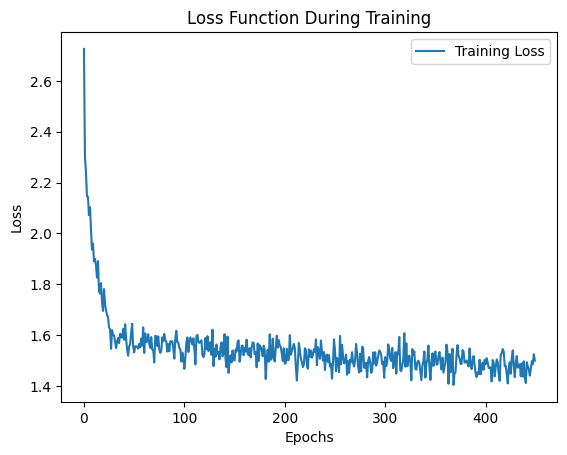

In [79]:
plt.plot(train_losses, label='Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Function During Training')
plt.legend()
png_path = os.path.join(output_path, 'train_loss_plot.png')

plt.savefig(png_path)
plt.show()


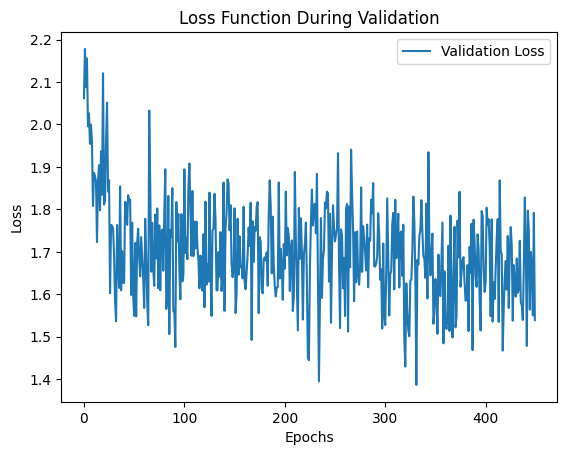

In [80]:
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Function During Validation')
png_path = os.path.join(output_path, 'val_loss_plot.png')

plt.savefig(png_path)
plt.legend()
plt.show()


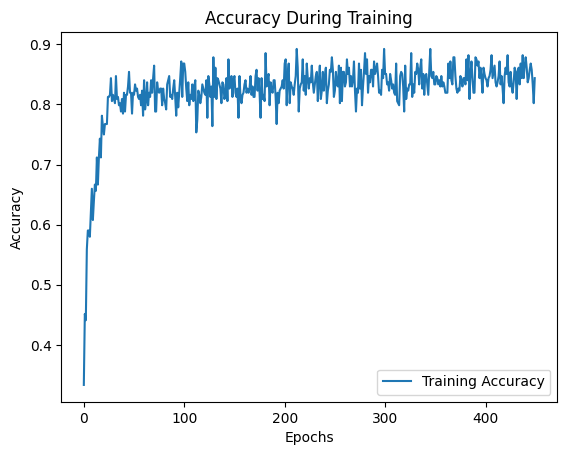

In [81]:
plt.plot(train_accuracies, label='Training Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Accuracy During Training')
plt.legend()
png_path = os.path.join(output_path, 'train_accuracy_plot.png')

plt.savefig(png_path)
plt.show()


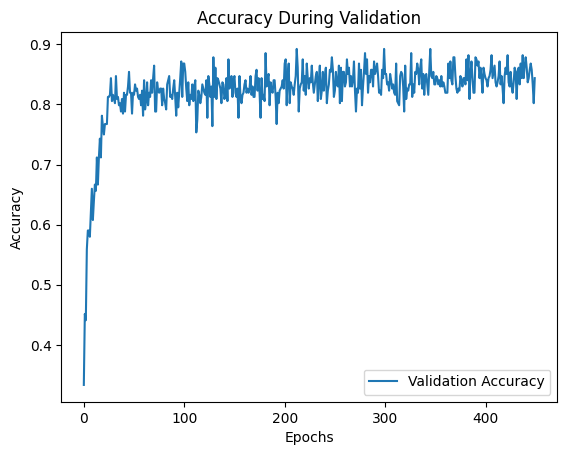

In [82]:
plt.plot(train_accuracies, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Accuracy During Validation')
plt.legend()
png_path = os.path.join(output_path, 'val_accuracy_plot.png')

plt.savefig(png_path)
plt.show()


In [83]:
def computeEmbeddings(loader, model, device, scaler=None):
    total_embeddings = np.zeros((len(loader)*loader.batch_size, 128))
    total_labels = np.zeros(len(loader)*loader.batch_size)
    model.eval()
    model.to(device)
    for idx, (anchor_img,label) in enumerate(tqdm_notebook(loader, desc="Embed", leave=False)):
        if torch.cuda.is_available():
            anchor_img = anchor_img.to(DEVICE)
        bsz = label.shape[0]
        if scaler:
            with torch.cuda.amp.autocast():
                embed,_ = model(anchor_img)
                total_embeddings[idx * bsz: (idx + 1) * bsz] = embed.detach().cpu().numpy()
                total_labels[idx * bsz: (idx + 1) * bsz] = label.detach().numpy()
        else:
            embed,_ = model(anchor_img)
            total_embeddings[idx * bsz: (idx + 1) * bsz] = embed.detach().cpu().numpy()
            total_labels[idx * bsz: (idx + 1) * bsz] = label.detach().numpy()

        del anchor_img,  label, embed
        torch.cuda.empty_cache()

    return np.float32(total_embeddings), total_labels.astype(int)

In [84]:
from sklearn.manifold import TSNE
scaler = torch.cuda.amp.GradScaler()

/tmp/ipython-input-84-398529997.py:2: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler()


Embed:   0%|          | 0/12 [00:00<?, ?it/s]

/tmp/ipython-input-83-2145050206.py:11: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
/tmp/ipython-input-86-950047214.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  plt.scatter(vis_x, vis_y, c=labels, cmap=plt.cm.get_cmap("jet", 10), marker='.')
DEBUG:matplotlib.colorbar:locator: <matplotlib.ticker.FixedLocator object at 0x7d48d1f10c50>


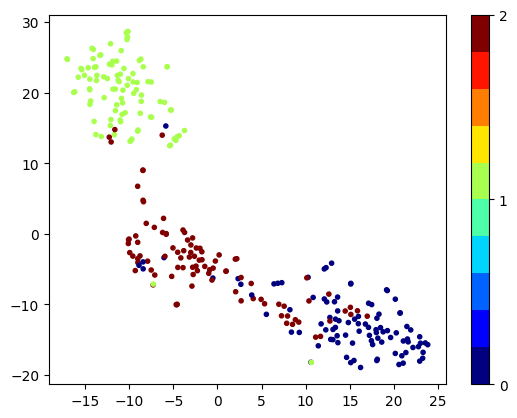

In [86]:


model_tsne= vgg19_bn_supcon(model)
checkpoint=torch.load(os.path.join(checkpoint_dir,"best_loss_feature_extraction_train_checkpoint_vgg.pth"))
model_tsne.load_state_dict(checkpoint["model_state_dict"])
embeddings,labels=computeEmbeddings(train_loader, model_tsne, DEVICE, scaler)
embeddings_tsne = TSNE(n_jobs=-1).fit_transform(embeddings)
vis_x = embeddings_tsne[:, 0]
vis_y = embeddings_tsne[:, 1]
plt.scatter(vis_x, vis_y, c=labels, cmap=plt.cm.get_cmap("jet", 10), marker='.')
plt.colorbar(ticks=range(10))
png_path = os.path.join(output_path, 'train_embed_plot.png')

plt.savefig(png_path)
plt.show()


Embed:   0%|          | 0/2 [00:00<?, ?it/s]

/tmp/ipython-input-83-2145050206.py:11: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
/tmp/ipython-input-87-3580650291.py:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  plt.scatter(vis_x, vis_y, c=labels, cmap=plt.cm.get_cmap("jet", 10), marker='.')
DEBUG:matplotlib.colorbar:locator: <matplotlib.ticker.FixedLocator object at 0x7d48d1f87510>


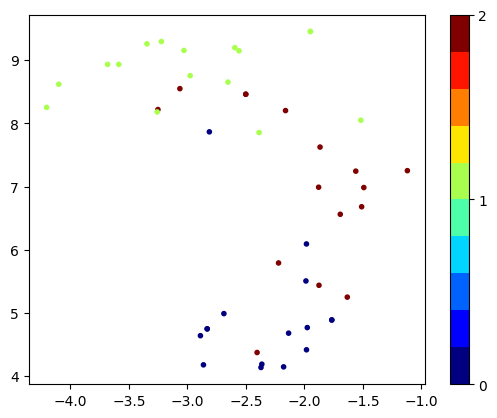

In [87]:



embeddings,labels=computeEmbeddings(val_loader, model_tsne, DEVICE, scaler)
embeddings_tsne = TSNE(n_jobs=-1).fit_transform(embeddings)
vis_x = embeddings_tsne[:, 0]
vis_y = embeddings_tsne[:, 1]
plt.scatter(vis_x, vis_y, c=labels, cmap=plt.cm.get_cmap("jet", 10), marker='.')
plt.colorbar(ticks=range(10))
png_path = os.path.join(output_path, 'val_embed_plot.png')

plt.savefig(png_path)
plt.show()


Embed:   0%|          | 0/12 [00:00<?, ?it/s]

/tmp/ipython-input-83-2145050206.py:11: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
/tmp/ipython-input-88-2749934877.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  plt.scatter(vis_x, vis_y, c=labels, cmap=plt.cm.get_cmap("jet", 10), marker='.')
DEBUG:matplotlib.colorbar:locator: <matplotlib.ticker.FixedLocator object at 0x7d4957fa7510>


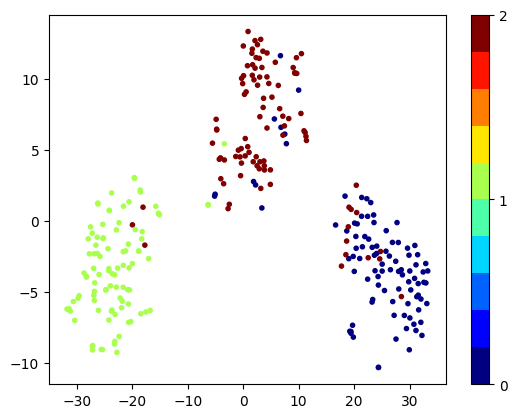

In [88]:

model_tsne= vgg19_bn_supcon(model)
checkpoint=torch.load(os.path.join(checkpoint_dir,"best_loss_feature_extraction_validation_checkpoint_vgg.pth"))
model_tsne.load_state_dict(checkpoint["model_state_dict"])
embeddings,labels=computeEmbeddings(train_loader, model_tsne, DEVICE, scaler)
embeddings_tsne = TSNE(n_jobs=-1).fit_transform(embeddings)
vis_x = embeddings_tsne[:, 0]
vis_y = embeddings_tsne[:, 1]
plt.scatter(vis_x, vis_y, c=labels, cmap=plt.cm.get_cmap("jet", 10), marker='.')
plt.colorbar(ticks=range(10))
png_path = os.path.join(output_path, 'train_embed_plot_best_val.png')

plt.savefig(png_path)
plt.show()


Embed:   0%|          | 0/2 [00:00<?, ?it/s]

/tmp/ipython-input-83-2145050206.py:11: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
/tmp/ipython-input-89-3066926380.py:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  plt.scatter(vis_x, vis_y, c=labels, cmap=plt.cm.get_cmap("jet", 10), marker='.')
DEBUG:matplotlib.colorbar:locator: <matplotlib.ticker.FixedLocator object at 0x7d4957e275d0>


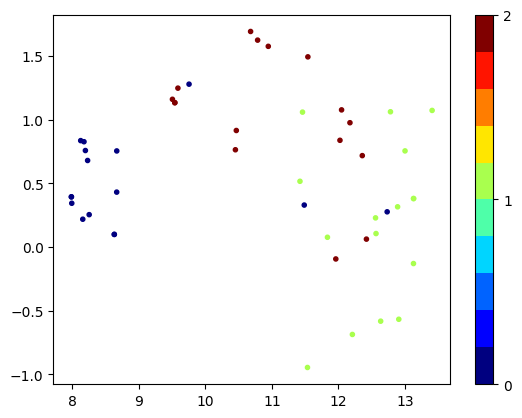

In [89]:

embeddings,labels=computeEmbeddings(val_loader, model_tsne, DEVICE, scaler)
embeddings_tsne = TSNE(n_jobs=-1).fit_transform(embeddings)
vis_x = embeddings_tsne[:, 0]
vis_y = embeddings_tsne[:, 1]
plt.scatter(vis_x, vis_y, c=labels, cmap=plt.cm.get_cmap("jet", 10), marker='.')
plt.colorbar(ticks=range(10))
png_path = os.path.join(output_path, 'val_embed_plot_best_val.png')

plt.savefig(png_path)
plt.show()


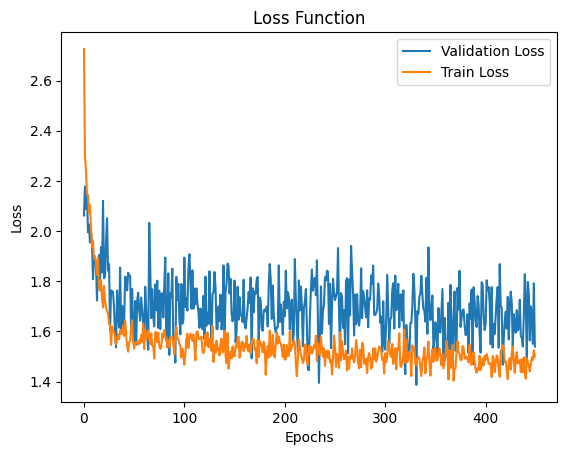

In [90]:
plt.plot(val_losses, label='Validation Loss')
plt.plot(train_losses, label='Train Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Function')
png_path = os.path.join(output_path, 'loss_plot.png')

plt.savefig(png_path)
plt.legend()
plt.show()


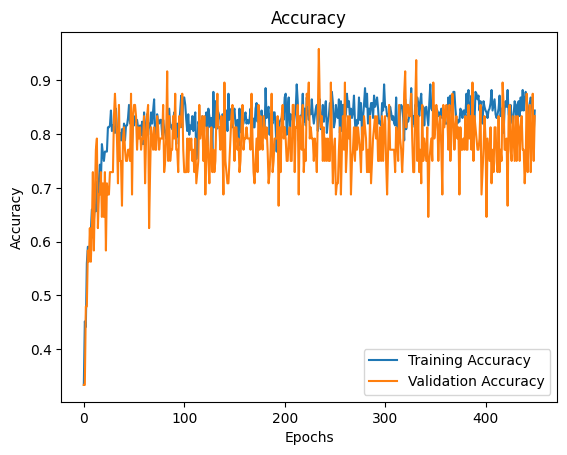

In [91]:
plt.plot(train_accuracies, label='Training Accuracy')
plt.plot(val_accuracies, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Accuracy')
plt.legend()
png_path = os.path.join(output_path, 'accuracy_plot.png')

plt.savefig(png_path)
plt.show()


In [92]:
logger.removeHandler(fh)